![Optimizing Videogame Sales Strategy](images/Optimizing-Videogame-Sales-Strategy%20(2).jpeg)

<div align=center>

# 1. <a id='toc1_'></a>[🎮 **Otimizando a Estratégia de Vendas de Videogames para a loja Ice** 👾](#toc0_)
Análise estratégica de dados históricos (1980-2016) para identificar drivers de sucesso e otimizar o planejamento de campanhas para 2017 na loja online "Ice".

![Python](https://img.shields.io/badge/Python-3.10+-blue?logo=python&logoColor=white)
![Pandas](https://img.shields.io/badge/Pandas-blueviolet?logo=pandas&logoColor=white)
![Seaborn](https://img.shields.io/badge/Seaborn-darkblue?logo=seaborn&logoColor=white)
![SciPy](https://img.shields.io/badge/SciPy-white?logo=scipy&logoColor=blue)

---

**Analista:** Eduardo Cornelsen<br>
**Data:** Dezembro de 2016 (Simulado) / Março de 2026 (Real)

[![LinkedIn](https://img.shields.io/badge/LinkedIn-0077B5?style=for-the-badge&logo=linkedin&logoColor=white)](https://www.linkedin.com/in/eduardo-cornelsen/)
[![Portfolio](https://img.shields.io/badge/Portfolio-100000?style=for-the-badge&logo=github&logoColor=white)](https://github.com/eduardocornelsen)
[![Project Repo](https://img.shields.io/badge/Project_Repo-100000?style=for-the-badge&logo=github&logoColor=white)](https://github.com/eduardocornelsen/videogames-revenue-analysis)

<div>

## 📋 **Índice do Projeto**

**Índice do Projeto**<a id='toc0_'></a>    
1. [🎮 **Otimizando a Estratégia de Vendas de Videogames para a loja Ice** 👾](#toc1_)    
2. [**⚙️ Preparação dos Dados e Feature Engineering**](#toc2_)    
3. [🎨 **Configurações de Gráficos e Estilo**](#toc3_)    
4. [**📜 Análise Exploratória (Panorama de Mercado)**](#toc4_)    
5. [👤 **Perfil do Usuário por Região (NA, EU, JP)**](#toc5_)    
6. [🧪 **Testes de Hipóteses**](#toc6_)    
7. [✅ **Conclusão Geral e Recomendações**](#toc7_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=true
	minLevel=1
	maxLevel=1
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## **Introdução: Planejando o Futuro da Loja "Ice"**

O ano de 2016 marcou um ponto de inflexão na indústria de videogames. A transição da 7ª Geração de consoles (PS3, Xbox 360, Wii) para a 8ª Geração (PS4, Xbox One, WiiU) consolidou novos líderes de mercado e mudou o comportamento de consumo dos jogadores. 

Para sobreviver e lucrar nesse cenário de transição, a loja online **Ice** precisa definir sua estratégia de compras e marketing para o ano fiscal de **2017**. 

Utilizando uma base de dados histórica (com registros que vão desde a década de 1980 até 2016), este projeto busca responder a perguntas cruciais para a sobrevivência do negócio:
* *Vale a pena continuar investindo em jogos de consoles da geração passada?*
* *O retorno financeiro está nos grandes jogos de Ação/Tiro ou em nichos específicos?*
* *As notas da crítica especializada realmente vendem jogos, ou a voz dos usuários é mais importante?*
* *O mercado Japonês consome os mesmos produtos que o mercado Ocidental?*

Ao longo deste notebook, transformaremos milhares de linhas de dados brutos em **inteligência competitiva**, utilizando técnicas de limpeza de dados, visualização avançada de informações e testes de hipóteses estatísticas para garantir que cada centavo da campanha de 2017 seja investido com precisão.

## 🧹 **Metodologia do Projeto**

Para garantir que os insights gerados sejam tecnicamente robustos e aplicáveis à campanha de 2017, o projeto foi estruturado em 5 etapas estratégicas:

1.  **Tratamento de Dados (Data Wrangling):**<br>Padronização de nomenclatura (*snake_case*), correção de tipagens (`float64`, `Int64`) e remoção de registros inconsistentes ("jogos fantasmas" e duplicatas). Aplicação de preenchimento inteligente e categórico em variáveis com alto volume de nulos (`rating` e `user_score`) para preservar o histórico de vendas sem distorcer cálculos estatísticos futuros.<br><br>
2.  **Engenharia de Features (Feature Engineering):**<br>Criação de **13 novas variáveis** focadas em inteligência de negócio. Transformamos dados brutos em métricas acionáveis, como: *Idade da Plataforma* (Ciclo de Vida), *Exclusividade do Ecossistema*, *Força da Franquia* (`is_long_running`) e *Nível de Concorrência* (`genre_saturation`).<br><br>
3.  **Corte Temporal e Modelagem do Cenário (2012-2016):**<br>Filtragem do dataset para ignorar tendências obsoletas (ruído histórico do PS2/Wii) e focar exclusivamente na dinâmica de mercado da **8ª Geração** (PS4/XOne), garantindo que as previsões reflitam o comportamento de consumo atual.<br><br>
4.  **Análise Exploratória e Estratégica (EDA & Storytelling):**<br>Construção de dashboards avançados (`Matplotlib` e `Seaborn`) para diagnosticar a eficiência de vendas por Plataforma, Gênero e Região (NA, EU, JP). Identificação visual de "Oceanos Azuis" (oportunidades) e mercados saturados, além da correlação de impacto do *Metacritic* nas vendas.<br><br>
5.  **Validação Estatística (Inferência):**<br>Aplicação rigorosa de testes de hipóteses para confirmar matematicamente as premissas de negócio. Utilização de testes de normalidade (**Shapiro-Wilk**) e homogeneidade (**Levene**), seguidos da aplicação de testes robustos a distribuições não-normais e outliers (**Mann-Whitney U**, **Welch's T-Test** e Correlação de **Spearman**).

---

# 2. <a id='toc2_'></a>[**⚙️ Preparação dos Dados e Feature Engineering**](#toc0_)

### 📥 **Importação de Bibliotecas e Dados**

#### 📚 Importação de Bibliotecas


In [1]:
# Importando as bibliotecas necessárias

print('👉 Passo 1: Importando Bibliotecas Essenciais... 📚')

# Manipulação de Dados e Numérica
import pandas as pd
import numpy as np

# Visualização de Dados
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import seaborn as sns

# Estatística e Testes de Hipótese
from scipy import stats as st
from scipy.stats import shapiro, levene, mannwhitneyu, ttest_ind

# Formatação no Jupyter Notebook
from IPython.display import display, HTML, Markdown

# Configurações de Avisos (Limpeza visual)
import warnings
warnings.filterwarnings('ignore') # Ignora avisos de atualizações futuras/depreciação

print('\n✅ Bibliotecas importadas com sucesso!')

👉 Passo 1: Importando Bibliotecas Essenciais... 📚

✅ Bibliotecas importadas com sucesso!


#### 📂 Carregamento do Dataset

In [2]:
# Importando os dados

print('👉 Passo 2: Importando DataFrames... 📂')

try:
    df = pd.read_csv('data/games.csv')
    print('\n✅ Dados carregados com sucesso.')
    print(f'    {len(df)} linhas importadas.')
except Exception as e:
    print(f'\n❌ Erro ao importar dados:\n    "{e}".\n\n➡️ Verifique o caminho do arquivo e tente novamente.')
    

👉 Passo 2: Importando DataFrames... 📂

✅ Dados carregados com sucesso.
    16715 linhas importadas.


> **Analisando as Informações Básicas do DataFrame ``df``**

In [3]:
# Imprimindo informações básicas do DataFrame

print('👉 Passo 3: Visualizando as informações gerais...\n')


# # Linhas e Colunas

# Formato do DataSet (Linhas X Colunas)
print(f'='*100,'\n➡️ FORMATO DO DATASET (Linhas X Colunas)\n','='*100)
num_linhas_df = df.shape[0]
print("# de Linhas Inicial:", num_linhas_df)
num_colunas_df = df.shape[1]
print("# de Colunas Inicial:", num_colunas_df)

print()

# Informações gerais 
print(f'='*100,'\n➡️ INFORMAÇÕES BÁSICAS:\n','='*100,'\n')
print(df.info())  


# 5 primeiras observações
print(f'\n\n','='*100,'\n➡️ 5 PRIMEIRAS OBSERVAÇÕES\n','='*100,'\n', df.head())   

👉 Passo 3: Visualizando as informações gerais...

➡️ FORMATO DO DATASET (Linhas X Colunas)
# de Linhas Inicial: 16715
# de Colunas Inicial: 11

➡️ INFORMAÇÕES BÁSICAS:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16713 non-null  object 
 1   Platform         16715 non-null  object 
 2   Year_of_Release  16446 non-null  float64
 3   Genre            16713 non-null  object 
 4   NA_sales         16715 non-null  float64
 5   EU_sales         16715 non-null  float64
 6   JP_sales         16715 non-null  float64
 7   Other_sales      16715 non-null  float64
 8   Critic_Score     8137 non-null   float64
 9   User_Score       10014 non-null  object 
 10  Rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB
None


➡️ 5 PRIMEIRAS OBSERVAÇÕES
                        Name Platform 

---

### 🧹 **Limpeza de Dados (Tipos, Nulos, Duplicatas)**

Após carregar o conjunto de dados, realizei uma inspeção inicial para entender a estrutura do DataFrame 'games.csv', tipos de dados e a presença de valores ausentes. Esta primeira análise é crucial para direcionar a etapa de pré-processamento.
<br><br>

> ##### **💡 ``Principais achados:``**
- **``Estrutura do Dataset:``**
  - O conjunto de dados é composto por 16.715 linhas (registros de jogos) e 11 colunas (características).
- **``Problema Crítico de Tipo de Dado:``**
  - A coluna `User_Score` foi identificada com o `Dtype: object` (texto), apesar de representar uma pontuação numérica.
  - As inspeções (`.head()`, `.tail()`) revelaram que isso é causado pela presença de valores não numéricos, como a string `'tbd'` (To Be Determined). Isso impede qualquer cálculo matemático ou análise estatística sobre esta coluna até que seja corrigida.
<br><br>

- **``Alto Volume de Dados Ausentes (`NaN`):``**
  - A integridade dos dados está significativamente comprometida pela falta de valores:

    - `Critic_Score`: É a coluna mais afetada, com 8.578 valores ausentes, o que representa 51,3% do total. Mais da metade dos jogos não possui pontuação da crítica.

    - `Rating:` Faltam 6.766 valores (40,5%), indicando que uma grande porção dos jogos não tem classificação etária (ESRB).

    - `User_Score`: Faltam 6.701 valores (40,1%), além dos valores 'tbd' que estão mascarados como não nulos.

    - `Year_of_Release`: Apresenta 269 valores ausentes.

    - `Name` e `Genre`: Possuem apenas 2 valores ausentes cada, sendo um volume insignificante.
<br><br>

- **``Formatos e Convenções:``**

  - Os nomes das colunas (ex: `Year_of_Release`, `NA_sales`) estão em formato CamelCase. Eles não seguem a convenção snake_case (minúsculas com _) do Python, o que será corrigido para facilitar a manipulação.

  - A coluna `Year_of_Release` está formatada como float64 (ex: 2006.0). Isso é um efeito colateral da presença de NaNs (que não são suportados pelo tipo int padrão do NumPy).
  <br><br>

> ##### **``Conclusão da Análise Inicial:``**

Os dados, em seu estado atual, **não estão prontos para análise**. A etapa de pré-processamento é obrigatória e deverá focar em:

- Padronizar os nomes das colunas.

- Corrigir a coluna `User_Score`, convertendo-a para um tipo numérico e tratando o valor 'tbd'.

- Desenvolver uma estratégia clara para lidar com o alto volume de dados ausentes, especialmente nas colunas de pontuação (`Critic_Score`, `User_Score`) e classificação (`Rating`).

- Tratar os poucos dados ausentes em `Name`, `Genre` e `Year_of_Release`.

<br>

> **``Resumo dos Problemas Identificados``**

| Categoria | Coluna(s) Afetada(s) | Problema Identificado | Ação Recomendada |
| :--- | :--- | :--- | :--- |
| ❌ **Nomes das Colunas** | Todas | CamelCase (ex: `NA_sales`) | **Renomear** para `snake_case` (ex: `na_sales`). |
| ❌ **Tipo Incorreto** | `User_Score` | Contém texto `'tbd'` e números. | **Converter** `'tbd'` para `NaN` e a coluna para `float`. |
| ❌ **Dados Ausentes (Baixo Volume)** | `Name`, `Genre`, **`Year_of_Release`** | Poucos valores nulos (2 em nome/gênero, 269 em ano). | **Remover (dropna)**. Sem nome ou ano, o dado é inútil para tendências. |
| ❌ **Tipo Incorreto** | `Year_of_Release` | Está como `float` (2006.0). | Após remover os nulos, **converter** para número inteiro (`int`). |
| ❌ **Dados Ausentes (Alto Volume)** | `Rating` | 40.5% nulos. | **Preencher** com a categoria `'Unknown'` para não perder os dados de vendas. |
| ❌ **Dados Ausentes (Alto Volume)** | `Critic_Score`, `User_Score` | 40% a 51% nulos. | **Manter como `NaN`**. Não prencherei com média/mediana, pois isso distorceria a análise de correlação. |

---

> #### ✅ **Início das Correções**

##### **✅ Correção 1: ``PADRONIZAÇÃO`` dos Nomes das colunas para ``minúsculas`` (snake_case)**

In [4]:
# Convertendo para snake_case

print('--- PREPARAÇÃO DOS DADOS --- ')

print('\n👉 Correção 1:')
print('    ✅ PADRONIZANDO nomes de colunas para "snake_case"...\n')
print(f'\nColunas ANTES:\n{df.columns}\n\n')
df = df.rename(columns=str.lower)
# ou df.columns = df.columns.str.lower()

print('Colunas DEPOIS:\n', df.columns)
print('\n✅ SUCESSO!')

--- PREPARAÇÃO DOS DADOS --- 

👉 Correção 1:
    ✅ PADRONIZANDO nomes de colunas para "snake_case"...


Colunas ANTES:
Index(['Name', 'Platform', 'Year_of_Release', 'Genre', 'NA_sales', 'EU_sales',
       'JP_sales', 'Other_sales', 'Critic_Score', 'User_Score', 'Rating'],
      dtype='object')


Colunas DEPOIS:
 Index(['name', 'platform', 'year_of_release', 'genre', 'na_sales', 'eu_sales',
       'jp_sales', 'other_sales', 'critic_score', 'user_score', 'rating'],
      dtype='object')

✅ SUCESSO!


---

##### **✅ Correção 2: ``TIPOS DE DADOS``**

> ⚠️ **``Plano de Alteração de TIPO DE DADOS:``**

| Status | Coluna (minúscula) | Tipo Atual | Tipo Desejado | Método / Ação | Exemplo Original | Exemplo Alvo |
| :---: | ---: | :--- | :--- | :--- | :---: | :---: |
| ✅ | `name` | `object` | `object` | Manter | `'Wii Sports'` | `'Wii Sports'` |
| ✅ | `platform` | `object` | `object` | Manter | `'Wii'` | `'Wii'` |
| ***❌*** | ***`year_of_release`*** | ***`float64`*** | ***`'Int64'`*** | ***⚠️ `.astype('Int64')`*** | ***`2006.0`*** | ***`2006`*** |
| ✅ | `genre` | `object` | `object` | Manter | `'Sports'` | `'Sports'` |
| ✅ | `na_sales` | `float64` | `float64` | Manter | `41.36` | `41.36` |
| ✅ | `eu_sales` | `float64` | `float64` | Manter | `28.96` | `28.96` |
| ✅ | `jp_sales` | `float64` | `float64` | Manter | `3.77` | `3.77` |
| ✅ | `other_sales` | `float64` | `float64` | Manter | `8.45` | `8.45` |
| ✅ | `critic_score` | `float64` | `float64` | Manter | `76.0` | `76.0` |
| ***❌*** | ***`user_score`*** | ***`object`*** | ***`'float64'`*** | ***⚠️ `pd.to_numeric(errors='coerce')`*** | ***`'tbd'`, `'8.3'`*** | ***`NaN`, `8.3`*** |
| ✅ | `rating` | `object` | `object` | Manter | `'E'` | `'E'` |

<br>


> 👉 **``Resumo:``**

> ❌ **``Tipo de Dados com Problemas``**:
 
Temos duas colunas que precisam de correção:
- **`user_score`** é o nosso problema crítico (pois é *`object`*)
- **`year_of_release`** é um ajuste de formatação (de *`float`* para *`Int`*).<br><br>
 
> ✅ **``Tipo de Dados Corretos``**:
 
Todas as outras colunas já estão com o tipo de dado correto para a análise:
- (`*_sales`) e `critic_score` como numéricos decimais
- Nomes/Categorias como *`object`*.

> 🛠️ **Sobre o Valor `'tbd'` (to be determined) em `user_score`**
> 
> Durante a exploração inicial, notei que a coluna `user_score` era do tipo `object` (texto). A principal causa disso é a presença do valor `'tbd'`.
>
> * **O que 'tbd' significa:** É uma abreviação para **"To Be Determined"** (A Ser Determinado).<br><br>
> * **Interpretação no Contexto:** Em sites de avaliação (como o Metacritic), isso indica que o jogo **não recebeu um número suficiente de avaliações** de usuários para que uma pontuação média válida fosse calculada.<br><br>
> * **Impacto na Análise:** Um valor `'tbd'` não é uma nota `0`. Ele é, funcionalmente, um **valor ausente** ou **desconhecido**. A sua presença como texto "contamina" a coluna, impedindo cálculos estatísticos.<br><br>
> * **Ação de Limpeza:** A abordagem correta é tratar `'tbd'` como um valor nulo (`NaN`), e não como `0`. Para isso, usaremos a função `pd.to_numeric()` com o parâmetro `errors='coerce'`. Isso irá converter automaticamente todos os valores `'tbd'` (e outros textos) em `NaN`, permitindo que a coluna seja convertida para o tipo numérico `float64`.

In [5]:
# Tratando TIPOS DE DADOS (user_score & year_of_release)

print('--- PREPARAÇÃO DOS DADOS --- ')

print('\n👉 Correção 2:')
print('    ✅ Convertendo TIPOS DE DADOS...\n')

# Salvando tipo de dados antes para verificação
user_antes = df['user_score'].dtype
year_antes = df['year_of_release'].dtype

#-------------------------------------------
# --- 1. Correção de 'tbd' em user_score ---
#-------------------------------------------
# 'object' -> 'float64' (pois tem decimais)

print("\nCorrigindo valor 'tbd' em 'user_score' e convertendo para 'float'...")
df['user_score'] = pd.to_numeric(df['user_score'], errors='coerce') # 'coerce' transforma 'tbd' em NaN e converte o resto para float
print('     ✅ SUCESSO')


#------------------------------------
# --- Correção de year_of_release ---
#------------------------------------
# 'float64' -> 'Int64' (inteiro que aceita nulos)
print("\nCorrigindo 'year_of_release' e convertendo para 'Int64'...")
df['year_of_release'] = df['year_of_release'].astype('Int64')
print('     ✅ SUCESSO\n')


# --- Verificando as alterações ---
print("\n--- Verificação ---\n")

print(f"- 'user_score' ANTES:      {user_antes}")
print(f"- 'user_score' DEPOIS:      {df['user_score'].dtype}")

print('\n--- Tipos de dados ANTES: ---\n')
print(f"- 'year_of_release' ANTES: {year_antes}\n")

print('\n--- Tipos de dados DEPOIS: ---\n')
print(f"- year_of_release: {df['year_of_release'].dtype}\n")
print('\n✅ TIPOS DE DADOS corirgidos com SUCESSO!\n')

--- PREPARAÇÃO DOS DADOS --- 

👉 Correção 2:
    ✅ Convertendo TIPOS DE DADOS...


Corrigindo valor 'tbd' em 'user_score' e convertendo para 'float'...
     ✅ SUCESSO

Corrigindo 'year_of_release' e convertendo para 'Int64'...
     ✅ SUCESSO


--- Verificação ---

- 'user_score' ANTES:      object
- 'user_score' DEPOIS:      float64

--- Tipos de dados ANTES: ---

- 'year_of_release' ANTES: float64


--- Tipos de dados DEPOIS: ---

- year_of_release: Int64


✅ TIPOS DE DADOS corirgidos com SUCESSO!



---

##### **✅ Correção 3: ``AUSENTES E NULOS``**

In [6]:
# Visualizando proporção de valores ausentes
print('Porcentagem de valores ausentes (%)\n')
print('Variável','      Percentual (%)')
print((df.isnull().sum() / df.shape[0] *100).round(2))

Porcentagem de valores ausentes (%)

Variável       Percentual (%)
name                0.01
platform            0.00
year_of_release     1.61
genre               0.01
na_sales            0.00
eu_sales            0.00
jp_sales            0.00
other_sales         0.00
critic_score       51.32
user_score         54.59
rating             40.48
dtype: float64


> ⚠️ **``Plano de Alteração``:**

O conjunto de dados possui **16.715** entradas no total. Desse total, existem muitos valores ausentes, que precisaremos tratar quando necessário para seguir com as análises, de acordo com o plano a seguir:<br>*(obs: na tabela abaixo, `tbd` já foi convertido para ``NaN``)*

| Coluna | Valores<br>Ausentes<br>(Contagem) | Valores<br>Ausentes<br>(%) | Ação |
| ---: | :---: | :---: | :---: |
| `name` | 2 | ~0.01% | ✂️ **Remover Linhas** |
| `genre` | 2 | ~0.01% | ✂️ **Remover Linhas** |
| `year_of_release` | 269 | 1.6% | ✂️ **Remover Linhas** |
| `rating` | 6.766 | 40.5% | 🆕 **Preencher com 'Unknown'** |
| `critic_score` | 8.578 | 51.3% | 🚫 **Manter como Ausente (NaN)** |
| `user_score` | 9.125 | 54.6% | 🚫 **Manter como Ausente (NaN)** |
| `platform` | 0 | 0.0% | ✅ Nenhuma |
| `na_sales` | 0 | 0.0% | ✅ Nenhuma |
| `eu_sales` | 0 | 0.0% | ✅ Nenhuma |
| `jp_sales` | 0 | 0.0% | ✅ Nenhuma |
| `other_sales` | 0 | 0.0% | ✅ Nenhuma |

<br>

> 👉 **``Justificativa``**

> 1.  **`name`, `genre` e `year_of_release`**
>      * **Ação:** ``✂️ Remover Linhas``
>      * **Justificativa:**
>        * O volume de dados faltantes é **insignificante** em `name` e `genre` (apenas 2 linhas).
>        * `year_of_release` possui 269 linhas faltantes.
>        * A remoção foi a ação mais segura, pois um registro sem nome, gênero ou ano de lançamento é inútil para a análise de vendas ou *Machine Learning*.<br><br>

> 2.  **`rating`**
>       * **Ação:** ``🆕 Preencher com 'Unknown'``
>       * **Justificativa:**
>         * O volume de dados ausentes é muito alto (**40.5%**).
>         * O valor ausente em `'rating'` é contextual (ex: lançado antes do sistema **ESRB**).
>         * Preenchi os `NaNs` com a nova categoria **`'Unknown'`** para preservar a informação e permitir que a coluna seja utilizada no modelo.<br><br>

> 3.  **Scores (`critic_score`, `user_score`)**
>       * **Ação:** 🚫 ``Manter como NaN``
>       * **Justificativa:**
>         * Estas são métricas **críticas** e mais da metade dos *scores* estão ausentes.
>         * Preencher esses valores com médias ou zeros **distorceria** os testes de hipóteses e a correlação.
>         * A opção mais correta foi **manter os valores como `NaN`**, permitindo que as funções estatísticas do Python (`Pandas`/`Scipy`) os ignorem automaticamente nos cálculos de agregação.

In [7]:
# Tratando Valores Ausentes

print('--- PREPARAÇÃO DOS DADOS --- ')

print('\n👉 Correção 3:')
print('    ✅  Tratando valores ausentes...\n')

      
# Checando o total de linhas antes de começar
linhas_antes = len(df)
print(f"\nTotal de linhas (antes da limpeza): {linhas_antes}")

# ----------------------------------------------------
# ETAPA 1: Tratar dados essenciais ausentes:
# 'name' 'genre' e 'year_of_release'
# ----------------------------------------------------
# Justificativa: 
# 1. 'name' e 'genre' (2 linhas): Volume insignificante.
# 2. 'year_of_release' (269 linhas): Representa ~1.6% dos dados. Sem o ano, 
#    não é possível fazer análise de tendências ou filtrar o período relevante.

print("\n --- Tratando dados essenciais ('name', 'genre', 'year_of_release')... ---")
print(f"Total de linhas (antes): {len(df)}")

# Remove linhas onde qualquer uma dessas colunas seja NaN
df = df.dropna(subset=['name', 'genre', 'year_of_release'])

# CONVERSÃO DE TIPO: Agora que não há NaNs no ano, podemos converter para Inteiro
df['year_of_release'] = df['year_of_release'].astype('int64')

print(f"Total de linhas (após limpeza): {len(df)}")
print('    ✅ SUCESSO: Linhas removidas e Ano convertido para Inteiro.')


# ----------------------------------------------------
# ETAPA 2: Tratar 'rating' (40.5% ausentes)
# ----------------------------------------------------
# Abordagem: Preencher NaN com uma nova categoria: 'Unknown'.
# Justificativa: Como discutido, 'NaN' aqui tem um significado (ex: jogos
#                lançados antes do sistema ESRB). Transformei em
#                uma categoria analisável.

print("\n --- Tratando 'rating'... ---")
# antes
print(f"Valores ausentes em 'rating' (antes): {df['rating'].isna().sum()}")
# executando 
df['rating'] = df['rating'].fillna('Unknown')
# depois
print(f"Valores ausentes em 'rating' (depois): {df['rating'].isna().sum()}")
print('    ✅ SUCESSO: Valores ausentes preenchidos com "Unknown"')


# ----------------------------------------------------
# ETAPA 4: Tratar 'critic_score', 'user_score'
# ----------------------------------------------------
# Abordagem: Deixar como ausentes (NaN / <NA>).
# Justificativa: Preencher pontuações (scores) com uma média ou 0 distorceria
#                totalmente a análise. O mais correto é manter como "ausentes"
#                e excluí-los dos cálculos de média (o que o pandas já faz por padrão).
print("\n --- Outros valores ausentes... ---")
print("'critic_score' e 'user_score' mantidos com valores ausentes intencionalmente.")

linhas_depois = len(df)

print(f"\nTotal de linhas (antes da limpeza): {linhas_antes}")
print(f"\nTotal de linhas (depois da limpeza): {linhas_depois}")
print(f"{linhas_antes-linhas_depois} linhas removidas com sucesso.")
print(df.size)

--- PREPARAÇÃO DOS DADOS --- 

👉 Correção 3:
    ✅  Tratando valores ausentes...


Total de linhas (antes da limpeza): 16715

 --- Tratando dados essenciais ('name', 'genre', 'year_of_release')... ---
Total de linhas (antes): 16715
Total de linhas (após limpeza): 16444
    ✅ SUCESSO: Linhas removidas e Ano convertido para Inteiro.

 --- Tratando 'rating'... ---
Valores ausentes em 'rating' (antes): 6676
Valores ausentes em 'rating' (depois): 0
    ✅ SUCESSO: Valores ausentes preenchidos com "Unknown"

 --- Outros valores ausentes... ---
'critic_score' e 'user_score' mantidos com valores ausentes intencionalmente.

Total de linhas (antes da limpeza): 16715

Total de linhas (depois da limpeza): 16444
271 linhas removidas com sucesso.
180884


---

##### **✅ Correção 4: ``DUPLICATAS``**

> Realizei duas verificações distintas:
>
> 1.  **Duplicatas Explícitas:** A busca por linhas onde *todas* as colunas são idênticas.
> 2.  **Duplicatas Lógicas:** A busca por linhas onde a "chave primária" do nosso conjunto de dados se repete. Para este projeto, definimos a chave como a combinação de `name` e `platform`, pois um jogo não deve aparecer mais de uma vez na mesma plataforma.<br><br>
>
> 👉 **``Resultados da Verificação``**
>
> * **Duplicatas Explícitas:** 0 encontradas.
> * **Duplicatas Lógicas (`name` + `platform`):** **4 encontradas.**<br><br>
>
> ⚠️ **``Ação Tomada``**
> 
> - As **4 duplicatas lógicas** foram removidas do conjunto de dados, mantendo apenas a primeira ocorrência de cada jogo (`keep='first'`).
> 
> - Esta remoção garante que cada jogo seja contado apenas uma vez por plataforma, levando a uma análise estatística mais precisa e confiável.

In [8]:
# Tratando valores duplicados

print('--- PREPARAÇÃO DOS DADOS --- ')

print('\n👉 Passo 4:')
print('    ✅  Verificando valores duplicados...\n')

# Verificando linhas onde todas as 11 linhas são idênticas
duplicatas_explícitas = df.duplicated().sum()
print(f'Número de duplicatas explícitas (linha inteira): {duplicatas_explícitas}')

# Verificando linhas onde a combinação 'name' e 'platform' já apareceu antes
duplicatas_logicas = df.duplicated(subset=['name', 'platform']).sum()
print(f'Número de duplicatas lógicas (mesmo jogo, mesma plataforma): {duplicatas_logicas}')

--- PREPARAÇÃO DOS DADOS --- 

👉 Passo 4:
    ✅  Verificando valores duplicados...

Número de duplicatas explícitas (linha inteira): 0
Número de duplicatas lógicas (mesmo jogo, mesma plataforma): 3


In [9]:
# Tratando as duplicatas lógicas

print('--- PREPARAÇÃO DOS DADOS --- ')

print('\n👉 Passo 4.2:')
print(f'    ✅  Removendo as {duplicatas_logicas} duplicatas lógicas...\n')


print(f"\nNúmero de duplicatas lógicas ANTES da remoção: {duplicatas_logicas}")

# 2. Remover as duplicatas, mantendo apenas a primeira ocorrência
if duplicatas_logicas > 0:
    df.drop_duplicates(subset=['name', 'platform'], keep='first', inplace=True)
        # 'reset_index' é uma boa prática após remover linhas
    df.reset_index(drop=True, inplace=True) 
    print(f"\n✅ As {duplicatas_logicas} duplicatas lógicas foram removidas com sucesso.")
else:
    print("Nenhuma duplicata lógica encontrada para remover.")

# 3. VERIFICAÇÃO FINAL
# O resultado agora deve ser 0.
duplicatas_logicas_depois = df.duplicated(subset=['name', 'platform']).sum()
print(f"\nNúmero de duplicatas lógicas APÓS a remoção: {duplicatas_logicas_depois}")

--- PREPARAÇÃO DOS DADOS --- 

👉 Passo 4.2:
    ✅  Removendo as 3 duplicatas lógicas...


Número de duplicatas lógicas ANTES da remoção: 3

✅ As 3 duplicatas lógicas foram removidas com sucesso.

Número de duplicatas lógicas APÓS a remoção: 0


---

##### **✅ Correção 5: ``Dado "Fantasma"``**

Ao plotar os dados de venda para `DS` (Nintendo DS) nas próximas visualizações, verifiquei que o primeiro jogo vendido para o `DS` foi em `1985`.

Isso é fatualmente impossível, pois o Nintendo DS foi lançado ao final de 2004.

Assim, essa observação é um dado fantasma, e irei excluir para não distorcer nossas análises e visualizações.<br><br>


> **``Visualizando as 15 primeiras linhas da coluna 'DS'`` (antes de qualquer correção):**

| `year_of_release` | `total_sales` |
| :---: | :---: |
| **1985** | **0.02** |
| 1994 | NaN |
| 1995 | NaN |
| 1996 | NaN |
| 1997 | NaN |
| 1998 | NaN |
| 1999 | NaN |
| 2000 | NaN |
| 2001 | NaN |
| 2002 | NaN |
| 2003 | NaN |
| 2004 | 17.27 |
| 2005 | 130.14 |
| 2006 | 119.81 |
| 2007 | 146.94 |

Name: DS, dtype: float64

> ⚠️ **``Observação sobre o Ano de Lançamento das Plataformas``**

Esse erro acima mostra que é importante sabermos a **idade real** de cada plataforma.

Antes de seguir com a correção da linha fantasma, vou verificar o ano de lançamento de cada plataforma.

Isso será útil também para calcularmos a idade da plataforma no momento do lançamento do jogo, na etapa 5. da ``'Engenharia de Features'``, criando a nova coluna ``'platform_age'``

Para isso, vou fazer a verificação abaixo:

In [10]:
print('''=============================================
VALIDANDO O ANO DE LANÇAMENTO DAS PLATAFORMAS
=============================================
''')

# Preciso testar se os dados estão corretos,
# comparando o valor mínimo para 'year_of_release' que temos em nosso df
# com o ano real de lançamento das plataformas


# Comparação:
# Comparar valor mínimo de 'year_of_release' com o ano real em que a plataforma foi lançada

# Conclusão:
# A partir dessa comparação abaixo, percebi INCONSISTÊNCIA com as **datas reais** em que as plataformas foram lançadas.


# -----------------------------------------------------------------------------
# Testando o ano em que a plataforma foi lançada X O ano mínimo em nossos dados
# -----------------------------------------------------------------------------

# Verificando todas as plataformas
print('Todas as plataformas:\n',df['platform'].unique())
print()

# Criar um dicionário COMPLETO com o ano de lançamento real das plataformas

ano_lancamento_real = {
    # --- Geração 8 ---
    'PS4': 2013, 'XOne': 2013, 'WiiU': 2012, '3DS': 2011, 'PSV': 2011,
    
    # --- Geração 7 ---
    'PS3': 2006, 'Wii': 2006, 'X360': 2005, 'DS': 2004, 'PSP': 2004,
    
    # --- Geração 6 ---
    'XB': 2001,   # Xbox Original
    'GC': 2001,   # GameCube
    'GBA': 2001,  # Game Boy Advance
    'PS2': 2000,  # PlayStation 2
    'DC': 1998,   # Dreamcast
    'WS': 1999,   # WonderSwan
    
    # --- Geração 5 ---
    'N64': 1996,  # Nintendo 64
    'PS': 1994,   # PlayStation Original (PS1)
    'SAT': 1994,  # Sega Saturn
    '3DO': 1993,  # 3DO
    'PCFX': 1994, # PC-FX
    
    # --- Geração 4 ---
    'SNES': 1990, # Super Nintendo
    'SCD': 1991,  # Sega CD
    'NG': 1990,   # Neo Geo
    'GG': 1990,   # Game Gear
    'GEN': 1988,  # Genesis / Mega Drive
    'GB': 1989,   # Game Boy Original
    'TG16': 1987, # TurboGrafx-16 / PC Engine
    
    # --- Geração 3 e Retro ---
    'NES': 1983,  # Famicom/NES (lançado em 83 no Japão, 85 nos EUA)
    '2600': 1977, # Atari 2600
    
    # --- Perenes ---
    'PC': 1980    # Data simbólica para início dos jogos de PC modernos (DOS)
}


# Calcular o ano de lançamento baseado nos DADOS (Mínimo)
ano_lancamento_dados = df.groupby('platform')['year_of_release'].min().sort_values() # agrupar por plataforma e pegar o ano de lançamento mínimo para cada uma

# Comparar com o DICIONÁRIO MANUAL -> ano_lancamento_real
print("-" * 53)
print(f"{'Plataforma':<10} | {'Ano (Dados)':<12} | {'Ano (Real)':<12} | {'Diferença'}") # ajustando o alinhamento da saida
print("-" * 53)

# Preenchendo os dados e realizando os testes com loop for
# plataforma recebe CHAVE (ex: PS4)
# ano_real recebe VALOR (ex: 2013)
# .items() permite pegar chave e valor ao mesmo tempo, sendo nessa ordem: (ÍNDICE, VALOR)

for platforma, ano_real in ano_lancamento_real.items():     # Inicia um loop que percorre cada item do dicionário 'ano_lancamento_real'
    if platforma in ano_lancamento_dados.index:             # Verifica se a plataforma da lista REAL existe na lista de DADOS que veio do DataFrame 
        ano_dados = int(ano_lancamento_dados[platforma])    # Extrai o ano de lançamento dos DADOS garantindo que seja inteiro
        diff = ano_dados - ano_real                         # Calcula a diferença do ano min. nos DADOS - ano REAL 
        status = "✅ Igual" if diff == 0 else f"❌ Difere ({diff} anos)" # Cria a coluna condicional para exibir o resultado
        print(f"{platforma:<10} | {ano_dados:<12} | {ano_real:<12} | {status}") # Ajusta alinhamento da saida

VALIDANDO O ANO DE LANÇAMENTO DAS PLATAFORMAS

Todas as plataformas:
 ['Wii' 'NES' 'GB' 'DS' 'X360' 'PS3' 'PS2' 'SNES' 'GBA' 'PS4' '3DS' 'N64'
 'PS' 'XB' 'PC' '2600' 'PSP' 'XOne' 'WiiU' 'GC' 'GEN' 'DC' 'PSV' 'SAT'
 'SCD' 'WS' 'NG' 'TG16' '3DO' 'GG' 'PCFX']

-----------------------------------------------------
Plataforma | Ano (Dados)  | Ano (Real)   | Diferença
-----------------------------------------------------
PS4        | 2013         | 2013         | ✅ Igual
XOne       | 2013         | 2013         | ✅ Igual
WiiU       | 2012         | 2012         | ✅ Igual
3DS        | 2011         | 2011         | ✅ Igual
PSV        | 2011         | 2011         | ✅ Igual
PS3        | 2006         | 2006         | ✅ Igual
Wii        | 2006         | 2006         | ✅ Igual
X360       | 2005         | 2005         | ✅ Igual
DS         | 1985         | 2004         | ❌ Difere (-19 anos)
PSP        | 2004         | 2004         | ✅ Igual
XB         | 2000         | 2001         | ❌ Difere (-1 ano

> **``Analisando a tabela``** 
- Pela tabela acima, podemos perceber que o **ERRO CRÍTICO** é para o `DS` (1985 -> 2004), por isso vou corrigir abaixo.

- `PC` está errado por conta do corte nos dados em nosso df, que possuí dados a partir de 1985 apenas.

- Diferenças de 1 a 3 Anos (GBA, XB, 2600, etc.) são normais, explicadas por diferentes datas em lançamentos regionais, como Japão, EUA e Europa.

- Erros de Dados "Fantasmas" (TG16, 3DO)
  - TG16 (TurboGrafx-16): Lançado em 1987. O dataset diz 1995. Isso significa que o dataset perdeu os primeiros 8 anos de jogos desse console e só registou os últimos.

> **``Conclusão``**:

- Não podemos confiar no ``min()`` para estimar o **ano da plataforma**. 

- Por isso, vou criar na seção de 'Engenharia de Features' a coluna `platform_year` e `platform_age`, que conterão o ano de lançamento do console e a idade do console em anos, respectivamente.

<br>

> **``Limpando a Linha Fantasma``** (``DS``)

- Agora, podemos seguir com a limpeza crítica da linha fantasma:

In [11]:
# --------------------------------------------------
# --- LIMPANDO DADO FANTASMA (DS) <- linha 15952 ---
# --------------------------------------------------

# Para essa limpeza, vou encontrar e deletar essa linha fantasma
# Quero qualquer linha que seja menor que 2004 (ano de lançamento do Ninetendo DS) 

linha_fantasma = df[(df['platform'] == 'DS') & (df['year_of_release'] < 2004)]
indice_fantasma = linha_fantasma.index # extraindo o índice da coluna para remoção

# Salvando o ano mínimo antes da mudança
ds_data = df[df['platform'] == 'DS']
primeiro_ano_ds_antes = ds_data['year_of_release'].min()


# Verificar a linha fantasma e imprimí-la (deve ser 1 linha)
if not indice_fantasma.empty:
    print('='*80)
    print(f"Encontrada(s) {len(indice_fantasma)} linha(s) 'fantasma' com os seguintes índices: {indice_fantasma.to_list()}")
    print('='*80)
    print('\n Imprimindo a linha fantasma: \n','-'*80,'\n', linha_fantasma,'\n')
    
    # Remover a linha do DataFrame principal
    df.drop(indice_fantasma, inplace=True)

    print('-'*80)
    print("--- ✅ Linha 'fantasma' removida com sucesso. ---")
    print('-'*80)

else:
    print("Nenhuma linha 'fantasma' encontrada (talvez já tenha sido removida?).")


# Encontrando o ano de lançamento mínimo para o DS (deve mostrar 2004 após remoção, o ano de lançamento correto)
ds_data = df[df['platform'] == 'DS']
primeiro_ano_ds = ds_data['year_of_release'].min()
print(f"""✅ VERIFICAÇÃO:
- O primeiro ano do 'DS' ANTES da remoção é: {primeiro_ano_ds_antes}
- O primeiro ano do 'DS' APÓS a remoção é:   {primeiro_ano_ds}""")

Encontrada(s) 1 linha(s) 'fantasma' com os seguintes índices: [15702]

 Imprimindo a linha fantasma: 
 -------------------------------------------------------------------------------- 
                                       name platform  year_of_release   genre  \
15702  Strongest Tokyo University Shogi DS       DS             1985  Action   

       na_sales  eu_sales  jp_sales  other_sales  critic_score  user_score  \
15702       0.0       0.0      0.02          0.0           NaN         NaN   

        rating  
15702  Unknown   

--------------------------------------------------------------------------------
--- ✅ Linha 'fantasma' removida com sucesso. ---
--------------------------------------------------------------------------------
✅ VERIFICAÇÃO:
- O primeiro ano do 'DS' ANTES da remoção é: 1985
- O primeiro ano do 'DS' APÓS a remoção é:   2004


##### **✅ Correção 6: Coluna ``rating`` (Classificação Etária ESRB)**

Analisei a distribuição dos valores na coluna `rating` e identifiquei categorias obsoletas (`K-A`, `RP`, `EC`, `AO`) que representam uma fração insignificante dos dados ou são apenas nomenclaturas antigas para categorias atuais.

Para garantir que a análise visual e o modelo preditivo não sejam prejudicados por ruído, **padronizei** essas categorias em grupos principais.

In [12]:
# Verificação Inicial
print('-'*80)
print("--- Contagem de Ratings (Antes da Limpeza) ---")
print('-'*80)
print(df['rating'].value_counts())

# Correção e Agrupamento

# 'EC' (Early Childhood) é nicho extremo. Agrupar em 'E' (Livre).
df['rating'] = df['rating'].replace('EC', 'E')

# 'K-A' (Kids to Adults) é o nome antigo de 'E' (Everyone).
df['rating'] = df['rating'].replace('K-A', 'E')

# 'RP' (Rating Pending) é provisório e é melhor tratar como 'Unknown'
df['rating'] = df['rating'].replace('RP', 'Unknown')

# 'AO' (Adults Only) é raríssimo (apenas 1 caso). Agrupar em 'M' (Mature).
df['rating'] = df['rating'].replace('AO', 'M')

print()

# Verificação Final
print('-'*80)
print("--- Contagem de Ratings (Após Limpeza) ---")
print('-'*80)
print(df['rating'].value_counts())

--------------------------------------------------------------------------------
--- Contagem de Ratings (Antes da Limpeza) ---
--------------------------------------------------------------------------------
rating
Unknown    6675
E          3920
T          2903
M          1536
E10+       1393
EC            8
K-A           3
AO            1
RP            1
Name: count, dtype: int64

--------------------------------------------------------------------------------
--- Contagem de Ratings (Após Limpeza) ---
--------------------------------------------------------------------------------
rating
Unknown    6676
E          3931
T          2903
M          1537
E10+       1393
Name: count, dtype: int64


> 💡 **``Justificativa``:**
>
>   * **Consistência Histórica:** Transformar `K-A` em `E` corrige a mudança de nome que ocorreu em 1998, unificando dados que são essencialmente iguais.
>   * **Redução de Dimensionalidade:** Eliminar categorias com frequência quase nula (como `AO` com 1 jogo) evita que o modelo de Machine Learning crie regras para exceções irrelevantes, melhorando a generalização.
>   * **Clareza Visual:** O gráfico de distribuição ficará muito mais limpo, focado nas 4 grandes categorias do mercado (`E`, `E10+`, `T`, `M`) e nos não classificados (`Unknown`).

##### **🏁 Resultado da Limpeza dos Dados**

In [13]:
display(Markdown(f'### **Visualizando Informações Básicas Novamente:**'))

display(Markdown("---"))

display(Markdown(f'##### **Número de Linhas**'))
display(Markdown(f""">   - **ANTES**: **{num_linhas_df}**
> - **DEPOIS**: **{len(df)}**
> - Linhas **removidas**: **{num_linhas_df- len(df)}**"""))
display(Markdown("---"))

display(Markdown(f'##### **Método ``.info()``:**'))
df.info()

display(Markdown("---"))

display(Markdown(f"> ##### ✅ SUCESSO! Agora o df possui **{len(df)}** linhas. **{num_linhas_df- len(df)}** linhas foram removidas."))

display(Markdown("---"))

display(Markdown(f"#### **Resumo das Alterações:**"))


### **Visualizando Informações Básicas Novamente:**

---

##### **Número de Linhas**

>   - **ANTES**: **16715**
> - **DEPOIS**: **16440**
> - Linhas **removidas**: **275**

---

##### **Método ``.info()``:**

<class 'pandas.core.frame.DataFrame'>
Index: 16440 entries, 0 to 16440
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16440 non-null  object 
 1   platform         16440 non-null  object 
 2   year_of_release  16440 non-null  int64  
 3   genre            16440 non-null  object 
 4   na_sales         16440 non-null  float64
 5   eu_sales         16440 non-null  float64
 6   jp_sales         16440 non-null  float64
 7   other_sales      16440 non-null  float64
 8   critic_score     7980 non-null   float64
 9   user_score       7460 non-null   float64
 10  rating           16440 non-null  object 
dtypes: float64(6), int64(1), object(4)
memory usage: 1.5+ MB


---

> ##### ✅ SUCESSO! Agora o df possui **16440** linhas. **275** linhas foram removidas.

---

#### **Resumo das Alterações:**

| Etapa | Status | Detalhes do Resultado |
| :--- | :---: | :--- |
| **Verificação Inicial** | ▶️ | Número de linhas inicial: **``16715``** |
| **Correção 1: Padronização** | ✅ | Nomes das colunas convertidos para `snake_case`. |
| **Correção 1: Padronização** | ✅ | Nomes das colunas convertidos para `snake_case`. |
| **Correção 2: Conversão de Tipo** | ✅ | `user_score` (object) -> `float64`.<br>`year_of_release` (float64) -> `Int64`. |
| **Correção 3: Valores Ausentes** | ✅ | 2 linhas (`name`/`genre`) removidas..<br>269 linhas (`year_of_release`) removidas..<br>`rating` (6764 NaNs) preenchido com 'Unknown'. |
| **Correção 4: Duplicatas (Remoção)** | ✅ | 4 duplicatas lógicas (`name`+`platform`) foram removidas. |
| **Correção 5: Dado "Fantasma"** | ✅ | Encontrada e removida 1 linha incorreta (``DS``, ano ``1985``). |
| **Correção 6: Dados coluna 'rating'** | ✅ | Categorias obsoletas corrigidas: ``K-A``, ``RP``, ``EC`` e ``AO``. |
| 🚩 **Verificação Final** | 🏁 | ``Limpeza concluída``. O DataFrame final está pronto para análise.<br>Total de linhas agora: **``16440``** |

---

### 🛠️ **Engenharia de Features**

- Nesta etapa, transformei os dados brutos em inteligência de negócio.
- Criei novas variáveis para capturar conceitos complexos como "Ciclo de Vida", "Força da Marca" e "Saturação de Mercado", que são essenciais para o modelo preditivo.

- As seguintes colunas foram criadas:
> - 🎯 **Vendas e Identidade:**<br>``total_sales``, ``console_maker``<br><br>
> - ⏳ **Contexto Temporal:**<br>``platform_year``, `platform_age`, ``generation``<br><br>
> - 📡 **Alcance, Exclusividade e CrossGen:**<br>`count_platforms`, `count_makers`, `is_exclusive`, `is_cross_gen`<br><br>
> - ⭐ **Popularidade e Qualidade:**<br>`critic_group`, `is_long_running`<br><br>
> - ⚔️ **Features de Concorrência e Liderança Comercial:**<br> `genre_saturation`, `platform_rank`

---

#### **🎯 Vendas e Identidade<br>(``total_sales``, ``console_maker``)**

- Para iniciar a modelagem, **consolidei a variável alvo** e simplifiquei a dimensionalidade dos dados. 
- O objetivo foi criar uma métrica global de sucesso (`total_sales`) e agrupar as dezenas de plataformas em ecossistemas macro (`console_maker`)
- Isso permite analisar o poder de mercado de cada fabricante (Sony, Nintendo, Microsoft) em vez de apenas consoles individuais.

**🔧 Detalhes da Implementação:**

  * **`total_sales` (💰 Vendas Globais // 🎯 Alvo/Target):**
    * Soma das vendas regionais (`NA` + `EU` + `JP` + `Other`).
    * Representa o volume global de sucesso em milhões de unidades de cópias vendidas.
  * **`console_maker` (🎮 Fabricante):**
    * Mapeamento categórico das 31 plataformas originais para 6 grandes fabricantes (``Sony``, ``Microsoft``, ``Nintendo``, ``Sega``, ``PC``, ``Outros``).
    * Reduz a complexidade e captura o *"Ecossistema"* da marca.

In [14]:
# -----------------------------------------------------
# Feature alvo: 'total_sales' (Vendas Globais) -> Target
# -----------------------------------------------------
# Total Sales: A soma de vendas de jogos em todas as regiões
# Objetivo: Criar a variável alvo

print('--- ENGENHARIA DE FEATURES --- ')

print("\n💰 Features de Venda e Identidade: 'total_sales'")
print("    🎯 Calculando Vendas Globais ...\n")

# Calculando as vendas totais para todas as regiões
df['total_sales'] = df['na_sales'] + df['eu_sales'] + df['jp_sales'] + df['other_sales']

print('-'*100)
print("Verificando 'total_sales':")
print('-'*100)

print(df[['name','total_sales','na_sales','eu_sales','jp_sales','other_sales']].sample(10))
print('\n--- ✅ SUCESSO ---\n')

--- ENGENHARIA DE FEATURES --- 

💰 Features de Venda e Identidade: 'total_sales'
    🎯 Calculando Vendas Globais ...

----------------------------------------------------------------------------------------------------
Verificando 'total_sales':
----------------------------------------------------------------------------------------------------
                                            name  total_sales  na_sales  \
1476           Need for Speed Underground Rivals         1.32      0.69   
11899                                 Ant Nation         0.08      0.06   
13406                                Chessmaster         0.04      0.03   
11336                        Puzzler Mind Gym 3D         0.08      0.07   
520                    Imagine: Fashion Designer         2.81      1.32   
14656                                     MySims         0.02      0.00   
9786                                   Tropico 5         0.12      0.02   
12081                             Lost in Blue 2     

In [15]:
# ----------------------------------------
# Feature 'console_maker`
# ----------------------------------------
# Console Maker: Agrupamento por Fabricante (Ecossistema)
# Objetivo: Agrupar plataformas ('platform') por Fabricante ('console_maker') para reduzir a complexidade e analisar o Market Share

print("\n💰 Features de Venda e Identidade: 'console_maker'")
print("    🎮 Mapeando os fabricantes dos consoles...\n")

# Definir o dicionário de mapeamento
# Fabricantes: Sony, Microsoft, Nintendo, Sega, Atari, NEC, Bandai, SNK e 3DO
platform_map = {
    # --- Sony ---
    'PS4': 'Sony',
    'PS3': 'Sony',
    'PS2': 'Sony',
    'PS': 'Sony',    # PlayStation Original (PS1)
    'PSP': 'Sony',
    'PSV': 'Sony',   # PlayStation Vita

    # --- Nintendo ---
    'WiiU': 'Nintendo',
    'Wii': 'Nintendo',
    '3DS': 'Nintendo',
    'DS': 'Nintendo',
    'GBA': 'Nintendo', # Game Boy Advance
    'GB': 'Nintendo',  # Game Boy
    'GBC': 'Nintendo', # Game Boy Color (Adicionado por precaução)
    'NES': 'Nintendo',
    'SNES': 'Nintendo',
    'N64': 'Nintendo',
    'GC': 'Nintendo',  # GameCube

    # --- Microsoft ---
    'XOne': 'Microsoft',
    'X360': 'Microsoft',
    'XB': 'Microsoft', # Xbox Original

    # --- Sega ---
    'DC': 'Sega',   # Dreamcast
    'GEN': 'Sega',  # Genesis / Mega Drive
    'SAT': 'Sega',  # Saturn
    'SCD': 'Sega',  # Sega CD
    'GG': 'Sega',   # Game Gear

    # --- Outros Fabricantes (Retro/Nicho) ---
    '2600': 'Atari', # Atari 2600
    'WS': 'Bandai',  # WonderSwan
    'NG': 'SNK',     # Neo Geo
    'TG16': 'NEC',   # TurboGrafx-16 / PC Engine
    'PCFX': 'NEC',   # PC-FX
    '3DO': '3DO',    # 3DO Interactive Multiplayer

    # --- PC ---
    'PC': 'PC'
}

# Criar coluna mapeando a plataforma
df['console_maker'] = df['platform'].map(platform_map)

# Preencher plataformas não listadas como 'Other'
df['console_maker'] = df['console_maker'].fillna('Other')

# Verificar o resultado

# Contagem de consoles por fabricante
# Agrupar por fabricante e agregar:
# 1. Contagem total de jogos (linhas)
# 2. Lista de plataformas únicas encontradas para aquele fabricante
verificacao = df.groupby('console_maker')['platform'].agg(
    jogos_por_fabricante='count',
    consoles_unicos='unique',
    qtd_consoles='nunique'
).sort_values('jogos_por_fabricante', ascending=False)

# Exibir o resultado
print('-'*80)
print("Verificando: 'console_maker'")
print('-'*80)
print(verificacao)  


💰 Features de Venda e Identidade: 'console_maker'
    🎮 Mapeando os fabricantes dos consoles...

--------------------------------------------------------------------------------
Verificando: 'console_maker'
--------------------------------------------------------------------------------
               jogos_por_fabricante  \
console_maker                         
Sony                           6636   
Nintendo                       6168   
Microsoft                      2281   
PC                              956   
Sega                            259   
Atari                           116   
SNK                              12   
Bandai                            6   
3DO                               3   
NEC                               3   

                                                 consoles_unicos  qtd_consoles  
console_maker                                                                   
Sony                               [PS3, PS2, PS4, PS, PSP, PSV]             6  

---

#### **⏳ Contexto Temporal**<br>(``platform_year``, `platform_age`, ``generation``, `is_cross_gen`)

> - O tempo é um fator crítico em vendas de tecnologia. 
> - Aqui, mapeei o **Ano** em que a plataforma foi lançada (`platform_yers`) e comparei com o ano de lançamento do jogo.
> - Calculei assim a **Idade da Plataforma** (`platform_age`), para contextualizar se o lançamento foi no auge ou no declínio do hardware.
> - Mapeei as **Gerações** (`generation`) para entender a evolução tecnológica.
> - Identifiquei jogos de **Transição** (`is_cross_gen`), aqueles que estão em duas ou mais gerações de consoles ao mesmo tempo (ex. 7ª e 8ª gerações).

**🔧 Detalhes da Implementação:**

* **`platform_year` (📅 Ano Base):**
  * Ano histórico de lançamento do console (Mapeado via dicionário, ex: PS4=``2013``).
  * Base para cálculos temporais.

* **`platform_age` (⏳ Ciclo de Vida):**
  * A idade do console no momento do lançamento do jogo.
  * Diferença temporal: `Ano Lançamento Jogo - Ano Lançamento Console`.
  * Diferencia jogos de lançamento (Idade 0) de jogos de fim de ciclo (consoles velhos têm mais usuários, mas menos hype).

* **`generation` (🧬 Geração):**
  * Classificação manual das plataformas em ciclos de mercado (ex: `Gen 7`, `Gen 8`) para análise macro.
  * Fundamental para identificar o declínio de uma era e a ascensão de outra.
    * *Ex: Gen 7 para PS3/360, Gen 8 para PS4/XOne*.
  
* **`is_cross_gen` (🌉 Transição):**
  * Indicador binário (`1` ou `0`).
  * Indica se o título foi lançado simultaneamente para a geração antiga (Gen 7) e para a nova (Gen 8) `1` ou não `0`.
  * Isola o efeito de vendas inflacionadas durante a troca de geração (2013-2015).
      * **Por que importa:** No período de transição (2013-2015), jogos Cross-Gen tendem a ter volumes inflacionados por somarem duas bases instaladas. Essa feature ajuda o modelo a diferenciar o potencial orgânico de um jogo "Nativo" vs. um "Port\*" 
      * *\*Porting: (mesmo jogo ocorrer em uma plataforma diferente, sendo a principal estratégia das editoras para maximizar o alcance `count_platforms` e o lucro sem precisar inventar um produto novo).*

In [16]:
# -------------------------------------------------------------------------
# Features de Contexto Temporal
    # `platform_year`, `platform_age`, `generation`, `is_cross_gen`
# -------------------------------------------------------------------------
# Platform Year (Auxiliar): Ano de lançamento do console
# Platform Age:             Idade do console no momento do lançamento do jogo
# Generation:               Geração do console
# Is Cross Gen:             Jogos de transição de geração (Ex: 6a + 7a; 7a + 8a)     

# Objetivo: 
# Capturar o ciclo de vida (jogos no lançamento do console vs. no fim da vida).

# Preparação dos dados:
# Já defini na seção 'Correção: Dado Fantasma' o dicionário com o ano de lançamento real para cada uma das plataformas na variável:
# 'ano_lancamento_real'

print('\n⏳ Features de Contexto Temporal:\n')

# -------------------------------------------------------------------------
# 'platform_year' <- ano de lançamento real da plataforma
# -------------------------------------------------------------------------
print("    📅 Mapeando o ano de lançamento das plataformas -> 'platform_year'")

# Primeiro, vou atribuir o ano de lançamento real da plataforma ao nosso 'df'
# criando  coluna 'platform_year', mapeando o dicionário 'ano_lancamento_real'
    # O método .map() busca a chave (platform) e preenche com o valor (ano)
df['platform_year'] = df['platform'].map(ano_lancamento_real)

# Exibir resultado:
print('-'*100)
print("    Verificando 'platform_year'")
print('-'*100)

print(df[['platform','platform_year']].sample(5))


# Verificação de Segurança:
# Verificar se alguma plataforma ficou com 'platform_year' nulo (NaN)
plataformas_sem_ano = df[df['platform_year'].isna()]['platform'].unique()

if len(plataformas_sem_ano) > 0:
    print(f"\n⚠️ ALERTA: As seguintes plataformas ainda não têm ano definido: {plataformas_sem_ano}")
else:
    print("\n✅ Sucesso! Todas as plataformas foram mapeadas corretamente em 'platform_year'.")

print('-'*100,'\n\n\n')

# -------------------------------------------------------------------------
# 'platform_age' <- idade da plataforma no ano do jogo (ano do JOGO - ano da PLATAFORMA)
# -------------------------------------------------------------------------
print("    ⏳ Calculando a idade da plataforma no momento do jogo -> 'platform_age'...")

# Agora, vou calcular a idade do console quando o jogo foi lançado, o que permitirá fazer análises mais detalhadas
# sobre os jogos e o ciclo de vida das plataformas.

# Cálculo: Ano do Jogo - Ano do Console
    # .clip(lower=0): Força que qualquer dado negativo vire 0 (caso haja erro no dado)
df['platform_age'] = (df['year_of_release'] - df['platform_year']).clip(lower=0)

# Preencher vazios com 0 (para os 268 jogos que não possuem 'year_of_release' 
df['platform_age'] = df['platform_age'].fillna(0)

# Exibir resultado:
print('-'*100)
print("    Verificando 'platform_age'")
print('-'*100)

colunas = ['name', 'platform', 'platform_age', 'year_of_release', 'platform_year', ]
print(df[colunas].sample(5))


print('-'*100,'\n\n')



# -------------------------------------------------------------------------
# 'generation' <- geração do console
# -------------------------------------------------------------------------
print("    🧬 Classificando as plataformas e jogos em suas respectivas gerações -> 'generation'...")

# Mapeamento com Strings baseado na história dos videogames
platform_gen_map = {
    # ------------------------------------
    # 8ª Geração (2012 - 2017 aprox)
    # ------------------------------------
    'PS4': 'Gen 8',
    'XOne': 'Gen 8',
    'WiiU': 'Gen 8',
    '3DS': 'Gen 8',   # Portátil
    'PSV': 'Gen 8',   # Portátil

    # ------------------------------------
    # 7ª Geração (2005 - 2012 aprox)
    # ------------------------------------
    'PS3': 'Gen 7',
    'X360': 'Gen 7',
    'Wii': 'Gen 7',
    'DS': 'Gen 7',    # Portátil
    'PSP': 'Gen 7',   # Portátil

    # ------------------------------------
    # 6ª Geração (1998 - 2005 aprox)
    # ------------------------------------
    'PS2': 'Gen 6',
    'XB': 'Gen 6',
    'GC': 'Gen 6',
    'DC': 'Gen 6',    # Dreamcast
    'GBA': 'Gen 6',   # Portátil
    'WS': 'Gen 6',    # WonderSwan

    # ------------------------------------
    # 5ª Geração (1993 - 1998 aprox)
    # ------------------------------------
    'PS': 'Gen 5',
    'N64': 'Gen 5',
    'SAT': 'Gen 5',
    '3DO': 'Gen 5',
    'PCFX': 'Gen 5',

    # ------------------------------------
    # 4ª Geração (16-bit)
    # ------------------------------------
    'SNES': 'Gen 4',
    'GEN': 'Gen 4',   # Genesis / Mega Drive
    'SCD': 'Gen 4',   # Sega CD
    'TG16': 'Gen 4',  # TurboGrafx-16
    'NG': 'Gen 4',    # Neo Geo
    'GB': 'Gen 4',    # Game Boy Original
    'GG': 'Gen 4',    # Game Gear

    # ------------------------------------
    # 3ª Geração (8-bit)
    # ------------------------------------
    'NES': 'Gen 3',

    # ------------------------------------
    # 2ª Geração
    # ------------------------------------
    '2600': 'Gen 2',  # Atari 2600

    # ------------------------------------
    # PC / Computadores
    # ------------------------------------
    'PC': 'PC'
}

# Criar a coluna
df['generation'] = df['platform'].map(platform_gen_map).fillna('Outra')

# --- Validação Visual da Distribuição ---
print('-'*100)
print("    Verificando 'generation'")
print('-'*100)
print(df['generation'].value_counts().sort_index().reset_index(name='game_count'))


print('-'*100,'\n\n')


# -------------------------------------------------------------------------
# 'is_cross_gen' <- Jogos de transição de geração (Ex: 6a + 7a; 7a + 8a)
# -------------------------------------------------------------------------     
print("    🌉 Identificando Jogos Cross-Gen (Existem em > 1 geração) -> 'is_cross_gen'")

# Is Cross Gen:  Indica transgeracionalidade, ou seja, um jogo que está por exemplo tanto na Gen 7 quanto na Gen 8, na Gen 6 quanto na Gen 7, etc.
# EX: PS3 (Gen 7) + PS4 (Gen 6)

# Lógica: Contar quantas STRINGS únicas (gerações) existem para cada jogo.
# Ex: Se um jogo tem ['Gen 7', 'Gen 8'], count_gens será 2.
df['count_gens'] = df.groupby('name')['generation'].transform('nunique')

# Cria a variável Dummy (Binário):
# 1 = Cross Gen (Multigeração) -> Se count_gens > 1 
# 0 = Geração Única -> Se count_gens = 1
df['is_cross_gen'] = (df['count_gens'] > 1).astype(int)


# -------------------------------------------------------------------------
# Validação da Feature 'is_cross_gen'
# -------------------------------------------------------------------------

# 1. Contagem de Linhas (Lançamentos Físicos/Digitais)
total_lancamentos = df['is_cross_gen'].sum()
porcentagem_lancamentos = (total_lancamentos / len(df)) * 100

# 2. Contagem de Jogos Únicos (Títulos)
# Filtramos apenas quem é Cross-Gen e contamos os nomes únicos
total_jogos_unicos = df[df['is_cross_gen'] == 1]['name'].nunique()

# Para calcular a porcentagem de jogos únicos, precisamos do total de jogos únicos no DF inteiro
total_jogos_global = df['name'].nunique()
porcentagem_jogos = (total_jogos_unicos / total_jogos_global) * 100

print('-'*100)
print("    Verificando 'is_cross_gen'...") 
print('-'*100)
print(f"✅ Total de lançamentos Cross-Gen identificados:")
print('-'*100)
print(f"1. Visão de Volume (Lançamentos/Linhas totais):")
print(f"   -> {total_lancamentos} registros são versões Cross-Gen ({porcentagem_lancamentos:.1f}% de todas as linhas).")
print()
print(f"2. Visão de Catálogo (Jogos Únicos):")
print(f"   -> {total_jogos_unicos} títulos diferentes são Cross-Gen ({porcentagem_jogos:.1f}% dos jogos únicos).")
print('-'*100)


# Total de jogos Cross-Gen
total_cross = df['is_cross_gen'].sum()

# Exemplo Prático (GTA V) para garantir que pegou gerações diferentes
exemplo = 'Grand Theft Auto V'
cols_validacao = ['name', 'year_of_release', 'platform', 'generation', 'is_cross_gen']

print('\n')

# Print para exibir cross-gen de qualquer jogo validando se ele existe
print(f"--- Exemplo de Validação: {exemplo} ---")
if exemplo in df['name'].values:
    # Mostra as linhas desse jogo ordenadas por ano para ver a evolução das gens
    display(df[df['name'] == exemplo][cols_validacao].sort_values('year_of_release'))
else:
    print(f"O jogo '{exemplo}' não está no dataset para validação visual.")

print()
print('-'*100)
print("✅ 'is_cross_gen' criado com SUCESSO!")
print('-'*100)


⏳ Features de Contexto Temporal:

    📅 Mapeando o ano de lançamento das plataformas -> 'platform_year'
----------------------------------------------------------------------------------------------------
    Verificando 'platform_year'
----------------------------------------------------------------------------------------------------
      platform  platform_year
1871       PS2           2000
15776      PSP           2004
11337       PC           1980
6661        DS           2004
6519        XB           2001

✅ Sucesso! Todas as plataformas foram mapeadas corretamente em 'platform_year'.
---------------------------------------------------------------------------------------------------- 



    ⏳ Calculando a idade da plataforma no momento do jogo -> 'platform_age'...
----------------------------------------------------------------------------------------------------
    Verificando 'platform_age'
------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
    Verificando 'is_cross_gen'...
----------------------------------------------------------------------------------------------------
✅ Total de lançamentos Cross-Gen identificados:
----------------------------------------------------------------------------------------------------
1. Visão de Volume (Lançamentos/Linhas totais):
   -> 4538 registros são versões Cross-Gen (27.6% de todas as linhas).

2. Visão de Catálogo (Jogos Únicos):
   -> 1367 títulos diferentes são Cross-Gen (12.0% dos jogos únicos).
----------------------------------------------------------------------------------------------------


--- Exemplo de Validação: Grand Theft Auto V ---


,name,year_of_release,platform,generation,is_cross_gen
16,Grand Theft Auto V,2013,PS3,Gen 7,1
23,Grand Theft Auto V,2013,X360,Gen 7,1
42,Grand Theft Auto V,2014,PS4,Gen 8,1
165,Grand Theft Auto V,2014,XOne,Gen 8,1
1709,Grand Theft Auto V,2015,PC,PC,1



----------------------------------------------------------------------------------------------------
✅ 'is_cross_gen' criado com SUCESSO!
----------------------------------------------------------------------------------------------------


---

#### **📡 Alcance e Exclusividade**<br>(`count_platforms`, `count_makers`, `is_exclusive`)

> - Nesta etapa, **busquei quantificar a estratégia de lançamento e distribuição** dos jogos.
> - Criei indicadores para medir a capilaridade de cada jogo (em quantos consoles/ecossistemas ele foi lançado) com `count_platforms` e `count_makers`.
> - Determinei matematicamente se um título **É Exclusivo** (``is_exclusive``) a um único ecossistema, testando a hipótese de que a escassez pode (ou não) gerar mais valor.


**🔧 Detalhes da Implementação:**

  * **``count_platforms`` *(Auxiliar)* (🎮 Alcance de Hardware)**:
    * Contagem de **quantos consoles físicos** diferentes receberam o jogo.
    * Diferencia-se de 'count_makers' por capturar lançamentos **cross-gen** (ex: PS3 + PS4 = 2 plataformas, mas 1 fabricante).
    * Mede a **disponibilidade de hardware**
  * **`count_makers` *(Auxiliar)* (📡 Alcance de Mercado):**
      * Contagem de **quantos fabricantes** diferentes receberam o jogo.
      * Diferencia um jogo que saiu para PS3+PS4 (1 Maker) de um que saiu para PS4+Xbox(2 Makers)
      * Mede a **agressividade da distribuição** do jogo.
  * **`is_exclusive` (💎 Exclusividade):**
      * Indicador binário (`1` ou `0`): se o jogo existe apenas num único ecossistema (`1`) ou se é multiplataforma (`0`).
      * Para definir exclusividade corretamente, olhei para o ecossistema como um todo (Fabricante `console_maker`), e não para consoles individuais (`platform`). 
        * *Ex: Um jogo lançado para PS3, PS4 e PS Vita continua sendo um exclusivo da ``Sony``, pois obriga o consumidor a entrar no ecossistema da marca.*
      * Testa a hipótese: *"A escassez gera mais valor?"*

In [17]:
# Features de alcance
# -----------------------------------------------------------------------------------------------
    # 'count_platforms', 'count_makers' -> contagem de ecossistemas e plataformas que o jogo saiu
# -----------------------------------------------------------------------------------------------
print("\n📡 Features de Alcance:")


# ---------------------------------------------------------
# 'count_platforms', 'count_makers' - Alcance (contagem)
# ---------------------------------------------------------
print("     🎮 Verificando em quantos consoles físicos o jogo saiu -> 'count_platforms'...")
print("     📡 Verificando quantos Makers diferentes receberam o jogo -> 'count_makers'...")

# Count Platforms: Em quantos consoles físicos o jogo saiu? (ex: PS3 + PS4 = 2)
df['count_platforms'] = df.groupby('name')['platform'].transform('nunique')

# Count Makers: Em quantos ecossistemas o jogo saiu? (ex: Sony + Sony = 1)
df['count_makers'] = df.groupby('name')['console_maker'].transform('nunique')

print()
print('-'*100)
print("    Verificando 'counts'")
print('-'*100)

# Verificando 'counts'
contagem_plat = df['count_platforms'].value_counts().reset_index(name='# de Jogos')
contagem_makers = df['count_makers'].value_counts().reset_index(name='# de Jogos')

print('Qd. de Jogos por Número de Plataformas ("count_platforms"):\n\n', contagem_plat,'\n')
print('-'*100)
print('Qd. de Jogos por Número de Ecossistemas ("count_makers"):\n\n', contagem_makers)
print()
print('-'*100)
print("✅ 'count_platforms' e 'count_makers' criados com SUCESSO!")
print('-'*100)


📡 Features de Alcance:
     🎮 Verificando em quantos consoles físicos o jogo saiu -> 'count_platforms'...
     📡 Verificando quantos Makers diferentes receberam o jogo -> 'count_makers'...

----------------------------------------------------------------------------------------------------
    Verificando 'counts'
----------------------------------------------------------------------------------------------------
Qd. de Jogos por Número de Plataformas ("count_platforms"):

    count_platforms  # de Jogos
0                1        8677
1                2        3004
2                3        2088
3                4        1112
4                5         705
5                6         510
6                7         203
7                8         104
8                9          27
9               10          10 

----------------------------------------------------------------------------------------------------
Qd. de Jogos por Número de Ecossistemas ("count_makers"):

    count_makers 

In [18]:
# Features de exclusividade
# -------------------------------------------------------------------------
    # 'is_exclusive' - O jogo é exclusivo de um ecossistema?
# -------------------------------------------------------------------------     

print("\n💎 Feature de Exclusividade:")
print("     💎 Verificando se o jogo é exclusivo de um ECOSSISTEMA -> 'is_exclusive'...")
print()

# Lógica: Contei em quantos fabricantes o jogo aparece. Se for 1, é exclusivo daquele ecossistema.
    # Exemplo: Se sai para PS3 e PS4, o fabricante é 'Sony' (contagem = 1).
    # Se sai para PS4 e XOne, fabricantes são 'Sony' e 'Microsoft' (contagem = 2).
df['is_exclusive'] = (df['count_makers'] == 1).astype(int)

print('-'*100)
print("    Verificando 'is_exclusive'")
print('-'*100)


# ----------------------------------------------
# Calculando a TAXA DE EXCLUSIVIDADE MÉDIA
# ----------------------------------------------
print()
print('-'*100)
print("--- Detalhe: Taxa de Exclusividade consolidada: ---")
print('-'*100)
# Calcula as proporções
proporcao = df['is_exclusive'].value_counts(normalize=True)
print(proporcao.map('{:.2%}'.format)) # Formata para porcentagem com 1 casa decimal


# -------------------------------------------------------------------
# Calculando a TAXA DE EXCLUSIVIDADE por FABRICANTE (`console_maker`)
# -------------------------------------------------------------------

# Agrupar e calcular
exclusividade_por_maker = df.groupby('console_maker')['is_exclusive'].agg(['mean', 'sum', 'count'])

# Ordenar
exclusividade_por_maker = exclusividade_por_maker.sort_values(by='sum', ascending=False)

# Criar a coluna da taxa de multiplataforma (float - 0 a 1)
exclusividade_por_maker['multi'] = 1 - exclusividade_por_maker['mean']

# Preparar o DataFrame de exibição
df_display = exclusividade_por_maker.copy()

# Renomear colunas
df_display.columns = ['Taxa Exclusivo', 'Qtd Jogos Exclusivos', 'Qtd Jogos Totais', 'Taxa Multiplataforma']

# Reordenando as colunas
df_display = df_display[['Qtd Jogos Exclusivos', 'Qtd Jogos Totais', 'Taxa Exclusivo', 'Taxa Multiplataforma']]

# Título em Markdown
display(Markdown("### 🔍 **Detalhe: Taxa de Exclusividade e Multiplataforma**"))

# Definição das colunas que receberão formatação de porcentagem e cor
colunas_percentuais = ['Taxa Exclusivo', 'Taxa Multiplataforma']

# Estilizando a tabela
tabela_estilizada = df_display.style\
    .background_gradient(cmap='Oranges', subset=colunas_percentuais)\
    .format("{:.0%}", subset=colunas_percentuais)\
    .format("{:.0f}", subset=['Qtd Jogos Exclusivos', 'Qtd Jogos Totais'])\
    .set_caption("Performance por Ecossistema (Fabricante)")\
    .set_table_styles([
        {'selector': 'th', 'props': [('font-size', '12px'), ('text-align', 'center'), ('font-weight', 'bold')]},
        {'selector': 'caption', 'props': [('caption-side', 'top'), ('font-size', '13px'), ('font-weight', 'bold')]}
    ])\
    .set_properties(**{'text-align': 'center', 'border': '1px solid #e6e6e6'})

display(tabela_estilizada)


# ----------------------------------------------
# Verificação de Lógica: Exclusivos de Ecossistema (Multi-Console)
# ----------------------------------------------

# Garantir que as contagens estão atualizadas
# Conta quantas plataformas físicas o jogo tem (ex: PS3 + PS4 = 2)
df['count_platforms'] = df.groupby('name')['platform'].transform('nunique')

# Conta em quantos ecossistemas (fabricantes) o jogo está (ex: Sony + Sony = 1)
df['count_makers'] = df.groupby('name')['console_maker'].transform('nunique')

# Filtrar o cenário específico: 
# Jogos que são "Fiéis à Marca" (Maker=1), mas aparecem em vários consoles (Platform > 1)
ecosystem_exclusives = df[
    (df['count_platforms'] > 1) & 
    (df['count_makers'] == 1)
]

# Colunas para visualização
cols_to_show = ['name', 'platform', 'console_maker', 'count_platforms', 'count_makers']

print('\n')
print('-'*100)
print("--- Prova Real: Jogos Multi-Plataforma que são Exclusivos da Marca ---")
print('-'*100)
print("Este teste valida que a lógica 'is_exclusive' funciona mesmo para jogos Cross-Gen ou Portáteis/Mesa.")
print("Critério: O jogo existe em > 1 plataforma, mas em apenas 1 fabricante.")
print()

# Exibindo
display(ecosystem_exclusives[cols_to_show]
        .sort_values(['count_platforms', 'name', 'platform'], ascending=False)
        .head(15)) 

print()

print('-'*100)
print("✅ 'is_exclusive' criado com SUCESSO!")
print('-'*100)



💎 Feature de Exclusividade:
     💎 Verificando se o jogo é exclusivo de um ECOSSISTEMA -> 'is_exclusive'...

----------------------------------------------------------------------------------------------------
    Verificando 'is_exclusive'
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
--- Detalhe: Taxa de Exclusividade consolidada: ---
----------------------------------------------------------------------------------------------------
is_exclusive
1    60.02%
0    39.98%
Name: proportion, dtype: object


### 🔍 **Detalhe: Taxa de Exclusividade e Multiplataforma**

,Qtd Jogos Exclusivos,Qtd Jogos Totais,Taxa Exclusivo,Taxa Multiplataforma
console_maker,,,,
Nintendo,4481,6168,73%,27%
Sony,4079,6636,61%,39%
Microsoft,514,2281,23%,77%
PC,468,956,49%,51%
Sega,207,259,80%,20%
Atari,100,116,86%,14%
SNK,9,12,75%,25%
Bandai,4,6,67%,33%
3DO,3,3,100%,0%




----------------------------------------------------------------------------------------------------
--- Prova Real: Jogos Multi-Plataforma que são Exclusivos da Marca ---
----------------------------------------------------------------------------------------------------
Este teste valida que a lógica 'is_exclusive' funciona mesmo para jogos Cross-Gen ou Portáteis/Mesa.
Critério: O jogo existe em > 1 plataforma, mas em apenas 1 fabricante.



,name,platform,console_maker,count_platforms,count_makers
14527,The Croods: Prehistoric Party!,WiiU,Nintendo,4,1
11737,The Croods: Prehistoric Party!,Wii,Nintendo,4,1
11784,The Croods: Prehistoric Party!,DS,Nintendo,4,1
13874,The Croods: Prehistoric Party!,3DS,Nintendo,4,1
7415,Disney's Planes,WiiU,Nintendo,4,1
8967,Disney's Planes,Wii,Nintendo,4,1
7340,Disney's Planes,DS,Nintendo,4,1
11638,Disney's Planes,3DS,Nintendo,4,1
14664,Backyard NFL Football,Wii,Nintendo,4,1
6462,Backyard NFL Football,GC,Nintendo,4,1



----------------------------------------------------------------------------------------------------
✅ 'is_exclusive' criado com SUCESSO!
----------------------------------------------------------------------------------------------------


In [19]:
# Verificação de Alcance e Exclusividade

# ----------------------------------------------
# --- Verificação ---
# ----------------------------------------------
print('Verificação das features de Alcance e Exclusividade:')
colunas_verificacao = ['name', 'count_platforms', 'count_makers', 'is_exclusive']

print()
print('-'*100)
print("Verificando 'count_platforms', 'count_makers' e 'is_exclusive'")
print('-'*100)
# Agrupar por nome apenas para visualizar uma linha por jogo
print(df[colunas_verificacao].drop_duplicates('name').sample(15))
print()


print()

print("✅ SUCESSO!")

Verificação das features de Alcance e Exclusividade:

----------------------------------------------------------------------------------------------------
Verificando 'count_platforms', 'count_makers' e 'is_exclusive'
----------------------------------------------------------------------------------------------------
                                            name  count_platforms  \
8914                Uta no * Prince-Sama: Repeat                1   
12791                      Jake Power: Policeman                1   
15038                              Freedom Wings                1   
991                   The Urbz: Sims in the City                4   
7254                        Dragon Ball: Fusions                1   
4302                              We Sing Encore                1   
8391           Hannah Montana: Rock Out the Show                1   
14836               Bugriders: The Race of Kings                1   
1908                      Ridge Racer Revolution            

---

#### ⭐ **Qualidade e Força da Franquia**<br>(`critic_group`, `is_long_running`)

> - Aqui, **modelei os ativos intangíveis**: a percepção de qualidade e a força da franquia.
> - Transformei as notas da crítica em categorias de impacto comercial (`critic_group`) para lidar com a não-linearidade das avaliações.
> - Desenvolvi um indicador de *'brand equity'* (valor de marca) identificando franquias históricas (`is_long_running`) que possuem uma base de vendas garantida.

**🔧 Detalhes da Implementação:**

  * **`critic_group` (⭐ Percepção de Qualidade):**
      * Transformei a nota contínua da crítica (``critic_score``) de $0$ a $100$ em categorias qualitativas. 
      * Classifica o jogo em faixas de sucesso: *Hit* (90+), *Bom*, *Mediano*, *Fracasso* e *Sem_nota*.
      * Essa abordagem resolve dois problemas de uma só vez: a **não-linearidade do impacto das notas** e o **enorme volume de dados ausentes ($51\%$)**, permitindo ao modelo lidar com os 50% de dados ausentes sem distorção.
  * **`is_long_running` (💪 Força da Franquia):**
      * Binário (`1` ou `0`).
      * Identifica se o jogo pertence (`1`) ou não (`2`) a uma franquia consolidada através de palavras chaves (como *Mario*, *FIFA*, *GTA*, *Call of Duty*).
      * Captura a "inércia das vendas": franquias que vendem sozinhas e com uma base de fãs instalada, independentemente da nota inicial.
      * Para evitar vazamento de dados (usar o total de vendas para definir o sucesso), utilizei uma abordagem baseada em palavras-chave dos títulos mais icônicos da indústria.

In [20]:
# -------------------------------------------------------------------------
# Features de Qualidade e Força da Franquia
    # `critic_group`, `is_long_running`
# -------------------------------------------------------------------------
# Critic Group: Grupos de Crítica (Hit, Bom, Mediano, Fracasso e Sem_Nota)
# Is Long Running: Binário (1 ou 0) se pertence à uma franquia estabelecida


# -------------------------------------------------------------------------
# critic_group -> notas contínuas para categorias qualitativas
# -------------------------------------------------------------------------

print('\n⭐ Features de Qualidade e Força da Marca:')
print("     ⭐Categorizando as notas da crítica em grupos -> 'critic_group'...\n")

# Definir os limites (bins) e os rótulos (labels)

# Lógica: 
# 0-59: Fracasso
# 60-74: Mediano
# 75-89: Bom
# 90-100: Hit/Aclamado (System Seller: Jogo vende Console)
bins = [0, 60, 75, 90, 100]
labels = ['Fracasso', 'Mediano', 'Bom', 'Hit']

# Criar a coluna categorizada com .cut (separando fatias)
df['critic_group'] = pd.cut(df['critic_score'], bins=bins, labels=labels, right=False) # right=False garante que 90 entre em 'Hit' e 60 em 'Mediano'

# Tratamento de Nulos
# Como mais de 50% dos jogos não têm nota, não podemos simplesmente excluí-los.
# Adicionei a categoria 'Sem_Nota' para que o modelo aprenda o padrão desses jogos.
df['critic_group'] = df['critic_group'].cat.add_categories('Sem_Nota').fillna('Sem_Nota')


# Verificação do Resultado
print('-'*100)
print("    Verificando 'critic_group':")
print('-'*100)

print("\n- Distribuição dos Grupos de Crítica (Incluindo 'Sem_Nota'):")
print('-'*100)
print(df['critic_group'].value_counts(normalize=True).map('{:.2%}'.format))
print('\n')

# Visualização para validação
print("- Exemplo dos dados:")
print('-'*100)
print(df[['name', 'critic_score', 'critic_group']].sample(5))
# display(df[['name', 'critic_score', 'critic_group','total_sales']].sort_values('total_sales',ascending=False).head(20))


print()
print('-'*100)
print("✅ 'critic_group' criado com SUCESSO!")
print('-'*100)


⭐ Features de Qualidade e Força da Marca:
     ⭐Categorizando as notas da crítica em grupos -> 'critic_group'...

----------------------------------------------------------------------------------------------------
    Verificando 'critic_group':
----------------------------------------------------------------------------------------------------

- Distribuição dos Grupos de Crítica (Incluindo 'Sem_Nota'):
----------------------------------------------------------------------------------------------------
critic_group
Sem_Nota    51.46%
Mediano     18.25%
Bom         16.94%
Fracasso    11.36%
Hit          1.99%
Name: proportion, dtype: object


- Exemplo dos dados:
----------------------------------------------------------------------------------------------------
                                            name  critic_score critic_group
5089                  Nonomura Byoin no Hitobito           NaN     Sem_Nota
9739                                  Lost Magic          68.0      Medi

In [21]:
# -------------------------------------------------------------------------
# 'is_long_running' -> Verificar se pertence às maiores franquias históricas -------------------------------------------------------------------------
print('\n⭐ Features de Popularidade e Qualidade:')
print("     💪 Verificando se o jogo pertence às maiores franquias históricas -> 'is_long_running'...\n")

# Selecionei as franquias consolidadas (baseado em conhecimento de domínio)

# Definir palavras-chave das maiores franquias da história
franchise_keywords = [
    # Nintendo (System Sellers)
    'Mario', 'Pokemon', 'Zelda', 'Donkey Kong', 'Kirby', 'Smash Bros', 'Animal Crossing',
    
    # Shooters / Ação (Blockbusters)
    'Call of Duty', 'Grand Theft Auto', 'GTA', 'Halo', 'Battlefield', 'Medal of Honor',
    'Assassin', 'Resident Evil', 'Metal Gear', 'Tom Clancy', 'Far Cry', 'Uncharted',
    'God of War', 'Tomb Raider', 'Hitman', 'Borderlands', 'BioShock',
    
    # Esportes / Corrida (Vendas Anuais Recorrentes)
    'FIFA', 'NBA', 'NFL', 'NHL', 'Madden', 'WWE', 'Pro Evolution', 'PES',
    'Need for Speed', 'Gran Turismo', 'Forza', 'Burnout', 'Midnight Club',
    'Tiger Woods', 'Tony Hawk', 
    
    # RPG / Fantasia (Base de Fãs Leal)
    'Final Fantasy', 'Dragon Quest', 'Persona', 'Kingdom Hearts', 'Fallout', 
    'Elder Scrolls', 'Warcraft', 'Diablo', 'Mass Effect', 'Tales of',
    
    # Outros Hits Globais
    'LEGO', 'Sims', 'Sonic', 'Street Fighter', 'Tetris', 'Pac-Man', 
    'Just Dance', 'Guitar Hero', 'Rock Band', 'Star Wars', 'Harry Potter', 
    'Crash Bandicoot', 'Spyro', 'Dynasty Warriors', 'Mega Man'
]

# Criar o padrão Regex (O pipe '|' significa OU)
# Isso permite buscar "Mario" OU "Zelda" OU "FIFA" em uma única passada
pattern = '|'.join(franchise_keywords)

# Criar a feature
# Verifica se o nome do jogo contém alguma das palavras-chave com .contains() (case=False ignora maiúsculas)
df['is_long_running'] = df['name'].str.contains(pattern, case=False, regex=True, na=False).astype(int)

# Validação
total_franquias = df['is_long_running'].sum()
pct_franquias = (total_franquias / len(df)) * 100

# Verificação do Resultado
print('-'*100)
print("    Verificando 'is_long_running':")
print('-'*100)

print(f"\n - Total de jogos identificados como Franquia: {total_franquias} ({pct_franquias:.2f}%)\n")

print(f" - Exemplos de jogos capturados:")
print('-'*100)
print(df[df['is_long_running'] == 1][['name', 'platform', 'year_of_release']].sample(20).sort_values('name'))
# display(df[df['is_long_running'] == 1][['name', 'platform', 'year_of_release']].sample(20).sort_values('name'))


print()
print('-'*100)
print("✅ 'is_long_running' criado com SUCESSO!")
print('-'*100)


⭐ Features de Popularidade e Qualidade:
     💪 Verificando se o jogo pertence às maiores franquias históricas -> 'is_long_running'...



----------------------------------------------------------------------------------------------------
    Verificando 'is_long_running':
----------------------------------------------------------------------------------------------------

 - Total de jogos identificados como Franquia: 2968 (18.05%)

 - Exemplos de jogos capturados:
----------------------------------------------------------------------------------------------------
                                                   name platform  \
8489                            BioShock The Collection     XOne   
6362                          Call of Duty: Black Ops 3       PC   
100                          Call of Duty: World at War     X360   
13368       Conflict: Desert Storm II - Back to Bagdhad       GC   
15443                           ESPN NFL Primetime 2002       XB   
3654                                            FIFA 99      N64   
964                                  Forza Motorsport 6     XOne   
5846          Harry Po

---

#### ⚔️ **Concorrência e Liderança Comercial**<br>(`genre_saturation`, `platform_rank`)

> - Por fim, incorporei a inteligência competitiva ao modelo.
> - Criei variáveis para:
>     - Medir a **pressão da concorrência** (`genre_saturation`) (quantos jogos similares do mesmo gênero foram lançados no mesmo ano)
>     - Quantificar a **liderança comercial** (``platform_rank``), testando se estar na plataforma dominante oferece vantagem natural.

**🔧 Detalhes da Implementação:**

  * **`genre_saturation` (⚔️ Nível de Concorrência):**
      * Mede quantos jogos do *mesmo gênero* foram lançados no *mesmo ano*.
      * Identifica se o jogo foi lançado num "Oceano Vermelho" (muita disputa) ou num nicho tranquilo ("Oceano Azul").
  * **`platform_rank` (🏆 Efeito Liderança):**
      * A posição do console no ranking de vendas daquele ano (1º, 2º, 3º...).
      * Testa a hipótese de que estar colocado como console \#1 facilita as vendas.

In [22]:
# -------------------------------------------------------------------------
# Features de Concorrência e Liderança Comercial
    # `genre_saturation`, `platform_rank`
# -------------------------------------------------------------------------
# Genre Saturation -> Verifica o nível de saturação do gênero para o ano de lançamento do jogo
# Platform Rank -> Verifica o ranking da plataforma no ano de lançamento do jogo 


# -------------------------------------------------------------------------------------------------
# Feature 'genre_saturation'
# -------------------------------------------------------------------------------------------------
# Conta quantos jogos do mesmo gênero foram lançados no mesmo ano
# Lógica: Se tem muitos concorrentes, é mais difícil vender muito (gênero saturado, alta concorrência)

print('\n⭐ Features Concorrência e Liderança:')
print("     ⚔️ Identificando lançamentos simultâneos do mesmo gênero -> 'genre_saturation'\n")

genre_counts = df.groupby(['year_of_release', 'genre'])['name'].count().reset_index()
genre_counts.rename(columns={'name': 'genre_saturation'}, inplace=True)

# Merge de volta no DF original
df = pd.merge(df, genre_counts, on=['year_of_release', 'genre'], how='left')

# Verificação do Resultado
print('-'*100)
print("    Verificando 'genre_saturation':")
print('-'*100)
print(df[['name', 'genre', 'genre_saturation', 'year_of_release']].head(5))

print('\n')
print('- Quais os 10 Anos e Gêneros mais concorridos?')
print('-'*100)
print(df.groupby(by=['year_of_release','genre'])['genre_saturation'].count().sort_values(ascending=False).head(10).reset_index(name='Saturação (Qd.Jogos)'))

print()
print('-'*100)
print("✅ 'genre_saturation' criado com SUCESSO!")
print('-'*100)


⭐ Features Concorrência e Liderança:
     ⚔️ Identificando lançamentos simultâneos do mesmo gênero -> 'genre_saturation'

----------------------------------------------------------------------------------------------------
    Verificando 'genre_saturation':
----------------------------------------------------------------------------------------------------
                       name         genre  genre_saturation  year_of_release
0                Wii Sports        Sports               138             2006
1         Super Mario Bros.      Platform                 4             1985
2            Mario Kart Wii        Racing                82             2008
3         Wii Sports Resort        Sports               183             2009
4  Pokemon Red/Pokemon Blue  Role-Playing                28             1996


- Quais os 10 Anos e Gêneros mais concorridos?
----------------------------------------------------------------------------------------------------
   year_of_release   genre 

In [23]:
# ------------------------------------------------------------------------------------------
# Feature 'platform_rank'
# ------------------------------------------------------------------------------------------

print('\n⭐ Features Concorrência e Liderança:')
print("     🏆 Classificando as plataformas de acordo com\n        a popularidade no ano de lançamento do jogo -> 'platform_rank'\n")

# Platform Rank -> Verificar em que posição do ranking a plataforma estava no ano de lançamento do jogo

# Essa variável irá mostrar o ranking da plataforma do jogo no respectivo ano de lançamento
# Lógica: Estar na plataforma #1 do ano é melhor que estar na #5.


# Calcula o total de vendas de cada plataforma por ano
yearly_platform_sales = df.groupby(['year_of_release', 'platform'])['total_sales'].sum().reset_index()

# Cria o Rank (1 = A que mais vendeu no ano)
yearly_platform_sales['platform_rank'] = yearly_platform_sales.groupby('year_of_release')['total_sales'].rank(method='dense', ascending=False)

# Merge de volta
df = pd.merge(df, yearly_platform_sales[['year_of_release', 'platform', 'platform_rank']], 
              on=['year_of_release', 'platform'], how='left')

# Convertendo para int
df['platform_rank'] = df['platform_rank'].astype(int)

# Verificação do Resultado
print('-'*100)
print("    Verificando 'platform_rank':")
print('-'*100)


print('\nEm qual posição do ranking estava o console quando o jogo foi lançado?')
print('-'*100)
print(df[['name', 'platform_rank', 'platform', 'year_of_release']].sample(5))

print('\n\nQual a posição média do console durante todo seu ciclo de vida?')
print('-'*100)
print(df.groupby('platform')['platform_rank'].mean().sort_values().reset_index(name='Posição Média').round(1))

print()
print('-'*100)
print("✅ 'platform_rank' criado com SUCESSO!")
print('-'*100)


⭐ Features Concorrência e Liderança:
     🏆 Classificando as plataformas de acordo com
        a popularidade no ano de lançamento do jogo -> 'platform_rank'

----------------------------------------------------------------------------------------------------
    Verificando 'platform_rank':
----------------------------------------------------------------------------------------------------

Em qual posição do ranking estava o console quando o jogo foi lançado?
----------------------------------------------------------------------------------------------------
                                     name  platform_rank platform  \
7535   Taiko no Tatsujin: Go! Go! Godaime              1      PS2   
3646       Ninokuni: Shikkoku no Madoushi              4       DS   
13529                            Catwoman              2      GBA   
7235                         MVP Baseball              4      PSP   
15695                   Gaist Crusher God              4      3DS   

       year_of_re

In [24]:
print("--- ✅ Engenharia de Features Concluída! 🛠️ ---\n")

# --- Verificação Final ---
features = [
    'total_sales',
    'console_maker',
    'count_platforms',
    'count_makers',
    'is_exclusive',
    'platform_year',
    'platform_age',
    'generation',
    'is_cross_gen',
    'critic_group',
    'is_long_running',
    'genre_saturation',
    'platform_rank'
]

print(f"- ✅ 13 Features criadas com sucesso: ---\n{features}\n\n")

print('-'*160)
print('👉 VERIFICAÇÃO FINAL:')
print('-'*160)

# nome + features
print(df[['name']+features].sample(5).round())

print('\n')

print('-'*160)
print("👉 Verificando informações básicas novamente com 'df.info()' -> (observar total de entradas):")
print('-'*160)
df.info()
print('\n--- ✅ SUCESSO ---')

--- ✅ Engenharia de Features Concluída! 🛠️ ---

- ✅ 13 Features criadas com sucesso: ---
['total_sales', 'console_maker', 'count_platforms', 'count_makers', 'is_exclusive', 'platform_year', 'platform_age', 'generation', 'is_cross_gen', 'critic_group', 'is_long_running', 'genre_saturation', 'platform_rank']


----------------------------------------------------------------------------------------------------------------------------------------------------------------
👉 VERIFICAÇÃO FINAL:
----------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                    name  total_sales  \
6700                                   DK: King of Swing          0.0   
4366                                        MX Unleashed          0.0   
12972  Shinseiki Evangelion 2: Tsukurareshi Sekai - A...          0.0   
6531                       Dynasty Warriors 6 (JP sales

#### **✅ Tabela Resumo das Features Criadas**

| Coluna | Status | Categoria | Tipo | Detalhes do Resultado |
| :--- | :---: | :---: | :--- | :--- |
| **1. `total_sales`** | ✅ Criada | Vendas |  *Float* | Soma das vendas de todas as regiões (`NA` + `EU` + `JP` + `Other`). |
| **2. `console_maker`** | ✅ Criada | Identidade | *Object* | Agrupamento das plataformas por fabricante (Sony, Nintendo, Microsoft, etc.). |
| **3. `count_platforms`** | ✅ Criada | Alcance | *Int* | *(Auxiliar)* Contagem de consoles em que o jogo foi lançado (Alcance físico). |
| **4. `count_makers`** | ✅ Criada | Alcance | *Int* | *(Auxiliar)* Contagem de ecossistemas em que o jogo foi lançado (Alcance estratégico). |
| **5. `is_exclusive`** | ✅ Criada | Exclusividade |*Int (Bin)* | `1` se o jogo é exclusivo de um ecossistema, `0` se é multiplataforma. |
| **6. `platform_year`** | ✅ Criada | Contexto Temporal | *Int* | Ano de lançamento do console (Mapeado via dicionário histórico). |
| **7. `platform_age`** | ✅ Criada | Contexto Temporal |*Int* | Idade do console no lançamento do jogo (Ano do Jogo - Ano do Console). |
| **8. `generation`** | ✅ Criada | Contexto Temporal | *Object* | Geração do console (Gen 7, Gen 8) para análise de ciclos de mercado. |
| **9. `is_cross_gen`** | ✅ Criada | Contexto Temporal | *Object* | Geração do console (Gen 7, Gen 8) para análise de ciclos de mercado. |
| **10. `critic_group`** | ✅ Criada | Qualidade | *Category* | Categorização da nota da crítica (`Hit`, `Bom`, `Mediano`, `Fracasso`, `Sem_Nota`). |
| **11. `is_long_running`** | ✅ Criada | Força da Marca | *Int (Bin)* | Indicador se o jogo pertence a uma franquia histórica de sucesso (Brand Equity). |
| **12. `genre_saturation`** | ✅ Criada | Concorrência | *Int* | Quantidade de jogos concorrentes do mesmo gênero no ano de lançamento. |
| **13. `platform_rank`**    | ✅ Criada | Liderança | *Int* | Ranking de popularidade do console naquele ano específico (1=Líder). |

---

# 3. <a id='toc3_'></a>[🎨 **Configurações de Gráficos e Estilo**](#toc0_)

> #### ⚙️ **1. Configurações Gerais**

In [25]:
# ==============================================
#     --- ⚙️ 1. CONFIGURAÇÕES GERAIS ⚙️ ---
# ==============================================

print('⚙️ 1. Definindo Configurações Gerais...')


# Configuração de exibição do Pandas
pd.set_option('display.max_rows', 100) # Mostra até 100 linhas por vez
pd.set_option('display.expand_frame_repr', False) # Não quebra a tabela em várias linhas (mantém horizontal)
pd.set_option('display.max_columns', None) # Mostra todas as colunas (não esconde com '...')

# chave para random_state
SEED = 999 

print('\n✅ Configurações carregadas com sucesso!')

⚙️ 1. Definindo Configurações Gerais...

✅ Configurações carregadas com sucesso!


---

> #### 🎨 **2. Configuração de Estilo e Paleta de Cores**

🎨 2. Definindo Paletas de Cores e Estilos...
     2.1 Testando cores de Plataforma por Ecossistema (Ex: PS1, PS2 -> Sony (Azul) ) ...


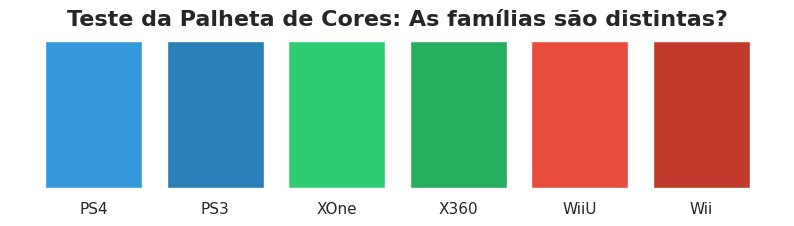


✅ Paleta de Cores e Estilo de Tabela carregados com sucesso!


In [165]:
# ==================================================================
# --- 🎨 2. CONFIGURAÇÃO DE ESTILO E  PALETA (MAPA) DE CORES 🎨 ---
# ==================================================================

print('🎨 2. Definindo Paletas de Cores e Estilos...')

# Define estilo padrão para todos os gráficos
sns.set_theme(style="white", context="notebook") # Estilo
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.titleweight'] = 'bold'
COR_SUBTITULO = '#555555'

# Configuração da paleta de cores personalizadas para as visualizações

# Cores base e destaque padrão

# Gráfico: Vendas por Plataforma e destaques
COR_BASE = '#85c1e9'
COR_DESTAQUE = '#f39c12'
COR_INCOMPLETO = '#aed6f1'
COR_LINHA = '#1e8449'

# Cores base e destaque rótulos
COR_BASE_ROT = '#71848e'
COR_DESTAQUE_ROT = '#9e7f57'



# Gráficos de Fabricantes, Plataformas, Gêneros e Classificação ESRB

# 1. Paleta por Fabricante
# Tons estilo 'Material Design'
maker_color_map = {
    # --- Os Três Grandes ---
    'Nintendo':  '#E74C3C',  # Vermelho Suave
    'Sony':      '#3498DB',  # Azul Brilhante
    'Microsoft': '#2ECC71',  # Verde Esmeralda
    
    # --- PC & Sega ---
    'PC':        '#34495E',  # Azul-Acinzentado Escuro (Steam)
    'Sega':      '#9B59B6',  # Ametista (Sega clássica)
    
    # --- Retro / Históricos (Adicionados para corrigir o erro) ---
    'Atari':     '#E67E22',  # Laranja Retrô
    'SNK':       '#1ABC9C',  # Turquesa (NeoGeo)
    'NEC':       '#F1C40F',  # Amarelo Ouro (TurboGrafx)
    'Bandai':    '#E91E63',  # Rosa/Magenta (WonderSwan)
    '3DO':       '#795548',  # Marrom/Bronze (Hardware clássico)
    
    # --- Outros ---
    'Other':     '#95A5A6'   # Cinza Concreto
}

# 2. Paleta por Plataforma (Consoles Específicos)
# Consistente com os fabricantes com variação de tons
platform_color_map = {
    # --- Sony (Tons de Azul) ---
    'PS4': '#3498DB', 'PS3': '#2980B9', 'PS2': '#2471A3', 'PS': '#1A588A', 
    'PSP': '#5DADE2', 'PSV': '#85C1E9',

    # --- Microsoft (Tons de Verde) ---
    'XOne': '#2ECC71', 'X360': '#27AE60', 'XB': '#1E8449',

    # --- Nintendo (Tons de Vermelho/Laranja) ---
    'WiiU': '#E74C3C', 'Wii': '#C0392B', '3DS': '#EC7063', 'DS': '#E59866', 
    'GBA': '#D35400', 'GB': '#B03A2E', 'GBC': '#D98880', 
    'NES': '#8A291A', 'SNES': '#A93226', 'N64': '#E8665B', 'GC': '#78281F',

    # --- Sega (Tons de Roxo/Azul Escuro - Faltavam Estes!) ---
    'DC': '#8E44AD',   # Dreamcast
    'GEN': '#6C3483',  # Genesis/Mega Drive
    'SAT': '#5B2C6F',  # Saturn
    'SCD': '#4A235A',  # Sega CD
    'GG': '#A569BD',   # Game Gear

    # --- PC ---
    'PC': '#34495E',

    # --- Retro / Outros Fabricantes (Tons de Cinza/Marrom/Amarelo) ---
    '2600': '#E67E22', # Atari (Laranja)
    'WS': '#95A5A6',   # WonderSwan
    'NG': '#7F8C8D',   # Neo Geo
    'TG16': '#F39C12', # TurboGrafx
    '3DO': '#D35400',  # 3DO
    'PCFX': '#BDC3C7'  # PC-FX
}

# Criar dados fictícios para teste visual
print('     2.1 Testando cores de Plataforma por Ecossistema (Ex: PS1, PS2 -> Sony (Azul) ) ...')

plataformas_teste = ['PS4', 'PS3', 'XOne', 'X360', 'WiiU', 'Wii']
cores_teste = [platform_color_map[p] for p in plataformas_teste]

plt.figure(figsize=(10, 2))
plt.bar(plataformas_teste, [1]*6, color=cores_teste)
plt.title("Teste da Palheta de Cores: As famílias são distintas?")
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()


# 3. Paleta de Gêneros
genre_color_map = {
    'Action':       '#E67E22',  # Laranja Vibrante (Energia/Ação)
    'Shooter':      '#2C3E50',  # Azul Meia-Noite (Sério/Militar)
    'Sports':       '#27AE60',  # Verde Campo (Esportes)
    'Role-Playing': '#8E44AD',  # Roxo (Fantasia/Magia)
    'Misc':         '#95A5A6',  # Cinza Concreto (Neutro)
    'Racing':       '#F1C40F',  # Amarelo Ouro (Velocidade)
    'Fighting':     '#C0392B',  # Vermelho Escuro (Combate)
    'Simulation':   '#16A085',  # Turquesa (Construção/Calma)
    'Platform':     '#D35400',  # Laranja Queimado
    'Adventure':    '#7F8C8D',  # Cinza Escuro
    'Strategy':     '#34495E',  # Cinza Azulado
    'Puzzle':       '#F39C12'   # Laranja Suave
}

# 4. Paleta ESRB (`rating`)
esrb_color_map = {
    'M':        '#800000',  # Maroon (Vermelho Escuro/Sangue) -> Conteúdo Maduro
    'T':        '#D35400',  # Abóbora (Alerta Moderado) -> Adolescentes
    'E10+':     '#F39C12',  # Amarelo Ouro (Atenção Leve) -> +10 Anos
    'E':        '#27AE60',  # Verde Escuro (Seguro) -> Livre/Todos
    'EC':       '#2ECC71',  # Verde Claro -> Crianças Pequenas
    'RP':       '#95A5A6',  # Cinza -> Rating Pending
    'Unknown':  '#BDC3C7'   # Prata -> Sem Classificação (Comum no Japão)
}


# 5. Paleta da Crítica (`critic_group`)
critic_color_map = {
    'Hit':      "#166E3B",  # Verde Escuro (Sucesso Absoluto/Ouro)
    'Bom':      "#63E499",  # Verde Vibrante (Sinal Verde/Compra Segura)
    'Mediano':  '#F1C40F',  # Amarelo Ouro (Atenção/Risco)
    'Fracasso': '#E74C3C',  # Vermelho (Perigo/Evitar)
    'Sem_Nota': '#95A5A6'   # Cinza Concreto (Neutro/Desconhecido)
}


# 6. Paleta de Gerações (`generation`)

# Lógica: Do "Passado" (Quente/Laranja) ao "Futuro" (Frio/Roxo)
generation_color_map = {
    'Gen 1': '#6E2C00',  # Marrom Escuro (Pré-história)
    'Gen 2': '#D35400',  # Abóbora (Atari)
    'Gen 3': '#E67E22',  # Laranja (NES)
    'Gen 4': '#F1C40F',  # Amarelo (SNES)
    'Gen 5': '#2ECC71',  # Verde (PS1/N64 - Era 3D)
    'Gen 6': '#1ABC9C',  # Turquesa (PS2/Xbox)
    'Gen 7': '#3498DB',  # Azul (PS3/360 - Era HD)
    'Gen 8': '#9B59B6',  # Roxo (PS4/XOne - Era Moderna)
    'PC':    '#34495E'   # Cinza Azulado (Fora do tempo/Perene)
}
    
# Período Relevante e Obsoleto
gen_colors = generation_color_map 
COR_PERIODO_RELEVANTE = gen_colors['Gen 8']
COR_TEXTO_RELEVANTE = gen_colors['Gen 8']
COR_PERIODO_OBSOLETO = '#e0e0e0'   # Cinza Claro
COR_TEXTO_OBSOLETO = 'gray'


# 7. Paleta de Regiões (NA, EU, JP, Other)
region_color_map = {
    'na_sales':             '#2980B9',  # Azul Forte (América do Norte - Top 1)
    'eu_sales':             '#27AE60',  # Verde (Europa - Crescimento/Estável)
    'jp_sales':             '#E74C3C',  # Vermelho (Japão - Cor Clássica)
    'other_sales':          '#F39C12'   # Laranja (Outros - Emergentes)
}

region_pt_color_map = {
    'América do Norte':     '#2980B9',  # Azul Forte (América do Norte - Top 1)
    'Europa':               '#27AE60',  # Verde (Europa - Crescimento/Estável)
    'Japão':                '#E74C3C',  # Vermelho (Japão - Cor Clássica)
    'Outros':               '#F39C12'   # Laranja (Outros - Emergentes)
}

# Mapa de Regiões para aparecer na legenda
region_map = {
    'na_sales': 'América do Norte',
    'eu_sales': 'Europa',
    'jp_sales': 'Japão',
    'other_sales': 'Outros'
}


# --------------------------------------------------
# Função Auxiliar para aplicar Negrito e Tamanho aos Rótulos do Eixo X
# --------------------------------------------------

def estilizar_eixos_x(ax, size=12, weight='bold'):
    """ Aplica negrito e tamanho em todos os rótulos do eixo X. """
    try:
        # Tenta pegar os rótulos do eixo Y para aplicar o estilo
        xticklabels = ax.get_xticklabels()
        ax.set_xticklabels(
            xticklabels, 
            fontweight=weight, 
            fontsize=size
        )
    except Exception:
        # Se for um gráfico apenas com Y, não faz nada
        pass


# ------------------------------------------------------------------
# Função Auxiliar para aplicar Negrito e Tamanho aos Rótulos do Eixo Y
# ------------------------------------------------------------------

def estilizar_eixos_y(ax, size=11, weight='bold'):
    """ 
    Aplica negrito e tamanho em todos os rótulos do eixo Y.
    """
    try:
        # Tenta pegar os rótulos do eixo Y para aplicar o estilo
        ax.set_yticks(ax.get_yticks()) # Define o tick antes
        yticklabels = ax.get_yticklabels()
        ax.set_yticklabels(
            yticklabels, 
            fontweight=weight, 
            fontsize=size
        )
    except Exception:
        # Se for um gráfico apenas com X (como o countplot de Rating), não faz nada
        pass

# -----------------------------------------------------------------------------------------------
# Função Auxiliar para aplicar Negrito e Tamanho aos Rótulos do Eixo Y com Cor (para plataformas)
# -----------------------------------------------------------------------------------------------

def estilizar_eixos_y_com_cor(ax, palette, size=12, weight='bold'):
    """
    1. Aplica tamanho e negrito em TODOS os rótulos (substitui estilizar_eixos_y).
    2. Aplica a cor específica se o nome estiver na paleta.
    """
    # Pega a lista atual de objetos de texto do eixo Y
    yticklabels = ax.get_yticklabels()
    
    # Itera um por um (é mais seguro que set_yticklabels para estilos mistos)
    for label in yticklabels:
        text = label.get_text()
        
        # 1. Aplica o estilo BASE (Tamanho e Peso)
        label.set_fontsize(size)
        label.set_fontweight(weight)
        
        # 2. Aplica a COR (se existir na paleta)
        if text in palette:
            label.set_color(palette[text])
        else:
            label.set_color('black') # Cor padrão caso não esteja na paleta


# ------------------------------------------------------------------
# Função Auxiliar para desenhar rótulos laterais por linha ao Eixo Y
# ------------------------------------------------------------------

def desenhar_rotulos_laterais(fig, labels):
    """
    Desenha rótulos laterais e ajusta a margem esquerda da figura automaticamente.
    """
    num_rows = len(labels)
    
    # Ajuste Automático de Layout
    # Empurra todo o conteúdo para a direita
    # O hspace=0.3 garante que as linhas não se toquem
    # O top=0.95 garante espaço para o título geral
    fig.subplots_adjust(left=0.11, top=0.95, hspace=0.3)

    # Cálculo das Posições Y (Agora com a margem ajustada)
    # 0.90 (topo ajustado) até 0.05 (base) para distribuir os textos
    y_positions = np.linspace(0.88, 0.1, num_rows) 

    # 3. Desenho dos Rótulos
    for i, label in enumerate(labels):
        fig.text(
            x=0.02,            # Posição fixa na margem esquerda
            y=y_positions[i],  # Posição Y calculada
            s=label,
            va='center', 
            ha='center', 
            rotation=90, 
            fontsize=18, 
            fontweight='bold', 
            color='#ffffff',
            # Adiciona um fundo sutil para destacar o rótulo
            bbox=dict(boxstyle="round,pad=0.3", fc="#777777", ec="none")
        )


# --------------------------------------------------
# Função para estilizar tabela de resumo estatístico 
# --------------------------------------------------

def estilizar_tabela_horizontal(df_stats, titulo, cor_palette='Blues'):
    display(Markdown(f"### 📊 {titulo}"))
    
    # Colunas que farão parte do gradiente de calor (sem count e std pois distorcem a escala)
    cols_gradiente = ['min', '25%', '50%', 'mean', '75%', '90%', '95%', '99%', 'max']
    
    # Verifica quais colunas existem no df (para evitar erro se algum percentil não foi calculado)
    cols_existentes = [c for c in cols_gradiente if c in df_stats.columns]

    styler = df_stats.style.format("{:.2f}")\
        .background_gradient(cmap=cor_palette, axis=1, subset=cols_existentes)\
        .bar(subset=['std'], color='#ffcccc')\
        .format("{:.0f}", subset=['count'])\
        .set_caption(f"Distribuição: {titulo} (Cores indicam a escala dentro da mesma variável)")\
        .set_properties(**{'border-color': '#cccccc'})
    
    display(styler)

    
print('\n✅ Paleta de Cores e Estilo de Tabela carregados com sucesso!')



---

> ##### 📊 **3. Funções de Plotagem e Correlação**

In [27]:
# ==================================================================
#  --- 📊 3. DEFINIÇÃO DAS FUNÇÕES DE PLOTAGEM E CORRELAÇÃO 📊 ---
# ==================================================================
print('3. 📊 Definindo as Funções de Plotagem e Correlação...')

# ------------------------------------------------------------------
# DEFINIÇÃO DO PERÍODO RELEVANTE
# ------------------------------------------------------------------
print('   ... Definindo o PERÍODO RELEVANTE (2012-2016) ...')
# Definindo o período para visualizações relevante - 2012-2016 (GEN 8)
df_relevante = df[(df['year_of_release'] >= 2012) & (df['year_of_release'] <= 2016)].copy()

# ------------------------------------------------------------------
# ADICIONAR LINHAS DE GERAÇÃO NOS GRÁFICOS
# ------------------------------------------------------------------
print('   ... Adicionando LINHAS E TEXTO DE GERAÇÃO ...')

def adicionar_linhas_geracao(ax, gen_colors, text_y_ratio=0.93):
    """
    Adiciona linhas verticais e rótulos das gerações.
    Para a Gen 8, detecta automaticamente se deve colocar o rótulo mais para esquerda ou direita baseado no zoom do eixo X (período relevante)
    
    Parâmetros:
    - ax: Eixo do gráfico.
    - gen_colors: Dicionário com as cores das gerações.
    - text_y_ratio: Posição vertical do texto (0 a 1). 
                    0.9 significa "90% da altura do gráfico".
    """
    
    # 1. Definição das Gerações
    geracoes_historicas = {
        1972: 'Gen 1',
        1977: 'Gen 2',
        1983: 'Gen 3',
        1988: 'Gen 4',
        1994: 'Gen 5',
        2000: 'Gen 6',
        2005: 'Gen 7'
    }
    
    # 2. Obter limites atuais do gráfico
    x_min, x_max = ax.get_xlim() # ano
    y_min, y_max = ax.get_ylim() # volume
    
    # Define a altura do texto dinamicamente
    y_pos = y_min + (y_max - y_min) * text_y_ratio
    
    # 3. Loop para Gerações Antigas (Gen 1 a Gen 7)
    for ano, gen_nome in geracoes_historicas.items():
        if (ano >= x_min) and (ano <= x_max):
            if gen_nome in gen_colors:
                color = gen_colors[gen_nome]
                ax.axvline(x=ano, color=color, linestyle=':', linewidth=2, alpha=0.8)
                # Mantém padrão para a esquerda para históricas
                ax.text(ano - 0.7, y_pos, gen_nome, color=color, 
                        fontsize=12, rotation=90, fontweight='bold', va='center')
    
    # 4. Caso Especial Gen 8 (2012)
    if (2012 >= x_min) and (2012 <= x_max):
        if 'Gen 8' in gen_colors:
            color_gen8 = gen_colors['Gen 8']
            ax.axvline(x=2012, color=color_gen8, linestyle='--', linewidth=2)
            
            # --- LÓGICA INTELIGENTE ---
            # Se o gráfico começa muito perto de 2012 (Zoom), ajusta a posição
            if x_min > 2010:
                pos_x = 2012 - 0.05  # Desloca um pouco menos para esquerda
                alinhamento = 'right' # Alinha o texto pela direita
            else:
                # Comportamento padrão (Histórico), joga para a esquerda (-)
                pos_x = 2012 - 0.2
                alinhamento = 'right'

            ax.text(pos_x, y_pos, 'Gen 8', color=color_gen8, 
                    fontsize=12, rotation=90, fontweight='bold', 
                    va='center', ha=alinhamento)

    return ax


# ------------------------
# DICIONÁRIO DE TRADUÇÕES
# ------------------------
print('   ... Adicionando DICIONÁRIO DE TRADUÇÕES para "rating" ...')

# --- COLUNA RATING ---

# Dicionário de Significado (Tradução)
esrb_full_names = {
    'E': 'Everyone\n(Livre)',
    'E10+': 'Everyone 10+\n(10 Anos)',
    'T': 'Teen\n(13 Anos)',
    'M': 'Mature\n(17+)',
    'Unknown': 'Sem\nClassificação',
    'AO': 'Adults Only',
    'EC': 'Early Childhood',
    'RP': 'Pending'
}

3. 📊 Definindo as Funções de Plotagem e Correlação...
   ... Definindo o PERÍODO RELEVANTE (2012-2016) ...
   ... Adicionando LINHAS E TEXTO DE GERAÇÃO ...
   ... Adicionando DICIONÁRIO DE TRADUÇÕES para "rating" ...


<a id="funcao_dash_1"></a>
#### 🛠️ Definição da Função: Dashboard 1
*[⬇️ Pular para a análise/gráficos](#dash_1)*

In [28]:
# ============================
# DASHBOARD 1
# ============================

print('3. 📊 Definindo as Funções de Plotagem e Correlação...')

print('''   ... DASHBOARD 1 ...
        1. Lançamentos (Barras) vs Vendas (Linha)
        2. Guerra dos Consoles, Ciclos de Mercado e Vendas Regionais''')

# ----------------------------------------------
# Parte 1: Lançamentos (Barras) vs Vendas (Linha)
# ----------------------------------------------

def plotar_evolucao_mercado(df_input, x_limits, x_ticks, modo_zoom=False):
    """
    Plota o gráfico de Lançamentos (Barras) vs Vendas (Linha)
    com a linha vertical em 1994 e anotações, com aviso de dados parciais em 2016
    e escala definida manualmente.
    """
    
    # 1. Preparação dos Dados
    jogos_por_ano = df_input.groupby('year_of_release')['name'].count()
    vendas_por_ano = df_input.groupby('year_of_release')['total_sales'].sum()
    
    # Filtro
    mask_jogos = (jogos_por_ano.index >= x_limits[0]) & (jogos_por_ano.index <= x_limits[1])
    jogos_por_ano = jogos_por_ano[mask_jogos]
    
    mask_vendas = (vendas_por_ano.index >= x_limits[0]) & (vendas_por_ano.index <= x_limits[1])
    vendas_por_ano = vendas_por_ano[mask_vendas]

    # Cores e Hatches
    cores = []
    hatches = []
    for ano in jogos_por_ano.index:
        if ano == 2016:
            cores.append(COR_INCOMPLETO)
            hatches.append('///')
        elif ano < 1994: 
            cores.append('lightgray')
            hatches.append('')
        elif ano in [2008, 2009]: 
            cores.append(COR_DESTAQUE)
            hatches.append('')
        else: 
            cores.append(COR_BASE)
            hatches.append('')

    # 2. Plotagem
    fig, ax1 = plt.subplots(figsize=(16, 8))

    # --- EIXO 1: ESQUERDA (Barras) ---
    bars = ax1.bar(range(len(jogos_por_ano)), jogos_por_ano.values, 
                   color=cores, edgecolor='black', width=0.85, zorder=3)
    
    for bar, pattern in zip(bars, hatches):
        bar.set_hatch(pattern)

    ax1.set_ylabel('Quantidade de Jogos (Barras)', fontsize=12, fontweight='bold', color='#2c3e50')
    ax1.tick_params(axis='y', labelcolor='#2c3e50')

    # -------------------------------------------------------------------------
    # DEFINIÇÃO DE ESCALAS E LIMITES
    # -------------------------------------------------------------------------
    if modo_zoom:
        # MODO ZOOM (Detalhe)
        range_barras = range(0, 850, 100)  # 100 em 100
        range_linha = range(0, 425, 50)    # 50 em 50
        limite_esq = 850
        limite_dir = 425
        tamanho_marker = 12

    else:
        # MODO HISTÓRICO (Geral)
        range_barras = range(0, 1601, 200) 
        range_linha = range(0, 801, 100)   
        limite_esq = 1600
        limite_dir = 800
        tamanho_marker = 6
        ax1.set_xlim(-0.6, len(jogos_por_ano) - 0.4) # Colar barras nos eixos

    # Aplica Eixo Esquerdo
    ax1.set_yticks(range_barras)
    ax1.set_ylim(0, limite_esq)
    ax1.grid(axis='y', linestyle='--', alpha=0.3, zorder=0)

    # Ajuste eixo X
    tick_indices = []
    tick_labels = []
    anos_lista = jogos_por_ano.index.tolist()
    ticks_alvo = list(x_ticks) if isinstance(x_ticks, range) else x_ticks
    
    for i, ano in enumerate(anos_lista):
        if modo_zoom or (ano in ticks_alvo): 
            tick_indices.append(i)
            tick_labels.append(ano)
    ax1.set_xticks(tick_indices)
    ax1.set_xticklabels(tick_labels, rotation=0)

    # --- EIXO 2: DIREITA (Linha) ---
    ax2 = ax1.twinx() 
    
    ax2.set_yticks(range_linha)
    ax2.set_ylim(0, limite_dir)
    
    ax2.plot(range(len(vendas_por_ano)), vendas_por_ano.values, 
             color=COR_LINHA, linewidth=3, marker='o', markersize=tamanho_marker, zorder=4)

    ax2.set_ylabel('Vendas Totais (Milhões de Cópias)', fontsize=12, fontweight='bold', color=COR_LINHA, rotation=270, labelpad=20)
    ax2.tick_params(axis='y', labelcolor=COR_LINHA)
    
    # 3. Anotações
    if not modo_zoom:
        def get_idx(ano):
            return jogos_por_ano.index.get_loc(ano) if ano in jogos_por_ano.index else None

        # Consoles - COORDENADAS (TEXTO ACIMA DA LINHA)
        # Nota: As coordenadas são baseadas no Eixo Esquerdo (0 a 1600)
        consoles = {
            # Ano: (Texto, Posição Ponta Seta, Posição Texto)
            1994: ('PS1\n(1994)', 250, 325), 
            2000: ('PS2\n(2000)', 500, 575), 
            2006: ('PS3\n(2006)', 1100, 1175),             
            2013: ('PS4\n(2013)', 750, 825)
        }
        
        for ano, (texto, seta_y, texto_y) in consoles.items():
            idx = get_idx(ano)
            if idx is not None:
                if seta_y < limite_esq:
                    ax1.annotate(texto, xy=(idx, seta_y),
                                 xytext=(idx, texto_y),
                                 arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=6),
                                 ha='center', fontsize=9, fontweight='bold', color='black')

        # Pico e Saturação
        idx_2008 = get_idx(2008)
        idx_2001 = get_idx(2001) if get_idx(2001) else (idx_2008 - 7 if idx_2008 else 0)

        if idx_2008 is not None:
             ax1.annotate('PICO DE LANÇAMENTOS / SATURAÇÃO \n(Boom de Shovelware: Wii & DS)', 
                          xy=(idx_2008, 1400), 
                          xytext=(idx_2001, 1400), # Alinhado no topo
                          arrowprops=dict(facecolor='black', shrink=0.05),
                          fontsize=11, fontweight='bold', color=COR_DESTAQUE, ha='center')
             
             idx_2009 = get_idx(2009)
             if idx_2009:
                ax1.axvspan(xmin=idx_2008 - 0.5, xmax=idx_2009 + 0.5, color=COR_DESTAQUE, alpha=0.2, zorder=0)

        # Explosão de Lançamentos
        idx_1995 = get_idx(1995)
        if idx_1995 is not None:
            ax1.text(x=idx_1995, y=850, s='Boom de\nLançamentos \n(PS1, PS2)',
                     fontsize=11, color='#f93333', fontweight='bold', ha='left', va='center')
            ax1.axvline(x=jogos_por_ano.index.get_loc(1994) - 0.5, color='red', linestyle='--', linewidth=2, zorder=5)
        
        # Era Retrô
        idx_1986 = get_idx(1986)
        if idx_1986 is not None:
            ax1.text(x=idx_1986, y=850, s='Era Retrô\n(Baixo Volume)',
                     fontsize=11, color='#4d4d4d', fontweight='bold', ha='center', va='center')
            idx_1993 = get_idx(1993)
            if idx_1993:
                ax1.axvspan(xmin=-1, xmax=idx_1993 + 0.5, color='#e0e0e0', alpha=0.7, zorder=0)

    # Queda recente 2016 - Texto Dinâmico para A vs B
    if 2016 in jogos_por_ano.index:
        idx_2016 = jogos_por_ano.index.get_loc(2016)

        # VARIÁVEIS COMUNS
        props_seta = dict(facecolor='black', shrink=0.05)
        estilo_caixa = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", pad=20, alpha=0.95)
        
        if modo_zoom:
             # --- MODO B (ZOOM) ---
             xy_text_pos = (idx_2016 - 0.5, 600) 
             xy_arrow_pos = (idx_2016, vendas_por_ano[2016])

             # Texto focado na Divergência Recente
             texto_analise = (
                "DIVERGÊNCIA (2013-2015):\n"
                "- Oferta estável\n"
                "- Vendas caindo\n\n"
                "⚠️ DADOS 2016 (PARCIAIS):\n"
                "Queda reflete dados\n"
                "incompletos."
            )
        else:
             # --- MODO A (HISTÓRICO COMPLETO) ---
             xy_text_pos = (idx_2016 - 6, 1300) 
             xy_arrow_pos = (idx_2016, vendas_por_ano[2016])

             # Texto focado na Mudança de Mercado e Mobile
             texto_analise = (
                "QUEDA DE VOLUME:\n"
                "- Jogos mais caros/complexos\n"
                "- Migração para Mobile\n"
                "- Qualidade sobre Quantidade\n\n"
                "⚠️ DADOS 2016 (PARCIAIS):\n"
                "Queda reflete dados\n"
                "incompletos."
            )

        # Plotando a anotação com o texto selecionado acima
        ax1.annotate(texto_analise, 
                     xy=xy_arrow_pos, xycoords=('data', ax2.transData),
                     xytext=xy_text_pos, textcoords='data',
                     arrowprops=props_seta,
                     fontsize=10, fontweight='bold', color='black',
                     ha='left', bbox=estilo_caixa)

    # -------------------------------------------------------------------------
    # LEGENDA DINÂMICA
    # -------------------------------------------------------------------------
    custom_lines = [
        Line2D([0], [0], color=COR_BASE, lw=4),
        Line2D([0], [0], color=COR_LINHA, lw=3, marker='o')
    ]
    legend_labels = ['Qtd. Lançamentos', 'Total de Cópias']

    if 2016 in jogos_por_ano.index:
        custom_lines.append(plt.Rectangle((0,0),1,1, facecolor=COR_INCOMPLETO, edgecolor='black', hatch='///'))
        legend_labels.append('2016 (Dados Incompletos)')

    # Só adiciona o item Vermelho se 1994 estiver no gráfico
    if 1994 in jogos_por_ano.index:
        custom_lines.append(Line2D([0], [0], color='red', lw=2, linestyle='--'))
        legend_labels.append('Marco 1994 (Início Boom)')

    ax1.legend(custom_lines, legend_labels, loc='upper left')

    # --- Estilização ---
    titulo = 'Dinâmica Recente: Oferta Estável vs. Queda nas Vendas Físicas' if modo_zoom else 'Evolução do Mercado: Histórico Completo'
    plt.suptitle(titulo, fontsize=18, fontweight='bold', y=0.975)
    subtitulo = 'Cenário 2012-2016: Saturação de Lançamentos e Queda de Vendas\nQuantidade de Lançamentos (Barras) vs. Total de Cópias Vendidas (Linha)' if modo_zoom else 'Quantidade de Lançamentos (Barras) vs. Total de Cópias Vendidas (Linha)'
    plt.title(subtitulo, fontsize=14, color=COR_SUBTITULO, pad=10)
    
    sns.despine(left=False, bottom=True, right=False)
    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------------
# Parte 2: Guerra dos Consoles, Ciclos de Mercado e Vendas Regionais
# ------------------------------------------------------------------
# 3 gráficos com ajuste de datas (Scatter, Hist, Line)

def gerar_dashboard_mercado(df_input, titulo_secao, x_limits, x_ticks, modo_zoom=False):
    """
    Gera o dashboard de 3 gráficos com ajuste de datas (Scatter, Hist, Line).
    
    Parâmetros:
    - df_input: DataFrame filtrado (df completo ou df_relevante)
    - titulo_secao: Título da seção em Markdown (ex: "A - Panorama...")
    - x_limits: Tupla (min, max) para o eixo X
    - x_ticks: Range ou Lista para os ticks do eixo X
    - modo_zoom: Booleano. Se True, aplica o estilo do Dashboard B (bolas grandes, 2012+).
    """
    
    # Título das seções
    display(Markdown(f'<br>'))
    display(Markdown(f"### **{titulo_secao}**"))
    display(Markdown(f"---"))

    # Configuração da Figura (3x1)
    fig, axes = plt.subplots(3, 1, figsize=(16, 19))
    gen_colors = generation_color_map 
    
    # --- CONTROLE DE LIMITES ---
    # O Gráfico 1 sempre segue o x_limits passado (1976 ou 2012)
    limits_g1 = x_limits
    
    # Os Gráficos 2 e 3 precisam de uma regra especial:
    if modo_zoom:
        # No zoom, todos seguem o mesmo corte (2012)
        limits_g2_g3 = x_limits
        ticks_g2_g3 = x_ticks
    else:
        # No histórico, forçar o início em 1980 para G2 e G3
        limits_g2_g3 = (1980, x_limits[1])
        # Ajustar os ticks para começar em 1980 (mantendo o passo de 2 em 2)
        ticks_g2_g3 = range(1980, x_ticks.stop, x_ticks.step)


    # =========================================================
    # GRÁFICO 1: SCATTER PLOT (CRONOLOGIA) -> Começa em 1976
    # =========================================================
    ax1 = axes[0]
    
    timeline_df = df_input[['platform', 'platform_year', 'console_maker']].drop_duplicates()
    volume = df_input.groupby('platform')['name'].count().reset_index().rename(columns={'name': 'game_count'})
    timeline_df = timeline_df.merge(volume, on='platform', how='left')
    
    if modo_zoom:
        main_makers = ['Nintendo', 'Sony', 'Microsoft']
        timeline_df = timeline_df[timeline_df['console_maker'].isin(main_makers)]
        sizes_tuple = (4000, 12000) # Bolas grandes
        titulo_g1 = 'A Guerra dos Consoles: A Chegada da 8ª Geração (2012-2016)'
    else:
        sizes_tuple = (40, 3000) # Bolas pequenas
        titulo_g1 = 'A Guerra dos Consoles: Histórico de Hardware (1976-2016)'
    
    timeline_df = timeline_df.sort_values(['platform_year', 'game_count'])

    sns.scatterplot(
        data=timeline_df, x='platform_year', y='console_maker', hue='console_maker',
        palette=maker_color_map, size='game_count', sizes=sizes_tuple,
        ax=ax1, legend=False, zorder=3
    )

    # Anotações G1
    if modo_zoom: # modo zoom
        ax1.margins(y=0.3)
        for _, row in timeline_df.iterrows():
            ax1.annotate(f"{row['platform']}\n({row['game_count']})", 
                         xy=(row['platform_year'], row['console_maker']), ha='center', va='center',
                         fontsize=12, fontweight='bold', color='white')
        ax1.text(2012.05, -0.45, 'PERÍODO RELEVANTE', color=gen_colors['Gen 8'], fontsize=13, fontweight='bold')
        ax1.axvspan(2012, 2017, color=gen_colors['Gen 8'], alpha=0.1, zorder=0)

    else: # modo histórico
        ax1.margins(y=0.15)
        force_top = ['GC', 'TG16', 'PS4', '3DS']
        force_bottom = ['WiiU', 'XOne', 'PC', 'NG', 'GEN', 'PS']
        
        for _, row in timeline_df.iterrows():
            plat, year = row['platform'], row['platform_year']
            if plat in force_top: offset = 20
            elif plat in force_bottom: offset = -20
            else: offset = 20 if (year % 2 == 0) else -20
            
            va_align = 'bottom' if offset > 0 else 'top'
            ax1.annotate(row['platform'], xy=(year, row['console_maker']), xytext=(0, offset),
                         textcoords='offset points', ha='center', va=va_align,
                         fontsize=13, fontweight='bold', color='#333333')
            
        ax1.text(2012.3, -0.55, 'PERÍODO\nRELEVANTE', color=gen_colors['Gen 8'], fontsize=11, fontweight='bold')
        ax1.axvspan(2012, 2017, color=gen_colors['Gen 8'], alpha=0.1, zorder=0)



    # Configurações Finais G1 (Usa limits_g1 = 1976)
    ax1.set_title(titulo_g1, fontsize=16, fontweight='bold', pad=20)
    ax1.set_xlabel('')
    ax1.set_ylabel('')
    ax1.set_xlim(limits_g1)  # <--- AQUI MANTÉM 1976
    ax1.set_xticks(x_ticks)
    estilizar_eixos_x(ax1, size=11)
    estilizar_eixos_y_com_cor(ax1, palette=maker_color_map)
    ax1.grid(axis='x', linestyle='--', alpha=0.5)
    sns.despine(ax=ax1, left=True)

    
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Tamanho = Volume de Jogos',
                              markerfacecolor='#5e84aa', markersize=20)]
    ax1.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(0.01, 0.2), 
               fontsize=14, frameon=True, framealpha=0.9, edgecolor='black')

    ratio_g1 = 0.5 if modo_zoom else 0.93
    adicionar_linhas_geracao(ax1, gen_colors, text_y_ratio=ratio_g1)


    # =========================================================
    # GRÁFICO 2: HISTOGRAMA -> Começa em 1980 (se histórico)
    # =========================================================
    ax2 = axes[1]
    
    if modo_zoom:
        gen_order = ['Gen 7', 'Gen 8', 'PC']
        titulo_g2 = 'Lançamentos por Ano e Geração: Consolidação da Gen 8'

    else:
        gen_order = ['Gen 2', 'Gen 3', 'Gen 4', 'Gen 5', 'Gen 6', 'Gen 7', 'Gen 8', 'PC']
        titulo_g2 = 'Ciclos de Mercado: Sobreposição de Gerações nos Lançamentos'


    sns.histplot(
        data=df_input, x='year_of_release', discrete=True, hue='generation',
        hue_order=gen_order, palette=gen_colors, multiple='stack',
        ax=ax2, edgecolor='white', linewidth=2
    )

    max_y = df_input['year_of_release'].value_counts().max()
    ax2.set_ylim(0, max_y * 1.2)
    
    # --- APLICAÇÃO DO LIMITE ---
    ax2.set_xlim(limits_g2_g3) # <--- AQUI USA 1980
    ax2.set_xticks(ticks_g2_g3)
    
    ax2.set_title(titulo_g2, fontsize=14, fontweight='bold', pad=25)
    ax2.set_ylabel('Volume de Lançamentos (Un.)')
    ax2.set_xlabel('')
    estilizar_eixos_x(ax2, size=11)
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    sns.despine(ax=ax2)
    
    # Anotações G2
    sns.move_legend(ax2, bbox_to_anchor=(0.92 if modo_zoom else 0.01, 1), 
                    loc="upper right" if modo_zoom else "upper left", 
                    title='Geração',
                    frameon=True,
                    fontsize=13,
                    title_fontsize=15)

    adicionar_linhas_geracao(ax2, gen_colors)
    ax2.axvspan(2012, 2017, color='#8e44ad', alpha=0.1, zorder=0)


    if not modo_zoom:
        texto_y = max_y * 1.1
        ax2.text(1994.3, texto_y, 'Revolução 3D\n(PS1/N64)', color=gen_colors['Gen 5'], fontsize=11, fontweight='bold')
        ax2.text(2000.3, texto_y, 'Consolidação\n(PS2)', color=gen_colors['Gen 6'], fontsize=11, fontweight='bold')
        ax2.text(2006.3, texto_y, 'Pico de Volume\n(Wii/PS3)', color=gen_colors['Gen 7'], fontsize=11, fontweight='bold')
        ax2.text(2012.3, texto_y - 30, 'Qualidade sobre\nQuantidade\n(PS4/XOne)', color=gen_colors['Gen 8'], fontsize=11, fontweight='bold')

        ax2.axvspan(2006, 2011, color='#F39C12', alpha=0.1, zorder=0) # pico de volume


    # =========================================================
    # GRÁFICO 3: LINHAS -> Começa em 1980 (se histórico)
    # =========================================================
    ax3 = axes[2]
    
    vendas = df_input.groupby('year_of_release')[['na_sales', 'eu_sales', 'jp_sales', 'other_sales']].sum().reset_index()
    df_melted = vendas.melt(id_vars='year_of_release', var_name='Região', value_name='Vendas (Milhões)')
    df_melted['Região'] = df_melted['Região'].map(region_map)

    sns.lineplot(
        data=df_melted, x='year_of_release', y='Vendas (Milhões)', hue='Região',
        palette=region_pt_color_map, marker='o', markersize=12 if modo_zoom else 8, linewidth=3, ax=ax3
    )

    titulo_g3 = 'Tendência de Vendas Regionais: Declínio Americano e Convergência Global' if modo_zoom else 'Tendência de Vendas Regionais: Pico em 2008 e Liderança Americana'
    ax3.set_title(titulo_g3, fontsize=14, fontweight='bold', pad=25)
    
    # --- APLICAÇÃO DO LIMITE ---
    ax3.set_xlim(limits_g2_g3) # <--- AQUI USA 1980
    ax3.set_xticks(ticks_g2_g3)
    
    ax3.set_ylabel('Vendas (Milhões)')
    ax3.set_xlabel('')
    estilizar_eixos_x(ax3, size=11)
    ax3.grid(axis='x', linestyle='--', alpha=0.5)

    sns.despine(ax=ax3)

    # Anotações G3    
    ax3.legend(bbox_to_anchor=(0.94 if modo_zoom else 0.01, 1), 
               loc='upper right' if modo_zoom else 'upper left', 
               title='Região', fontsize=13, title_fontsize=15)

    adicionar_linhas_geracao(ax3, gen_colors)
    ax3.axvspan(2012, 2017, color='#8e44ad', alpha=0.1, zorder=0)


    # =========================================================
    # FINALIZAÇÃO
    # =========================================================
    titulo_main = 'Diagnóstico do Mercado Atual (2012-2016)' if modo_zoom else 'A Evolução do Mercado (1980-2016)'
    plt.suptitle(titulo_main, fontsize=20, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.3)

    # Lógica inteligente: Se o gráfico termina em 2016, adiciona o aviso de dados incompletos
    if x_limits[1] >= 2016:
        plt.figtext(0.5, -0.01, 
                    'Nota: Os dados de 2016 estão incompletos/parciais.', 
                    ha='center', fontsize=11, style='italic', weight='bold', color='gray')

    plt.show()

3. 📊 Definindo as Funções de Plotagem e Correlação...
   ... DASHBOARD 1 ...
        1. Lançamentos (Barras) vs Vendas (Linha)
        2. Guerra dos Consoles, Ciclos de Mercado e Vendas Regionais


<a id="funcao_dash_2"></a>
#### 🛠️ Definição da Função: Dashboard 2
*[⬇️ Pular para a análise/gráficos](#dash_2)*

In [29]:
# ============================
# DASHBOARD 2
# ============================
print('3. 📊 Definindo as Funções de Plotagem e Correlação...')

print('''   ... DASHBOARD 2 ...''')

# --------------------------------------------------------------
# 1. JOINTPLOT (HISTOGRAMA DE FREQUÊNCIA): VOLUME DE JOGOS (UN.)
# --------------------------------------------------------------
#  Variáveis discretas e categóricas ->
# 'platform', 'console_maker', 'generation', 'critic_group', 'genre', 'rating', 'count_platforms', 'count_makers'

print('     1. JOINTPLOT...')

def plot_univariate_count(df, category_col, ax, palette=None, title=None, horizontal=True, order_override=None, label_x=None, label_y=None):
    """
    Plota um gráfico de barras (Contagem) com estilização limpa e ticks em negrito.
    """

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    
    # Definir a ordem (Do mais frequente)
    if order_override is not None:
        order_cat = order_override
    else:
        # Padrão: Ordenar pela contagem        
        order_cat = df[category_col].value_counts().index
    
    # Definir a orientação
    if horizontal:
        x_param = None
        y_param = category_col
    else:
        x_param = category_col
        y_param = None

    # Plotagem
    sns.countplot(
        data=df,
        x=x_param,
        y=y_param,
        order=order_cat,
        ax=ax,
        palette=palette if palette else 'viridis',
        hue=category_col,
        hue_order=order_cat,
        edgecolor='#999',
        linewidth=0.2,
#        alpha=0.5,
        legend=False
    )
    
    # RÓTULO DO EIXO X (Prioriza o manual 'label_x + '(Escala Log)')
    if label_x is not None:
        final_label_x = label_x
    else:
        # Padrão: Formatar o nome da coluna
        final_label_x = 'Quantidade de Jogos'
    
    ax.set_xlabel(final_label_x, fontsize=12) # Aplica o rótulo X


    # RÓTULO DO EIXO Y (Prioriza o manual 'label_y')
    if label_y is not None:
        final_label_y = label_y
    else:
        # Padrão: Formatar o nome da coluna
        final_label_y = ' '
    

    ax.set_xticks([])
    ax.set_xlabel(final_label_x, fontsize=12) # Aplica o rótulo X
    ax.set_yticks(ax.get_yticks())
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold', fontsize=13)
    ax.set_ylabel(final_label_y, fontsize=12) # Aplica o rótulo Y
    
    # Título (Mesma lógica do eixo X)    
    # Estilização e Rótulos
    ax.set_title(title if title else category_col.capitalize(), fontsize=14, fontweight='bold')
    
    # Rótulos nas Barras
    for container in ax.containers:
        ax.bar_label(container, padding=3, fontsize=10, fontweight='bold')
    
    # Limpeza de Eixos e Ticks
    sns.despine(ax=ax, left=True, bottom=True, right=True, top=True)


# Definindo a função para plotar o boxplot da dispersão das variáveis discretas/categóricas


# ---------------------------------------------------------
# 2. BOXPLOT HORIZONTAL (LOG SCALE): DISTRIBUIÇÃO DE VENDAS
# ---------------------------------------------------------
#  Variáveis explicativas ->
# 'generation', 'critic_group', 'genre', 'rating', 'count_platforms', 'count_makers', 'is_long_running', 'is_exclusive' 
#  Variável alvo -> 'total_sales'

print('     2. BOXPLOT...')

def plot_boxplot_dispersao(
    df, 
    category_col, 
    value_col='total_sales', 
    ax=None, 
    title=None, 
    palette=None, 
    order_override=None, 
    label_x=None, 
    order_by_count=True
):
    """
    Gera um Boxplot horizontal com escala logarítmica e estilo de relatório.
    Permite ordenação e rótulo X manual.
    """
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    # Ordenação dinâmica
    if order_override is not None:
        # Se for passado um order_override, use-o
        order_cat = order_override
    elif order_by_count:
        # 🔴 OPÇÃO 1: Ordenar pela FREQUÊNCIA (Para bater com o countplot)
        order_cat = df[category_col].value_counts().index
    else:
        # OPÇÃO 2 (Padrão): Ordenar pela Mediana de Vendas (Dinheiro)
        order_cat = df.groupby(category_col)[value_col].median().sort_values(ascending=False).index
        
    
    # DEFINIR ESTILOS
    estilo_caixa = dict(edgecolor='#333333', linewidth=0.5)
    estilo_mediana = dict(color='white', linewidth=1.5)
    estilo_outliers = dict(marker='o', markerfacecolor='gray', markeredgecolor='none', alpha=0.4)

    # PLOTAGEM
    sns.boxplot(
        data=df,
        x=value_col,
        y=category_col,
        order=order_cat, # Aplica a ordem
        ax=ax,
        palette=palette if palette else 'viridis',
        hue=category_col,
        legend=False,
        orient='h',
        
        # Passa os estilos
        linewidth=0.8,
        fliersize=3, 
        flierprops=estilo_outliers,
        boxprops=estilo_caixa, 
        medianprops=estilo_mediana
    )
    
    # AJUSTES TÉCNICOS E ESTILIZAÇÃO
    ax.set_xscale('log')
    ax.set_ylabel('')

    # RÓTULO DO EIXO X (Prioriza o manual 'label_x + '(Escala Log)')
    if label_x is not None:
        final_label_x = label_x + ' (Escala Log)'
    else:
        # Padrão: Formatar o nome da coluna
        final_label_x = f'{value_col.replace("_", " ").title()} (Escala Log)'
    
    ax.set_xlabel(final_label_x, fontsize=13) # Aplica o rótulo X

    # Título (Mesma lógica do eixo X)    
    final_title = title if title else f'Dispersão de {value_col.replace("_", " ")} por {category_col}'
    ax.set_title(final_title, fontsize=14, fontweight='bold', pad=10)
    
    # Limpeza
    sns.despine(ax=ax, left=True)
    
    # ESTILIZAÇÃO DOS RÓTULOS Y (Negrito)
    ax.set_yticks(ax.get_yticks()) 
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold', fontsize=12)



# ------------------------------------------------------------------
# 3. BARRAS HORIZONTAL (VARIÁVEIS BINÁRIAS -> CONTAGEM E PERCENTUAL)
# ------------------------------------------------------------------
# Variáveis binárias
# 'is_long_running', #is_exclusive

print('     3. BARRAS HORIZONTAL...')

def plot_horizontal_count_percent(df, col_name, ax, palette, title, labels_map=None, order_override=None):
    """
    Plota um gráfico de barras horizontais com contagem e porcentagem no rótulo.
    Ideal para variáveis binárias (Sim/Não).
    """
    # Preparar os dados
    counts = df[col_name].value_counts().sort_index()
    total = len(df)
    pcts = (counts / total * 100).round(1)

    # Mapear os nomes (ex: 0 -> Novo Jogo, 1 -> Franquia)
    if labels_map:
        # Pega o índice (0, 1) e busca o nome no dicionário
        labels = [labels_map.get(idx, idx) for idx in counts.index]
    else:
        labels = counts.index

    # Criar DF temporário
    df_temp = pd.DataFrame({
        'Tipo': labels,
        'Contagem': counts.values,
        'Percentual': pcts.values
    })

    if order_override:
        # Transforma a coluna 'Tipo' em categoria ordenada
        df_temp['Tipo'] = pd.Categorical(df_temp['Tipo'], categories=order_override, ordered=True)
        df_temp = df_temp.sort_values('Tipo')

    # Plotar
    sns.barplot(
        data=df_temp,
        x='Contagem',
        y='Tipo',
        order=labels if order_override else None,
        palette=palette,
        ax=ax,
        hue='Tipo',
        legend=False,
        edgecolor='black',
        linewidth=0.5
    )

    # Estilização
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Qtd. de Jogos')
    ax.set_ylabel('')

    # Rótulos Inteligentes (Contagem + %)
    for i, (count, pct) in enumerate(zip(df_temp['Contagem'], df_temp['Percentual'])):
        texto = f"{count} ({pct}%)"
        ax.text(
            count + (total * 0.01), # Margem dinâmica
            i, 
            texto, 
            va='center', 
            fontweight='bold', 
            fontsize=11,
            color='black'
        )

    sns.despine(ax=ax, left=True, bottom=True)
    ax.set_xticks([]) 
    
    # Negrito no Eixo Y
    ax.set_yticks(ax.get_yticks())
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold', fontsize=12)


# ------------------------------------------------------------------
# 4. HISTOGRAMA: DISTRIBUIÇÃO DE VENDAS
# ------------------------------------------------------------------
# Variáveis de Vendas Totais e Regionais
# 'total_sales', 'na_sales', 'eu_sales', 'jp_sales', 'other_sales' 

print('     4. HISTOGRAMA...')

def plot_sales_histogram(df, col_name, ax, color, title, xlim=None, binrange=None):
    """
    Plota um histograma de distribuição de vendas com estilo padronizado.
    """
    # Plotar Histograma
    sns.histplot(
        df[col_name], 
        bins=25, 
        binrange=binrange, 
        kde=True, 
        ax=ax, 
        color=color, 
        edgecolor='white', 
        linewidth=2
    )
    
    # Estilização
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Vendas (Milhões de Cópias)')
    ax.set_ylabel('Qtd. de Jogos')
    
    if xlim:
        ax.set_xlim(xlim)
    
    sns.despine(ax=ax)

    # Formatação de Ticks (Bold)
    ax.set_xticks(ax.get_xticks()) 
    ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold', fontsize=11)


# ==============================================================================
# FUNÇÃO 1: BLOCO MERCADO E IDENTIDADE
# ==============================================================================
def gerar_bloco_mercado(df_input, titulo_markdown, modo_zoom=False):
    """Gera o grid 5x2 de Mercado com comentários detalhados e estrutura organizada."""
    
    # 1. Cabeçalho Visual
    display(Markdown(f'<br>'))
    display(Markdown(f"## 🧬 **Bloco 1: Identidade de Mercado**"))
    display(Markdown(f"> ## ***{titulo_markdown}***"))
    display(Markdown(f"---"))

    # 2. Configuração do Grid
    fig, axes = plt.subplots(5, 2, figsize=(20, 30))
    labels_lateral = ["PLATAFORMAS & ECOSSISTEMAS", "CICLO & VENDAS GLOBAIS", 
                      "VENDAS REGIONAIS (NA/EU)", "VENDAS REGIONAIS (JP/OTHER)", "NOTAS DA CRÍTICA E USUÁRIOS"]
    
    # =========================================================
    # LINHA 1: PLATAFORMAS (RANKING VOLUME DE JOGOS)
    # =========================================================

    # --------------------------------------------------------- 
    # GRÁFICO 1: TOP 10 PLATAFORMAS
    # ---------------------------------------------------------
    ax1 = axes[0,0]
    top_platforms_index = df_input['platform'].value_counts().head(10).index
    df_top = df_input[df_input['platform'].isin(top_platforms_index)]
    
    plot_univariate_count(df_top, 'platform', ax1, palette=platform_color_map, 
                          title='Liderança de Catálogo: Top 10 Plataformas por Volume', horizontal=True)
    
    # Legenda Personalizada (Fabricantes)
    legend_makers = {k: maker_color_map[k] for k in ['Sony', 'Microsoft', 'Nintendo', 'PC']}
    legend_handles = [mpatches.Patch(color=c, label=l) for l, c in legend_makers.items()]
    ax1.legend(handles=legend_handles, title='Fabricante', loc='lower right', 
               bbox_to_anchor=(0.9, 0.2 if modo_zoom else 0.3), fontsize=12, title_fontsize=13, frameon=True)

    # ---------------------------------------------------------
    # GRÁFICO 2: CONSOLE MAKER (ECOSSISTEMA)
    # ---------------------------------------------------------
    plot_univariate_count(df_input, 'console_maker', axes[0,1], palette=maker_color_map, 
                          title='Força do Ecossistema: Volume de Títulos por Fabricante', horizontal=True)


    # =========================================================
    # LINHA 2: GERAÇÃO DE CONSOLES (EVOLUÇÃO TECNOLÓGICA)
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 3: VOLUME POR GERAÇÃO
    # ---------------------------------------------------------
    gen_order = sorted(df_input['generation'].unique())
    plot_univariate_count(category_col='generation', df=df_input, ax=axes[1,0], palette=generation_color_map, 
                          title='Expansão da Indústria: Volume de Lançamentos por Geração', label_x='Qtd. de Jogos Lançados', order_override=gen_order)
    
    # ---------------------------------------------------------
    # GRÁFICO 4: BOXPLOT POR GERAÇÃO (CRESCIMENTO)
    # ---------------------------------------------------------
    plot_boxplot_dispersao(category_col='generation', df=df_input, ax=axes[1,1], palette=generation_color_map, 
                           title='Potencial de Receita: O Mercado Cresceu a cada Geração? (Log)', label_x='Vendas Totais', order_override=gen_order)


    # =========================================================
    # LINHA 3: VENDAS GLOBAIS E CICLO DE VIDA
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 5: VENDAS GLOBAIS (HISTOGRAMA)
    # ---------------------------------------------------------
    plot_sales_histogram(df=df_input, col_name='total_sales', ax=axes[2,0], color='green', 
                         title='A Realidade do Mercado: Concentração de Vendas em Valores Baixos', xlim=(0, 2.5), binrange=(0, 2))
    
    # ---------------------------------------------------------
    # GRÁFICO 6: CICLO DE VIDA DO CONSOLE
    # ---------------------------------------------------------
    ax6 = axes[2,1]
    
    # 1. Plotagem 
    sns.histplot(
        data=df_input, 
        x='platform_age', 
        discrete=True, 
        color='#D35400', # Laranja
        edgecolor='white',
        linewidth=2,
        kde=True,
        ax=ax6
    )

    ax6.set_title('Janela de Oportunidade: O Auge de Lançamentos do Console', fontsize=14, fontweight='bold')
    ax6.set_xlabel('Idade do Console (Anos)')
    ax6.set_ylabel('Qtd. de Jogos Lançados')
    
    # 2. Lógica IF/ELSE 
    if modo_zoom:
        ax6.set_xlim(-1, 10) 
        ax6.set_xticks(range(0, 11, 1)) 
        ax6.axvspan(0.5, 3.5, color='#F39C12', alpha=0.2, label='Auge do Console (1-3 anos)')
    else:
        ax6.set_xlim(-1, 16) 
        ax6.set_xticks(range(0, 16, 1)) 
        ax6.axvspan(1, 5, color='#F39C12', alpha=0.2, label='Auge do Console (1-5 anos)')
    
    ax6.legend(fontsize=13)
    sns.despine(ax=ax6)
    estilizar_eixos_x(ax6)


    # =========================================================
    # LINHA 4: VENDAS REGIONAIS OCIDENTE (NA & EU)
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 7: NA_SALES
    # ---------------------------------------------------------
    plot_sales_histogram(df=df_input, col_name='na_sales', ax=axes[3,0], color=region_color_map['na_sales'], title='Perfil de Mercado: América do Norte (NA)', xlim=(0, 1.5), binrange=(0, 1.5))
    
    # ---------------------------------------------------------
    # GRÁFICO 8: EU_SALES
    # ---------------------------------------------------------
    plot_sales_histogram(df=df_input, col_name='eu_sales', ax=axes[3,1], color=region_color_map['eu_sales'], title='Perfil de Mercado: Europa (EU)', xlim=(0, 1.5), binrange=(0, 1.5))


    # =========================================================
    # LINHA 5: VENDAS REGIONAIS ORIENTE E OUTROS (JP & OTHER)
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 9: JP_SALES
    # ---------------------------------------------------------
    plot_sales_histogram(df=df_input, col_name='jp_sales', ax=axes[4,0], color=region_color_map['jp_sales'], title='Perfil de Mercado: Japão (JP)', xlim=(0, 1.5), binrange=(0, 1.5))
    
    # ---------------------------------------------------------
    # GRÁFICO 10: OTHER_SALES
    # ---------------------------------------------------------
    plot_sales_histogram(df=df_input, col_name='other_sales', ax=axes[4,1], color=region_color_map['other_sales'], title='Perfil de Mercado: Outras Regiões', xlim=(0, 0.7), binrange=(0, 0.7))


    # Título Final e Layout
    titulo_limpo_prefixo = "B - Mercado Atual (2012-2016)" if modo_zoom else "A - Histórico Completo (1980-2016)"
    plt.suptitle(f'{titulo_limpo_prefixo}\n\n1. Panorama de Mercado e Vendas Regionais', fontsize=24, fontweight='bold', y=1.01)
    
    plt.tight_layout()
    desenhar_rotulos_laterais(fig, labels_lateral)
    
    plt.show()


# ==============================================================================
# FUNÇÃO 2: BLOCO QUALIDADE E PÚBLICO
# ==============================================================================
def gerar_bloco_qualidade(df_input, titulo_markdown, modo_zoom=False):
    """Gera o grid 4x2 de Qualidade e Público com comentários detalhados."""
    
    display(Markdown(f'<br>'))
    display(Markdown(f"## ⭐ **Bloco 2: Qualidade e Público**"))
    display(Markdown(f"> ## ***{titulo_markdown}***"))
    display(Markdown(f"---"))

    fig, axes = plt.subplots(4, 2, figsize=(20, 24))
    labels_lateral = ["NOTAS DE AVALIAÇÃO", "GRUPOS DA CRÍTICA", "GÊNEROS", "CLASSIFICAÇÃO ETÁRIA"]

    # =========================================================
    # LINHA 1: QUALIDADE (CRÍTICA E USUÁRIO)
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 1: NOTAS DA CRÍTICA (Colorido por Grupo)
    # ---------------------------------------------------------
    ax1 = axes[0,0]
    sns.histplot(data=df_input, x='critic_score', hue='critic_group', hue_order=['Hit', 'Bom', 'Mediano', 'Fracasso'],
                 palette=critic_color_map, multiple='stack', bins=20, ax=ax1, edgecolor='white')
    ax1.set_title('Distribuição da Qualidade Profissional (Notas da Crítica)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Notas da Crítica (0-100)', fontsize=12)

    ax1.set_xticks(range(0,101,10))
    ax1.set_ylabel('Qtd. de Jogos')
    estilizar_eixos_x(ax1, size=11)
    
    # Linhas de Corte
    for x, c in zip([60, 75, 90], ['#E74C3C', '#F1C40F', '#2ECC71']):
        ax1.axvline(x, color=c, linestyle='--', linewidth=3)
    sns.move_legend(ax1, "upper left", bbox_to_anchor=(0, 1), title='Qualidade')
    sns.despine(ax=ax1)

    # ---------------------------------------------------------
    # GRÁFICO 2: NOTAS DO USUÁRIO (Colorido por Qualidade)
    # ---------------------------------------------------------
    ax2 = axes[0,1]
    user_num = pd.to_numeric(df_input['user_score'], errors='coerce').dropna()
    user_groups = pd.cut(user_num, bins=[0, 6, 7.5, 9, 11], labels=['Fracasso', 'Mediano', 'Bom', 'Hit'], right=False)
    sns.histplot(x=user_num, hue=user_groups, hue_order=['Hit', 'Bom', 'Mediano', 'Fracasso'],
                 palette=critic_color_map, multiple='stack', bins=20, ax=ax2, edgecolor='white')
    ax2.set_title('Distribuição da Satisfação do Público (Notas de Usuário)', fontsize=14, fontweight='bold')
    ax2.set_xlim(0, 10)
    ax2.set_xticks(range(0, 11, 1))
    ax1.set_xlabel('Notas do Usuário (0-10)', fontsize=12)
    ax2.set_ylabel('Qtd. de Jogos')
    estilizar_eixos_x(ax2, size=11)
    
    # Linhas de Corte
    for x, c in zip([6.0, 7.5, 9.0], ['#E74C3C', '#F1C40F', '#2ECC71']):
        ax2.axvline(x, color=c, linestyle='--', linewidth=3)
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(0, 1), title='Qualidade')
    sns.despine(ax=ax2)


    # =========================================================
    # LINHA 2: ANÁLISE DE QUALIDADE (GRUPOS)
    # =========================================================
    critic_ord = ['Hit', 'Bom', 'Mediano', 'Fracasso', 'Sem_Nota']

    # ---------------------------------------------------------
    # GRÁFICO 3: GRUPOS DE CRÍTICA (CRITIC GROUP)
    # ---------------------------------------------------------
    plot_univariate_count(df=df_input, category_col='critic_group', ax=axes[1,0], palette=critic_color_map, 
                          title='Distribuição de Qualidade: Quantos jogos são "Hits"?', label_x='Contagem de Jogos Lançados (Und.)', order_override=critic_ord)
    
    # ---------------------------------------------------------
    # GRÁFICO 4: BOXPLOT DE VENDAS POR CRITIC_GROUP
    # ---------------------------------------------------------
    plot_boxplot_dispersao(df=df_input, category_col='critic_group', ax=axes[1,1], palette=critic_color_map, 
                           title='Impacto Financeiro: Jogos Bem Avaliados Vendem Mais?', label_x='Vendas Totais', order_override=critic_ord)


    # =========================================================
    # LINHA 3: GÊNEROS
    # =========================================================

    # ---------------------------------------------------------
    # GRÁFICO 5: GÊNEROS (VOLUME)
    # ---------------------------------------------------------
    plot_univariate_count(df=df_input, category_col='genre', ax=axes[2,0], palette=genre_color_map, 
                          title='Saturação do Mercado: Quais Gêneros têm mais Concorrência?')
    
    # ---------------------------------------------------------
    # GRÁFICO 6: BOXPLOT DE VENDAS POR GÊNERO
    # ---------------------------------------------------------
    plot_boxplot_dispersao(df=df_input, category_col='genre', ax=axes[2,1], palette=genre_color_map, 
                           title='Eficiência Comercial: Onde está o Retorno Garantido (Mediana)?', label_x='Vendas Totais')


    # =========================================================
    # LINHA 4: CLASSIFICAÇÃO ETÁRIA (ESRB)
    # =========================================================
    ax7, ax8 = axes[3,0], axes[3,1]
    order_esrb = ['M','T','E', 'E10+','Unknown'] if modo_zoom else ['E','T','M', 'E10+','Unknown']
    
    # ---------------------------------------------------------
    # GRÁFICO 7: CONTAGEM POR RATING (ESRB)
    # ---------------------------------------------------------
    plot_univariate_count(df=df_input, category_col='rating', ax=ax7, palette=esrb_color_map, 
                          title='Perfil de Produção: Volume de Jogos por Público Alvo (ESRB)', order_override=order_esrb)
    
    # ---------------------------------------------------------
    # GRÁFICO 8: BOXPLOT POR RATING
    # ---------------------------------------------------------
    plot_boxplot_dispersao(df=df_input, category_col='rating', ax=ax8, palette=esrb_color_map, 
                           title='Potencial Comercial: Jogos Adultos (M) têm maior retorno?', label_x='Vendas Totais', order_override=order_esrb)
    
    # Ajuste de Labels ESRB
    for ax in [ax7, ax8]:
        curr = [l.get_text() for l in ax.get_yticklabels()]
        ax.set_yticklabels([esrb_full_names.get(t, t) for t in curr], fontweight='bold', fontsize=12)

    titulo_limpo_prefixo = "B - Mercado Atual (2012-2016)" if modo_zoom else "A - Histórico Completo (1980-2016)"
    plt.suptitle(f'{titulo_limpo_prefixo}\n\n2. Qualidade, Gêneros e Estratégia', fontsize=24, fontweight='bold', y=1.02)
    plt.tight_layout()
    desenhar_rotulos_laterais(fig, labels_lateral)
    plt.show()


# ==============================================================================
# FUNÇÃO 3: BLOCO ESTRATÉGIA COMERCIAL
# ==============================================================================
def gerar_bloco_estrategia(df_input, titulo_markdown, modo_zoom=False):
    """Gera o grid 5x2 de Estratégia Comercial com comentários detalhados e legendas."""
    
    display(Markdown(f'<br>'))
    display(Markdown(f"## 💎 **Bloco 3:  Estratégia Comercial**"))
    display(Markdown(f"> ## ***{titulo_markdown}***"))
    display(Markdown(f"---"))

    fig, axes = plt.subplots(5, 2, figsize=(20, 30))
    labels_lateral = ["ALCANCE DE PLATAFORMAS", "ALCANCE DE ECOSSISTEMAS", "É FRANQUIA CONSOLIDADA? ", "É EXCLUSIVO?", "O EFEITO LIDERANÇA"]

    # =========================================================
    # LINHA 1: ALCANCE DE MERCADO (DISPONIBILIDADE)
    # =========================================================
    ord_plat = sorted(df_input['count_platforms'].unique())

    # ---------------------------------------------------------
    # GRÁFICO 1: QTD. DE PLATAFORMAS (VOLUME)
    # ---------------------------------------------------------
    plot_univariate_count(df=df_input, category_col='count_platforms', ax=axes[0,0], palette='Blues_r', 
                          title='Distribuição: Em quantos Consoles o jogo saiu?', label_y='Número de Plataformas Diferentes', order_override=ord_plat)
    
    # ---------------------------------------------------------
    # GRÁFICO 2: BOXPLOT DE VENDAS POR QTD. DE PLATAFORMAS
    # ---------------------------------------------------------
    plot_boxplot_dispersao(category_col='count_platforms', df=df_input, ax=axes[0,1], palette='Blues_r', 
                           title='Impacto do Alcance: Mais Consoles = Mais Vendas? (Log)', label_x='Vendas Totais', order_override=ord_plat)


    # =========================================================
    # LINHA 2: ALCANCE DE ECOSSISTEMA (MAKERS)
    # =========================================================
    ord_makers = sorted(df_input['count_makers'].unique())

    # ---------------------------------------------------------
    # GRÁFICO 3: QTD. DE ECOSSISTEMAS (VOLUME)
    # ---------------------------------------------------------
    plot_univariate_count(df=df_input, category_col='count_makers', ax=axes[1,0], palette='Oranges_r', 
                          title='Distribuição: Em quantos Ecossistemas o jogo saiu?', label_y="Número de Ecossistemas Diferentes", order_override=ord_makers)
    
    # ---------------------------------------------------------
    # GRÁFICO 4: BOXPLOT DE VENDAS POR QTD. DE ECOSSISTEMAS
    # ---------------------------------------------------------
    plot_boxplot_dispersao(category_col='count_makers', df=df_input, ax=axes[1,1], palette='Oranges_r', 
                           title='Impacto do Alcance: Mais Ecossistemas = Mais Vendas? (Log)', label_x='Vendas Totais', order_override=ord_makers)


    # =========================================================
    # LINHA 3: O FATOR FRANQUIA (BRAND POWER)
    # =========================================================
    cols_fran = ['#eec098', '#36f286']
    
    # ---------------------------------------------------------
    # GRÁFICO 5: FRANQUIAS X NOVOS JOGOS
    # ---------------------------------------------------------
    plot_horizontal_count_percent(df=df_input, col_name='is_long_running', ax=axes[2,0], palette=cols_fran, 
                                  title='Proporção do Mercado: Franquias Consolidadas X Novas IPs', labels_map={0: 'Novo Jogo', 1: 'Franquia'}, order_override=['Novo Jogo', 'Franquia'])
    
    # ---------------------------------------------------------
    # GRÁFICO 6: BOXPLOT (Vendas: Franquia X Novo Jogo)
    # ---------------------------------------------------------
    plot_boxplot_dispersao(df=df_input, category_col='is_long_running', ax=axes[2,1], palette=cols_fran, 
                           title='Poder da Marca: Franquias Vendem Mais? (Log)', label_x='Vendas Totais', order_override=[0,1])
    axes[2,1].set_yticklabels(['Novo Jogo', 'Franquia'], fontweight='bold', fontsize=11)


    # =========================================================
    # LINHA 4: EXCLUSIVIDADE E SEU IMPACTO
    # =========================================================
    cols_excl = ['#BDC3C7', '#E74C3C'] # Cinza (Multi) e Vermelho (Exclusivo)
    
    # ---------------------------------------------------------
    # GRÁFICO 7: EXCLUSIVOS VS. MULTIPLATAFORMA
    # ---------------------------------------------------------
    plot_horizontal_count_percent(df=df_input, col_name='is_exclusive', ax=axes[3,0], palette=cols_excl, 
                                  title='Proporção do Mercado: Exclusivos vs. Multiplataforma', labels_map={0: 'Multiplataforma', 1: 'Exclusivo'}, order_override=['Multiplataforma', 'Exclusivo'])
    
    # ---------------------------------------------------------
    # GRÁFICO 8: BOXPLOT (Vendas: Exclusivo vs. Multi)
    # ---------------------------------------------------------

    # Definindo o dicionário (Correção da inversão de cores)
    # 0 = Multiplataforma, 1 = Exclusivo
    paleta_segura = {
        0: cols_excl[0],  # 0 pintado de Cinza
        1: cols_excl[1]   # 1 pintado de Vermelho
    }

    # 3. FORÇANDO A ORDEM VISUAL (Para alinhar com seus rótulos manuais)
    ordem_visual = [0, 1] 

    # 4. PLOTAGEM
    plot_boxplot_dispersao(
        df=df_input, 
        category_col='is_exclusive', 
        ax=axes[3,1], 
        palette=paleta_segura,       # Usa o dicionário
        order_override=ordem_visual, # Trava a ordem visual
        title='Mito da Exclusividade: Exclusivos Vendem Mais? (Log)', 
        label_x='Vendas Totais'
    )
    
    # 5. AJUSTE DOS RÓTULOS (Seguro agora porque travamos a ordem visual em [0, 1])
    axes[3,1].set_yticks([0, 1])
    axes[3,1].set_yticklabels(['Multiplataforma', 'Exclusivo'], fontweight='bold', fontsize=11)


    # ==============================================================================
    # LINHA 5: EFEITO LIDERANÇA (HORIZONTAL & STACKED)
    # ==============================================================================
    ord_rank = sorted(df_input['platform_rank'].unique())
    paleta_rank = sns.color_palette("magma_r", n_colors=len(ord_rank))
    ax9, ax10 = axes[4,0], axes[4,1]
    
    # ---------------------------------------------------------
    # GRÁFICO 9 (ESQUERDA): STACKED BAR HORIZONTAL (OU UNIVARIADO)
    # ---------------------------------------------------------
    if modo_zoom:
        # Gráfico Stacked (Com a legenda corrigida)
        rank_counts = pd.crosstab(df_input['platform_rank'].astype(int), df_input['platform']).sort_index(ascending=False)
        colors_stack = [platform_color_map.get(p, '#333333') for p in rank_counts.columns]
        
        rank_counts.plot(
            kind='barh', 
            stacked=True, 
            color=colors_stack, 
            ax=ax9, 
            width=0.85
        )
        
        # Estilo Negrito e Limpo
        ax9.set_title('Posição no Ranking Anual: Os Devs focam no Líder?', fontsize=14, fontweight='bold')
        ax9.set_xlabel('Qtd. de Lançamentos', fontsize=12)
        ax9.set_ylabel('Ranking Anual (1 = Líder)', fontsize=12, fontweight='bold')
        
        # Colocar os números dos eixos em Negrito
        for tick in ax9.get_xticklabels() + ax9.get_yticklabels():
             tick.set_fontweight('bold')

        sns.despine(ax=ax9)
        
        # LEGENDA (CORRIGIDA CONFORME PEDIDO)
        ax9.legend(
            title='Plataforma',
            title_fontproperties={'weight':'bold', 'size':15}, # Título da legenda em negrito
            loc='lower right',
            bbox_to_anchor=(0.96, 0.03), # Ajuste fino da posição
            fontsize=14,
            ncol=2,
            frameon=True,
            framealpha=0.95
        )
    else:
        # Gráfico Simples para o Histórico
        plot_univariate_count(df=df_input, category_col='platform_rank', ax=ax9, palette=paleta_rank, 
                              title='Posição no Ranking Anual: Os Devs focam no Líder?', label_y='Ranking Anual (1 = Líder)', order_override=ord_rank)

    # ---------------------------------------------------------
    # GRÁFICO 10: VENDAS POR RANKING (Boxplot)
    # ---------------------------------------------------------
    plot_boxplot_dispersao(df=df_input, category_col='platform_rank', ax=ax10, palette=paleta_rank, 
                           title='Efeito Liderança: Estar no Topo Vende Mais?', label_x='Vendas Totais', order_override=ord_rank)

    titulo_limpo_prefixo = "B - Mercado Atual (2012-2016)" if modo_zoom else "A - Histórico Completo (1980-2016)"
    plt.suptitle(f'{titulo_limpo_prefixo}\n\n3. Alcance e Exclusividade', fontsize=24, fontweight='bold', y=1.02)
    plt.tight_layout()
    desenhar_rotulos_laterais(fig, labels_lateral)
    plt.show()

3. 📊 Definindo as Funções de Plotagem e Correlação...
   ... DASHBOARD 2 ...
     1. JOINTPLOT...
     2. BOXPLOT...
     3. BARRAS HORIZONTAL...
     4. HISTOGRAMA...


<a id="funcao_plotar_vendas"></a>
#### 🛠️ Definição da Função: (2) Plotar Vendas por Plataforma
*[⬇️ Pular para a análise/gráficos](#secao_vendas)*

In [30]:
# 2. Vendas Totais por Plataforma

def plotar_vendas_por_plataforma(df_input, modo_zoom=False):
    """
    Plota as vendas totais por plataforma e exibe tabela de market share.
    
    Parâmetros:
    - df_input: DataFrame com os dados (df ou df_relevante)
    - modo_zoom: 
        False -> Histórico Completo (Padrão)
        True  -> Recorte Recente (2012-2016)
    """
    
    # ---------------------------------------------------------
    # 1. Preparação dos Dados
    # ---------------------------------------------------------
    vendas_por_plataforma = df_input.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
    top_20 = vendas_por_plataforma.head(20)

    # Plataformas "Relevantes" (Sobreviventes/Nova Geração)
    plataformas_relevantes = ['PS4', 'XOne', '3DS']
    
    # Cores
    cores = []
    for p in top_20.index:
        if p in plataformas_relevantes:
            cores.append(COR_DESTAQUE)
        else:
            cores.append(COR_BASE)


    # ---------------------------------------------------------
    # 2. Plotagem
    # ---------------------------------------------------------
    plt.figure(figsize=(12, 10))
    ax = sns.barplot(
        x=top_20.values,  
        y=top_20.index,   
        palette=cores,           
        legend=False,
        hue=top_20.index
    )

    # ---------------------------------------------------------
    # 3. Anotações Condicionais (Storytelling)
    # ---------------------------------------------------------
    
    if not modo_zoom:
        # --- MODO HISTÓRICO COMPLETO (Zoom = False) ---
        plt.suptitle('O Domínio das Plataformas "Obsoletas" no Volume Total', fontsize=18, fontweight='bold', x=0.51)
        plt.title('Apesar do PS2 liderar a história, o foco estratégico deve estar nas barras amarelas (Ativas)', fontsize=12, color='#555555', pad=10)
        
        # Anotação 1: Obsoletas
        plt.text(x=900, y=5.7, 
                 s='Plataformas "Obsoletas"\n(PS2, X360, PS3, Wii, DS, PS, GBA)',
                 fontsize=15, 
                 bbox=dict(boxstyle="round,pad=0.5", fc=COR_BASE, ec="gray", alpha=0.8))

        # Anotação 2: Relevantes
        plt.text(x=420, y=10, 
                 s='Plataformas "Relevantes"\n(PS4, XOne, 3DS)',
                 fontsize=15, 
                 bbox=dict(boxstyle="round,pad=0.5", fc=COR_DESTAQUE, ec="gray", alpha=0.8))
        
    else:
        # --- MODO RELEVANTE / ZOOM (Zoom = True - 2012-2016) ---
        plt.suptitle('Ascensão da Nova Geração (2012-2016)', fontsize=18, fontweight='bold', x=0.51)
        plt.title('PS4 assume a liderança, enquanto PS3 e X360 perdem força drasticamente', fontsize=12, color='#555555', pad=10)
                
        # Anotação 1: Nova Liderança
        plt.text(x=200, y=4.5,
                 s='Nova Geração Dominante\n(PS4 e XOne crescem rápido)',
                 fontsize=14, 
                 bbox=dict(boxstyle="round,pad=0.5", fc=COR_DESTAQUE, ec="gray", alpha=0.8))

        # Anotação 2: Declínio
        plt.text(x=100, y=7.5, 
                 s='Geração Passada em Declínio\n(PS3, X360, Wii)',
                 fontsize=14, 
                 bbox=dict(boxstyle="round,pad=0.5", fc=COR_BASE, ec="gray", alpha=0.8))

    # --- Valores nas barras ---
    for bar in ax.patches:
        width = bar.get_width()
        y = bar.get_y()
        height = bar.get_height()
        
        # Ajuste do offset X para ficar proporcional
        offset = 5 if modo_zoom else 30 
        
        ax.text(
            x=width + offset,      
            y=y + height / 2, 
            s=f'{width:.1f}M', 
            ha='left',         
            va='center',       
            fontsize=13,
            fontweight='bold',
            color='black'
        )

    # Estilização Eixos
    estilizar_eixos_y_com_cor(ax, size=10, palette=platform_color_map)
    sns.despine(left=True, bottom=True) 
    plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold')
    plt.ylabel('Plataforma', fontsize=14)
    plt.xticks([]) 
    plt.yticks(fontsize=14)
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 4. Tabela de Market Share
    # ---------------------------------------------------------
    df_top20_sales = vendas_por_plataforma.head(20).to_frame(name='Vendas Totais (Milhões)')
    
    # Calcula total baseado no input (seja completo ou recortado)
    total_mercado = df_input['total_sales'].sum()
    
    df_top20_sales['Market Share (%)'] = (df_top20_sales['Vendas Totais (Milhões)'] / total_mercado) * 100
    df_top20_sales['% Acumulado'] = df_top20_sales['Market Share (%)'].cumsum()

    # --- Cores RGBA com Transparência 0.3 para tema claro ou escuro ---
    cor_vendas = 'rgba(66, 165, 245, 0.3)'   # Azul translúcido
    cor_acumulado = 'rgba(102, 187, 106, 0.3)' # Verde translúcido
    cor_share = 'rgba(255, 167, 38, 0.3)'      # Laranja translúcido

    # Define o texto do caption baseado no booleano
    texto_periodo = "Recorte Recente" if modo_zoom else "Histórico Completo"

    display(
        df_top20_sales.style
        .format({
            'Vendas Totais (Milhões)': '{:,.2f}', 
            'Market Share (%)': '{:.2f}%',
            '% Acumulado': '{:.1f}%'
        })
        .bar(subset=['Vendas Totais (Milhões)'], color=cor_vendas, vmin=0, vmax=df_top20_sales['Vendas Totais (Milhões)'].max())
        .bar(subset=['% Acumulado'], color=cor_acumulado, vmin=0, vmax=100)
        .bar(subset=['Market Share (%)'], color=cor_share, vmin=0, vmax=df_top20_sales['Market Share (%)'].max())
        
        .set_caption(f"Top 20 Plataformas ({texto_periodo}): Domínio de Vendas e Market Share")
        .set_table_styles([
            {'selector': 'th', 'props': [('text-align', 'center'), ('font-size', '12px')]}, 
            {'selector': 'caption', 'props': [('font-size', '18px'), ('font-weight', 'bold')]}
        ])
        .map_index(lambda v: "font-weight: bold;")
    )

<a id="funcao_analisar_ciclo"></a>
#### 🛠️ Definição da Função: (3.1) Analisar Ciclo de Vida dos Consoles
*[⬇️ Pular para a análise/gráficos](#secao_ciclo)*

In [31]:
def analisar_ciclo_vida_consoles(df_input, min_jogos=10):
    """
    Gera uma análise completa do ciclo de vida:
    1. Prepara os dados (agrupamento e métricas).
    2. Plota o gráfico de Gantt (Timeline).
    3. Exibe a tabela estilizada com Heatmap.
    """
    
    # ---------------------------------------------------------
    # 1. PREPARAÇÃO DOS DADOS
    # ---------------------------------------------------------
    df_stats = df_input.groupby('platform').agg({
        'year_of_release': ['min', 'max'],
        'name': 'count'
    })

    # Renomeia colunas
    df_stats.columns = ['Primeiro Lançamento', 'Último Lançamento', 'Total de Jogos']

    # Métricas Calculadas
    df_stats['Tempo de Vida (Anos)'] = df_stats['Último Lançamento'] - df_stats['Primeiro Lançamento'] + 1
    df_stats['Média Jogos/Ano'] = (df_stats['Total de Jogos'] / df_stats['Tempo de Vida (Anos)'])

    # Filtro de relevância (ignora consoles com menos de X jogos)
    df_stats = df_stats[df_stats['Total de Jogos'] > min_jogos]

    # ---------------------------------------------------------
    # 2. GRÁFICO DE GANTT (TIMELINE)
    # ---------------------------------------------------------
    # Ordenação específica para o gráfico (Cronológica)
    df_plot = df_stats.sort_values('Primeiro Lançamento', ascending=False)
    
    display(Markdown("### ⏳ **3.1. Linha do Tempo: Ciclo de Vida das Plataformas**"))
    
    fig, ax = plt.subplots(figsize=(14, 10))

    # Cores baseadas no ano de lançamento
    cmap = plt.get_cmap('viridis')
    norm = plt.Normalize(df_plot['Primeiro Lançamento'].min(), df_plot['Primeiro Lançamento'].max())
    colors = cmap(norm(df_plot['Primeiro Lançamento'].values))

    # Barras flutuantes
    bars = ax.barh(
        y=df_plot.index, 
        width=df_plot['Tempo de Vida (Anos)'], 
        left=df_plot['Primeiro Lançamento'], 
        color=colors,
        edgecolor='black',
        alpha=0.8,
        height=0.6
    )

    # Decoração do Gráfico
    ax.set_title('Ciclo de Vida de Cada Plataforma (Gantt)', fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Ano', fontsize=12)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    
    # Rótulos nas barras
    for bar, duration in zip(bars, df_plot['Tempo de Vida (Anos)']):
        width = bar.get_width()
        ax.text(bar.get_x() + width + 0.5, 
                bar.get_y() + bar.get_height()/2, 
                f'{int(duration)} anos', 
                va='center', fontsize=9, color='#333333', fontweight='bold')

    ax.set_xlim(1980, 2018)
    
    # Linha de corte período relevante
    ax.axvline(2012, color=COR_PERIODO_RELEVANTE, linestyle=':')
    ax.text(2012.2, ax.get_ylim()[0] + 16, 'Início Período Relevante (2012)', color=COR_PERIODO_RELEVANTE, fontsize=10, rotation=90)

    # Linha de corte 2016
    ax.axvline(2016, color='red', linestyle=':', alpha=0.6)
    ax.text(2016.2, ax.get_ylim()[0] + 17, '* Corte dos dados (2016)', color='red', fontsize=10, rotation=90)

    sns.despine(left=True)

    # Rótulos em negrito e coloridos
    estilizar_eixos_y_com_cor(ax, size=10, palette=platform_color_map)

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 3. TABELA ESTILIZADA (HEATMAP)
    # ---------------------------------------------------------
    display(Markdown("### 🔥 **Tabela Detalhada do Ciclo de Vida: Densidade e Longevidade**"))
    
    # Ordenação
    df_table = df_stats.sort_values('Média Jogos/Ano', ascending=False)

    # 1. Renomear colunas (Inserindo \n para quebra de linha)
    df_table = df_table.rename(columns={
        'Primeiro Lançamento': 'Primeiro\nLançamento',
        'Último Lançamento': 'Último\nLançamento',
        'Total de Jogos': 'Total de\nJogos',
        'Tempo de Vida (Anos)': 'Tempo de Vida\n(Anos)',
        'Média Jogos/Ano': 'Média\nJogos/Ano'
    })

    # 2. Aplicar estilo
    tabela_estilizada = df_table.style.format({
        'Primeiro\nLançamento': '{:.0f}',
        'Último\nLançamento': '{:.0f}',
        'Total de\nJogos': '{:,.0f}',
        'Tempo de Vida\n(Anos)': '{:.0f} anos',
        'Média\nJogos/Ano': '{:.1f}'
    }).background_gradient(
        subset=['Total de\nJogos'], cmap='Greens'
    ).background_gradient(
        subset=['Média\nJogos/Ano'], cmap='YlOrRd'
    ).background_gradient(
        subset=['Tempo de Vida\n(Anos)'], cmap='Blues'
    ).set_properties(
        # Centraliza o TEXTO das células de dados
        **{'text-align': 'center', 'vertical-align': 'middle'}
    ).set_table_styles([
        # Centraliza o cabeçalho e força a quebra de linha visual
        {'selector': 'th', 'props': [
            ('text-align', 'center'), 
            ('vertical-align', 'middle'),
            ('white-space', 'pre-wrap') # Para o \n funcionar bem
        ]},
        {'selector': 'caption', 'props': [('font-size', '16px'), ('font-weight', 'bold')]}
    ]).set_caption("Métricas de Vida Útil e Densidade de Lançamentos")

    display(tabela_estilizada)

<a id="funcao_plotar_evolucao"></a>
#### 🛠️ Definição da Função: (3.2; 3.3) Plotar Evolucao Temporal
*[⬇️ Pular para a análise/gráficos](#secao_evolucao)*

In [32]:
def plotar_evolucao_temporal(df_input, metric, title_main, subtitle_main, title_heatmap, subtitle_heatmap, color_bg_relevant, cmap_heatmap):
    """
    Plota a evolução temporal (Linha + Heatmap) para Vendas ou Lançamentos.
    
    Parâmetros:
    - metric: 'total_sales' (para Vendas) ou 'name' (para Contagem/Lançamentos)
    - agg_func: 'sum' ou 'count'
    - color_bg_relevant: Cor do fundo do período relevante diferente para Vendas e Contagem
    - cmap_heatmap: Mapa de cores do heatmap (ex: 'Reds' ou 'Greens')
    """
    
    # ---------------------------------------------------------
    # 1. Preparação Dinâmica dos Dados
    # ---------------------------------------------------------
    # Define a função de agregação baseada na métrica
    agg_func = 'sum' if metric == 'total_sales' else 'count'
    
    # Identifica Top 6 Históricos
    vendas_por_plataforma = df_input.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
    top_6_plataformas = list(vendas_por_plataforma.head(6).index)

    # Adiciona as Relevantes (Incluindo WiiU para comparação)
    plataformas_analise = top_6_plataformas + ['PS4', 'XOne', 'WiiU']
    
    # Filtra o DF
    df_filtered = df_input[df_input['platform'].isin(plataformas_analise)]

    # Pivot Table
    pivot = df_filtered.pivot_table(
        index='year_of_release', 
        columns='platform', 
        values=metric, 
        aggfunc=agg_func
    )
    
    # Limpeza para Heatmap (NaN)
    pivot_heatmap = pivot.where(pivot > 0) # 0 vira NaN fica branco)

    # ---------------------------------------------------------
    # 2. VIZ A: Gráfico de Linhas (Ciclo de Vida)
    # ---------------------------------------------------------
    plt.figure(figsize=(19, 9))
    
    # Plotagem
    ax = sns.lineplot(
        data=pivot, dashes=False, linewidth=4, 
        palette=platform_color_map, marker='o', markersize=9
    )

    # --- Configurações Dinâmicas de Anotação (Sales vs Count) ---
    if metric == 'total_sales':
        x_arrow = 2009
        y_arrow = 210
        y_text = 140
        y_text_rel = 140
        label_y = 'Vendas Totais (Milhões de Cópias)'
        texto_pico = 'Pico de Vendas com\nWii, DS, PS2'

    else:
        x_arrow = 2008
        y_arrow = 495
        y_text = 350
        y_text_rel = 350
        label_y = 'Nº de Jogos Lançados (Contagem)'
        texto_pico = 'Pico de Lançamentos com\nDS e Wii'

    # Anotação: Era de Ouro
    plt.annotate(texto_pico, 
                 xy=(x_arrow, y_arrow), xytext=(2001.5, y_text),
                 arrowprops=dict(facecolor='gray', shrink=0.05, connectionstyle="arc3,rad=-0.2"),
                 fontsize=14, fontweight='bold', color='gray')
    
    plt.axvspan(xmin=2012, xmax=1994, color="#e0e0e0", alpha=0.6) 

    # Anotação: Ponto de Virada (corte 2012)
    ax.axvline(x=2012, color='red', linestyle='--', linewidth=2)
    plt.axvspan(xmin=2012, xmax=2016, color=color_bg_relevant, alpha=0.6) 
    plt.text(x=2012.2, y=y_text_rel, s='Ponto de Virada (2012)\n8ª Geração - PS4/XOne',
             fontsize=14, fontweight='bold', ha='left', color="#732219")

    # Estilização
    plt.suptitle(title_main, fontsize=16, fontweight='bold')
    plt.title(subtitle_main, fontsize=12)
    plt.xlabel('Ano de Lançamento', fontsize=12)
    plt.ylabel(label_y, fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.grid(axis='x', linestyle='--', alpha=0.3)

    # Legenda
    leg = plt.legend(title='Plataforma', loc='upper left', fontsize='13') 
    plt.setp(leg.get_title(), fontsize=14, fontweight='bold') 

    # Eixos
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1)) 
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlim(pivot.index.min(), pivot.index.max())
    plt.ylim(bottom=0)
    sns.despine(left=True, bottom=True)
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 3. VIZ B: Heatmap (Intensidade)
    # ---------------------------------------------------------
    # Ordem Cronológica Manual
    plataformas_ordenadas = ['XOne', 'PS4', 'WiiU', 'PS3', 'Wii', 'X360', 'DS', 'PS2', 'PS']
    # Filtra apenas as que existem no DF atual para evitar erro
    plataformas_existentes = [p for p in plataformas_ordenadas if p in pivot_heatmap.columns]
    
    pivot_ordenado = pivot_heatmap.T.reindex(plataformas_existentes)

    plt.figure(figsize=(19, 9)) 
    
    cbar_kws = {'label': label_y, 'orientation': 'horizontal', 'location': 'bottom', 'shrink': 0.7, 'pad': 0.15}
    fmt = ".1f" if metric == 'total_sales' else ".0f"

    ax = sns.heatmap(
        data=pivot_ordenado, annot=True, fmt=fmt, cmap=cmap_heatmap, 
        linewidths=1, cbar_kws=cbar_kws
    )

    # Estilização
    estilizar_eixos_y_com_cor(ax, palette=platform_color_map)
    plt.suptitle(title_heatmap, fontsize=16, fontweight='bold')
    plt.title(subtitle_heatmap, fontsize=12, y=1.06)
    plt.xlabel('Ano de Lançamento', fontsize=12) 
    plt.ylabel('Plataforma', fontsize=12)
    plt.yticks(rotation=0)
    plt.show()

<a id="funcao_plotar_obsoletas"></a>
#### 🛠️ Definição da Função: (4) Plotar Plataformas Obsoletas
*[⬇️ Pular para a análise/gráficos](#secao_obsoletas)*

In [33]:
def plotar_plataformas_obsoletas(df, cor_base, cor_destaque):
    
    # --- 1. Preparação dos dados (Igual) ---
    vendas_por_plataforma = df.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
    top_6_plataformas = vendas_por_plataforma.head(6).index

    df_top = df[df['platform'].isin(top_6_plataformas)]
    pivot_table = df_top.pivot_table(index='year_of_release', 
                                     columns='platform', 
                                     values='total_sales', 
                                     aggfunc='sum')

    pivot_table = pivot_table.where(pivot_table > 0)
    vendas_pico = pivot_table.max()
    vendas_2016 = pivot_table.loc[2016].fillna(0)
    order_list = vendas_pico.sort_values(ascending=False).index

    df_comparacao = pd.DataFrame({
        'Vendas no Pico': vendas_pico,
        'Vendas em 2016': vendas_2016
    })

    df_comparacao_melted = df_comparacao.reset_index().melt(id_vars='platform', 
                                                            var_name='Período', 
                                                            value_name='Vendas')

    # --- 2. Plotagem ---
    plt.figure(figsize=(12, 8))

    ax = sns.barplot(data=df_comparacao_melted, 
                     x='Vendas',   
                     y='platform',
                     hue='Período',
                     order=order_list, 
                     palette=[cor_base, cor_destaque])

    # --- 3. Anotações (Igual) ---
    plt.annotate('Plataformas Obsoletas\n(PS2, Wii, DS)', 
                 xy=(140, 0.8), 
                 xytext=(200, 1.6), 
                 arrowprops=dict(facecolor=cor_base, shrink=0.05, connectionstyle="arc3,rad=0.1"),
                 ha='center', fontsize=12, fontweight='bold', color='gray')

    plt.annotate('Vendas Residuais em 2016\n(PS3, xBox)', 
                 xy=(15, 4.2), 
                 xytext=(195, 4.4), 
                 arrowprops=dict(facecolor=cor_destaque, shrink=0.05, connectionstyle="arc3"),
                 ha='center', fontsize=12, fontweight='bold', color='#a0815a')

    plt.annotate('', 
                 xy=(15, 2.2), 
                 xytext=(168, 4.2), 
                 arrowprops=dict(facecolor=cor_destaque, shrink=0.05, connectionstyle="arc3"),
                 ha='center', fontsize=12, fontweight='bold', color='#a0815a')

    label_colors = [COR_BASE_ROT, COR_DESTAQUE_ROT]
    for container, color in zip(ax.containers, label_colors):
        ax.bar_label(container, fmt='%.1f', fontsize=11, fontweight='bold', padding=3, color=color) 
        
    # --- 4. Estilização Final com Legenda no Topo ---
    
    # Colorindo o Eixo Y
    estilizar_eixos_y_com_cor(ax, palette=platform_color_map)

    # Aumentei o 'pad' do título para dar espaço para a legenda entrar embaixo dele
    plt.title('A Queda das Plataformas:\nVendas no Auge vs. Vendas em 2016', 
              fontsize=16, fontweight='bold', pad=50) 
    
    plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold') 
    plt.ylabel('Plataforma (Top 6 Histórico)', fontsize=12)      
    ax.set_xticks([]) 
    plt.yticks(fontsize=11) 
    plt.grid(axis='x', linestyle='--', alpha=0.3)

    # --- Legenda centralizada abaixo do título ---
    plt.legend(loc='lower center',         # Ponto de ancoragem da legenda (parte de baixo)
               bbox_to_anchor=(0.5, 1.01), # Posição (X=Centro, Y=Logo acima do gráfico)
               ncol=2,                     # 2 colunas para ficar horizontal
               frameon=True,              # Adiciona borda quadrada
               fontsize=13)


    plt.tight_layout()
    sns.despine(left=True, bottom=True) 
    plt.show()

    # --- 5. Display Markdown e Print ---
    display(Markdown(f'#### 💀 **Verificando Vendas em 2016 (Top 6 Plataformas Históricas)**'))
    
    # 1. Preparar o DataFrame
    df_final = vendas_2016.sort_values(ascending=False).to_frame(name='Vendas (milhões)')
    df_final.index.name = 'Plataforma'

    # 2. Exibir com Estilo
    display(
        df_final.style
        .background_gradient(cmap='OrRd')  # Mapa de cores (Vermelhos)
        .format("{:.2f}")                  # Formatação com 2 casas decimais
    )

In [34]:
print('3. 📊 Definindo as Funções de Plotagem e Correlação...')
    
# ===============================
# GRÁFICO E CÁLCULO DE CORRELAÇÃO
# ===============================

# ------------------------------------------------------------------
# CORRELAÇÃO NOTAS E VENDAS: SPEARMAN E PEARSON
# ------------------------------------------------------------------
# Variáveis de Notas X Vendas Totais por Plataformas 
# 'total_sales', 'platforms', 'critic_score', 'user_score' 

print('\n    ...DISPERSÃO E CORRELAÇÃO...')
print('      Gerando gráficos...')
print('      Calculando correlações (Spearman/Pearson)...')



def analisar_correlacao_plataforma_markdown(platform_name):
    """
    Gera gráficos de dispersão e calcula correlação (Spearman/Pearson) 
    entre notas e vendas para uma plataforma específica, com saída rica em Markdown.
    """
    # 1. Filtrar dados e remover NaNs
    # Usei .copy() para evitar warnings
    df_plat = df_relevante[df_relevante['platform'] == platform_name].dropna(subset=['critic_score', 'user_score']).copy()
    
    if df_plat.empty:
        display(Markdown(f"### ⚠️ Sem dados suficientes para analisar a plataforma **{platform_name}**."))
        return

    # Cabeçalho em Markdown
    display(Markdown(f"## 🎮 Análise de Correlação: **{platform_name}**"))
    display(Markdown("---"))

    # Função interna para plotar (evita repetir código para Viz 1 e Viz 2)
    def plotar_dispersao(data, limite_vendas=None, titulo_suffix=""):
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        
        # Ajuste do limite Y
        ylim_max = limite_vendas if limite_vendas else data['total_sales'].max() * 1.05
        
        # Gráfico 1: Crítica
        sns.regplot(data=data, x='critic_score', y='total_sales', ax=axes[0], 
                    color='darkgreen', scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'}, truncate=False)
        axes[0].set_title(f'Crítica vs. Vendas ({platform_name})', fontsize=14, fontweight='bold')
        axes[0].set_xlabel('Nota da Crítica (0-100)')
        axes[0].set_ylabel('Vendas Globais (Milhões)')
        axes[0].set_ylim(0, ylim_max)
        axes[0].grid(axis='both', linestyle='--', alpha=0.4)

        # Gráfico 2: Usuário
        sns.regplot(data=data, x='user_score', y='total_sales', ax=axes[1],
                    color='darkblue', scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'}, truncate=False)
        axes[1].set_title(f'Usuário vs. Vendas ({platform_name})', fontsize=14, fontweight='bold')
        axes[1].set_xlabel('Nota do Usuário (0-10)')
        axes[1].set_ylabel('Vendas Globais (Milhões)')
        axes[1].set_ylim(0, ylim_max)
        axes[1].grid(axis='both', linestyle='--', alpha=0.4)

        plt.suptitle(f'Relação entre Avaliações e Vendas ({platform_name}){titulo_suffix}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    # 2. Gerar VIZ 1 (Com Outliers - Escala Real)
    display(Markdown(f"### 👁️ 1. Visão Completa (Com Outliers)"))
    plotar_dispersao(df_plat)

    # 3. Gerar VIZ 2 (Zoom - Sem Outliers > 2M) se houver dados suficientes
    if df_plat['total_sales'].max() > 2:
        display(Markdown(f"### 🔍 2. Zoom (Foco em < 2 Milhões)"))
        plotar_dispersao(df_plat, limite_vendas=2, titulo_suffix=" - ZOOM")
    else:
        display(Markdown("> *Nota: A plataforma não possui outliers extremos acima de 2M para justificar o gráfico de zoom.*"))

    # 4. Calcular Correlações
    pearson_c = df_plat['critic_score'].corr(df_plat['total_sales'])
    pearson_u = df_plat['user_score'].corr(df_plat['total_sales'])
    
    spearman_c = df_plat['critic_score'].corr(df_plat['total_sales'], method='spearman')
    spearman_u = df_plat['user_score'].corr(df_plat['total_sales'], method='spearman')

    # 5. Gerar Tabela Resumo em Markdown
    tabela_md = f"""
### 📊 Estatísticas de Correlação ({platform_name})

| Método | Crítica (r) | Usuário (r) | Interpretação |
| :--- | :---: | :---: | :--- |
| **Pearson** (Linear) | `{pearson_c:+.3f}` | `{pearson_u:+.3f}` | Sensível a outliers (Gráfico 1) |
| **Spearman** (Rank) | `{spearman_c:+.3f}` | `{spearman_u:+.3f}` | **Mais robusto** para dados reais |
    """
    display(Markdown(tabela_md))
    
    # 6. Conclusão Automática (Insight)
    # Evita divisão por zero se a correlação de usuário for muito pequena
    divisor = abs(spearman_u) if abs(spearman_u) > 0.01 else 0.01
    fator = abs(spearman_c) / divisor
    
    # Define a cor do insight: Verde se Crítica > Usuário, Vermelho se contrário (raro)
    insight_cor = "green" if abs(spearman_c) > abs(spearman_u) else "red"
    
    insight_text = f"""
> <font color='{insight_cor}'><b>💡 Insight Estratégico:</b></font><br> 
> - A nota da **Crítica Especializada** tem uma correlação **{fator:.1f}x mais forte** com as vendas do que a nota do usuário para o {platform_name}.<br>
> - Isso sugere que o marketing deve focar em selos de qualidade técnica ("Aclamado pela Crítica") em vez de notas de comunidade.
    """
    display(Markdown(insight_text))
    display(Markdown("<br>"))

    # Retornar os dados para a tabela final
    return {
        'Plataforma': platform_name,
        'Pearson (Crítica)': pearson_c,
        'Spearman (Crítica)': spearman_c,
        'Spearman (Usuário)': spearman_u,
        'Pearson (Usuário)': pearson_u,
        'Impacto Relativo (S_Crit / S_User)': abs(spearman_c) / (abs(spearman_u) + 0.001) # Evita div por zero
    }


print('\n\n✅ Funções definidas com sucesso!\n\n🚀 Pronto para iniciar a EDA.')

3. 📊 Definindo as Funções de Plotagem e Correlação...

    ...DISPERSÃO E CORRELAÇÃO...
      Gerando gráficos...
      Calculando correlações (Spearman/Pearson)...


✅ Funções definidas com sucesso!

🚀 Pronto para iniciar a EDA.


---

# 4. <a id='toc4_'></a>[**📜 Análise Exploratória (Panorama de Mercado)**](#toc0_)

Para iniciar a análise explorátoria (EDA), vou primeiro plotar o *Dashboard 1* com as funções pré-definidas na seção *'Funções de Plotagem e Correlação'*.

Aqui, analisarei a evolução do mercado, visualizando o volume de lançamentos e vendas por ano, e depois apresentarei uma visão geral da linha do tempo do lançamento dos consoles, sobreposição de gerações nos lançamentos dos jogos e as vendas por região, para termos uma visão completa do mercado.

Depois, plotarei o *Dashboard 2*, visualizando os histogramas para análise univariada bem como a relação das características (colunas) com as vendas (target). 

---

### 📊 Dashboard 1: **Panorama Histórico e Atual: Evolução, Ciclos e Tendências**

*[⬆️ Ver código da função](#funcao_dash_1)*
<a id="dash_1"></a>

*Foco: Entender os ciclos de vida e a evolução temporal.*

| # | Gráfico | Descrição |
| :---: | :--- | :--- |
| **1** | **Evolução do Mercado** | Visualização macro dos Lançamentos (Barras) X Vendas (Linhas) por ano. |
| **2** | **Guerra dos Consoles** | Linha do tempo visual do lançamento de hardware (consoles). |
| **3** | **Histórico de Lançamentos** | Sobreposição de gerações e volume anual de jogos lançados. |
| **4** | **Tendências Regionais** | A ascensão e queda dos mercados (América do Norte, Europa, Japão). |

<br>

❓ **``Pergunta de Negócio:``**<br>
> *"Como o mercado evoluiu em termos de produtividade e receita ao longo das décadas? Existe uma correlação entre o volume de lançamentos e o sucesso financeiro? E quais plataformas ditaram esses ciclos?"*


Para responder a essas perguntas e definir o recorte ideal para nosso modelo preditivo, analisarei o mercado sob duas perspectivas complementares:

1.  **Visão Macroeconômica (Eficiência):**
       - Cruzamento entre a **Quantidade de Lançamentos** (produtividade da indústria) e o **Volume Total de Vendas** (resposta do consumidor). Isso dirá se o mercado está em expansão ou retração.
2.  **Visão Estrutural (Ciclos de Vida):**
       - Uma análise detalhada da "Guerra dos Consoles", observando os ciclos de mercado, a sobreposição de gerações e o comportamento das vendas por região (NA, EU, JP).

O **objetivo** dos dashboards abaixo, além de oferecer uma **visão completa** do desenvolvimento do mercado, é identificar o **"ponto de virada"** da indústria para justificar nosso **recorte temporal** em *2012-2016*.

Por isso, para cada gráfico dessa seção analisarei o contraste entre:
* **A. Todo o Período (1980-2016):** A visão histórica completa.
* **B. Período Relevante (2012-2016):** O cenário atual (8ª Geração) para previsão de 2017.

Gerando Dashboard 1: Evolução e Linha do Tempo...



# 📊 **Dashboard 1: Evolução do Mercado**

<br>

## 🕰️ **A - Panorama Histórico `(1980-2016)`**

---

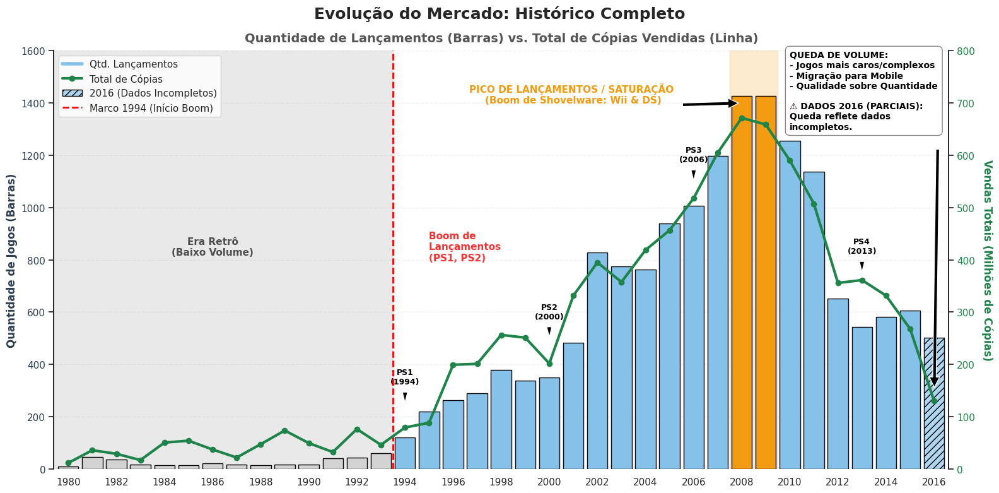

<br>

### **Detalhes Históricos: Consoles, Gerações e Regiões**

---

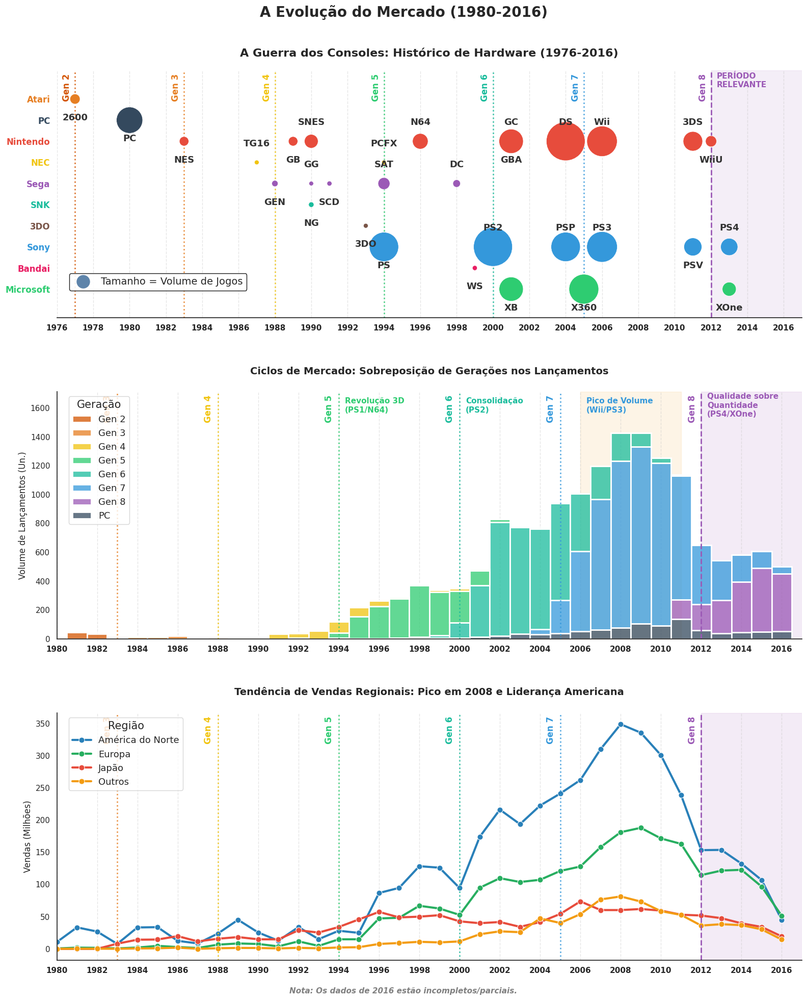

<br><br>

## 🔍 **B - Mercado Atual `(2012-2016)`**

---

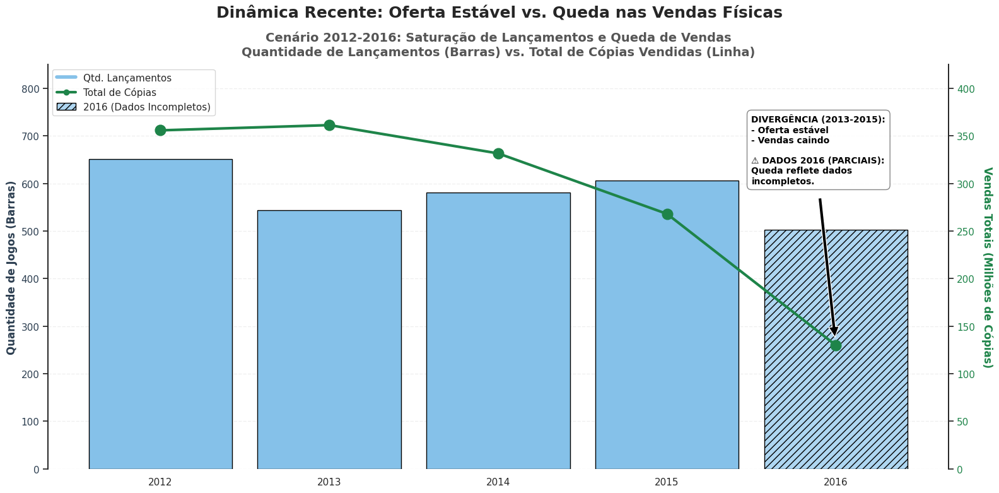

<br>

### **Detalhes Recentes: A 8ª Geração**

---

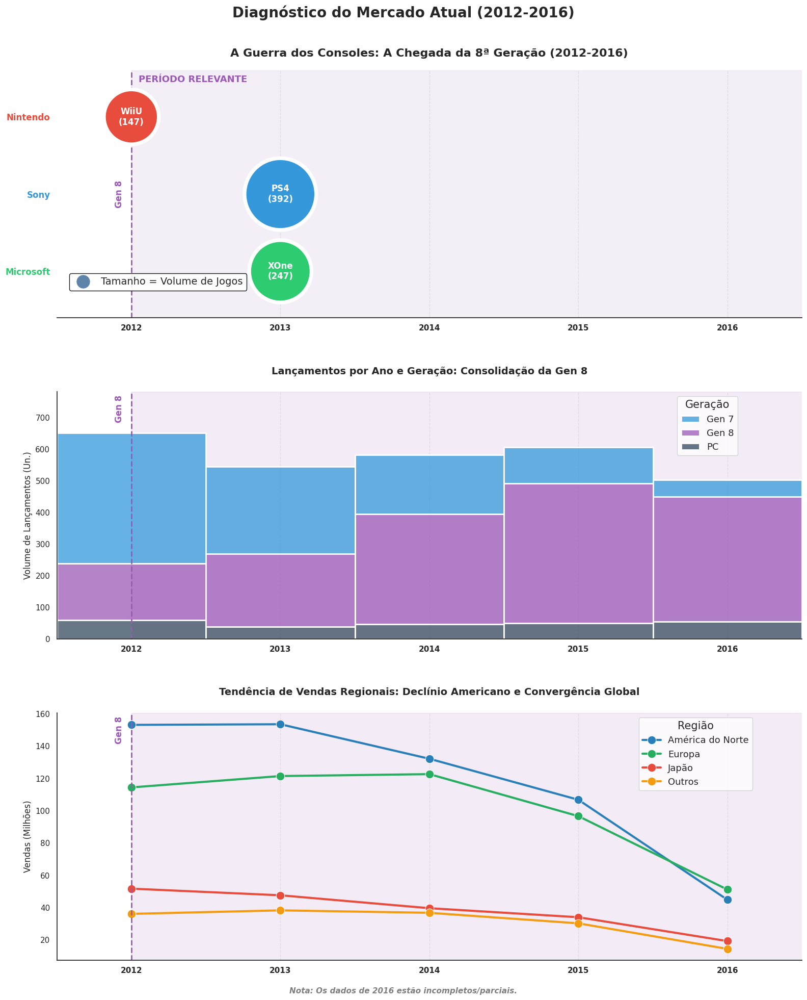

In [35]:
print('Gerando Dashboard 1: Evolução e Linha do Tempo...\n')
display(Markdown(f"# 📊 **Dashboard 1: Evolução do Mercado**"))
display(Markdown("<br>"))


# ---------------------------------------------------
# A - PANORAMA HISTÓRICO (1980 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🕰️ **A - Panorama Histórico `(1980-2016)`**"))
display(Markdown("---"))

# 1. Gráfico Principal (Barras + Linhas)
plotar_evolucao_mercado(
    df_input=df,
    x_limits=(1980, 2016),
    x_ticks=range(1980, 2017, 2), # De 2 em 2
    modo_zoom=False
)

# 2. Dashboard Detalhado (3 Gráficos)
gerar_dashboard_mercado(
    df_input=df, 
    titulo_secao="Detalhes Históricos: Consoles, Gerações e Regiões", 
    x_limits=(1976, 2017), 
    x_ticks=range(1976, 2017, 2), 
    modo_zoom=False
)

# ---------------------------------------------------
# B - MERCADO ATUAL (2012 - 2016)
# ---------------------------------------------------
display(Markdown(f"<br><br>"))
display(Markdown(f"## 🔍 **B - Mercado Atual `(2012-2016)`**"))
display(Markdown("---"))

# 1. Gráfico Principal (Zoom)
plotar_evolucao_mercado(
    df_input=df_relevante,
    x_limits=(2012, 2016),
    x_ticks=range(2012, 2017, 1), # De 1 em 1
    modo_zoom=True
)

# 2. Dashboard Detalhado (Zoom)
gerar_dashboard_mercado(
    df_input=df_relevante, 
    titulo_secao="Detalhes Recentes: A 8ª Geração", 
    x_limits=(2011.5, 2016.5), 
    x_ticks=range(2012, 2017, 1),
    modo_zoom=True
)

Gerando Dashboard 1: Evolução e Linha do Tempo...



# 📊 **Dashboard 1: Evolução do Mercado**

<br>

## 🕰️ **A - Panorama Histórico `(1980-2016)`**

---

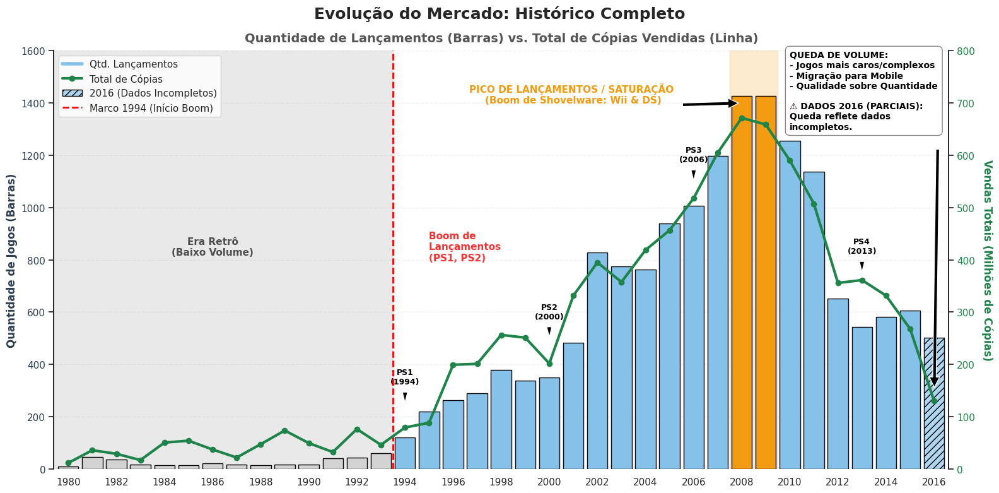

<br>

### **Detalhes Históricos: Consoles, Gerações e Regiões**

---

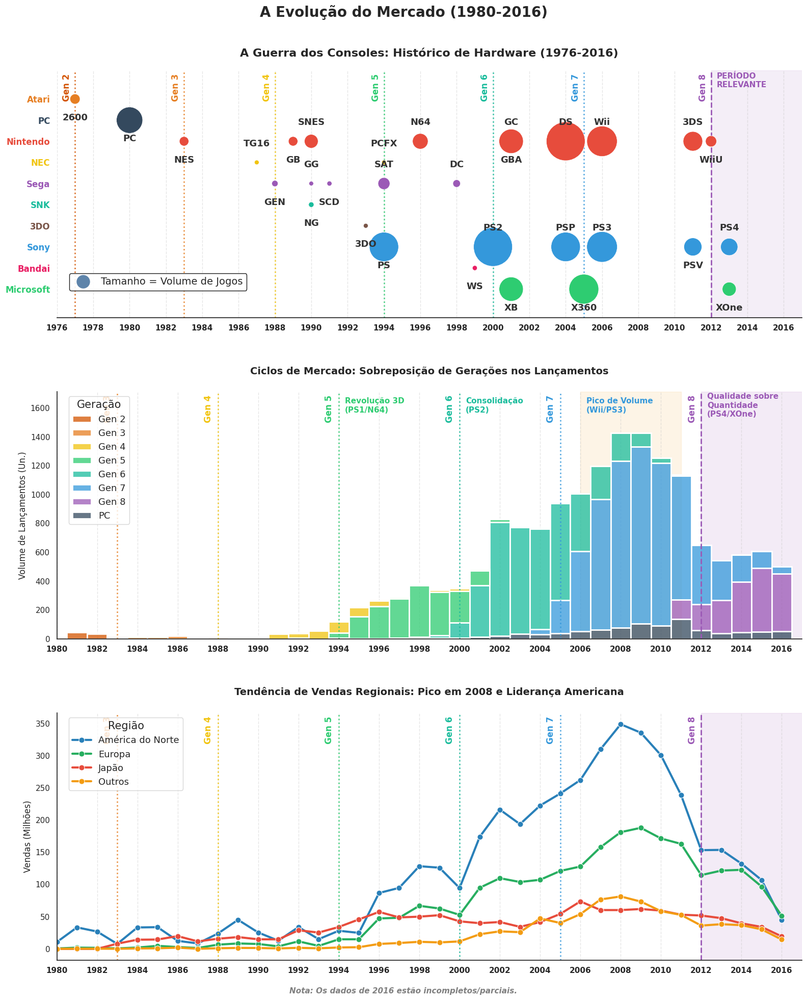

<br><br>

## 🔍 **B - Mercado Atual `(2012-2016)`**

---

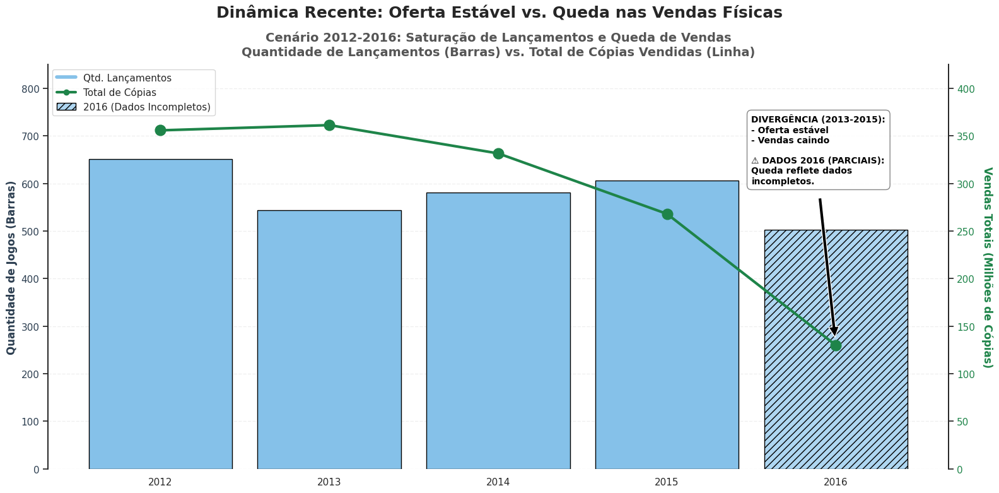

<br>

### **Detalhes Recentes: A 8ª Geração**

---

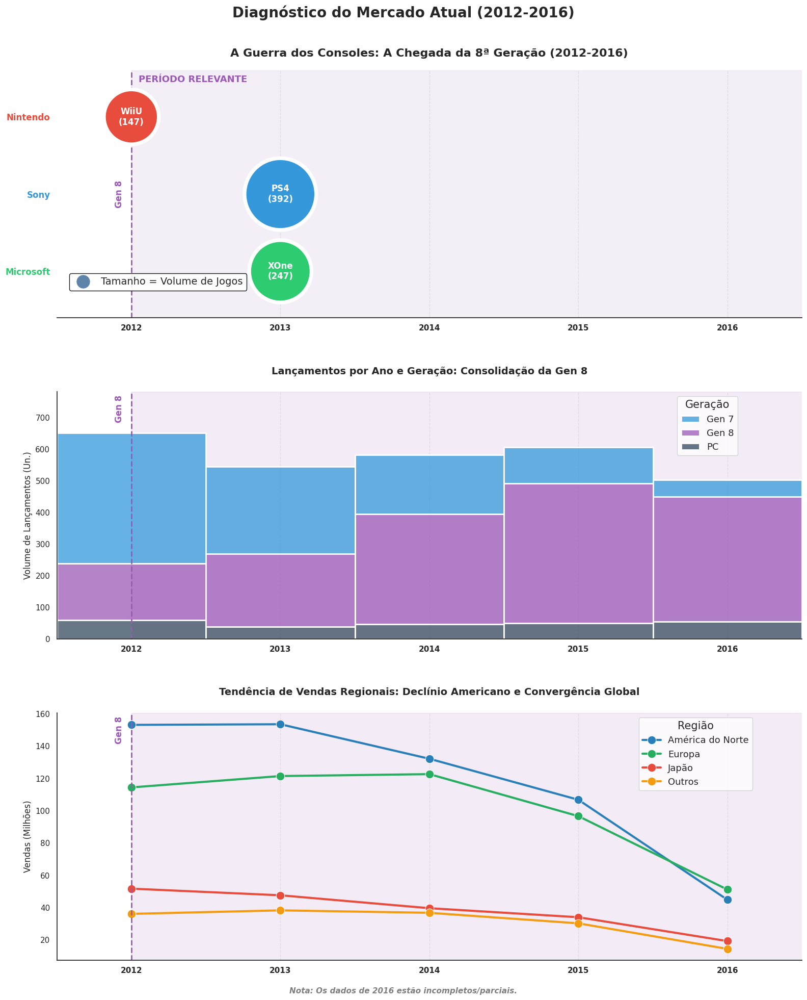

In [36]:
print('Gerando Dashboard 1: Evolução e Linha do Tempo...\n')
display(Markdown(f"# 📊 **Dashboard 1: Evolução do Mercado**"))
display(Markdown("<br>"))


# ---------------------------------------------------
# A - PANORAMA HISTÓRICO (1980 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🕰️ **A - Panorama Histórico `(1980-2016)`**"))
display(Markdown("---"))

# 1. Gráfico Principal (Barras + Linhas)
plotar_evolucao_mercado(
    df_input=df,
    x_limits=(1980, 2016),
    x_ticks=range(1980, 2017, 2), # De 2 em 2
    modo_zoom=False
)

# 2. Dashboard Detalhado (3 Gráficos)
gerar_dashboard_mercado(
    df_input=df, 
    titulo_secao="Detalhes Históricos: Consoles, Gerações e Regiões", 
    x_limits=(1976, 2017), 
    x_ticks=range(1976, 2017, 2), 
    modo_zoom=False
)

# ---------------------------------------------------
# B - MERCADO ATUAL (2012 - 2016)
# ---------------------------------------------------
display(Markdown(f"<br><br>"))
display(Markdown(f"## 🔍 **B - Mercado Atual `(2012-2016)`**"))
display(Markdown("---"))

# 1. Gráfico Principal (Zoom)
plotar_evolucao_mercado(
    df_input=df_relevante,
    x_limits=(2012, 2016),
    x_ticks=range(2012, 2017, 1), # De 1 em 1
    modo_zoom=True
)

# 2. Dashboard Detalhado (Zoom)
gerar_dashboard_mercado(
    df_input=df_relevante, 
    titulo_secao="Detalhes Recentes: A 8ª Geração", 
    x_limits=(2011.5, 2016.5), 
    x_ticks=range(2012, 2017, 1),
    modo_zoom=True
)

---

### 📊 Dashboard 2: **Análise Descritiva e Impacto nas Vendas**

*[⬆️ Ver código da função](#funcao_dash_2)*
<a id="dash_2"></a>

*Visualização detalhada de Volume (Contagem) e Impacto nas Vendas (Boxplot).*

Antes de investigar correlações complexas, **analisei a distribuição individual** de cada variável do dataset juntamente com o volume de lançamentos e vendas. Este "Raio-X" inicial é fundamental para entender a composição do mercado e justificar o corte temporal para a modelagem preditiva.

❓ **``Pergunta de Negócio:``**<br>
> 1.  **🧬 Identidade de Mercado:**
>       - Quais plataformas e fabricantes venceram a guerra dos consoles?
>       - Onde estão os maiores volumes de venda e como variam por região?
> 2.  **⭐ Qualidade e Público:**
>       - Como a crítica especializada e os jogadores avaliam os títulos?
>       - Quais gêneros e classificações etárias dominam?
> 3.  **💎 Estratégia Comercial:**
>       - Jogos em mais plataformas e ecossistemas vendem mais?
>       - O sucesso depende de exclusividade?
>       - Franquias consolidadas vendem mais que novas IPs?
>       - Estar no console líder aumenta lançamentos e vendas?


Para cada Dashboard dessa seção, analisarei o contraste entre:
* **A. Todo o Período (1980-2016):** A visão histórica completa.
* **B. Período Relevante (2012-2016):** O cenário atual (8ª Geração) para previsão de 2017.


##### **Parte 1: 🧬 Identidade de Mercado**

| Linha | Tema | Foco da Análise |
| :---: | :--- | :--- |
| **1** | **Plataformas & Ecossistemas** | Liderança de Catálogo vs. Força da Marca (Fabricante). |
| **2** | **Geração de Consoles** | Volume de lançamentos por Geração e Crescimento de Vendas. |
| **3** | **Ciclo & Vendas Globais** | Distribuição de Vendas (Histograma) e Idade do Console. |
| **4** | **Vendas Regionais (Ocidente)** | Distribuição de vendas na América do Norte (NA) e Europa (EU). |
| **5** | **Vendas Regionais (Oriente)** | Distribuição de vendas no Japão (JP) e Outras Regiões. |

##### **Parte 2: ⭐ Qualidade e Público**

| Linha | Tema | Foco da Análise |
| :---: | :--- | :--- |
| **1** | **Notas de Avaliação** | Distribuição de Notas da Crítica vs. Notas de Usuário. |
| **2** | **Grupos de Crítica** | Volume de jogos "Hits" vs. Impacto Financeiro (Vendas). |
| **3** | **Gêneros** | Saturação de Mercado (Concorrência) vs. Eficiência de Vendas. |
| **4** | **Classificação Etária** | Volume por ESRB vs. Potencial de Venda por idade. |

##### **Parte 3: 💎 Estratégia Comercial**

| Linha | Tema | Foco da Análise |
| :---: | :--- | :--- |
| **1** | **Alcance de Plataformas** | Em quantos consoles físicos o jogo é lançado? |
| **2** | **Alcance de Ecossistemas** | O jogo é multiplataforma (Sony+Microsoft)? |
| **3** | **Franquias** | Comparativo: Novas IPs vs. Marcas Consolidadas. |
| **4** | **Exclusividade** | Proporção de Exclusivos vs. O "Mito" de que vendem mais. |
| **5** | **Efeito Liderança** | Estar no console #1 aumenta o volume de lançamentos e vendas? |

Gerando Dashboard 2: Análise Comparativa por Blocos...


# 📊 **Dashboard 2: Análise Descritiva e Comparativa**

<br>

## 🧬 **Bloco 1: Identidade de Mercado**

> ## ***🕰️ A - Panorama Histórico Completo `(1980-2016)`***

---

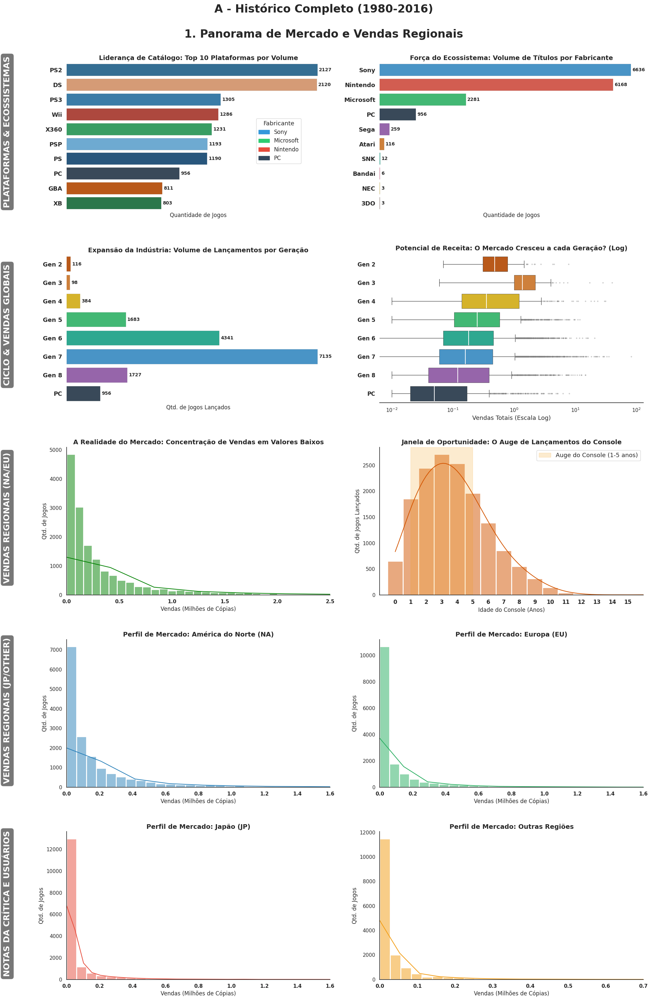

<br>

## 🧬 **Bloco 1: Identidade de Mercado**

> ## ***🔍 B - Mercado Atual `(2012-2016)` <br> *(Contém dados parciais do último ano)****

---

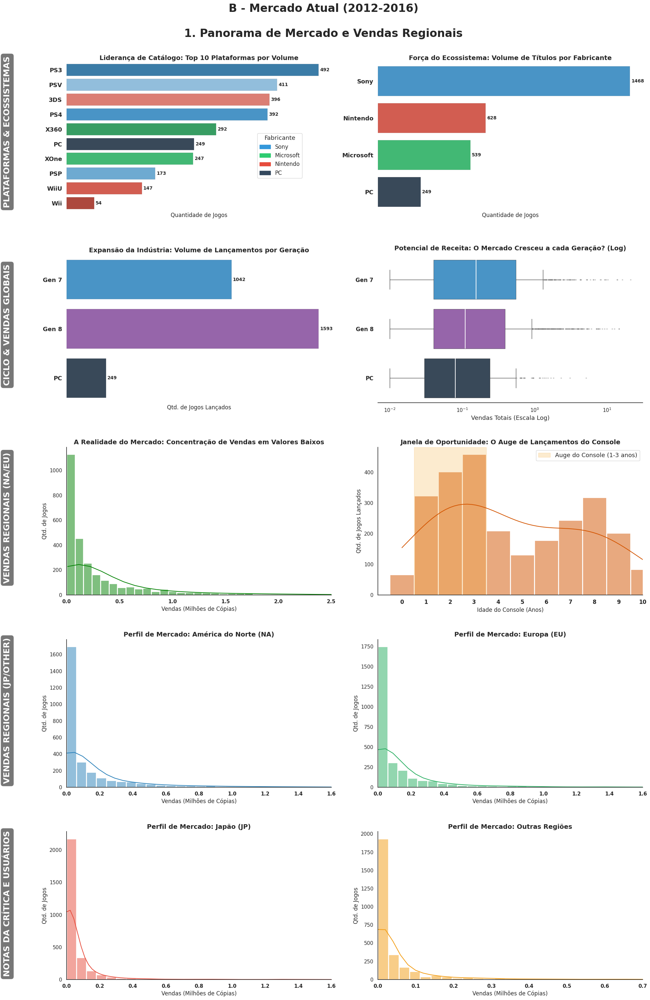

---

<br>

<br>

## ⭐ **Bloco 2: Qualidade e Público**

> ## ***🕰️ A - Panorama Histórico Completo `(1980-2016)`***

---

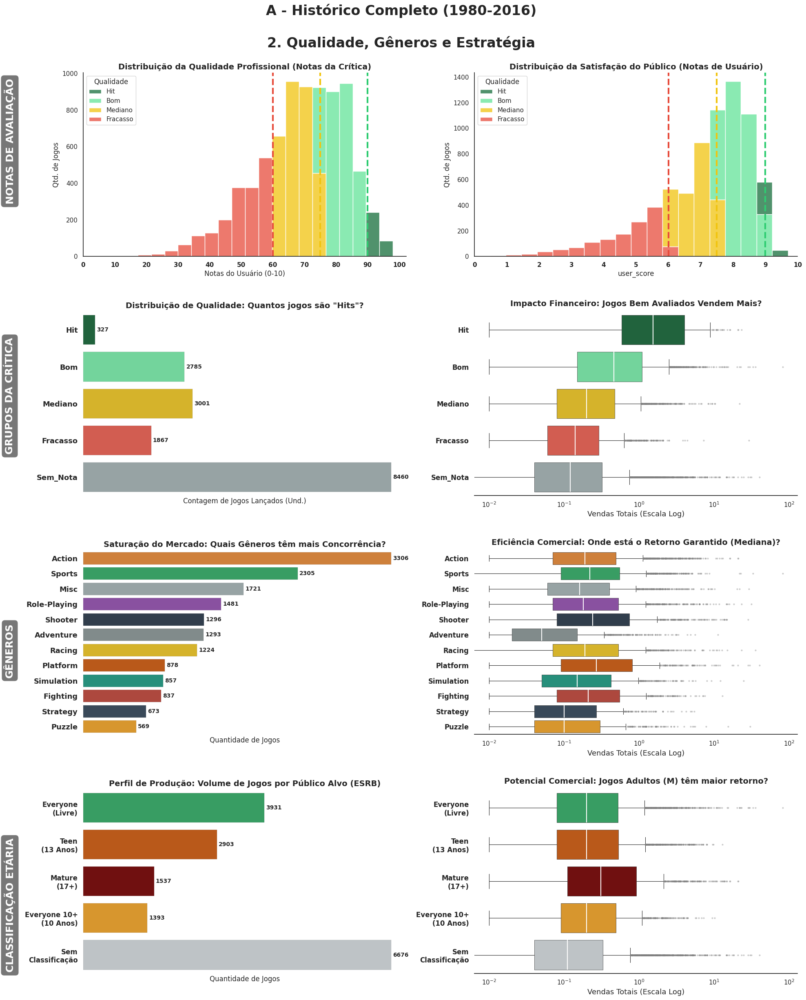

<br>

## ⭐ **Bloco 2: Qualidade e Público**

> ## ***🔍 B - Mercado Atual `(2012-2016)` <br> *(Contém dados parciais do último ano)****

---

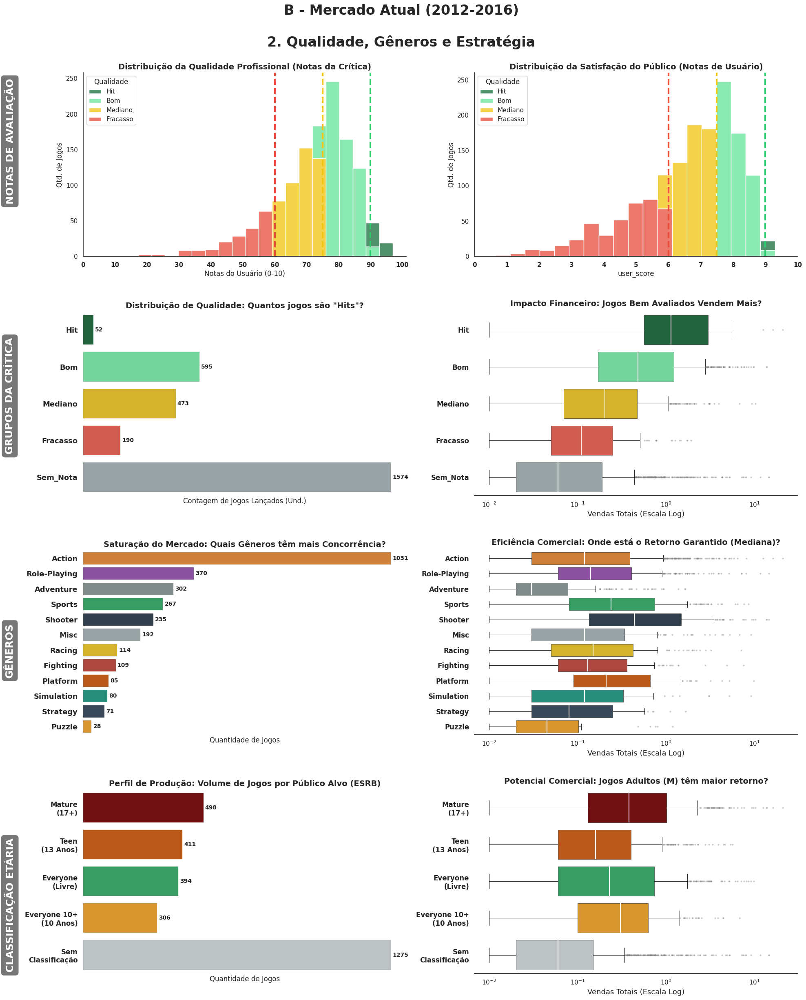

---

<br>

<br>

## 💎 **Bloco 3:  Estratégia Comercial**

> ## ***🕰️ A - Panorama Histórico Completo `(1980-2016)`***

---

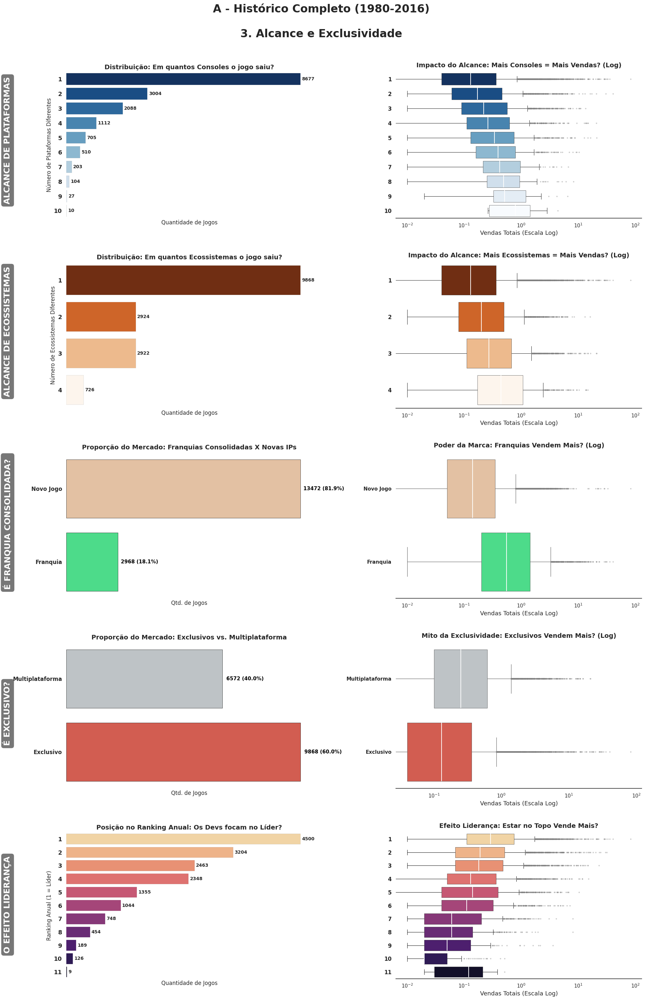

<br>

## 💎 **Bloco 3:  Estratégia Comercial**

> ## ***🔍 B - Mercado Atual `(2012-2016)` <br> *(Contém dados parciais do último ano)****

---

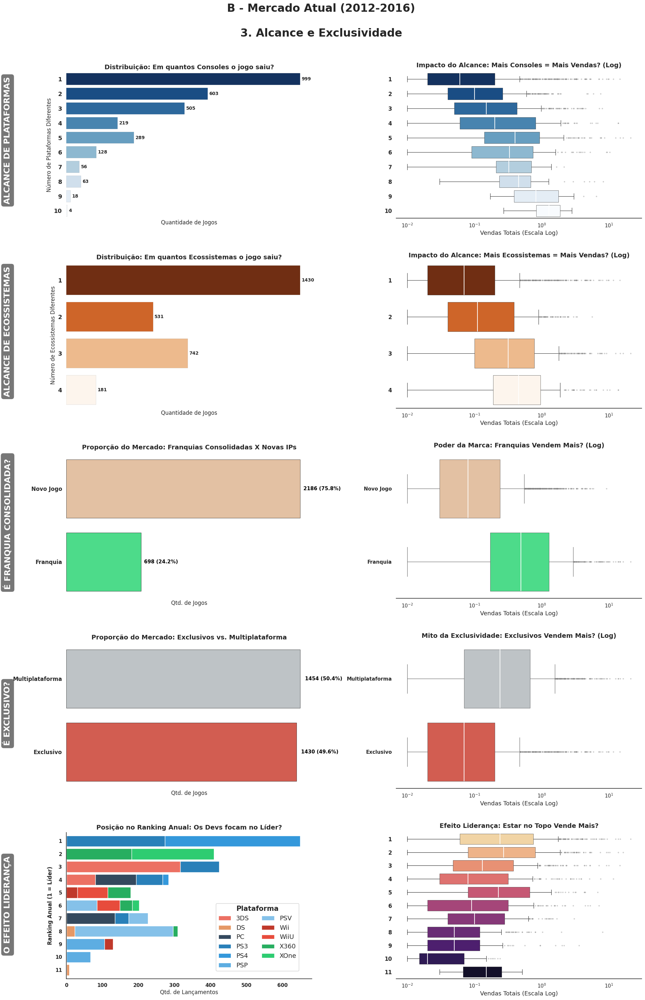

---

In [37]:
print('Gerando Dashboard 2: Análise Comparativa por Blocos...')

display(Markdown(f"# 📊 **Dashboard 2: Análise Descritiva e Comparativa**"))

# Títulos para exibição em Markdown
titulo_A_md = "🕰️ A - Panorama Histórico Completo `(1980-2016)`"
titulo_B_md = "🔍 B - Mercado Atual `(2012-2016)` <br> *(Contém dados parciais do último ano)*"

# ==============================================================================
# 🧬 1. COMPARAÇÃO: MERCADO E IDENTIDADE
# ==============================================================================
# 1A - Histórico
gerar_bloco_mercado(df, titulo_A_md, modo_zoom=False)

# 1B - Atual
gerar_bloco_mercado(df_relevante, titulo_B_md, modo_zoom=True)

display(Markdown("---")) 
display(Markdown("<br>"))


# ==============================================================================
# ⭐ 2. COMPARAÇÃO: QUALIDADE E PÚBLICO
# ==============================================================================
# 2A - Histórico
gerar_bloco_qualidade(df, titulo_A_md, modo_zoom=False)

# 2B - Atual
gerar_bloco_qualidade(df_relevante, titulo_B_md, modo_zoom=True)

display(Markdown("---")) 
display(Markdown("<br>"))


# ==============================================================================
# 💎 3. COMPARAÇÃO: ESTRATÉGIA COMERCIAL
# ==============================================================================
# 3A - Histórico
gerar_bloco_estrategia(df, titulo_A_md, modo_zoom=False)

# 3B - Atual
gerar_bloco_estrategia(df_relevante, titulo_B_md, modo_zoom=True)

display(Markdown("---")) 

In [38]:
# ---------------------------------------------------------
# 🕵️ INVESTIGAÇÃO RÁPIDA
# ---------------------------------------------------------
# Investigando o Ranking 5 do Efeito Liderança (2012-2016):
# No gráfico 'Efeito Liderança' verifiquei que o Ranking 5 possui alto volume de vendas. 
# O que está acontecendo? Quais esses jogos e plataformas?


display(Markdown("### 🕵️ Investigação da Anomalia: Quem é o Rank 5?"))

# Selecionando o Rank 5
rank_5_games = df_relevante[df_relevante['platform_rank'] == 5]

# Comparando a mediana do Rank 1 com Rank 5
print('> Comparando mediana do Rank 1 com o Rank 5:')
mediana_r1 = df_relevante[df_relevante['platform_rank'] == 1]['total_sales'].median()
mediana_r5 = rank_5_games['total_sales'].median()

print(f"Mediana de Vendas Rank 1: {mediana_r1:.2f}M")
print(f"Mediana de Vendas Rank 5: {mediana_r5:.2f}M")

# Quais são as plataformas nesse Rank?
print("\n> Plataformas que ocuparam o Rank 5 (2012-2016):")
print(rank_5_games['platform'].value_counts())

# Quais são os top jogos que puxaram essa mediana para cima?
print(f"\n> Top 5 Jogos que salvaram o Rank 5 ({len(rank_5_games)} jogos no total para o período):")
print(rank_5_games[['name', 'platform', 'year_of_release', 'total_sales']].sort_values('total_sales', ascending=False).head(5))

# Verifiquei que os top 5 jogos que puxam a média para cima são os jogos Just Dance 4, Splatoon, Super Mario 3D world, COD Warfare e Super Mario Maker, e as plataformas Wii, WiiU e X360

### 🕵️ Investigação da Anomalia: Quem é o Rank 5?

> Comparando mediana do Rank 1 com o Rank 5:
Mediana de Vendas Rank 1: 0.24M
Mediana de Vendas Rank 5: 0.23M

> Plataformas que ocuparam o Rank 5 (2012-2016):
platform
WiiU    84
X360    63
Wii     31
Name: count, dtype: int64

> Top 5 Jogos que salvaram o Rank 5 (178 jogos no total para o período):
                               name platform  year_of_release  total_sales
116                    Just Dance 4      Wii             2012         6.76
246                        Splatoon     WiiU             2015         4.44
259            Super Mario 3D World     WiiU             2013         4.32
262  Call of Duty: Advanced Warfare     X360             2014         4.28
422               Super Mario Maker     WiiU             2015         3.21


In [39]:
# ==============================================================================
# 🕵️ INVESTIGAÇÃO PROFUNDA: QUEM ESTÁ EM CADA POSIÇÃO DO RANKING? (1 a 11)
# ==============================================================================

# Para obter mais insights, ao invés de só visualizar o Ranking 5, vou visualizar cada uma das posições do Ranking em detalhe 

# Garantir ordem correta (1, 2, 3...)
ranks_disponiveis = sorted(df_relevante['platform_rank'].unique().astype(int))

print(f"{'='*80}")
print(f"RAIO-X DO RANKING DE PLATAFORMAS (2012-2016)")
print(f"Objetivo: Entender a relação entre Volume vs. Eficiência em cada nível.")
print(f"{'='*80}\n")

for rank in ranks_disponiveis:
    # 1. Filtra o subset do Rank atual
    df_rank = df_relevante[df_relevante['platform_rank'] == rank]
    
    # 2. Métricas Rápidas
    volume = len(df_rank)
    mediana = df_rank['total_sales'].median()
    total_rev = df_rank['total_sales'].sum()
    
    # 3. Cabeçalho Bonito
    print(f"🏆 RANK {rank}")
    print(f"📊 Volume: {volume} jogos | 💰 Mediana: {mediana:.2f}M | 🌎 Total Vendas: {total_rev:.2f}M")
    print("-"
           * 80)
    
    # 4. Quais consoles ocuparam essa posição?
    # (Ex: Em 2013 o Rank 1 foi PS3, em 2015 foi PS4...)
    print("📌 Plataformas que ocuparam a posição:")
    print(df_rank['platform'].value_counts().to_string())
    
    # 5. Quem carregou esse Rank nas costas? (Top 3 Jogos)
    print("\n🚀 Top 3 'Best Sellers' desta posição:")
    cols_show = ['name', 'platform', 'year_of_release', 'total_sales']
    print(df_rank[cols_show].sort_values('total_sales', ascending=False).head(3).round(2))
    
    # Separador visual
    print("\n" + "="*80 + "\n")

RAIO-X DO RANKING DE PLATAFORMAS (2012-2016)
Objetivo: Entender a relação entre Volume vs. Eficiência em cada nível.

🏆 RANK 1
📊 Volume: 649 jogos | 💰 Mediana: 0.24M | 🌎 Total Vendas: 508.75M
--------------------------------------------------------------------------------
📌 Plataformas que ocuparam a posição:
platform
PS4    376
PS3    273

🚀 Top 3 'Best Sellers' desta posição:
                          name platform  year_of_release  total_sales
16          Grand Theft Auto V      PS3             2013        21.05
31   Call of Duty: Black Ops 3      PS4             2015        14.63
34  Call of Duty: Black Ops II      PS3             2012        13.79


🏆 RANK 2
📊 Volume: 409 jogos | 💰 Mediana: 0.27M | 🌎 Total Vendas: 328.68M
--------------------------------------------------------------------------------
📌 Plataformas que ocuparam a posição:
platform
XOne    228
X360    181

🚀 Top 3 'Best Sellers' desta posição:
                          name platform  year_of_release  total_sales
23

### 🔣 **Resumo Estatístico**

In [40]:
# ESTATÍSTICAS DESCRITIVAS (Contexto Numérico)
display(Markdown("### **Resumo Estatístico Descritivo (Contexto Numérico)**"))
# Preparando os dados transpostos e com percentis selecionados para melhor entendimento
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
percentis = [0.25, 0.5, 0.75, 0.90, 0.95, 0.99]

# Gera estatísticas transpostas para cada período
stats_full = df[numerical_cols].describe(percentiles=percentis).T
stats_rel = df_relevante[numerical_cols].describe(percentiles=percentis).T


# Exibição da tabela chamando função

# Período Completo
estilizar_tabela_horizontal(stats_full, "Histórico Completo (1980 - 2016)", cor_palette='Blues')

print("\n")

# Período Relevante
estilizar_tabela_horizontal(stats_rel, "Período Relevante (2012 - 2016)", cor_palette='Greens')

### **Resumo Estatístico Descritivo (Contexto Numérico)**

### 📊 Histórico Completo (1980 - 2016)

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
year_of_release,16440,2006.49,5.87,1980.00,2003.00,2007.00,2010.00,2014.00,2015.00,2016.00,2016.00
na_sales,16440,0.26,0.82,0.00,0.00,0.08,0.24,0.61,1.06,2.81,41.36
eu_sales,16440,0.15,0.51,0.00,0.00,0.02,0.11,0.35,0.63,1.95,28.96
jp_sales,16440,0.08,0.31,0.00,0.00,0.00,0.04,0.18,0.36,1.28,10.22
other_sales,16440,0.05,0.19,0.00,0.00,0.01,0.03,0.10,0.20,0.64,10.57
critic_score,7980,68.99,13.92,13.00,60.00,71.00,79.00,85.00,89.00,94.00,98.00
user_score,7460,7.13,1.50,0.00,6.40,7.50,8.20,8.70,8.90,9.20,9.70
total_sales,16440,0.54,1.56,0.00,0.06,0.17,0.47,1.21,2.04,5.48,82.54
platform_year,16440,2001.25,7.66,1977.00,2000.00,2004.00,2006.00,2011.00,2011.00,2013.00,2013.00
platform_age,16440,5.24,6.38,0.00,2.00,4.00,6.00,8.00,24.00,33.00,36.00


### 📊 Período Relevante (2012 - 2016)

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
year_of_release,2884,2013.92,1.41,2012.00,2013.00,2014.00,2015.00,2016.00,2016.00,2016.00,2016.00
na_sales,2884,0.20,0.57,0.00,0.00,0.03,0.17,0.51,0.90,2.60,9.66
eu_sales,2884,0.18,0.51,0.00,0.00,0.03,0.14,0.41,0.77,2.18,9.09
jp_sales,2884,0.07,0.24,0.00,0.00,0.01,0.05,0.14,0.26,0.87,4.39
other_sales,2884,0.05,0.16,0.00,0.00,0.01,0.04,0.13,0.24,0.68,3.96
critic_score,1310,72.24,12.69,13.00,66.00,74.00,81.00,86.00,88.55,93.00,97.00
user_score,1529,6.64,1.57,0.20,5.80,7.00,7.80,8.30,8.50,8.90,9.30
total_sales,2884,0.50,1.25,0.01,0.04,0.12,0.43,1.19,2.09,5.90,21.05
platform_year,2884,2006.77,8.82,1980.00,2005.00,2011.00,2012.00,2013.00,2013.00,2013.00,2013.00
platform_age,2884,7.15,8.72,0.00,2.00,4.00,8.00,10.00,34.00,36.00,36.00


### 💡 **Principais Descobertas da Análise Descritiva Inicial**

A análise descritiva e visual dos dados históricos (1980-2016) e do período relevante (2012-2016) revelou a estrutura fundamental do mercado de videogames:<br><br>

> **``1. Distribuição de Vendas: O Mercado é Assimétrico``**

  * **A regra do "Tudo ou Nada":**
    * A mediana de vendas globais é de apenas **0.17 milhões**. Isso significa que mais de 50% dos jogos vendem menos que 170 mil cópias.
  * **Dependência de Blockbusters:**
    * O desvio padrão alto (1.55) e o máximo de **82.54 milhões** (*Wii Sports*) confirmam que o lucro da indústria é sustentado por *outliers* extremos, e não pela média.<br><br>


> **``2. O Perfil de Qualidade e Público``**

  * **Crítica vs. Usuário:**
    * A nota média da crítica (**69/100**) é ligeiramente inferior e mais dispersa que a nota média dos usuários (**7.1/10**), sugerindo que o público tende a ser mais generoso ou polarizado.
  * **Escassez de Qualidade:**
    * Jogos classificados como **"Hit" (Nota 90+)** são raríssimos (menos de 5% do total), mas, como veremos, são responsáveis por uma fatia desproporcional da receita.
  * **Mudança de Perfil Etário:**
    * Para o período histórico, a categoria etária com maior volume de jogos era a 'Livre'. 
    * Agora percebe-se que o gráfico se inverteu para o período relevante, com maior volume de lançamentos e vendas para a categoria **'Mature (17+)'**, revelando uma **'adultização'** dos jogos. <br><br>


> **``3. Estratégia de Lançamento``**

  * **Ciclo de Vida:**
    * A maioria esmagadora dos jogos é lançada quando o console tem entre **2 e 6 anos** de vida (`platform_age`).
    * Jogos de lançamento (idade 0) ou de fim de vida (\>8 anos) são minoria.
  * **Exclusividade:**
    * Cerca de **60%** dos títulos são exclusivos de um ecossistema (`is_exclusive` = 1), mas a análise visual sugere que o volume de vendas individual desses jogos é menor que o dos multiplataforma.
  * **Franquias:**
    * Apenas **18%** dos jogos pertencem a grandes franquias consolidadas (`is_long_running`), indicando que o mercado é inundado por tentativas de novas IPs, mas poucas se estabelecem.<br><br>

> 🎯 **``Conclusão para a Próxima Etapa:``**

> Dado que o mercado mudou drasticamente após 2011 (com o fim da Era de Ouro do Wii/DS e o início da Era Moderna), a análise preditiva para 2017 **deve ignorar o ruído histórico**.
> 
> O **corte temporal** em **``2012``** é necessário  para capturar o comportamento do consumidor atual.

---

## ♟️ **Análise Estratégica Completa**

### 📊 **Volume de Lançamentos vs. Volume de Vendas**

*[⬆️ Ver código da função](#funcao_dash_1)*
<a id="dash_1"></a>

❓ **``Pergunta de Negócio:``**<br>
> *"Quantos jogos foram lançados e qual o volume de vendas por ano? Os dados de cada período são significativos?"*

Para entender a verdadeira história do mercado, não basta olhar apenas para a **quantidade de jogos produzidos** (produtividade da indústria). Precisamos cruzar esse dado com o **volume total de vendas** (resposta do consumidor).

Nesta análise, agrupei os dados por `'year_of_release'` para visualizar duas dimensões:
1.  **Barras (Volume):** A contagem de jogos lançados (`'name'`).
2.  **Linha (Financeiro):** A soma das vendas globais (`'total_sales'`).

Isso nos permitirá identificar se o mercado encolheu ou se apenas mudou sua estratégia de produção ao longo das décadas.

# **📊 1. Volume de Lançamentos vs. Volume de Vendas**

<br>

## 🕰️ **A - Panorama Histórico `(1980-2016)`**

---

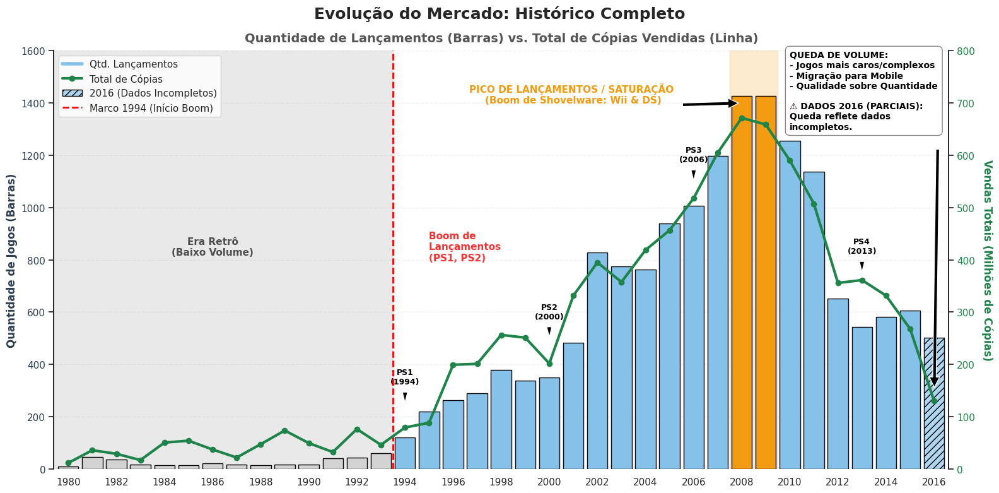

## 🔍 **B - Mercado Atual `(2012-2016)`**

---

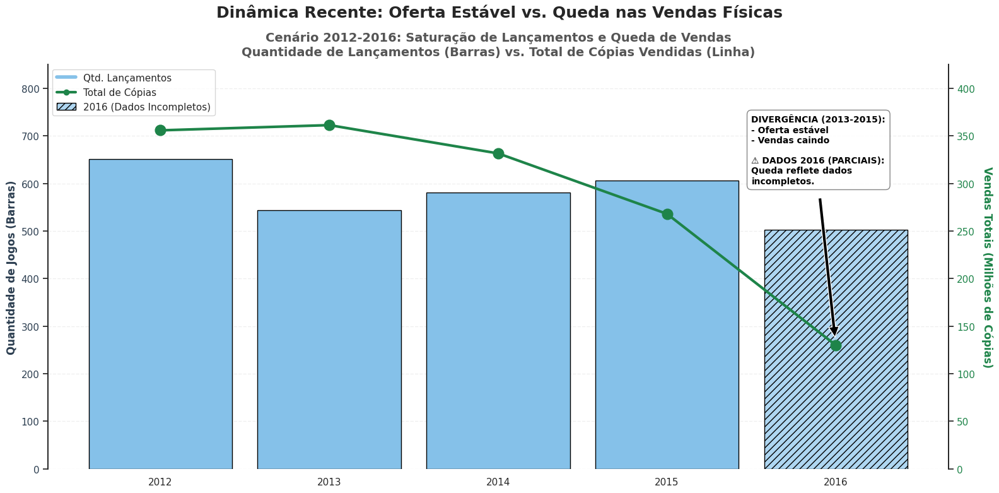

In [41]:
display(Markdown(f"# **📊 1. Volume de Lançamentos vs. Volume de Vendas**"))
display(Markdown("<br>"))

# ---------------------------------------------------
# A - PANORAMA HISTÓRICO (1980 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🕰️ **A - Panorama Histórico `(1980-2016)`**"))
display(Markdown("---"))

plotar_evolucao_mercado(
    df_input=df,
    x_limits=(1980, 2016),
    x_ticks=range(1980, 2017, 2), # De 2 em 2
    modo_zoom=False
)

# ---------------------------------------------------
# B - MERCADO ATUAL (2012 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🔍 **B - Mercado Atual `(2012-2016)`**"))
display(Markdown("---"))

plotar_evolucao_mercado(
    df_input=df_relevante,
    x_limits=(2012, 2016),
    x_ticks=range(2012, 2017, 1), # De 1 em 1
    modo_zoom=True
)

# ----------------------
# print('Quantidade de Jogos Lançados por Ano:\n', jogos_por_ano.T)

# Pergunta:
# Os dados de todos os períodos são significativos?

# Resposta:
# Não. Antes de 1994 (era pré-PlayStation) o volume é muito baixo.
# O pico foi 2008/2009, e depois caiu (devido ao aumento da complexidade/custo de desenvolvimento e jogos mobile).
# Após 2012 foi o período de inflexão, onde houve queda de volume

#### 💡 **Conclusões: Volume de Lançamentos vs. Volume de Vendas**

❓ **``Pergunta de Negócio:``**<br>
> *"Quantos jogos foram lançados e qual o volume de vendas por ano? Os dados de cada período são significativos?"*

👉 **`Resposta:`**
> O gráfico revela uma **divergência histórica** importante: o volume de lançamentos caiu drasticamente na última década, mas a receita de vendas se manteve sólida.

💡 **``Análise detalhada:``**

1.  **``A "Bolha" de 2008-2009 (O Fenômeno Shovelware):``**
    * **Observei** o pico histórico de lançamentos (barras laranjas) impulsionado pelo sucesso do **Wii** e **DS**.
    * *Insight:* Esse período foi marcado por uma enxurrada de jogos casuais de baixo orçamento ("shovelware"). Embora a quantidade de jogos fosse alta, a qualidade média era menor.

2.  **``A Queda de Volume vs. Manutenção de Receita:``**
    * Após 2011, o número de lançamentos despencou (migração do público casual para o Mobile e aumento da complexidade de desenvolvimento AAA).
    * **Contudo**, a linha verde (Vendas Totais) **não caiu na mesma proporção**.
    * *Conclusão:* O mercado se tornou mais "eficiente": lança-se menos jogos hoje, mas os títulos que restaram vendem muito mais individualmente e com maior qualidade.

3.  **``Definição de Período Relevante: (Corte em 2012)``**
    * Devido a essa mudança estrutural, os dados da "Era Shovelware" (2006-2010) não refletem a realidade atual.
    * Identifiquei que **2012** marca o ponto de inflexão e estabilização do mercado. Portanto, para a previsão de 2017, utilizarei dados apenas de **2012 em diante**, garantindo que a análise foque no cenário atual da indústria.

---

### [📊 **Vendas de Jogos por Plataforma**](#toc0_3)

*[⬆️ Ver código da função](#funcao_plotar_vendas)*
<a id="secao_vendas"></a>

❓ **``Pergunta de Negócio:``**<br>
> *"Quais as plataformas com as maiores vendas e como a distribuição por ano mudou?"*

- Para responder a esta pergunta, agrupei os dados por platform e somei a `'total_sales'` para obter uma visão geral do sucesso histórico de cada console.
- O gráfico de barras horizontal (Top 20) permite visualizar rapidamente quais plataformas dominaram o mercado em termos de vendas de software ao longo de todo o período (1980-2016).

# **📊 2. Vendas de Jogos por Plataformas**

<br>

## 🕰️ **A - Panorama Histórico `(1980-2016)`**

---

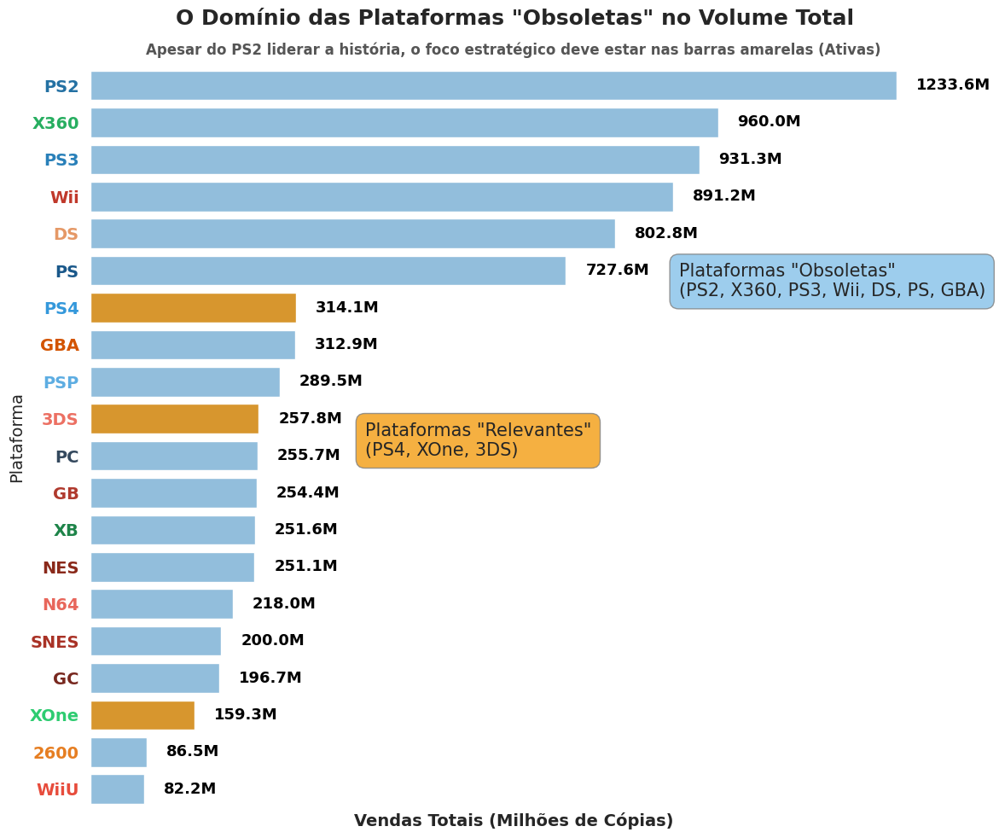

,Vendas Totais (Milhões),Market Share (%),% Acumulado
platform,,,
PS2,"1,233.56",14.00%,14.0%
X360,959.99,10.89%,24.9%
PS3,931.33,10.57%,35.5%
Wii,891.18,10.11%,45.6%
DS,802.76,9.11%,54.7%
PS,727.58,8.26%,62.9%
PS4,314.14,3.56%,66.5%
GBA,312.88,3.55%,70.0%
PSP,289.53,3.29%,73.3%


<br>

## 🔍 **B - Mercado Atual `(2012-2016)`**

---

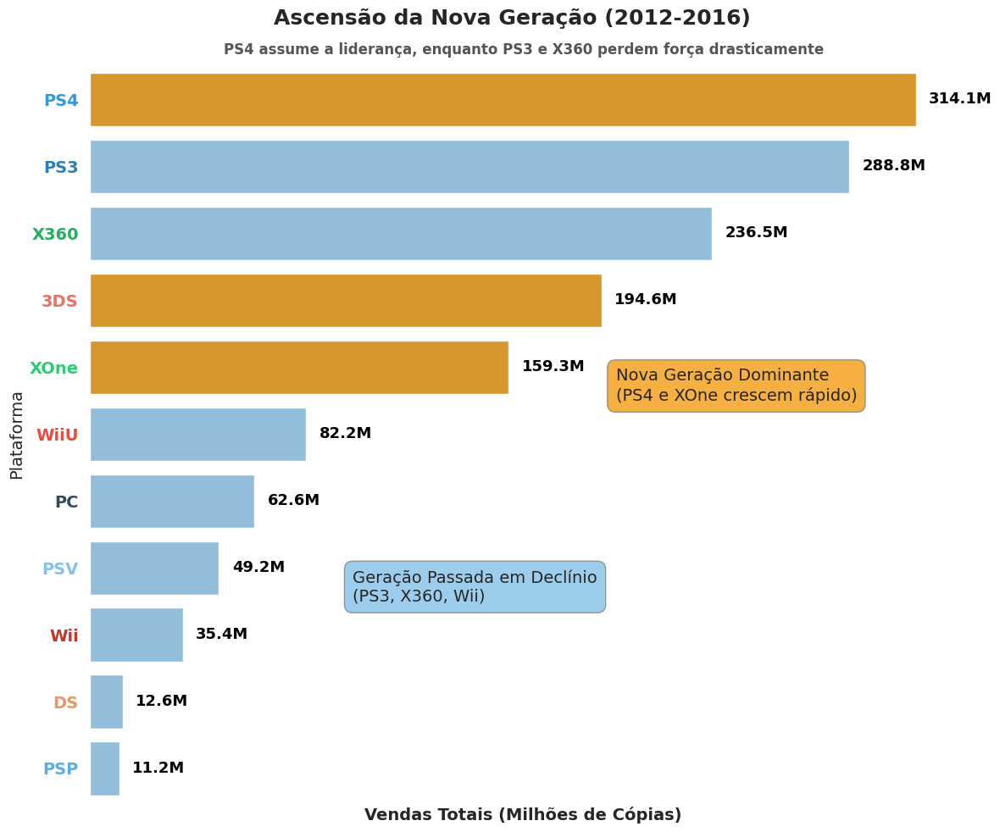

,Vendas Totais (Milhões),Market Share (%),% Acumulado
platform,,,
PS4,314.14,21.72%,21.7%
PS3,288.78,19.96%,41.7%
X360,236.54,16.35%,58.0%
3DS,194.61,13.45%,71.5%
XOne,159.32,11.01%,82.5%
WiiU,82.19,5.68%,88.2%
PC,62.57,4.33%,92.5%
PSV,49.18,3.40%,95.9%
Wii,35.37,2.45%,98.4%


In [42]:
# ==========================================
# 2. Vendas de Jogos por Plataformas
# ==========================================

display(Markdown(f"# **📊 2. Vendas de Jogos por Plataformas**"))
display(Markdown("<br>"))

# Chamando as Funções
# ---------------------------------------------------
# A - PANORAMA HISTÓRICO (1980 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🕰️ **A - Panorama Histórico `(1980-2016)`**"))
display(Markdown("---"))

plotar_vendas_por_plataforma(
    df_input=df, 
    modo_zoom=False
)

display(Markdown("<br>"))

# ---------------------------------------------------
# B - MERCADO ATUAL (2012 - 2016)
# ---------------------------------------------------
display(Markdown(f"## 🔍 **B - Mercado Atual `(2012-2016)`**"))
display(Markdown("---"))

# 2. Para o Período Relevante (2012-2016)
plotar_vendas_por_plataforma(
    df_input=df_relevante, 
    modo_zoom=True
)

#### 💡 **Conclusões: Vendas de Jogos por Plataformas**

❓ **``Pergunta de Negócio:``**<br>
> *"Quais as plataformas com as maiores vendas e como a distribuição por ano mudou?"*

O gráfico acima mostra os "vencedores" de todos os tempos e de nosso período relevante.

<br>

💡 **``Análise do gráfico:``**
- A descoberta mais importante é que todas as **5 maiores plataformas (`PS2`, `X360`, `PS3`, `Wii` e `DS`) são**<br>
**gerações passadas (obsoletas)**, o que reforça a ideia de que não devemos usar todos os dados históricos para prever o futuro.
- Apesar do `PS2` liderar a história, o foco atual deve ser nas plataformas relevantes (`PS4`, `XOne`, `3DS` )

---

### 🔄 **Dinâmica de Mercado: Ciclo de Vida e Sustentabilidade**

#### ⏳ **Visão Geral e Longevidade (O Contexto)**

*[⬆️ Ver código da função](#funcao_analisar_ciclo)*
<a id="secao_ciclo"></a>

Após identificar os consoles mais vendidos na história (Análise 2), o próximo passo é entender o seu "ciclo de vida" e a janela de oportunidade de cada um.<br>

❓ **``Pergunta de Negócio:``**<br>
> *"Qual a relação entre a longevidade de um console e a capacidade de manter um ecossistema ativo de lançamentos?"*

De forma mais específica, ele responde:

1.  **``Sobre Ciclo de Vida do Produto:``**
    > *Qual é a expectativa média de vida útil de um console de sucesso?*
      * Visualizamos que os líderes duram entre 10 a 12 anos.<br><br>
    > *Quanto tempo dura a "transição de gerações"?*
      * O gráfico de Gantt mostra claramente a sobreposição de ~3 a 4 anos onde consoles antigos e novos coexistem.<br><br>

2.  **``Sobre Saúde do Ecossistema (Apoio das Desenvolvedoras):``**
    > *Volume total é apenas questão de tempo?* 
      * Não. A tabela prova que o **DS** gerou mais jogos em 10 anos do que o **PC** gerou em 30 anos acumulados no dataset, indicando uma "intensidade" de produção muito maior).<br><br>
    > *O fracasso é visível na oferta de produtos?*
      * Sim. A baixa densidade do **Wii U** — apenas 29 jogos/ano — responde por que ele não conseguiu reter usuários: faltou software.<br><br>

3.  **``Sobre a Competição Recente (2012-2016):``**
    > *Quem largou na frente na nova geração?*
      * A densidade superior do **PS4** frente ao **Xbox One** mostra que a Sony garantiu apoio mais rápido das *third-parties* no início do ciclo.
  
Os gráficos abaixo apresentam a duração de cada console, bem como a ascensão, o pico e a queda de cada geração.

### ⏳ **3.1. Linha do Tempo: Ciclo de Vida das Plataformas**

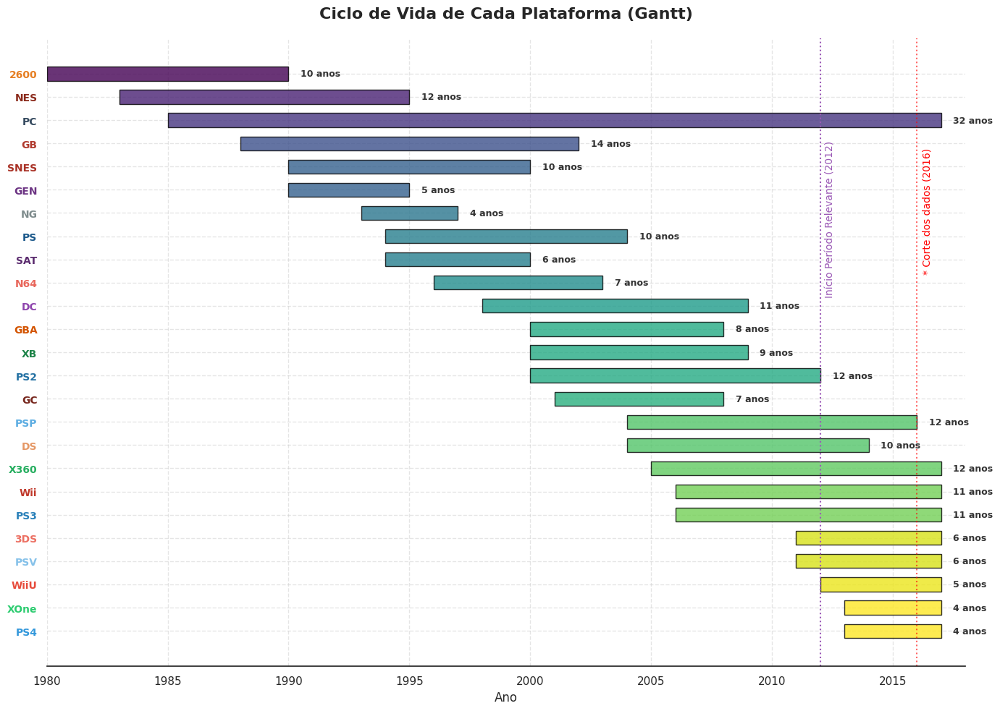

### 🔥 **Tabela Detalhada do Ciclo de Vida: Densidade e Longevidade**

,Primeiro Lançamento,Último Lançamento,Total de Jogos,Tempo de Vida (Anos),Média Jogos/Ano
platform,,,,,
DS,2004,2013,"2,120",10 anos,212.0
PS2,2000,2011,"2,127",12 anos,177.2
PS,1994,2003,"1,190",10 anos,119.0
PS3,2006,2016,"1,305",11 anos,118.6
Wii,2006,2016,"1,286",11 anos,116.9
X360,2005,2016,"1,231",12 anos,102.6
GBA,2000,2007,811,8 anos,101.4
PSP,2004,2015,"1,193",12 anos,99.4
PS4,2013,2016,392,4 anos,98.0


In [43]:
# ==========================================
# 3.1 Ciclo de Vida das Plataformas (Gantt)
# ==========================================
# Chamando função com o mínimo de jogos = 10 para não poluir
analisar_ciclo_vida_consoles(df, min_jogos=10)

👉 **``Conclusões: Ciclo de Vida das Plataformas e Densidade de Lançamentos``**

A análise combinada do tempo de vida (Gantt) com a média de lançamentos anuais (Tabela) revela a "saúde" de cada ecossistema e separa os sucessos passageiros das plataformas que definiram eras.

❓ **``Pergunta de Negócio:``**<br>
> *"Qual a relação entre a longevidade de uma plataforma e a capacidade de manter um ecossistema ativo de lançamentos?"*.
 
💡 **`Resposta & Insights:`**

> **``1. Panorama Histórico: O "Padrão Ouro"``**
> * **Reis do Volume (DS e PS2):** 
>   * O **Nintendo DS** e o **PS2** são os líderes incontestáveis. Ambos superaram a marca de 10 anos de vida mantendo uma densidade absurda (o DS chegou a **~212 jogos/ano**). Isso indica um suporte massivo das *third-parties* e custos de desenvolvimento acessíveis.<br><br>
> * **A Longevidade da 7ª Geração:**
>   * O trio **PS3, Xbox 360 e Wii** teve ciclos excepcionalmente longos (**11 a 12 anos**). Mesmo após o lançamento de seus sucessores, eles continuaram recebendo jogos (efeito *Cross-Gen*), o que explica suas bibliotecas vastas (~1.200+ jogos cada).<br><br>
> * **A Anomalia do PC:**
>   * Com **32 anos** de registro, o **PC** é a única plataforma "imortal", sem ciclos geracionais rígidos. Sua média parece baixa (29.9/ano) apenas porque o cálculo dilui a explosão recente com os anos 80/90.
 
<br>

> **``2. Conclusão para o Período Relevante (2012-2016)``**
> * **Aceleração da Nova Geração (PS4 vs XOne):** 
>   * O **PS4** demonstrou uma curva de adoção agressiva, com média de **98 jogos/ano** nos primeiros 4 anos, superando a intensidade do Xbox One (61.8 jogos/ano). Isso sugere que a Sony conseguiu atrair desenvolvedores para a nova arquitetura mais rapidamente.<br><br>
> * **O "Buraco" do Wii U:**
>   * Os dados confirmam o fracasso comercial. Com apenas **29.4 jogos/ano** e um ciclo curto de 5 anos, ele teve uma densidade **4x menor** que seu antecessor (Wii), desempenho comparável a consoles de nicho ou muito antigos.<br><br>
> * **Resiliência dos Portáteis:**
>   * Antes da chegada do Switch, o **3DS** (85.3 jogos/ano) e o **PS Vita** (71.5 jogos/ano) foram essenciais para sustentar o volume de lançamentos do mercado enquanto os consoles de mesa faziam a transição de geração.

---

#### 💰 **Evolução das Vendas - Demanda (O Comportamento do Consumidor)**

*[⬆️ Ver código da função](#funcao_plotar_evolucao)*
<a id="secao_evolucao"></a>

Sabendo a duração de cada plataforma, agora verei como as vendas se comportaram.

❓ **``Pergunta de Negócio:``**<br>
> *"Quais as plataformas com as maiores vendas e como a distribuição mudou? Onde estão os picos de receita?"*

### **💰 3.2. Evolução das Vendas (Linha e Heatmap)**

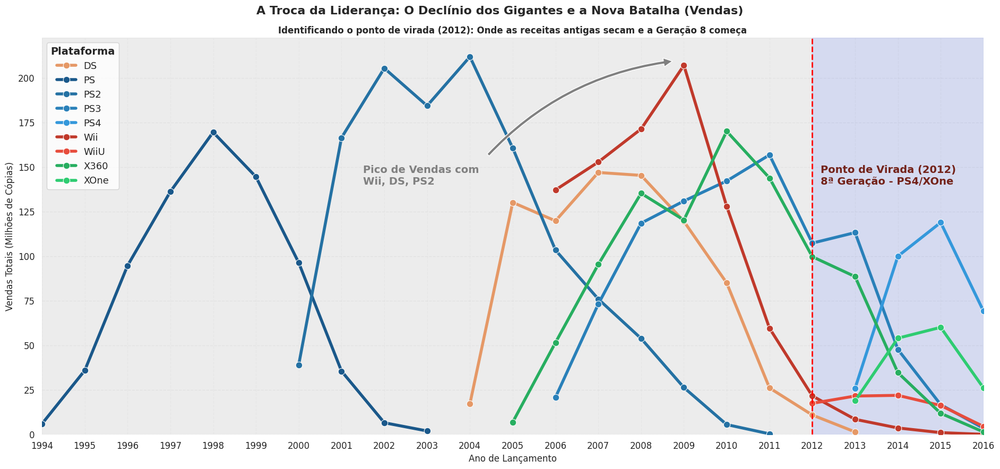

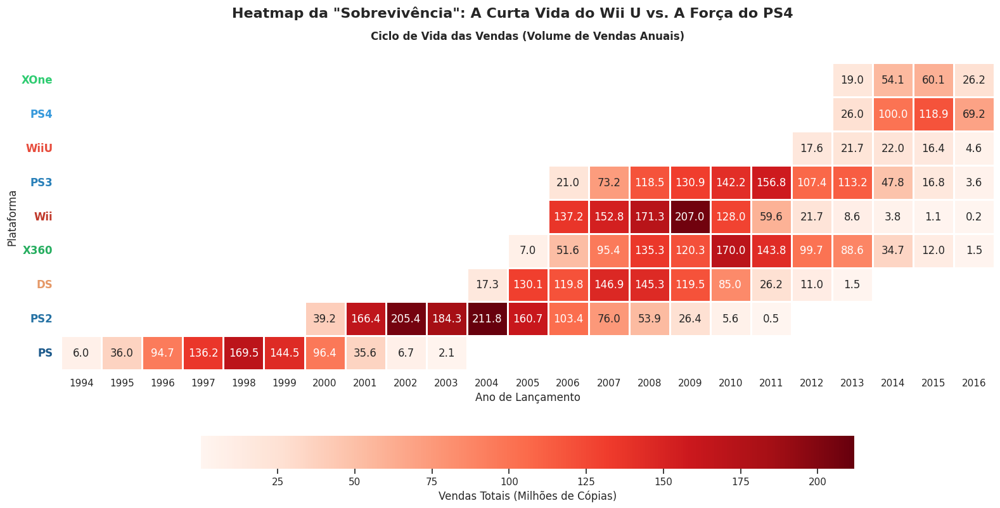

In [44]:
# =============================================
# 3.2 Ciclo de Vida Comercial (Linha e Heatmap)
# =============================================

display(Markdown(f"### **💰 3.2. Evolução das Vendas (Linha e Heatmap)**"))

plotar_evolucao_temporal(
    df_input=df, 
    metric='total_sales', # Vendas
    title_main='A Troca da Liderança: O Declínio dos Gigantes e a Nova Batalha (Vendas)',
    subtitle_main='Identificando o ponto de virada (2012): Onde as receitas antigas secam e a Geração 8 começa',
    title_heatmap='Heatmap da "Sobrevivência": A Curta Vida do Wii U vs. A Força do PS4',
    subtitle_heatmap='Ciclo de Vida das Vendas (Volume de Vendas Anuais)',
    color_bg_relevant='#bac2e6', # Roxo claro (Vendas)
    cmap_heatmap='Reds'
)

👉 **``Conclusões: Ciclo de Vida Comercial``**

Analisando os gráficos acima, percebi um claro padrão de mercado.

❓ **``Pergunta de Negócio:``**<br>
> *"Quais as plataformas com as maiores vendas e como a distribuição mudou?<br>Onde estão os picos de receita?<br>Quanto tempo leva para as novas plataformas aparecerem e as antigas desaparecerem?"*

💡 **`Resposta & Insights de Vendas:`**
> Os dados revelam um padrão claro de "Ascensão e Queda" com duração média de **10 anos**, mas com nuances importantes sobre quando o dinheiro realmente entra e como as gerações competem entre si:

<br>

> 1.  **``O Padrão de 10 Anos (Ciclo Total):``**
>     * Um **ciclo de vida completo** de uma plataforma (do lançamento até vendas insignificantes) dura aproximadamente **`10 a 11 anos`**.
>     * **Exemplos que seguem exatamente esse padrão:**
    > 
    >       | Plataforma | Ano<br>Lançamento | Ano<br>Insignificância | Ciclo de<br>Vida Útil |
    >       | :---: | :---: | :---: | :---: |
    >       | **`PS2`** | 2000 | 2011 | 11 anos |
    >       | **`Wii`** | 2006 | 2016 | 10 anos |
    >       | **`PS`** | 1994 | 2003 | 9 anos |
    >       | **`DS`** | 2004 | 2013 | 9 anos |

<br> 

> 2. **``A "Janela de Ouro" (O Pico)``**
>       * Embora o console dure 10 anos, observei que o período de ``pico`` real de vendas é **muito mais curto**, concentrando-se numa janela de **``5 a 6 anos``** após o lançamento.<br><br>
>       * **Exemplos de picos tardios:**
    >           * O ``PS2`` atingiu seu auge por volta de ``2004-2005`` e o ``Wii`` em ``2009``.
    >           * O ``X360`` teve seu pico em ``2010`` (170M) e o ``PS3`` em ``2011`` (156M), demorando para engrenar.

<br>

> 3. **``Sobreposição de Gerações (Canibalização):``**
>       * ``Novas plataformas`` não esperam as antigas "desaparecerem". Elas são lançadas a cada ``6-8 anos``, criando um período onde múltiplas gerações, inclusive do mesmo fabricante, **coexistem e competem**.<br><br>
>       * **O Caos de 2011:** Esse foi um ano exemplar dessa sobreposição:
>           * O PS2 (Geração 6) ainda estava vivo (0.45M).
>           * O PS3 (Geração 7) estava no seu **pico absoluto** (156.78M).
>           * O Wii (Geração 7) já estava em declínio, mas ainda vendia (59.65M).

<br>

> 4.  **``A Exceção (A Curta Vida do Wii U):``**
>     * Diferente do padrão de 10 anos, o **`Wii U`** teve um ciclo de vida drasticamente mais curto. Ele não conseguiu sustentar o sucesso do seu antecessor (`Wii`), servindo como um claro exemplo de rejeição de mercado e perda rápida de suporte das desenvolvedoras.

<br>

> 5.  **``Fenômeno Casual vs. Estabilidade Hardcore:``**
>       * **Casual (``Wii`` & ``DS``):**
>           * Tiveram picos vertiginosos em 2008-2009, seguidos por uma "Morte Rápida" após 2011 (provável migração para mobile).
>       * **Hardcore (``PS3`` & ``X360``):**
>           * Tiveram uma curva mais suave e longeva, indicando uma base de jogadores mais fiel que sustenta o console por mais tempo.

<br>

> 6.  **``A Troca da Liderança (Transição de Gerações):``**
>     * **Observei** uma correlação perfeita nos anos finais: conforme as linhas do **`PS3/X360`** caem, as linhas do **`PS4/XOne`** começam sua ascensão exponencial, enquanto o **`Wii U`** falha em acompanhar esse ritmo.

<br>

> *\*Obs: Como os dados de 2016 estão incompletos, não é possível verificar o pico para os consoles do período relevante (XOne e PS4).*

---

#### 🏭 **Evolução dos Lançamentos - Oferta (O Apoio da Indústria)**

*[⬆️ Ver código da função](#funcao_plotar_evolucao)*
<a id="secao_evolucao"></a>

Por fim, analisarei o nível de 'suporte' que as desenvolvedoras deram a cada plataforma ao longo do tempo.

Percebe-se que o número de jogos lançados continua alto mesmo quando as vendas (seção 3.2) começam a cair.

❓ **``Pergunta de Negócio:``**
> *"Como o apoio das desenvolvedoras (nº de jogos) mudou ao longo do tempo?"*

### **🏭 3.3. Evolução dos Lançamentos (Linha e Heatmap)**

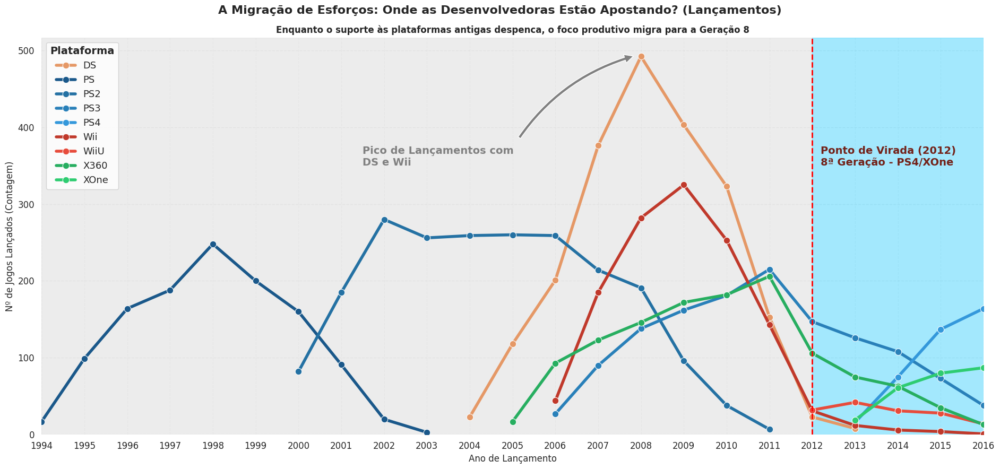

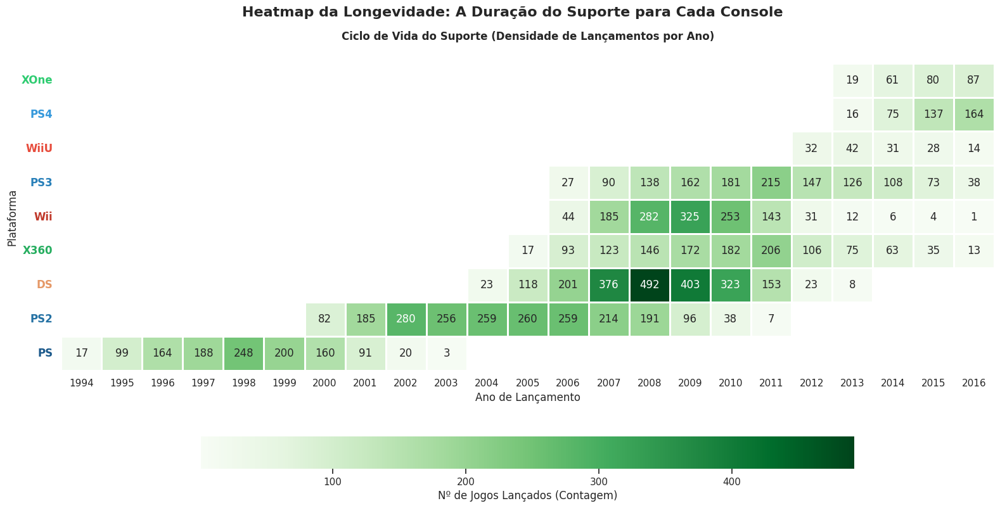

In [45]:
# ===================================================
# 3.3 Ciclo de Vida dos Lançamentos (Linha e Heatmap)
# ===================================================

display(Markdown(f"### **🏭 3.3. Evolução dos Lançamentos (Linha e Heatmap)**"))

plotar_evolucao_temporal(
    df_input=df, 
    metric='name', # Contagem de Nomes
    title_main='A Migração de Esforços: Onde as Desenvolvedoras Estão Apostando? (Lançamentos)',
    subtitle_main='Enquanto o suporte às plataformas antigas despenca, o foco produtivo migra para a Geração 8',
    title_heatmap='Heatmap da Longevidade: A Duração do Suporte para Cada Console',
    subtitle_heatmap='Ciclo de Vida do Suporte (Densidade de Lançamentos por Ano)',
    color_bg_relevant='#66dafd', # Azul claro (Lançamentos)
    cmap_heatmap='Greens'
)

👉 **``Conclusões: Ciclo de Vida do Suporte``**

Com os gráficos acima consegue-se visualizar facilmente os picos e ciclos do suporte das desenvolvedoras.

❓ **``Pergunta de Negócio:``**<br>
> *"Como o apoio das desenvolvedoras (nº de jogos lançados) mudou ao longo do tempo?<br>Onde estão os picos de lançamentos?"*

💡 **``Resposta & Insights de Lançamentos:``**

> 1. **``Pico de Suporte e Divergência com Vendas (2008-2009):``**
>       - O volume de lançamentos foi massivo em **2008-2009**.
>       - Enquanto o `DS` liderou em **quantidade** de títulos (muito *shovelware*), o `Wii` foi líder absoluto em **vendas**, impulsionado por hits astronômicos (*Wii Sports, Mario Kart*).<br>
> 2. **``A Inércia do Suporte``**
>       - Nota-se um *lag* entre a queda das vendas e o fim dos lançamentos.
>       - O suporte continuou alto por **1 a 2 anos** após o declínio das vendas, indicando que as desenvolvedoras demoram a abandonar uma base instalada grande.
> 3. **``Morte Rápida:``**
>       - Passado o período de inércia, o suporte para `Wii` e `DS` desabou após 2011, mostrando o abandono dessas plataformas pelas desenvolvedoras conforme o mercado migrava (provavelmente para o mobile).
> 4. **``Suporte Estável:``**
>       - Diferente da Nintendo, o `PS3` e o `X360` tiveram um ciclo de vida de suporte mais longo e<br>
>   previsível, com um declínio muito mais suave.
> 5. **``Transição de Gerações:``**
>       - O suporte para a geração antiga (PS3/X360) cai exatamente quando o suporte para `PS4` e `XOne`<br>(linhas vermelha e marrom-clara que sobem no final) começa a crescer exponencialmente.
>
> \* *Obs: Devido à dados incompletos para 2016, não é possível identificar o topo para as plataformas relevantes PS4 e XOne*

---

###  💀 **Plataformas Obsoletas**
*[⬆️ Ver código da função](#funcao_plotar_obsoletas)*
<a id="secao_obsoletas"></a>

❓ **``Pergunta de Negócio:``**
> *"Quais plataformas eram populares, mas agora não têm vendas?"*

Para responder a esta pergunta, comparei as vendas do "ano do pico" de cada uma das Top 6 plataformas históricas com as suas vendas em 2016 (o último ano dos nossos dados).

O gráfico de barras agrupadas nos permite ver visualmente a magnitude do declínio e quais plataformas estão efetivamente "mortas" em 2016.

### **💀 4. Plataformas Obsoletas**

*Comparação: "Auge das Vendas" vs. "Vendas Atuais" (2016)*

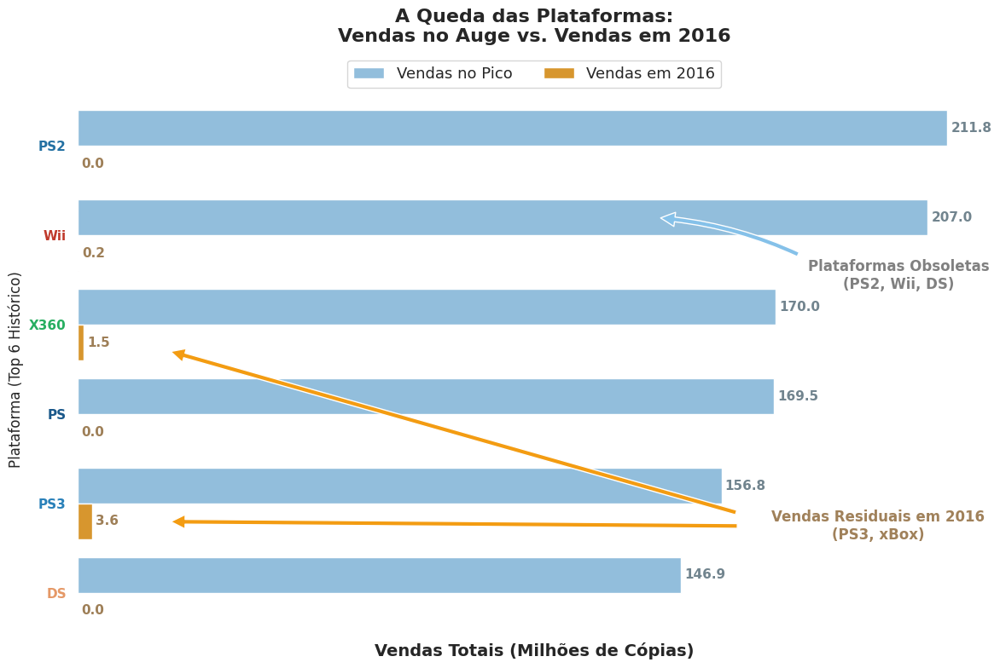

#### 💀 **Verificando Vendas em 2016 (Top 6 Plataformas Históricas)**

,Vendas (milhões)
Plataforma,
PS3,3.60
X360,1.52
Wii,0.18
DS,0.00
PS,0.00
PS2,0.00


In [46]:
# ===================================================
# 4. Plataformas Obsoletas (Barras Agrupadas)
# ===================================================
# Comparação: "Auge das Vendas" vs. "Vendas Atuais" (2016)

display(Markdown(f"### **💀 4. Plataformas Obsoletas**"))
display(Markdown(f'*Comparação: "Auge das Vendas" vs. "Vendas Atuais" (2016)*'))

# Chamada da função
plotar_plataformas_obsoletas(df, COR_BASE, COR_DESTAQUE)

👉 **``Conclusões: Plataformas Obsoletas``**

❓ **``Pergunta de Negócio:``**<br>
> *"Quais plataformas populares agora não têm vendas?"*

💡 **``Resposta & Insights:``**

> Com base no gráfico de ciclo de vida e nos dados de vendas de 2016,
> as plataformas que eram **gigantes** e agora estão **obsoletas** (vendas zero ou
> insignificantes) são:
> 
> - **`PS`** (PlayStation)
> - **`PS2`** (PlayStation 2)
> - **`Wii`**
> - **`DS`** (Nintendo DS)
> 
> Plataformas como `PS3` e `X360`, embora também obsoletas, ainda registravam
> algumas vendas "residuais" em 2016, mas estavam claramente com seus dias contados.

---

### [**Seleção do Período Relevante (2012-2016)**](#toc0_3)

❓ **``Pergunta de Negócio:``**
> *"Qual período relevante para a análise das vendas para prever 2017?"*

💡 **``Resposta & Insights:``**

> Período de Dados Selecionado: **``2012 a 2016``**

Decidi que o período ideal para modelar as vendas de jogos e realizar a previsão para **2017** é o intervalo entre **2012 e 2016**.

👉 **``Justificativa``**

1.  **Eliminação de Ruído Obsoleto:**
    - As análises anteriores sobre o ciclo de vida das plataformas (como o PS2, Wii e DS) demonstraram que essas plataformas estavam em seus anos finais ou completamente obsoletas após 2011.
    - Incluir dados anteriores a 2012 adicionaria um ruído de mercado que não representa a realidade de 2017 e que distorceria a tendência atual.

2.  **Captura da Transição de Geração:**
    - O ano de 2013 marcou o lançamento das plataformas de **8ª Geração** (PS4 e Xbox One).
    - Ao incluir os dados a partir de **2012**, consigo capturar:
      - O desempenho residual das gerações antigas (PS3, X360) em seu declínio final.
      - A **dinâmica de transição** e o início do crescimento da nova geração.

3.  **Foco em Tendências Relevantes:**
    - Um modelo preditivo para 2017 precisa aprender com o comportamento das plataformas que estarão ativas e em crescimento.
    - O período **2012-2016** contém a informação mais relevante sobre o ritmo de adoção do PS4 e do Xbox One, que são os verdadeiros *drivers* de venda no futuro imediato.
    - O corte garante que estou focado nos **últimos 5 anos** de dados que refletem o mercado atual, eliminando a influência de plataformas que já morreram.

**Portanto, daqui para frente, usarei apenas o subconjunto do DataFrame original que cobre os anos de lançamento entre 2012 e 2016** (``df_relevante``, como definido anteriormente na seção *3. Funções de Plotagem e Correlação*).

---

### [**Plataformas Lucrativas (Análise 2012-2016)**](#toc0_3)

##### ***``❓ Quais plataformas entre 2012 e 2016 estão liderando em vendas e são potencialmente lucrativas?``***

Para responder a esta pergunta, filtrei os dados para o nosso período relevante (2012-2016). 

Primeiro, identifiquei as Top 6 plataformas em vendas totais nesse período (para ver os líderes de volume).

Em seguida, plotei um gráfico de linhas para analisar a tendência (crescimento ou declínio) de cada uma ano a ano.

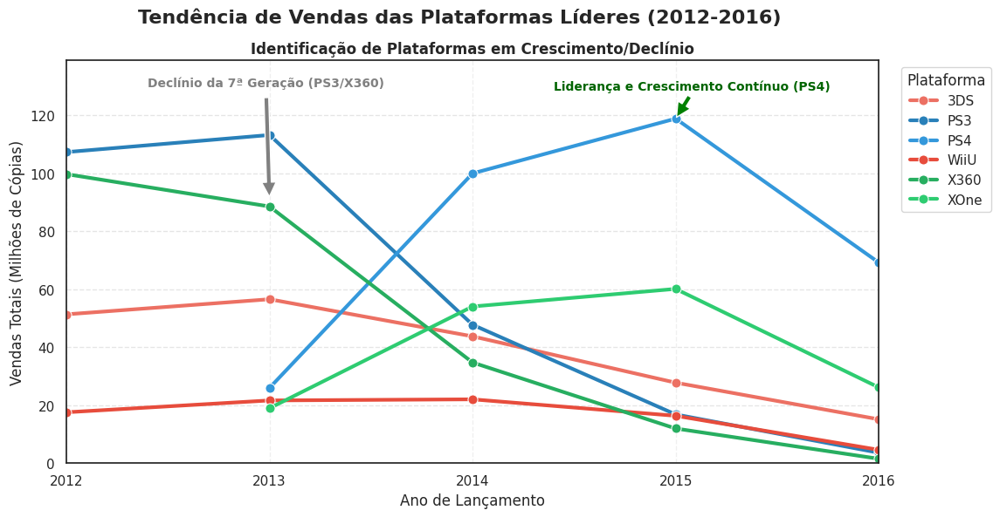

--- ANÁLISE FINAL DE TENDÊNCIAS ---
Declínio: PS3, X360, WiiU (Estavam em queda livre em 2016, indicando o fim do ciclo).
Crescimento/Estabilidade: PS4 (Claro crescimento, tornando-se o novo líder). XOne (Estável, mas seguindo de perto o PS4).

Plataformas Potencialmente Lucrativas Selecionadas para Análise (Próximos Passos): ['PS4', 'XOne']

--- Vendas Totais por Plataforma (Período relevante: 2012-2016) ---
platform
PS4     314.14
PS3     288.78
X360    236.54
3DS     194.61
XOne    159.32
WiiU     82.19
Name: total_sales, dtype: float64


In [47]:
# 8. Plataformas Lucrativas (Análise 2012-2016)
# Quais plataformas entre 2012 e 2016 estão liderando em vendas?
# Quais estão crescendo ou diminuindo?
# Quais plataformas são potencialmente lucrativas?

# Para isso, vou selecionar as Top 6 do período:

# Calcular vendas totais para o período relevante (df_relevante ) e pegar Top 6
top_6_periodo = df_relevante.groupby('platform')['total_sales'].sum().sort_values(ascending=False).head(6)


# Plotando

# 1. Preparar os dados (usando as 5 plataformas líderes encontradas na Simplificada)
platforms_lideres = top_6_periodo.index

df_tendencia = df_relevante[df_relevante['platform'].isin(platforms_lideres)]

# Pivot table: Vendas anuais para cada plataforma (necessário para o lineplot)
pivot_tendencia = df_tendencia.pivot_table(index='year_of_release', 
                                           columns='platform', 
                                           values='total_sales', 
                                           aggfunc='sum')

# --- PLOTAR O GRÁFICO DE TENDÊNCIAS ---
plt.figure(figsize=(12, 6))
# Usei uma paleta categórica ('tab10') para clareza
ax = sns.lineplot(data=pivot_tendencia,
                  dashes=False,
                  linewidth=3,
                  palette=platform_color_map,
                  marker='o',
                  markersize=8)

# --- ANOTAÇÕES ---
# Destaque para as plataformas em declínio
plt.annotate('Declínio da 7ª Geração (PS3/X360)',
             xy=(2013, 90), xytext=(2012.4, 130),
             arrowprops=dict(facecolor='gray', shrink=0.05),
             fontsize=10, fontweight='bold', color='gray')

# Destaque para a plataforma líder (PS4)
plt.annotate('Liderança e Crescimento Contínuo (PS4)',
             xy=(2015, pivot_tendencia.loc[2015, 'PS4']),
             xytext=(2014.4, pivot_tendencia.loc[2015, 'PS4'] + 10),
             arrowprops=dict(facecolor='green', shrink=0.05),
             fontsize=10, color='darkgreen', fontweight='bold')


# --- Estilização Final ---
plt.suptitle('Tendência de Vendas das Plataformas Líderes (2012-2016)', fontsize=16, fontweight='bold')
plt.title('Identificação de Plataformas em Crescimento/Declínio', fontsize=12)
plt.xlabel('Ano de Lançamento', fontsize=12)
plt.ylabel('Vendas Totais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.legend(title='Plataforma', bbox_to_anchor=(1.02, 1), loc='upper left') 


# --- CORREÇÃO DOS LIMITES E XTICKS ---
# Pega o primeiro e o último ano dos dados PÓS-LIMPEZA
min_year = pivot_tendencia.index.min() 
max_year = pivot_tendencia.index.max()

# Força o eixo X a ir apenas de 1994 a 2016 (min e max)
plt.xlim(min_year, max_year)

# Força o eixo Y a começar em 0 (sem espaço negativo embaixo)
plt.ylim(bottom=0, top=139)

# Eixo X: Mostra todos os anos e gira
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MultipleLocator(1)) # Mostra 1 tick por ano
plt.xticks(rotation=0)


plt.show()

# Análise de Tendências e Seleção de Lucrativas
print('='*100)
print("--- ANÁLISE FINAL DE TENDÊNCIAS ---")
print('='*100)

# Declaração dos Resultados (Interpretação do Gráfico de Tendência):
print("Declínio: PS3, X360, WiiU (Estavam em queda livre em 2016, indicando o fim do ciclo).")
print("Crescimento/Estabilidade: PS4 (Claro crescimento, tornando-se o novo líder). XOne (Estável, mas seguindo de perto o PS4).")

# Seleção das Plataformas Potencialmente Lucrativas
lucrativas = ['PS4', 'XOne']
print(f"\nPlataformas Potencialmente Lucrativas Selecionadas para Análise (Próximos Passos): {lucrativas}\n")


print('='*100)
print("--- Vendas Totais por Plataforma (Período relevante: 2012-2016) ---")
print('='*100)
print(top_6_periodo)


**``❓ Pergunta:``**
> *Quais plataformas entre 2012 e 2016 estão liderando em vendas? Quais estão crescendo ou diminuindo? Quais são potencialmente lucrativas?*
 

**``👉 Resposta:``**
- A resposta a esta pergunta é uma combinação de volume total (da tabela) e tendência (do gráfico).<br>
- Embora plataformas da 7ª Geração (``PS3``, ``X360``) ainda mostrem um alto volume total no período,<br>
isso se deve às suas fortes vendas no início do período (2012-2013).<br>
- O gráfico de tendências mostra que elas estão em rápido declínio.<br><br>

**``💡 Análise do gráfico de tendências:``**
- 📈 **``Crescimento``** (Geração 8):
  - O ``PS4`` mostra um crescimento claro, ultrapassando todas as outras e se tornando o líder de mercado em 2016.
  - O ``XOne`` também mostra crescimento, estabelecendo-se como o forte concorrente secundário.

- 📉 **``Declínio``** (Geração 7):
  - As plataformas `PS3` e `X360` estão em queda livre, com suas vendas de jogos terminando em 2016.
  - O `3DS` e o `WiiU` também estão em claro declínio.<br><br>

**``🎯 Conclusão Estratégica:``**
- As únicas plataformas potencialmente lucrativas para focar em 2017 são aquelas que estão crescendo.
- O `PS3` e `X360` são agora "obsoletos".
- Portanto, a campanha de 2017 deve se concentrar quase **exclusivamente** em **`PS4`** e **`XOne`**.


**``ℹ️ Tabela: Vendas Totais por Plataforma (Período 2012-2016)``:**]
> | Platforma | Vendas Totais de Jogos (un.)<br>(2012-2016) |
> | :---: | :---: |
> | **PS4** | 314.1 milhões |
> | **PS3** | 288.8 Milhões |
> | **X360** | 236.5 Milhões |
> | **3DS** | 194.6 Milhões |
> | **XOne** | 159.3 Milhões |
> | **WiiU** | 82.2 Milhões |
>
> O **`PS4`** lidera em vendas totais, mas as plataformas da geração anterior (**`PS3`**/**`X360`**) <br>
> ainda estão no **`Top 3`** devido ao seu longo histórico de vendas no **início do período**.

---

### [**Distribuição de Vendas Globais de Jogos (Boxplot)**](#toc0_3)

##### ***``❓ Qual a Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016)?``***

Para responder a esta pergunta, gerei dois boxplots usando o `df_relevante` (2012-2016).

O primeiro gráfico dá um "zoom" nas vendas abaixo de 2 milhões de cópias para analisar o comportamento de um jogo "comum".

O segundo gráfico mostra a distribuição completa, incluindo os jogos "blockbuster" (outliers).

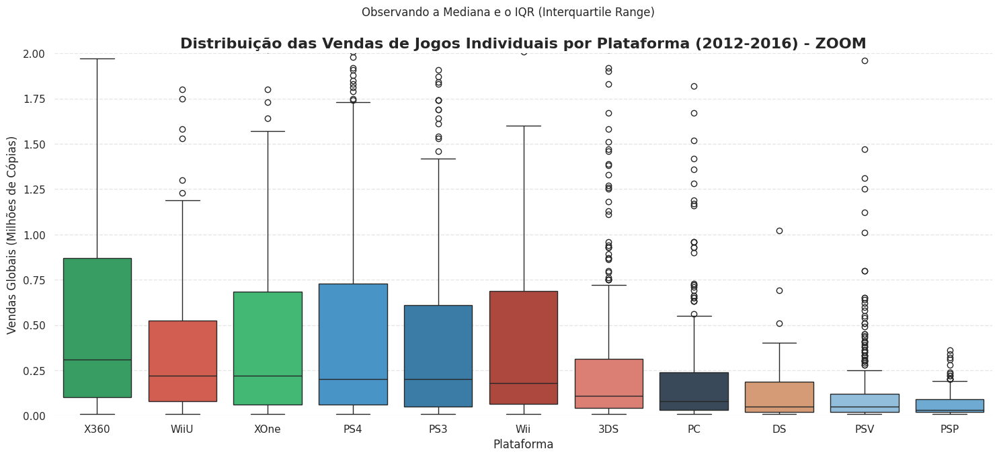

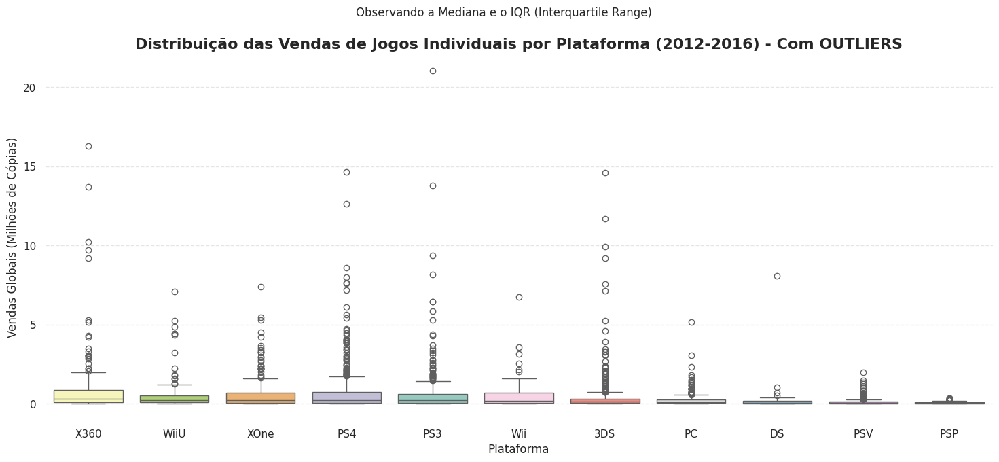

Exibindo as estatísticas descritivas da distribuição das vendas dos jogos por plataforma
       year_of_release  total_sales
count      2884.000000  2884.000000
mean       2013.918169     0.501540
std           1.411352     1.249532
min        2012.000000     0.010000
25%        2013.000000     0.040000
50%        2014.000000     0.120000
75%        2015.000000     0.430000
max        2016.000000    21.050000

Exibindo uma amostra dos dados:
                                         name platform  total_sales
16                         Grand Theft Auto V      PS3        21.05
23                         Grand Theft Auto V     X360        16.27
31                  Call of Duty: Black Ops 3      PS4        14.63
33                        Pokemon X/Pokemon Y      3DS        14.60
34                 Call of Duty: Black Ops II      PS3        13.79
35                 Call of Duty: Black Ops II     X360        13.68
42                         Grand Theft Auto V      PS4        12.62
47  Pokemo

In [48]:
# 9. Distribuição de Vendas (Boxplot)
# Qual a Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016)?
# As diferenças nas vendas são significativas? 
# E quanto às vendas médias em várias plataformas?

# Plotando sem outliers extremos -> Limitando o eixo Y em 2 milhões de cópias vendidas 

# Filtra o DataFrame para o período relevante (2012-2016)
df_relevante = df[(df['year_of_release'] >= 2012) & (df['year_of_release'] <= 2016)].copy()

# --------------------------------------------
# VIZ 1: Visualizando sem outliers > 2M vendas
# --------------------------------------------

# Cria o boxplot
plt.figure(figsize=(18, 7))

sns.boxplot(data=df_relevante, 
            x='platform', 
            y='total_sales', 
            palette=platform_color_map,
            hue='platform',
            order=df_relevante.groupby('platform')['total_sales'].median()
            .sort_values(ascending=False).index) # Ordena pela mediana para melhor leitura

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Definindo um limite no eixo Y para dar zoom e descartar outliers (blockbusters - jogos com menos de 2M)
plt.ylim(0, 2) 

plt.title('Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016) - ZOOM', fontsize=16)
plt.suptitle('Observando a Mediana e o IQR (Interquartile Range)', fontsize=12)
plt.xlabel('Plataforma', fontsize=12)
plt.ylabel('Vendas Globais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)


# --------------------------------------------
# VIZ 2: Visualizando com outliers > 2M vendas
# --------------------------------------------

# Cria o boxplot
plt.figure(figsize=(18, 7))

sns.boxplot(data=df_relevante, 
            x='platform', 
            y='total_sales', 
            palette='Set3',
            hue='platform',
            order=df_relevante.groupby('platform')['total_sales'].median()
            .sort_values(ascending=False).index) # Ordena pela mediana para melhor leitura

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Definindo um limite no eixo Y para dar zoom e descartar outliers (blockbusters - jogos com menos de 2M)
# plt.ylim(0, 2) 

plt.title('Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016) - Com OUTLIERS', fontsize=16)
plt.suptitle('Observando a Mediana e o IQR (Interquartile Range)', fontsize=12)
plt.xlabel('Plataforma', fontsize=12)
plt.ylabel('Vendas Globais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print('='*100)
print('Exibindo as estatísticas descritivas da distribuição das vendas dos jogos por plataforma')
print('='*100)      
print(df_relevante[['year_of_release','total_sales']].describe())
print()
print('='*100)
print('Exibindo uma amostra dos dados:')
print('='*100)
print(round(df_relevante[['name','platform','total_sales']].sort_values(by='total_sales',ascending=False),3).head(20))


**``❓ Pergunta:``**

A análise dos boxplots e das estatísticas descritivas revela a verdadeira natureza do mercado: ele é movido por outliers (sucessos extremos), e o jogo "típico" tem vendas muito baixas.


💡 **Descoberta 1: ``Vendas Medianas são Extremamente Baixas``**
> A tabela de estatísticas descritivas (abaixo) nos mostra que a **mediana (50%)** de vendas para todos os jogos no período relevante é de apenas **0.12M (120.000 cópias)**.
>
> O boxplot com zoom (Gráfico 1) confirma isso visualmente:
> - **A "Mediana" (a linha dentro da caixa):** Para quase todas as plataformas (`PS4`, `XOne`, `PS3`, etc.), a linha mediana está muito próxima de zero, por volta de 0.1M - 0.2M.
> - **Significado:** O jogo "típico" (mediano) em qualquer plataforma vende muito pouco. Não existe uma plataforma "segura" onde um jogo mediano tenha vendas altas garantidas.

<br>


💡 **Descoberta 2: ``O Mercado é Movido por "Outliers" (Blockbusters)``**
> O Gráfico 2 (com outliers) e a tabela de estatísticas mostram uma enorme diferença entre as vendas medianas e as vendas máximas:
>
> - **Média (Mean):** 0.50M
> - **Mediana (50%):** 0.12M
> - **Máximo (Max):** 21.05M
>
> A média é **4x maior que a mediana**, e a **venda máxima é 175x maior**.<br>
> Isso é uma distribuição de cauda longa clássica.<br>
> A tabela de "Top 20" (abaixo) mostra que jogos como Grand Theft Auto V e Call of Duty são esses outliers extremos que puxam a média para cima,<br>
enquanto a maioria dos jogos (as "caixas" no boxplot) falha em gerar receita significativa.

<br>


**``🎯 Conclusão: As Diferenças são Significativas?``**
- **``NÃO:``** As diferenças nas vendas medianas (o jogo "típico") não são significativas entre as plataformas líderes (PS4, XOne, PS3, X360).
- **``SIM:``** As diferenças no potencial de sucesso (o tamanho da caixa e a presença de outliers) são significativas.<br>As plataformas líderes (PS4, XOne) demonstram um potencial muito maior para gerar "hits" (outliers) do que plataformas de nicho como o WiiU ou PSV.<br><br>


**``ℹ️ Tabela: Estatísticas Descritivas (Vendas Totais 2012-2016)``**

| estatística | year_of_release | total_sales |
| :--- | :--- | :--- |
| **count** | 2884.0 | 2884.00 |
| **mean** | 2013.9 | 0.50 |
| **std** | 1.4 | 1.25 |
| **min** | 2012.0 | 0.01 |
| **25%** | 2013.0 | 0.04 |
| **50%** | 2014.0 | 0.12 |
| **75%** | 2015.0 | 0.43 |
| **max** | 2016.0 | 21.05 |

<br>

**``ℹ️ Tabela: Amostra de "Outliers" (Jogos Mais Vendidos 2012-2016)``**](#toc0_)

| name | platform | total_sales |
| :--- | :--- | :--- |
| Grand Theft Auto V | `PS3` | 21.05 |
| Grand Theft Auto V | `X360` | 16.27 |
| Call of Duty: Black Ops 3 | `PS4` | 14.63 |
| Pokemon X/Pokemon Y | `3DS` | 14.60 |
| Call of Duty: Black Ops II | `PS3` | 13.79 |
| Call of Duty: Black Ops II | `X360` | 13.68 |
| Grand Theft Auto V | `PS4` | 12.62 |
| Pokemon Omega Ruby/Pokemon Alpha Sapphire | `3DS` | 11.68 |
| Call of Duty: Ghosts | `X360` | 10.24 |
| New Super Mario Bros. 2 | `3DS` | 9.90 |
| Halo 4 | `X360` | 9.71 |
| Call of Duty: Ghosts | `PS3` | 9.36 |
| Minecraft | `X360` | 9.18 |
| Animal Crossing: New Leaf | `3DS` | 9.17 |
| FIFA 16 | `PS4` | 8.58 |
| FIFA Soccer 13 | `PS3` | 8.17 |
| Pokemon Black 2/Pokemon White 2 | `DS` | 8.06 |
| Star Wars Battlefront (2015) | `PS4` | 7.98 |
| Call of Duty: Advanced Warfare | `PS4` | 7.66 |
| FIFA 17 | `PS4` | 7.60 |

---

### [**Distribuição de Vendas Globais de Jogos (Boxplot)**](#toc0_3)

##### ***``❓ Qual a Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016)?``***

Para responder a esta pergunta, gerei dois boxplots usando o `df_relevante` (2012-2016).

O primeiro gráfico dá um "zoom" nas vendas abaixo de 2 milhões de cópias para analisar o comportamento de um jogo "comum".

O segundo gráfico mostra a distribuição completa, incluindo os jogos "blockbuster" (outliers).

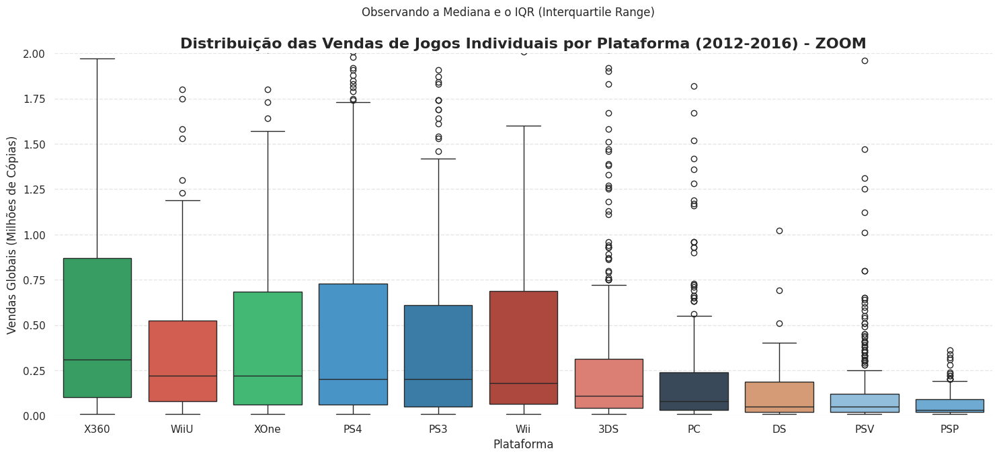

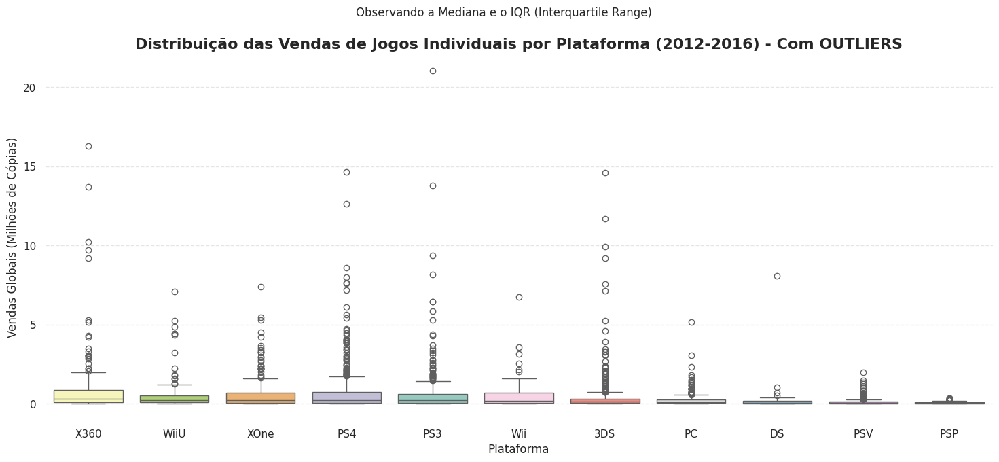

Exibindo as estatísticas descritivas da distribuição das vendas dos jogos por plataforma
       year_of_release  total_sales
count      2884.000000  2884.000000
mean       2013.918169     0.501540
std           1.411352     1.249532
min        2012.000000     0.010000
25%        2013.000000     0.040000
50%        2014.000000     0.120000
75%        2015.000000     0.430000
max        2016.000000    21.050000

Exibindo uma amostra dos dados:
                                         name platform  total_sales
16                         Grand Theft Auto V      PS3        21.05
23                         Grand Theft Auto V     X360        16.27
31                  Call of Duty: Black Ops 3      PS4        14.63
33                        Pokemon X/Pokemon Y      3DS        14.60
34                 Call of Duty: Black Ops II      PS3        13.79
35                 Call of Duty: Black Ops II     X360        13.68
42                         Grand Theft Auto V      PS4        12.62
47  Pokemo

In [49]:
# 9. Distribuição de Vendas (Boxplot)
# Qual a Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016)?
# As diferenças nas vendas são significativas? 
# E quanto às vendas médias em várias plataformas?

# Plotando sem outliers extremos -> Limitando o eixo Y em 2 milhões de cópias vendidas 

# Filtra o DataFrame para o período relevante (2012-2016)
df_relevante = df[(df['year_of_release'] >= 2012) & (df['year_of_release'] <= 2016)].copy()

# --------------------------------------------
# VIZ 1: Visualizando sem outliers > 2M vendas
# --------------------------------------------

# Cria o boxplot
plt.figure(figsize=(18, 7))

sns.boxplot(data=df_relevante, 
            x='platform', 
            y='total_sales', 
            palette=platform_color_map,
            hue='platform',
            order=df_relevante.groupby('platform')['total_sales'].median()
            .sort_values(ascending=False).index) # Ordena pela mediana para melhor leitura

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Definindo um limite no eixo Y para dar zoom e descartar outliers (blockbusters - jogos com menos de 2M)
plt.ylim(0, 2) 

plt.title('Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016) - ZOOM', fontsize=16)
plt.suptitle('Observando a Mediana e o IQR (Interquartile Range)', fontsize=12)
plt.xlabel('Plataforma', fontsize=12)
plt.ylabel('Vendas Globais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)


# --------------------------------------------
# VIZ 2: Visualizando com outliers > 2M vendas
# --------------------------------------------

# Cria o boxplot
plt.figure(figsize=(18, 7))

sns.boxplot(data=df_relevante, 
            x='platform', 
            y='total_sales', 
            palette='Set3',
            hue='platform',
            order=df_relevante.groupby('platform')['total_sales'].median()
            .sort_values(ascending=False).index) # Ordena pela mediana para melhor leitura

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Definindo um limite no eixo Y para dar zoom e descartar outliers (blockbusters - jogos com menos de 2M)
# plt.ylim(0, 2) 

plt.title('Distribuição das Vendas de Jogos Individuais por Plataforma (2012-2016) - Com OUTLIERS', fontsize=16)
plt.suptitle('Observando a Mediana e o IQR (Interquartile Range)', fontsize=12)
plt.xlabel('Plataforma', fontsize=12)
plt.ylabel('Vendas Globais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print('='*100)
print('Exibindo as estatísticas descritivas da distribuição das vendas dos jogos por plataforma')
print('='*100)      
print(df_relevante[['year_of_release','total_sales']].describe())
print()
print('='*100)
print('Exibindo uma amostra dos dados:')
print('='*100)
print(round(df_relevante[['name','platform','total_sales']].sort_values(by='total_sales',ascending=False),3).head(20))


**``❓ Pergunta:``**

A análise dos boxplots e das estatísticas descritivas revela a verdadeira natureza do mercado: ele é movido por outliers (sucessos extremos), e o jogo "típico" tem vendas muito baixas.


💡 **Descoberta 1: ``Vendas Medianas são Extremamente Baixas``**
> A tabela de estatísticas descritivas (abaixo) nos mostra que a **mediana (50%)** de vendas para todos os jogos no período relevante é de apenas **0.12M (120.000 cópias)**.
>
> O boxplot com zoom (Gráfico 1) confirma isso visualmente:
> - **A "Mediana" (a linha dentro da caixa):** Para quase todas as plataformas (`PS4`, `XOne`, `PS3`, etc.), a linha mediana está muito próxima de zero, por volta de 0.1M - 0.2M.
> - **Significado:** O jogo "típico" (mediano) em qualquer plataforma vende muito pouco. Não existe uma plataforma "segura" onde um jogo mediano tenha vendas altas garantidas.

<br>


💡 **Descoberta 2: ``O Mercado é Movido por "Outliers" (Blockbusters)``**
> O Gráfico 2 (com outliers) e a tabela de estatísticas mostram uma enorme diferença entre as vendas medianas e as vendas máximas:
>
> - **Média (Mean):** 0.50M
> - **Mediana (50%):** 0.12M
> - **Máximo (Max):** 21.05M
>
> A média é **4x maior que a mediana**, e a **venda máxima é 175x maior**.<br>
> Isso é uma distribuição de cauda longa clássica.<br>
> A tabela de "Top 20" (abaixo) mostra que jogos como Grand Theft Auto V e Call of Duty são esses outliers extremos que puxam a média para cima,<br>
enquanto a maioria dos jogos (as "caixas" no boxplot) falha em gerar receita significativa.

<br>


**``🎯 Conclusão: As Diferenças são Significativas?``**
- **``NÃO:``** As diferenças nas vendas medianas (o jogo "típico") não são significativas entre as plataformas líderes (PS4, XOne, PS3, X360).
- **``SIM:``** As diferenças no potencial de sucesso (o tamanho da caixa e a presença de outliers) são significativas.<br>As plataformas líderes (PS4, XOne) demonstram um potencial muito maior para gerar "hits" (outliers) do que plataformas de nicho como o WiiU ou PSV.<br><br>


**``ℹ️ Tabela: Estatísticas Descritivas (Vendas Totais 2012-2016)``**

| estatística | year_of_release | total_sales |
| :--- | :--- | :--- |
| **count** | 2884.0 | 2884.00 |
| **mean** | 2013.9 | 0.50 |
| **std** | 1.4 | 1.25 |
| **min** | 2012.0 | 0.01 |
| **25%** | 2013.0 | 0.04 |
| **50%** | 2014.0 | 0.12 |
| **75%** | 2015.0 | 0.43 |
| **max** | 2016.0 | 21.05 |

<br>

**``ℹ️ Tabela: Amostra de "Outliers" (Jogos Mais Vendidos 2012-2016)``**](#toc0_)

| name | platform | total_sales |
| :--- | :--- | :--- |
| Grand Theft Auto V | `PS3` | 21.05 |
| Grand Theft Auto V | `X360` | 16.27 |
| Call of Duty: Black Ops 3 | `PS4` | 14.63 |
| Pokemon X/Pokemon Y | `3DS` | 14.60 |
| Call of Duty: Black Ops II | `PS3` | 13.79 |
| Call of Duty: Black Ops II | `X360` | 13.68 |
| Grand Theft Auto V | `PS4` | 12.62 |
| Pokemon Omega Ruby/Pokemon Alpha Sapphire | `3DS` | 11.68 |
| Call of Duty: Ghosts | `X360` | 10.24 |
| New Super Mario Bros. 2 | `3DS` | 9.90 |
| Halo 4 | `X360` | 9.71 |
| Call of Duty: Ghosts | `PS3` | 9.36 |
| Minecraft | `X360` | 9.18 |
| Animal Crossing: New Leaf | `3DS` | 9.17 |
| FIFA 16 | `PS4` | 8.58 |
| FIFA Soccer 13 | `PS3` | 8.17 |
| Pokemon Black 2/Pokemon White 2 | `DS` | 8.06 |
| Star Wars Battlefront (2015) | `PS4` | 7.98 |
| Call of Duty: Advanced Warfare | `PS4` | 7.66 |
| FIFA 17 | `PS4` | 7.60 |

---

### **Análise Multiplataforma: A Guerra dos Consoles**

> ##### ***`❓ Como as vendas dos mesmos jogos variam nas diferentes plataformas? Qual plataforma venceu em cada título?`***

Até agora, analisei o mercado como um todo. Mas, para um lojista, a decisão de compra acontece no nível do produto.<br>Quando sai um blockbuster como *``Call of Duty``*, a loja deve comprar mais unidades para ``PlayStation`` ou ``Xbox``?

Para responder a esta pergunta, filtrei nosso `df_relevante` (2012-2016) para incluir apenas os 10 jogos multiplataforma mais vendidos (como *`Grand Theft Auto V`* e *`Call  of Duty`*) e quebrei os números por plataforma.<br>O gráfico de barras agrupadas permite comparar diretamente o desempenho de vendas do *mesmo jogo* em diferentes consoles.


##### 📊 **``Visualização: O Vencedor de Cada Batalha``**

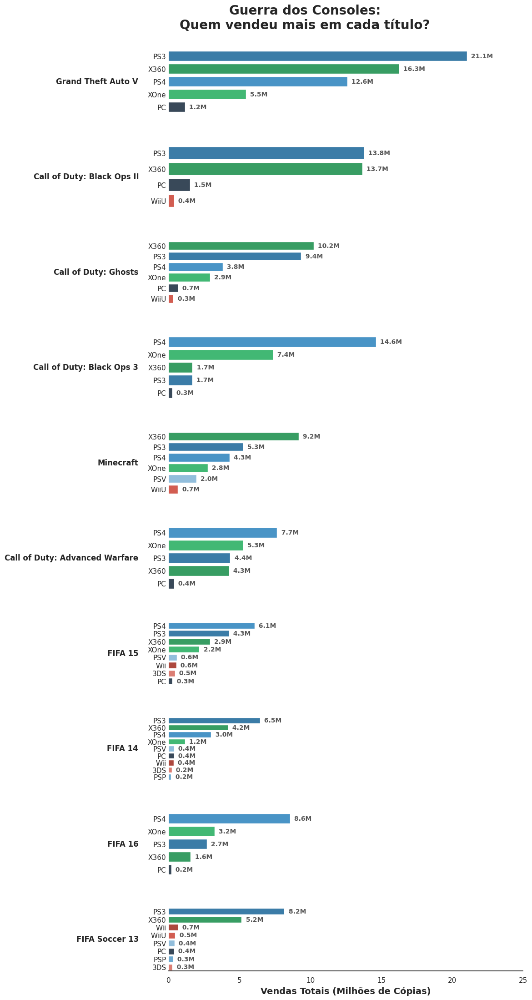


--- Tabela de Vendas Multiplataforma (Top 10 Jogos) ---


name,platform,total_sales
Call of Duty: Advanced Warfare,PS4,7.66
Call of Duty: Advanced Warfare,XOne,5.26
Call of Duty: Advanced Warfare,PS3,4.36
Call of Duty: Advanced Warfare,X360,4.28
Call of Duty: Advanced Warfare,PC,0.41
Call of Duty: Black Ops 3,PS4,14.63
Call of Duty: Black Ops 3,XOne,7.39
Call of Duty: Black Ops 3,X360,1.70
Call of Duty: Black Ops 3,PS3,1.69
Call of Duty: Black Ops 3,PC,0.26


In [50]:
# --- 1. PREPARAÇÃO DOS DADOS ---
top_10_names = df_relevante.groupby('name')['total_sales'].sum().sort_values(ascending=False).head(10).index.tolist()

# Filtrar o DF original para depois imprimirmos
df_focus = df_relevante[df_relevante['name'].isin(top_10_names)].copy()

# --- 2. PLOTAGEM (ABORDAGEM SUBPLOTS) ---
# Aqui vou fazer vários gráficos em um só, para exibir nossos dados direito
fig, axes = plt.subplots(nrows=10, ncols=1, figsize=(12, 25))

for i, game in enumerate(top_10_names):
    ax = axes[i]
    data_game = df_relevante[df_relevante['name'] == game].sort_values('total_sales', ascending=False)
    
    sns.barplot(
        data=data_game,
        x='total_sales',
        y='platform', 
        palette=platform_color_map,
        ax=ax,
        edgecolor='white',
        hue='platform',
        legend=False
    )
    
    # --- ESTILIZAÇÃO INTERNA ---
    ax.set_ylabel(game, rotation=0, ha='right', va='center', fontsize=12, fontweight='bold', labelpad=15)
    ax.set_xlabel('') 
    ax.set_xlim(0, 25) 
    
    # Lógica Condicional para Eixo X e Bordas
    # Se NÃO for o último gráfico (índices 0 a 8)
    if i < len(top_10_names) - 1:
        ax.set_xticks([])                # Remove números do eixo X
        sns.despine(ax=ax, left=True, bottom=True) # Remove linha de baixo
    
    # Se FOR o último gráfico (índice 9)
    else:
        sns.despine(ax=ax, left=True, bottom=False) # Mantém a linha de baixo
        ax.tick_params(axis='x', labelsize=11)      # Garante tamanho dos números

    # Valores nas barras
    for container in ax.containers:
        ax.bar_label(container, fmt=' %.1fM', padding=3, fontsize=10, fontweight='bold', color='#555555')
        
    ax.tick_params(axis='y', length=0) 

# --- 3. TÍTULOS E AJUSTES ---
plt.suptitle('Guerra dos Consoles:\nQuem vendeu mais em cada título?', fontsize=20, fontweight='bold', y=0.96)
axes[-1].set_xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold')

plt.subplots_adjust(left=0.25, top=0.92, hspace=0.5)

plt.show()


# --- EXIBIR A TABELA DE DADOS ---
print("\n--- Tabela de Vendas Multiplataforma (Top 10 Jogos) ---")
display(df_focus[['name', 'platform', 'total_sales']].sort_values(['name', 'total_sales'], ascending=[True, False]).style.format(precision=2).hide())

##### ❓ **``Pergunta de Negócio``**

> ***Como as vendas dos mesmos jogos variam nas diferentes plataformas? Qual plataforma venceu a batalha em cada um dos Top 10 títulos?***


##### 💡 **``Insights e Conclusões``**

Ao analisar o detalhamento dos *blockbusters*, indentifiquei três tendências claras que definem o mercado atual:

1.  **``A Hegemonia do PS4 (8ª Geração):``**

      * Em jogos mais recentes (*``Call of Duty: Black Ops 3``*, *``FIFA 16``*, *``Fallout 4``*), o **``PS4``** vence o **``Xbox One``** por uma `**margem larga**` (frequentemente vendendo o dobro).
      * *Exemplo:* Em *``Black Ops 3``*, o ``PS4`` vendeu **14.6M** contra **7.4M** do ``Xbox One``.

2.  **``A Força do Legado (7ª Geração):``**

      * Títulos lançados na transição (2013-2014), como *``GTA V``* e *``Black Ops II``*, tiveram seu pico de vendas no **``PS3``** e **``Xbox 360``**.
      * Isso confirma nossa decisão de filtrar dados antigos: embora esses consoles tenham vendido muito no passado, os novos lançamentos (parte inferior do gráfico) mostram que o volume migrou para a nova geração.

3.  **``A Exceção Minecraft:``**

      * **``Minecraft``** é o único caso onde o ecossistema **``Xbox (360)``** lidera com folga (9.18M), superando o ``PlayStation``. Isso reflete o histórico do jogo com a plataforma da ``Microsoft``.

#### 🎯 **``Conclusão Estratégica``**

Para jogos multiplataforma lançados em 2017, a aposta segura de inventário deve seguir a proporção observada nos títulos recentes (como ``FIFA 16`` e ``BO3``):

  * **Estoque Principal:** **``PlayStation 4``** (Líder de mercado).
  * **Estoque Secundário:** **``Xbox One``** (Cerca de 50% do volume do PS4).
  * **Estoque Mínimo:** **``PC``** e consoles legados (vendas físicas residuais).

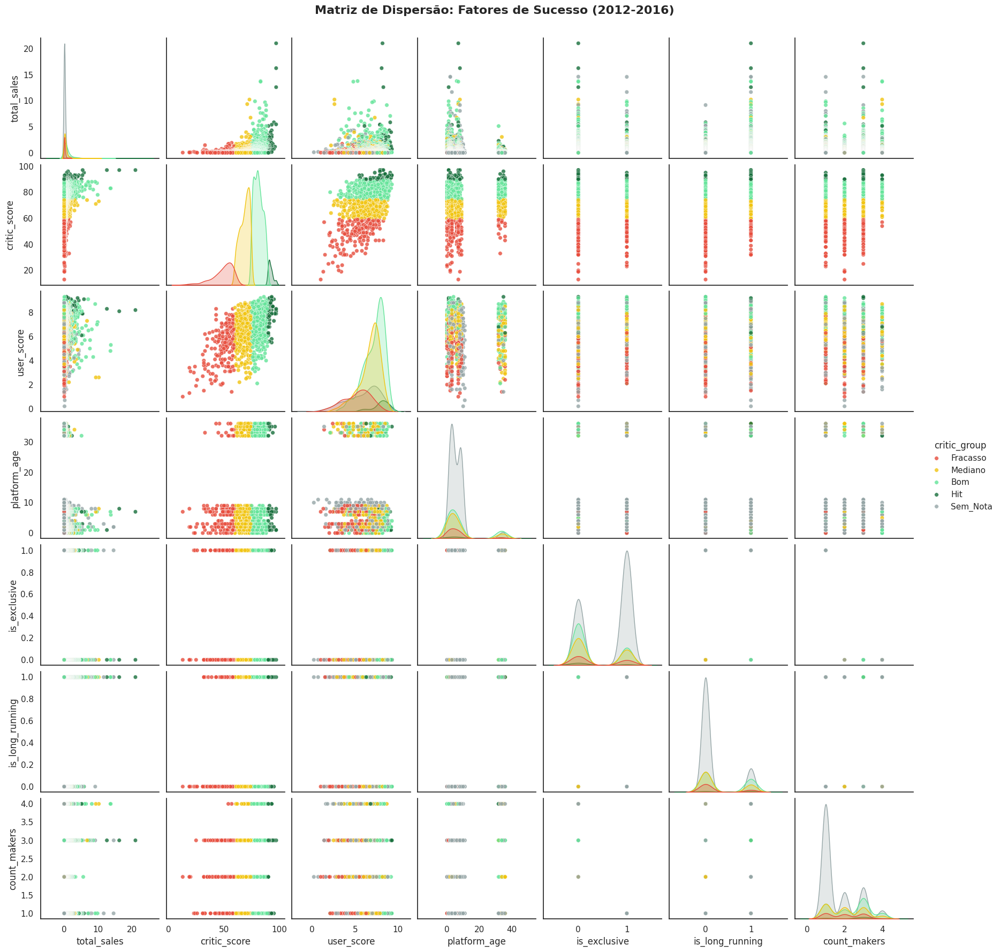

In [51]:
# Gerando PairPlot

# 1. Garantir que user_score é número (caso ainda não tenha tratado)
# df_relevante['user_score'] = pd.to_numeric(df_relevante['user_score'], errors='coerce')

# 1. Definir as colunas numéricas de interesse
cols_for_pairplot = [
    'total_sales', 
    'critic_score', 
    'user_score', 
    'platform_age', 
    'is_exclusive', 
    'is_long_running',
    'count_makers'
]

# 2. Gerar o Pairplot
# corner=True: Remove a metade repetida do gráfico (triângulo superior), deixando mais limpo.
sns.pairplot(
    df_relevante[cols_for_pairplot + ['critic_group']], # Adiciona critic_group só para o hue
    hue='critic_group',      # Colore pela qualidade (Hit, Bom, Fracasso)
    palette=critic_color_map, # Usa sua paleta de semáforo
    corner=False,             # Remove a parte de cima (duplicada) para limpar o visual
    plot_kws={'alpha': 0.8, 's': 30} # Transparência e tamanho dos pontos
)

plt.suptitle('Matriz de Dispersão: Fatores de Sucesso (2012-2016)', y=1.02, fontsize=16, fontweight='bold')
# plt.legend(bbox)
plt.show()

--------------------------------------------------------------------------------
--- Gerando Gráfico: 🔥 HEATMAP DE CORRELAÇÃO COMPLETO ---
--------------------------------------------------------------------------------


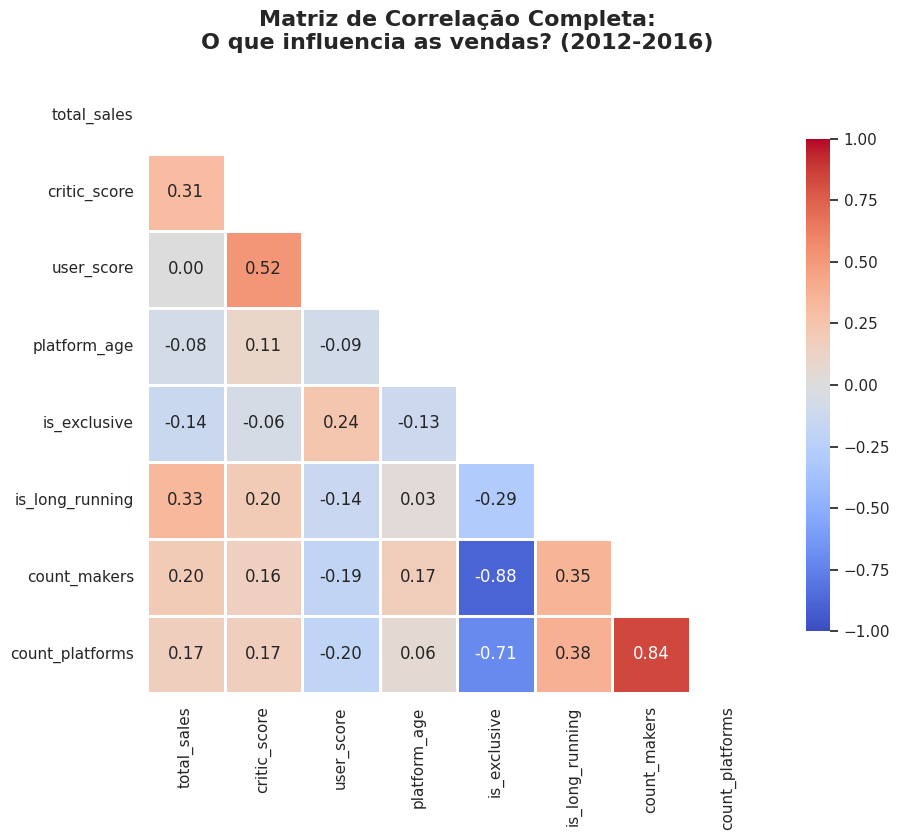

--------------------------------------------------------------------------------
--- Gerando Gráfico: 🔥 HEATMAP DE CORRELAÇÃO FOCADO NO ALVO (total_sales) ---
--------------------------------------------------------------------------------


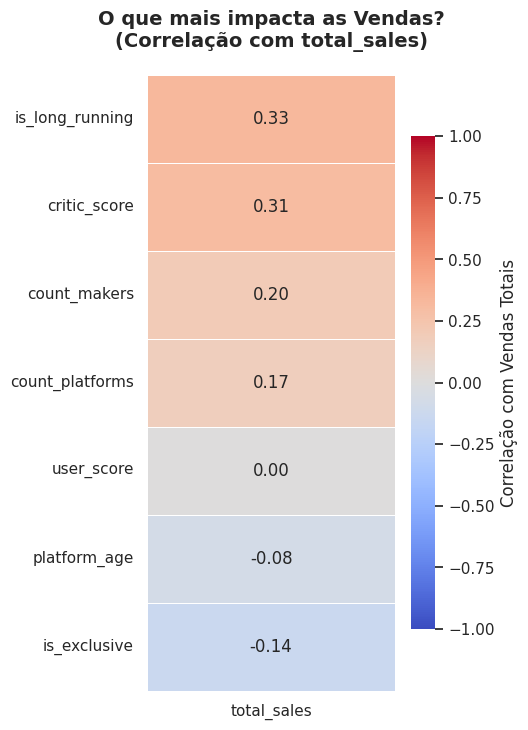

In [52]:
# =========================================================
# 4.6. MATRIZ DE DISPERSÃO E CORRELAÇÃO GERAL
# =========================================================
# <a id='toc4_6_'></a>

print('-'*80)
print("--- Gerando Gráfico: 🔥 HEATMAP DE CORRELAÇÃO COMPLETO ---")
print('-'*80)

# Selecionar colunas numéricas de interesse (as mesmas do pairplot)
cols_corr = [
    'total_sales', 
    'critic_score', 
    'user_score', 
    'platform_age', 
    'is_exclusive', 
    'is_long_running', 
    'count_makers',
    'count_platforms'
]

# Calcular a Matriz de Correlação (Usando df_relevante)
corr_matrix = df_relevante[cols_corr].corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=0) # máscara para esconder o triangulo superior, incluindo a primeira diagonal (k=0)

# 3. Plotar o Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix, 
    mask=mask,
    annot=True,       # Mostra os números
    cmap='coolwarm',  # Azul (Negativo) a Vermelho (Positivo)
    fmt=".2f",        # 2 casas decimais
    linewidths=1,       # Linhas brancas entre quadrados
    vmin=-1, vmax=1,  # Fixa a escala de -1 a 1
    center=0,         # Garante que o branco seja o zero
    cbar_kws={"shrink": .8} # Deixa a barra de cores menor
)

plt.title('Matriz de Correlação Completa:\nO que influencia as vendas? (2012-2016)', fontsize=16, fontweight='bold', pad=20)
plt.show()


# =========================================================
# 4.6.b. HEATMAP FOCADO NO ALVO (total_sales)
# =========================================================

print('-'*80)
print("--- Gerando Gráfico: 🔥 HEATMAP DE CORRELAÇÃO FOCADO NO ALVO (total_sales) ---")
print('-'*80)


# 1. Calcular a matriz de correlação completa
corr_matrix = df_relevante[cols_corr].corr()

# 2. Filtrar apenas a coluna do Alvo e ordenar por força da correlação
target_corr = corr_matrix[['total_sales']].drop('total_sales') # Remove a auto-correlação (1.0)
target_corr = target_corr.sort_values(by='total_sales', ascending=False)

# 3. Plotar
plt.figure(figsize=(4, 8)) # Figura estreita e alta

sns.heatmap(
    target_corr, 
    annot=True, 
    cmap='coolwarm', 
    fmt=".2f", 
    vmin=-1, vmax=1, 
    cbar_kws={"label": "Correlação com Vendas Totais", "shrink": .8},
    linewidths=0.5,
    linecolor='white'         # Garante que o branco seja o zero
)

plt.title('O que mais impacta as Vendas?\n(Correlação com total_sales)', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('') # Remove rótulo Y
plt.show()

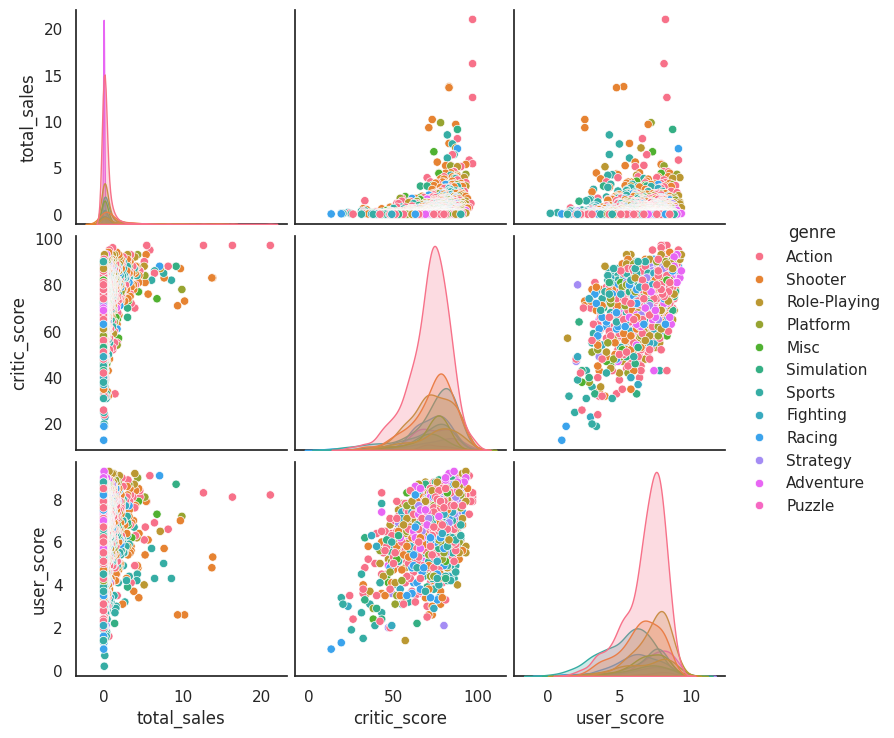

In [53]:
# hue='genre' colore os pontos baseados no gênero
sns.pairplot(df_relevante[['total_sales', 'critic_score', 'user_score', 'genre']], hue='genre')

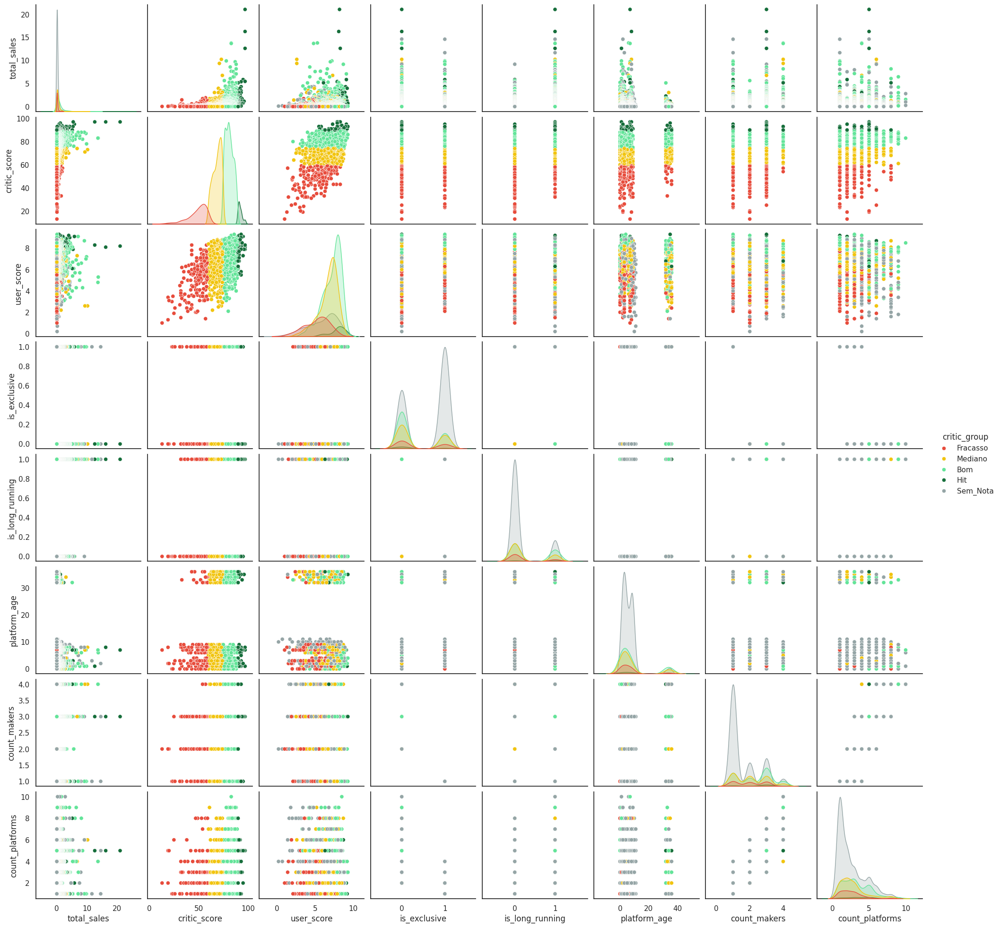

In [54]:
# hue='genre' colore os pontos baseados no gênero
colunas = ['total_sales', 'critic_score', 'user_score', 'genre', 'is_exclusive', 'is_long_running','platform_age', 'generation', 'count_makers','count_platforms','critic_group']
sns.pairplot(df_relevante[colunas], diag_kind='kde', hue='critic_group', palette=critic_color_map)

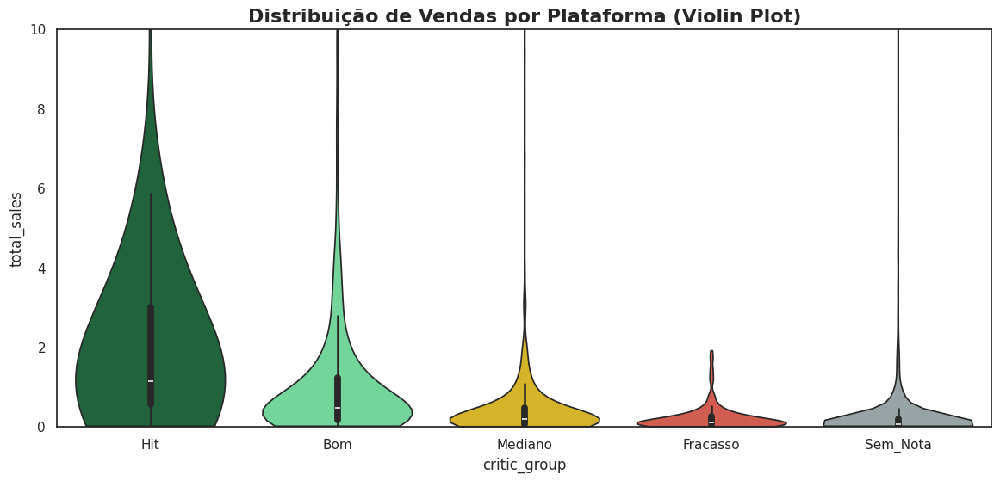

In [55]:
# Distribuição de Vendas por Plataforma (Violin Plot)
order_over = ['Hit', 'Bom', 'Mediano', 'Fracasso', 'Sem_Nota']

plt.figure(figsize=(14, 6))
sns.violinplot(x='critic_group', y='total_sales', data=df_relevante, palette=critic_color_map, hue='critic_group', order=order_over, cut=0)
plt.title("Distribuição de Vendas por Plataforma (Violin Plot)")
plt.ylim(0, 10) # Zoom para ver a base, já que temos outliers gigantes
# plt.yscale('log')
plt.show()

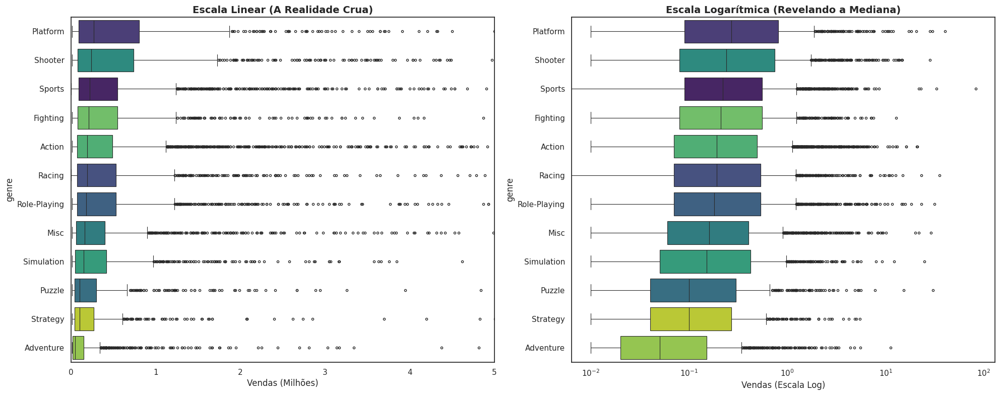

In [56]:
# Configuração para comparação
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Ordenação pela mediana
order_genre = df.groupby('genre')['total_sales'].median().sort_values(ascending=False).index

# --- GRÁFICO 1: ESCALA LINEAR (NORMAL) ---
sns.boxplot(
    x='total_sales', y='genre', data=df, order=order_genre, 
    ax=axes[0], palette='viridis', hue='genre', legend=False,
    fliersize=3, linewidth=0.8
)
axes[0].set_title('Escala Linear (A Realidade Crua)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Vendas (Milhões)')
axes[0].set_xlim(0, 5) # Dei um zoom até 5M, senão o gráfico fica ilegível pelos outliers de 80M

# --- GRÁFICO 2: ESCALA LOGARÍTMICA (O INSIGHT) ---
sns.boxplot(
    x='total_sales', y='genre', data=df, order=order_genre, 
    ax=axes[1], palette='viridis', hue='genre', legend=False,
    fliersize=3, linewidth=0.8
)
axes[1].set_xscale('log') # <--- AQUI MUDA TUDO
axes[1].set_title('Escala Logarítmica (Revelando a Mediana)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Vendas (Escala Log)')

plt.tight_layout()
plt.show()

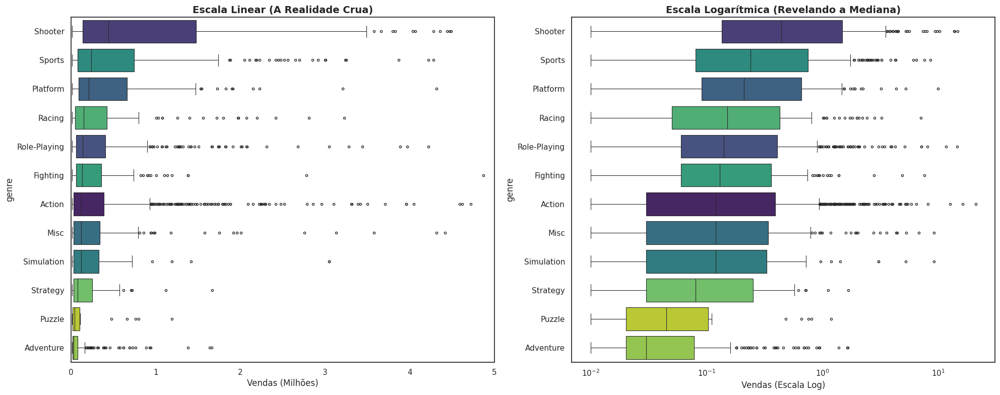

In [57]:
# Comparando Escala Linear com Escala Log

# Configuração para comparação
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Ordenação pela mediana
order_genre_rel = df_relevante.groupby('genre')['total_sales'].median().sort_values(ascending=False).index

# --- GRÁFICO 1: ESCALA LINEAR (NORMAL) ---
sns.boxplot(
    x='total_sales', y='genre', data=df_relevante, order=order_genre_rel, 
    ax=axes[0], palette='viridis', hue='genre', legend=False,
    fliersize=3, linewidth=0.8
)
axes[0].set_title('Escala Linear (A Realidade Crua)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Vendas (Milhões)')
axes[0].set_xlim(0, 5) # Dei um zoom até 5M, senão o gráfico fica ilegível pelos outliers de 80M

# --- GRÁFICO 2: ESCALA LOGARÍTMICA (O INSIGHT) ---
sns.boxplot(
    x='total_sales', y='genre', data=df_relevante, order=order_genre_rel, 
    ax=axes[1], palette='viridis', hue='genre', legend=False,
    fliersize=3, linewidth=0.8
)
axes[1].set_xscale('log') # <--- AQUI MUDA TUDO
axes[1].set_title('Escala Logarítmica (Revelando a Mediana)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Vendas (Escala Log)')

plt.tight_layout()
plt.show()

### 📊 **Histórico de Lançamentos:**<br>***Quantos jogos foram lançados por ano?***

- Para responder a esta pergunta e entender se os dados de cada período são significativos, agrupei os dados por `'year_of_release'` e contei o número de jogos (`'name'`).
- Esta visualização é a nossa primeira etapa para entender a história do mercado de games, identificar "eras" e determinar quais períodos são relevantes para uma análise moderna.

<br>

### **📊 Histórico de Lançamentos**
> ##### ***❓ Quantos jogos foram lançados por ano? Os dados de cada período são significativos?***
---

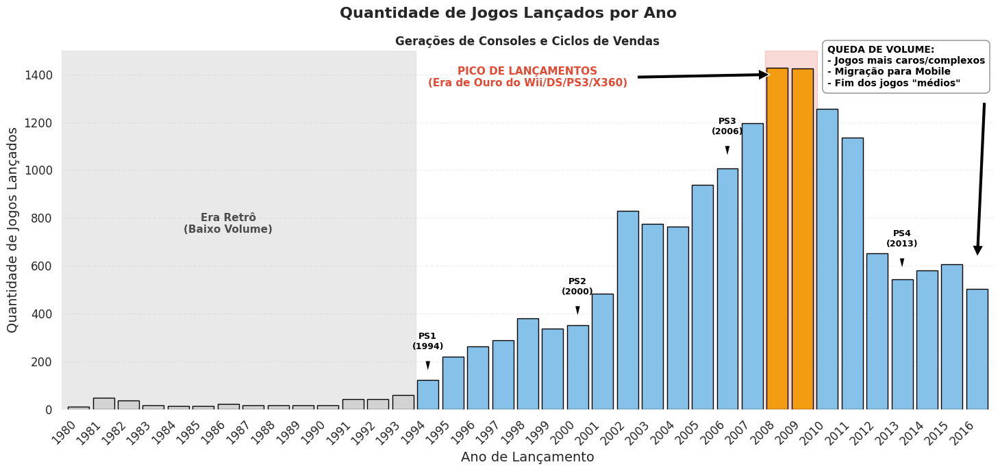

In [58]:
# 1. Jogos Lançados por Ano
display(Markdown(f"""<br>
                 
### **📊 Histórico de Lançamentos**
> ##### ***❓ Quantos jogos foram lançados por ano? Os dados de cada período são significativos?***
---"""))

# Agrupando os jogos ['name'] por ano de lançamento ('year_of_release') e contando as ocorrências por ano
jogos_por_ano = df.groupby('year_of_release')['name'].count()

# ----------------------------------------------------------------------------------------
# 📊 [Gráfico 1] Jogos Lançados por Ano: Geração de Consoles e Ciclos de Vendas (Barra)
# ----------------------------------------------------------------------------------------

# Selecionando as Cores da Palheta
cores = []
for ano in jogos_por_ano.index:
    if ano < 1994:
        cores.append('lightgray')   
    elif ano in [2008, 2009]:
        cores.append(COR_DESTAQUE)  
    else:
        cores.append(COR_BASE)     

# 3. Plotar
plt.figure(figsize=(15, 7))
ax = jogos_por_ano.plot(kind='bar', color=cores, width=0.85, edgecolor='black')

plt.axvline(x=1994,           # Posição no eixo X
            color='red',      # Cor da linha
            linestyle='--',   # Estilo (tracejado)
            linewidth=2,      # Largura
            label='Lançamento do PS1') # Label para a legenda (opcional)

# --- ANOTAÇÕES PARTE 1: MARCOS PLAYSTATION ---
# Função para padronizar as setas dos consoles
def anotar_console(ano, texto, altura_seta, altura_texto):
    if ano in jogos_por_ano.index:
        pos_x = jogos_por_ano.index.get_loc(ano)
        plt.annotate(texto, 
                     xy=(pos_x, altura_seta), 
                     xytext=(pos_x, altura_texto),
                     arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=6),
                     ha='center', fontsize=9, fontweight='bold', color='black')


# PS1 (1994) - O início do crescimento
anotar_console(1994, 'PS1\n(1994)', 150, 250)

# PS2 (2000) - O motor do "Boom"
anotar_console(2000, 'PS2\n(2000)', 380, 480)

# PS3 (2006) - O início da era HD
anotar_console(2006, 'PS3\n(2006)', 1050, 1150)

# PS4 (2013) - A geração atual (Início do período relevante)
anotar_console(2013, 'PS4\n(2013)', 580, 680)


# --- ANOTAÇÕES PARTE 2: CONTEXTO DE MERCADO (PICO E QUEDA) ---

# 1. Pico (Seta apontando para o topo de 2008)

plt.annotate('PICO DE LANÇAMENTOS\n(Era de Ouro do Wii/DS/PS3/X360)', 
             xy=(jogos_por_ano.index.get_loc(2008), 1400), # Posição da ponta da seta
             xytext=(jogos_por_ano.index.get_loc(1998), 1350), # Posição do texto
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=11, fontweight='bold', color='#e34a33',
             ha='center')
plt.axvspan(xmin=27.5, xmax=29.6, color='#e34a33', alpha=0.2, zorder=0)


# 2. Queda (Seta apontando para o declínio após 2010)
plt.annotate('QUEDA DE VOLUME:\n- Jogos mais caros/complexos\n- Migração para Mobile\n- Fim dos jogos "médios"', 
             xy=(jogos_por_ano.index.get_loc(2016), 600), # Posição da ponta da seta
             xytext=(jogos_por_ano.index.get_loc(2010), 1350), # Posição do texto
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=10, fontweight='bold', color='black',
             ha='left',bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="gray", pad=20, alpha=0.9))

# 3. Era Retrô
plt.text(x=jogos_por_ano.index.get_loc(1986), y=775, 
         s='Era Retrô\n(Baixo Volume)',
         fontsize=11, color='#4d4d4d', fontweight='bold',
         ha='center', va='center')
plt.axvspan(xmin=-10, xmax=13.5, color='#e0e0e0', alpha=0.7, zorder=0)

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# --- Estilização Final ---
plt.suptitle('Quantidade de Jogos Lançados por Ano', fontsize=16, fontweight='bold')
plt.title('Gerações de Consoles e Ciclos de Vendas', fontsize=12)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Quantidade de Jogos Lançados', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()

plt.show()

# Análise
# print('Quantidade de Jogos Lançados por Ano:\n', jogos_por_ano.T)

# Pergunta: Os dados de todos os períodos são significativos?

# Resposta: Não. Antes de 1994 (era pré-PlayStation) o volume é muito baixo.
# O pico foi 2008/2009, e depois caiu (devido ao aumento da complexidade/custo de desenvolvimento e jogos mobile).

> ***``❓ Quantos jogos foram lançados por ano? Os dados de cada período são signifcativos?``***

> #### 👉 **``Resposta:``**
>
> O gráfico acima mostra os dados de todos os períodos **NÃO SÃO IGUALMENTE SIGNIFCICATIVOS** para nossa análise.

<br>

> #### 💡 **``Análise do gráfico:``**
> - Vemos que antes de `1994` (a "Era Retrô", pré-PlayStation) o volume de lançamentos é muito baixo e estatisticamente irrelevante.
> - O mercado atingiu seu pico absoluto em **2008-2009** (o auge do Wii, DS, PS3 e X360).
> - Após 2011, o volume de lançamentos caiu abruptamente e se estabilizou em um "novo normal", impactado pela complexidade do desenvolvimento (jogos AAA) e pela migração do público casual para jogos mobile.

<br>

> ##### ℹ️ **Tabela: ``Quantidade de Jogos Lançados por Ano:``**
> 
| Ano | Jogos<br>Lançados | Percentual (%) | Cumulativo (%) |
|---:|:---:|:---:|:---:|
| 1980 | 9 | 0.1 % | 0.1 % |
| 1981 | 46 | 0.3 % | 0.3 % |
| 1982 | 36 | 0.2 % | 0.6 % |
| 1983 | 17 | 0.1 % | 0.7 % |
| 1984 | 14 | 0.1 % | 0.7 % |
| 1985 | 13 | 0.1 % | 0.8 % |
| 1986 | 21 | 0.1 % | 0.9 % |
| 1987 | 16 | 0.1 % | 1.0 % |
| 1988 | 15 | 0.1 % | 1.1 % |
| 1989 | 17 | 0.1 % | 1.2 % |
| 1990 | 16 | 0.1 % | 1.3 % |
| 1991 | 41 | 0.2 % | 1.6 % |
| 1992 | 43 | 0.3 % | 1.8 % |
| 1993 | 60 | 0.4 % | 2.2 % |
| 1994 | 121 | 0.7 % | 3.0 % |
| 1995 | 219 | 1.3 % | 4.3 % |
| 1996 | 263 | 1.6 % | 5.9 % |
| 1997 | 289 | 1.8 % | 7.6 % |
| 1998 | 379 | 2.3 % | 9.9 % |
| 1999 | 338 | 2.1 % | 12.0 % |
| 2000 | 350 | 2.1 % | 14.1 % |
| 2001 | 482 | 2.9 % | 17.1 % |
| 2002 | 829 | 5.0 % | 22.1 % |
| 2003 | 775 | 4.7 % | 26.8 % |
| 2004 | 762 | 4.6 % | 31.5 % |
| 2005 | 938 | 5.7 % | 37.2 % |
| 2006 | 1006 | 6.1 % | 43.3 % |
| 2007 | 1197 | 7.3 % | 50.6 % |
| 2008 | 1427 | 8.7 % | 59.2 % |
| 2009 | 1426 | 8.7 % | 67.9 % |
| 2010 | 1255 | 7.6 % | 75.5 % |
| 2011 | 1136 | 6.9 % | 82.5 % |
| 2M2 | 651 | 4.0 % | 86.4 % |
| 2013 | 544 | 3.3 % | 89.7 % |
| 2014 | 581 | 3.5 % | 93.3 % |
| 2015 | 606 | 3.7 % | 96.9 % |
| 2016 | 502 | 3.1 % | 100.0 % |

---

### [📊 **Vendas Totais por Plataforma**](#toc0_3)

> ***`❓ Como as vendas de jogos variaram de plataforma para plataforma?`***
 
Para responder a esta pergunta, agrupei os dados por platform e somei a `'total_sales'` para obter uma visão geral do sucesso histórico de cada console.

O gráfico de barras horizontal (Top 20) nos permite visualizar rapidamente quais plataformas dominaram o mercado em termos de vendas de software ao longo de todo o período (1980-2016).

----------------------------------------------------------------------------------------------------
Visualização: 📊 Gráfico 2: Vendas por Plataforma (Plataformas Atuais vs. Obsoletas) (Barra)
----------------------------------------------------------------------------------------------------


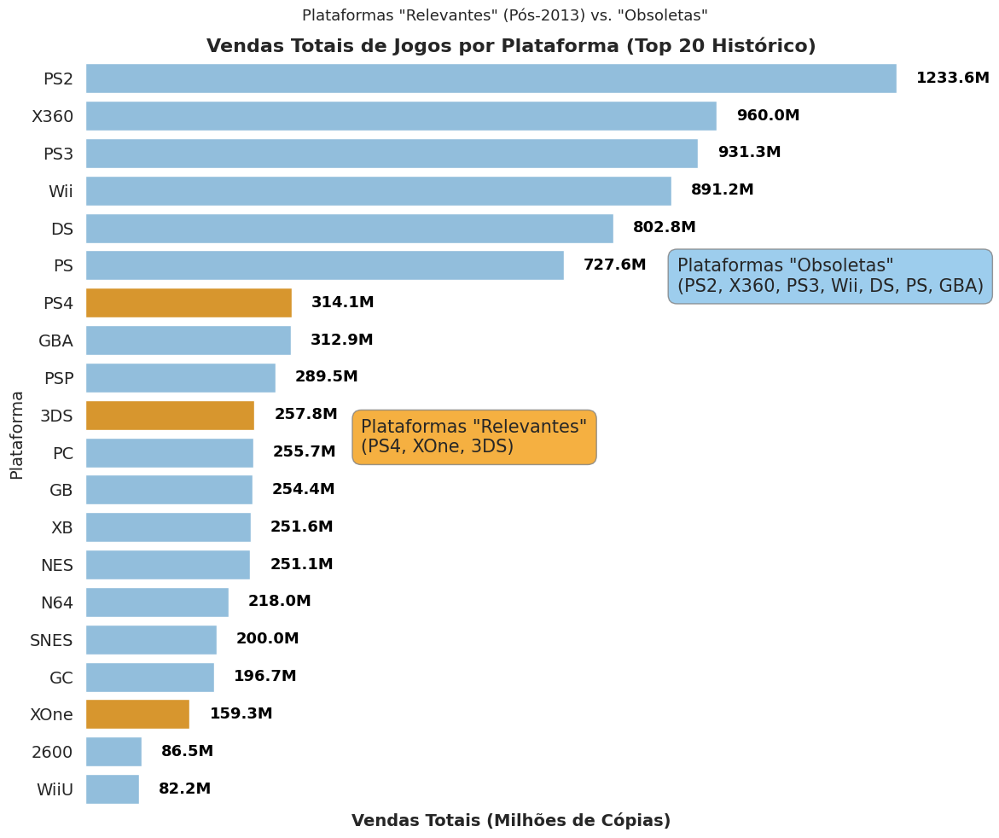

Vendas Totais por Plataforma (Top 20):
 platform
PS2     1233.56
X360     959.99
PS3      931.33
Wii      891.18
DS       802.76
PS       727.58
PS4      314.14
GBA      312.88
PSP      289.53
3DS      257.81
PC       255.68
GB       254.43
XB       251.57
NES      251.05
N64      218.01
SNES     200.04
GC       196.73
XOne     159.32
2600      86.48
WiiU      82.19
Name: total_sales, dtype: float64


In [59]:
# 2. Vendas Totais de Jogos por Plataforma
# Como as vendas variaram de plataforma para plataforma?

# Preparar os dados
vendas_por_plataforma = df.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
top_20 = vendas_por_plataforma.head(20)

# --------------------------------------------------------------------------------
# 📊 Gráfico 2: Vendas por Plataforma (Plataformas Atuais vs. Obsoletas) (Barra)
# --------------------------------------------------------------------------------

# Visualizando
print('-'*100)
print('Visualização: 📊 Gráfico 2: Vendas por Plataforma (Plataformas Atuais vs. Obsoletas) (Barra)')
print('-'*100)

# Visualização Extra: Vendas Totais por Plataforma (Toda a História)
# Destaque: Plataformas Atuais vs. Obsoletas
    # Top 10 de todos os tempos 
    # comparando plataformas com muitas vendas X as atuais

# Selecionar plataformas para colorir em destaque (cor amarela) 
# Definir plataformas ainda são "relevantes" (continuam ativas após 2013)
# O "PC" não está no top 10 de vendas totais para o período, mas PS4, XOne e 3DS estão.
plataformas_relevantes = ['PS4', 'XOne', '3DS']

# Aplicando as cores para cada plataforma
cores = []
for p in top_20.index:
    if p in plataformas_relevantes:
        cores.append(COR_DESTAQUE)
    else:
        cores.append(COR_BASE)

# 3. Plotar
plt.figure(figsize=(12, 10))
ax = sns.barplot(
    x=top_20.values,  
    y=top_20.index,   
    palette=cores,           # Usa a lista de cores
    legend=False,
    hue=top_20.index
)

# --- ANOTAÇÕES STORYTELLING ---

plt.text(x=900, y=5.7, # Posição: Vendas=800, Posição da Barra=4.7 (DS/PS)
         s='Plataformas "Obsoletas"\n(PS2, X360, PS3, Wii, DS, PS, GBA)',
         fontsize=15, 
         bbox=dict(boxstyle="round,pad=0.5", fc=COR_BASE, ec="gray", alpha=0.8))

plt.text(x=420, y=10, # Posição: Vendas=400, Posição da Barra=10 (3DS)
         s='Plataformas "Relevantes"\n(PS4, XOne, 3DS)',
         fontsize=15, 
         bbox=dict(boxstyle="round,pad=0.5", fc=COR_DESTAQUE, ec="gray", alpha=0.8))


# --- ANOTAÇÕES: Adicionando os valores nas barras manualmente ---
for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y()
    height = bar.get_height()
    
    ax.text(
        x=width +30,      # Posição X: Fim da barra + 1 de espaço
        y=y + height / 2, # Posição Y: No meio da barra
        s=f'{width:.1f}M', 
        ha='left',         
        va='center',       
        fontsize=13,
        fontweight='bold',
        color='black'
    )

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# --- Estilização Final ---
plt.title('Vendas Totais de Jogos por Plataforma (Top 20 Histórico)', fontsize=16, fontweight='bold')
plt.suptitle('Plataformas "Relevantes" (Pós-2013) vs. "Obsoletas"', fontsize=13)
plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold')
plt.ylabel('Plataforma', fontsize=14)

plt.xticks([]) # Removendo xticks redundantes
plt.yticks(fontsize=14)

plt.tight_layout()

plt.show()


# -------------------------------------------------------

# Análise
# Imprime o Top 20 que foi plotado
print('Vendas Totais por Plataforma (Top 20):\n', top_20)


> ***`❓ Como as vendas de jogos variaram de plataforma para plataforma?`***

> #### 👉 **``Resposta:``**
>
> O gráfico acima mostra os "vencedores" de todos os tempos.

<br>

> #### 💡 **``Análise do gráfico:``**
> - A descoberta mais importante é que todas as **5 maiores plataformas são**<br>
**gerações passadas (obsoletas)**, o que reforça a ideia de que não<br>
devemos usar todos os dados históricos para prever o futuro.

<br>

> #### ℹ️ **Tabela: ``Vendas Totais de Jogos por Plataforma (1980-2016)``**
> 
| Platforma | Total de Vendas (un.) |
| :--- | :---: |
| PS2 | 1255.77 |
| X360 | 970.17 |
| PS3 | 939.16 |
| Wii | 907.51 |
| DS | 806.10 |
| PS | 730.86 |
| GBA | 317.85 |
| PS4 | 314.14 |
| PSP | 294.05 |
| PC | 259.44 |
| 3DS | 259.00 |
| XB | 257.74 |
| GB | 255.46 |
| NES | 251.05 |
| N64 | 218.68 |
| SNES | 200.04 |
| GC | 198.93 |
| XOne | 159.32 |
| 2600 | 96.98 |
| WiiU | 82.19 |
| PSV | 54.07 |
| SAT | 33.59 |
| GEN | 28.35 |
| DC | 15.95 |
| SCD | 1.86 |
| NG | 1.44 |
| WS | 1.42 |
| TG16 | 0.16 |
| 3DO | 0.10 |
| GG | 0.04 |
| PCFX | 0.03 |


---

## ⏳ **Ciclo de Vida das Plataformas**

### [**Ciclo de Vida das Plataformas - Vendas** (Linha)](#toc0_3)

> ***``❓ Quais as plataformas com as maiores vendas e como a distribuição por ano mudou?``***

Após identificar as plataformas mais vendidas na história (Análise 2), o próximo passo é entender o seu "ciclo de vida".<br>
Um gráfico de linha nos permite visualizar a ascensão, o pico e a queda das vendas de consoles para cada plataforma ao longo dos anos.<br>
Para esta análise, selecionei as **6 maiores plataformas históricas** (`PS2`, `X360`, `PS3`, `Wii`, `DS`, `PS`),<br>e adicionei as **2 plataformas relevantes mais recentes** (`PS4`, `XOne`) para uma comparação completa das gerações.


In [60]:
# 1. Agrupamento para pegar limites e contagem total
life_cycle = df.groupby('platform').agg({
    'year_of_release': ['min', 'max'],
    'name': 'count'
})

# Ajustando os nomes das colunas
life_cycle.columns = ['Primeiro Lançamento', 'Último Lançamento', 'Total de Jogos']

# 2. Calculando o Tempo de Vida (Duração)
# Adicionamos +1 para contar o ano inclusivo (ex: 2000 a 2000 = 1 ano de vida)
life_cycle['Tempo de Vida (Anos)'] = life_cycle['Último Lançamento'] - life_cycle['Primeiro Lançamento'] + 1

# 3. Calculando a Média Real (Total / Tempo de Vida)
life_cycle['Média Jogos/Ano'] = (life_cycle['Total de Jogos'] / life_cycle['Tempo de Vida (Anos)']).round(1)

# 4. Ordenação e Limpeza
# Vamos ordenar pelo ano de lançamento para ver a história cronológica
life_cycle = life_cycle.sort_values('Primeiro Lançamento')

print("📊 Tabela de Ciclo de Vida dos Consoles:")
display(life_cycle)

📊 Tabela de Ciclo de Vida dos Consoles:


,Primeiro Lançamento,Último Lançamento,Total de Jogos,Tempo de Vida (Anos),Média Jogos/Ano
platform,,,,,
2600,1980,1989,116,10,11.6
NES,1983,1994,98,12,8.2
PC,1985,2016,956,32,29.9
GB,1988,2001,97,14,6.9
GEN,1990,1994,27,5,5.4
SNES,1990,1999,239,10,23.9
GG,1992,1992,1,1,1.0
NG,1993,1996,12,4,3.0
SCD,1993,1994,6,2,3.0


In [61]:
# ---------------------------------------------------------
# 1. Preparação dos Dados (Unificando tudo)
# ---------------------------------------------------------
# Agrupa por plataforma para pegar métricas vitais
df_stats = df.groupby('platform').agg({
    'year_of_release': ['min', 'max'],
    'name': 'count'
})

# Renomeia colunas (achatando o MultiIndex)
df_stats.columns = ['Primeiro Lançamento', 'Último Lançamento', 'Total de Jogos']

# Calcula métricas derivadas
df_stats['Tempo de Vida (Anos)'] = df_stats['Último Lançamento'] - df_stats['Primeiro Lançamento'] + 1
df_stats['Média Lançamentos/Ano'] = (df_stats['Total de Jogos'] / df_stats['Tempo de Vida (Anos)'])

# Filtra plataformas muito pequenas para não poluir (opcional, ex: > 10 jogos)
df_stats = df_stats[df_stats['Total de Jogos'] > 10]

# Ordena por Média de Lançamentos (os mais "quentes" no topo)
df_stats = df_stats.sort_values('Média Lançamentos/Ano', ascending=False)

# ---------------------------------------------------------
# 2. Aplicação do Heatmap (Estilização)
# ---------------------------------------------------------
# cmap='YlGn' -> Yellow to Green (Amarelo para Verde)
# cmap='Blues' -> Gradiente de Azul
# cmap='Oranges' -> Gradiente de Laranja

tabela_estilizada = df_stats.style.format({
    'Primeiro Lançamento': '{:.0f}',
    'Último Lançamento': '{:.0f}',
    'Total de Jogos': '{:,.0f}',
    'Tempo de Vida (Anos)': '{:.0f} anos',
    'Média Lançamentos/Ano': '{:.1f}'
}).background_gradient(
    subset=['Total de Jogos'], cmap='Greens' # Verde para volume total
).background_gradient(
    subset=['Média Lançamentos/Ano'], cmap='YlOrRd' # Amarelo->Vermelho para intensidade
).background_gradient(
    subset=['Tempo de Vida (Anos)'], cmap='Blues' # Azul para longevidade
).set_caption("🔥 Performance das Plataformas: Intensidade e Longevidade")

# Exibir
display(tabela_estilizada)

,Primeiro Lançamento,Último Lançamento,Total de Jogos,Tempo de Vida (Anos),Média Lançamentos/Ano
platform,,,,,
DS,2004,2013,"2,120",10 anos,212.0
PS2,2000,2011,"2,127",12 anos,177.2
PS,1994,2003,"1,190",10 anos,119.0
PS3,2006,2016,"1,305",11 anos,118.6
Wii,2006,2016,"1,286",11 anos,116.9
X360,2005,2016,"1,231",12 anos,102.6
GBA,2000,2007,811,8 anos,101.4
PSP,2004,2015,"1,193",12 anos,99.4
PS4,2013,2016,392,4 anos,98.0


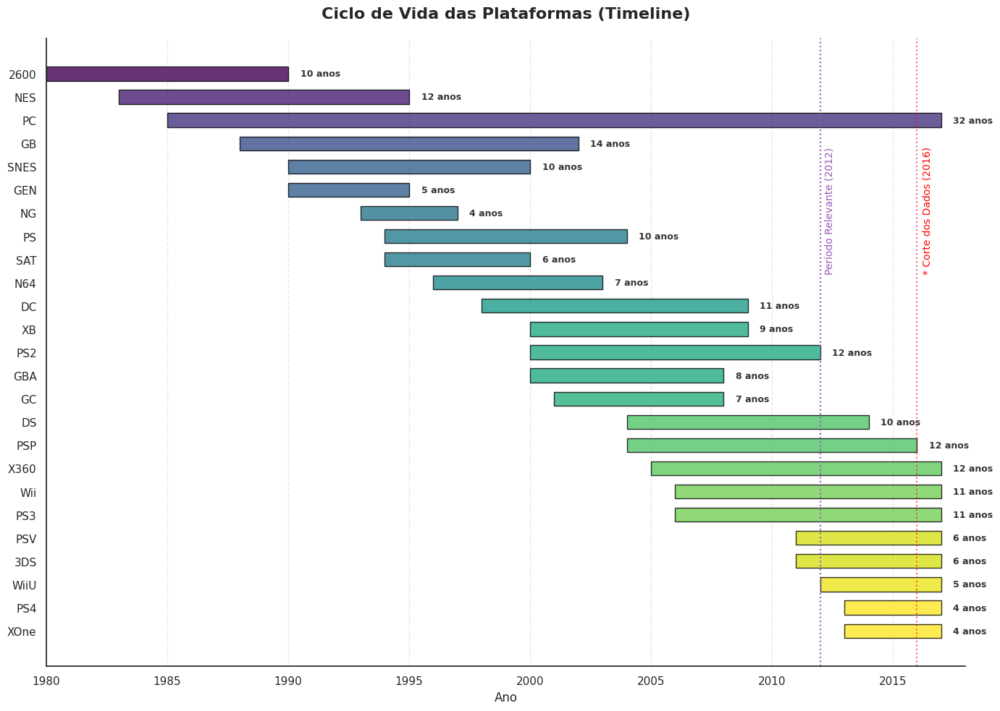

In [62]:
def plotar_ciclo_vida_consoles(df_lifecycle):
    """
    Plota um gráfico de barras horizontais flutuantes (Gantt Chart)
    mostrando o início e fim de cada plataforma.
    """
    # Preparação: Ordenar para que os mais antigos fiquem no topo (ou base)
    # Vamos filtrar plataformas com poucos jogos (< 10) para não poluir o gráfico, se quiser
    df_plot = df_lifecycle[df_lifecycle['Total de Jogos'] > 10].sort_values('Primeiro Lançamento', ascending=False)
    
    fig, ax = plt.subplots(figsize=(14, 10))

    # Cores: Vamos usar um gradiente baseada no ano de lançamento
    cmap = plt.get_cmap('viridis')
    norm = plt.Normalize(df_plot['Primeiro Lançamento'].min(), df_plot['Primeiro Lançamento'].max())
    colors = cmap(norm(df_plot['Primeiro Lançamento'].values))

    # PLOTAGEM (Barh com propriedade 'left')
    # left = onde a barra começa (Ano Min)
    # width = duração (Tempo de Vida)
    bars = ax.barh(
        y=df_plot.index, 
        width=df_plot['Tempo de Vida (Anos)'], 
        left=df_plot['Primeiro Lançamento'], 
        color=colors,
        edgecolor='black',
        alpha=0.8,
        height=0.6
    )

    # Decoração
    ax.set_title('Ciclo de Vida das Plataformas (Timeline)', fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Ano', fontsize=12)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    
    # Adicionar rótulos nas barras (Duração)
    for bar, duration in zip(bars, df_plot['Tempo de Vida (Anos)']):
        # Posição do texto: Fim da barra + pequeno espaço
        width = bar.get_width()
        y_pos = bar.get_y() + bar.get_height()/2
        x_pos = bar.get_x() + width + 0.5
        
        ax.text(x_pos, y_pos, f'{int(duration)} anos', 
                va='center', fontsize=9, color='#333333', fontweight='bold')

    # Ajustes finais dos eixos
    ax.set_xlim(1980, 2018) # Margem para caber os textos
    
    # Destacar o período relevante (2012)
    ax.axvline(2012, color=COR_PERIODO_RELEVANTE, linestyle=':')
    ax.text(2012.2, ax.get_ylim()[0] + 17, 'Período Relevante (2012)', color=COR_PERIODO_RELEVANTE, fontsize=10, rotation=90)

    # Destacar o ano 2016 (corte dos dados)
    ax.axvline(2016, color='red', linestyle=':', alpha=0.6)
    ax.text(2016.2, ax.get_ylim()[0] + 17, '* Corte dos Dados (2016)', color='red', fontsize=10, rotation=90)

    sns.despine()

    plt.tight_layout()
    plt.show()

# Chamando a função com a tabela criada no passo 1
plotar_ciclo_vida_consoles(life_cycle)

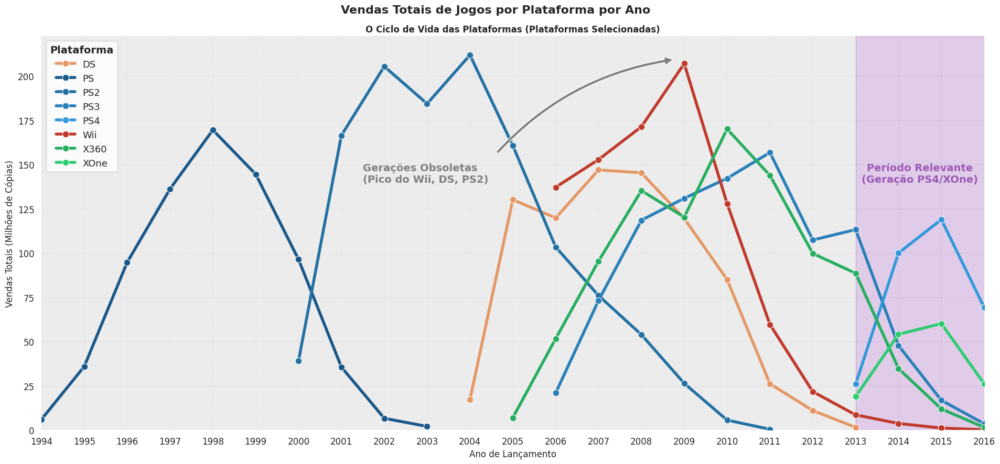

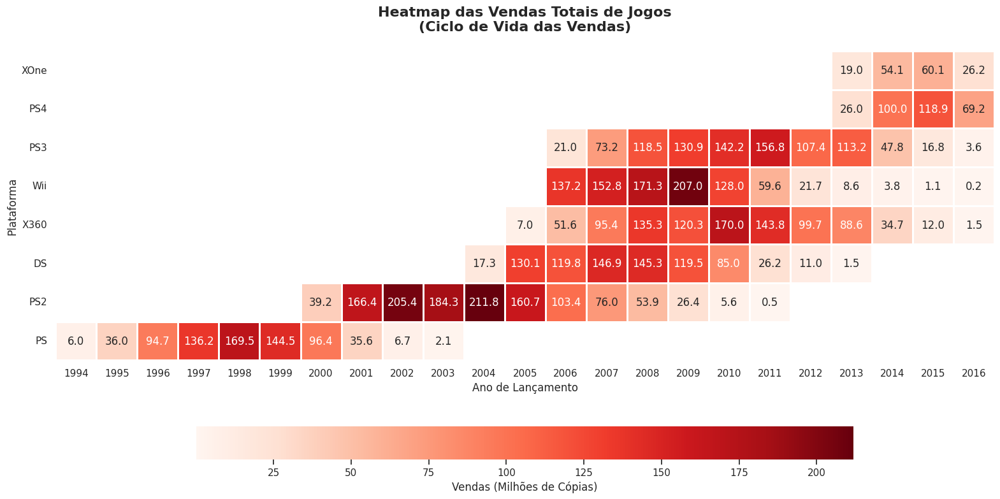

Exibindo as Vendas Totais de Jogos por Plataforma por Ano:
year_of_release  1994   1995  1996    1997    1998    1999   2000    2001    2002    2003    2004    2005    2006    2007    2008    2009    2010    2011    2012    2013   2014   2015   2016
platform                                                                                                                                                                                      
DS                                                                                          17.27  130.14  119.81  146.94  145.31  119.54   85.02   26.18   11.01    1.54                     
PS               6.03  35.96  94.7  136.17  169.49  144.53  96.37   35.59    6.67    2.07                                                                                                     
PS2                                                         39.17  166.43  205.38  184.31  211.81  160.66  103.42   75.99    53.9    26.4    5.64    0.45                        

In [63]:
# 3. Ciclo de Vida das Plataformas (Vendas)
# Quais as plataformas com as maiores vendas e como a distribuição por ano mudou?

# Distribuição por ano das maiores plataformas (Ciclo de Vida)

# --- PREPARANDO OS DADOS ---
# O Ciclo de Vida dos Consoles
# Justificativa para o "Corte" dos Dados

# Primeiro, identifiquei as plataformas com maiores vendas totais (selecionei as 6 maiores)
# vendas_por_plataforma = df.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
top_6_plataformas = vendas_por_plataforma.head(6).index

# Agora quero incluir 'PS4' e 'XOne' que não entraram na lista
# Para isso, vou criar uma NOVA lista que inclui as 6 'históricas' E as 2 'novas relevantes'
plataformas_para_analise = list(top_6_plataformas) # Converte o Index (nome das plataformas) para uma lista
plataformas_para_analise.extend(['PS4', 'XOne'])   # Adiciona as plataformas desejadas na lista
 
 # Filtrei o DataFrame para conter APENAS essas 8 plataformas
df_top_contagem = df[df['platform'].isin(plataformas_para_analise)]

# Criei uma tabela dinâmica (pivot table) para organizar os dados:
# Anos como índice, plataformas como colunas, e a soma das vendas como valores
pivot_table = df_top_contagem.pivot_table(index='year_of_release', 
                                 columns='platform', 
                                 values='total_sales', 
                                 aggfunc='sum')

# --------------------------------------------------------------------------------
# 📊 [Gráfico 3.1] Ciclo de Vida - Vendas (Linhas)
# --------------------------------------------------------------------------------

# 2. Plotar
plt.figure(figsize=(19, 9))
ax = sns.lineplot(data=pivot_table,
                  dashes=False,
                  linewidth=4, 
                  palette=platform_color_map, 
                  markers='o', 
                  markersize=9)


# --- ANOTAÇÕES: CONTANDO A HISTÓRIA ---

# 1. Destacar a "Era de Ouro" obsoleta (Wii, DS, PS2)
plt.annotate('Gerações Obsoletas\n(Pico do Wii, DS, PS2)', 
             xy=(2009, 210), # Posição da seta
             xytext=(2001.5, 140), # Posição do texto
             arrowprops=dict(facecolor='gray', shrink=0.05, connectionstyle="arc3,rad=-0.2"),
             fontsize=14, fontweight='bold', color='gray')
# axvspan = "destaque vertical"
# Período obsoleto
plt.axvspan(xmin=2013, xmax=1994, color="#e0e0e0", alpha=0.6) 


# 2. Destacar o "Período Relevante" para nossa previsão de 2017
# Desenhar um "box" cinza claro no fundo do gráfico

# axvspan = "destaque vertical"
# Período relevante
plt.axvspan(xmin=2013, xmax=2016, color=COR_PERIODO_RELEVANTE, alpha=0.3) 
plt.text(x=2014.5, y=140, 
         s='Período Relevante\n(Geração PS4/XOne)',
         fontsize=14, fontweight='bold', ha='center', color=COR_PERIODO_RELEVANTE)




# --- Estilização Final ---
plt.suptitle('Vendas Totais de Jogos por Plataforma por Ano', fontsize=16, fontweight='bold')
plt.title('O Ciclo de Vida das Plataformas (Plataformas Selecionadas)', fontsize=12)
plt.xlabel('Ano de Lançamento', fontsize=12)
plt.ylabel('Vendas Totais (Milhões de Cópias)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Coloca a legenda fora do gráfico para não poluir
# Atribui a variável leg para depois alterar o título da legenda
leg = plt.legend(title='Plataforma', loc='upper left', fontsize='13') 
# Define o título da legenda
plt.setp(leg.get_title(), fontsize=14, fontweight='bold') 

plt.tight_layout()

# --- Corrigindo os eixos ---
# xaxis -> 1 em 1 ano
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MultipleLocator(1)) 

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Definindo os limites pegando o primeiro e o último ano dos dados
min_year = pivot_table.index.min() 
max_year = pivot_table.index.max()

# Força o eixo X a ir apenas de 1994 a 2016 (min e max)
plt.xlim(min_year, max_year)

# Força o eixo Y a começar em 0 (sem espaço negativo embaixo)
plt.ylim(bottom=0)

# Limpando o gráfico
sns.despine(left=True, bottom=True) 



# --------------------------------------------------------------------------------
# 📊 [Gráfico 3.2] Ciclo de Vida - Vendas (Heatmap)
# --------------------------------------------------------------------------------

# Visualização complementar:
# Heatmap: Distribuição por ano das maiores plataformas (Ciclo de Vida)

# Para acertar o Heatmap pelo ano de lançamento de cada platafroma precisei fazer isso manualmente
plataformas_ordenadas_crono = [
    'XOne',  # Geração 8 (2013)
    'PS4',   # Geração 8 (2013)
    'PS3',   # Geração 7 (2006 - Console)
    'Wii',   # Geração 7 (2006 - Console)
    'X360',  # Geração 7 (2005 - Console)
    'DS',    # Geração 7 (2004 - Portátil)
    'PS2',   # Geração 6 (2000)
    'PS'     # Geração 5 (1994)
]

# Transpõe a tabela (Linhas=Plataforma, Colunas=Ano)
pivot_transposto = pivot_table.T

# Reordena as linhas (Plataformas) usando a nossa *nova lista cronológica*
pivot_ordenado = pivot_transposto.reindex(plataformas_ordenadas_crono)

# Prepara os dados para o heatmap (transforma 0 em NaN)
pivot_para_heatmap = pivot_ordenado.where(pivot_ordenado > 0)


# --- PLOTANDO O HEATMAP ---
plt.figure(figsize=(19, 9)) 

# 1. Definir as configurações da barra de cores (cbar)
cbar_config = {
    'label': 'Vendas (Milhões de Cópias)',
    'orientation': 'horizontal', 
    'location': 'bottom',        
    'shrink': 0.7,               
    'pad': 0.15                  
}

# 2. Plotar o heatmap com os dados ordenados cronologicamente
sns.heatmap(
    data=pivot_para_heatmap, 
    annot=True,       
    fmt=".1f",        
    cmap="Reds",      
    linewidths=1,    
    cbar_kws=cbar_config 
)

plt.title('Heatmap das Vendas Totais de Jogos\n(Ciclo de Vida das Vendas)\n', fontsize=16, fontweight='bold')
plt.xlabel('Ano de Lançamento', fontsize=12) 
plt.ylabel('Plataforma', fontsize=12)
plt.yticks(rotation=0) 

plt.show()

# Exibindo os dados brutos sem 'NaN' para facilitar a visualização 
print('='*100)
print('Exibindo as Vendas Totais de Jogos por Plataforma por Ano:')
print('='*100)
print(pivot_table.fillna('').T) # transpondo o resultado para facilitar exibição

> ***``❓ Quais as plataformas com as maiores vendas e como a distribuição por ano mudou?``***

> #### 💡 **``Resposta:``**
> 
> Pelo gráfico acima, conseguimos perceber claramente a "ascensão e queda" de cada plataforma.
>
> 1. **``Plataformas com picos claros:``**
>     - `PS2` (~2004), `Wii` (~2009), `DS` (~2008).
> 2. **``Gerações:``**
>     - Vemos o `PS3` e o `X360` crescendo, atingindo o pico e caindo juntos.
> 3. **``Tempo de vida:``**
>    - Um ciclo de vida típico (do lançamento à irrelevância) parece durar<br>
>     cerca de 10 anos (ex: `PS2` de 2000 a ~2011).
> 4. **``Plataformas mortas:``**
>    - `PS2`, `Wii` e `DS` estão com vendas em zero ou perto de zero no final.

<br>

> #### ℹ️ **Tabela: `Vendas Totais por Plataforma e Ano (Milhões de Cópias)`**
> 
| Plataforma | Vendas Totais | 1994 | 1995 | 1996 | 1997 | 1998 | 1999 | 2000 | 2001 | 2002 | 2003 | 2004 | 2005 | 2006 | 2007 | 2008 | 2009 | 2010 | 2011 | 2012 | 2013 | 2014 | 2015 | 2016 |
| :--- | :---: | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **PS2** | **1233.56M** | | | | | | | 39.17 | 166.43 | 205.38 | 184.31 | 211.81 | 160.66 | 103.42 | 75.99 | 53.90 | 26.40 | 5.64 | 0.45 | | | | | |
| **X360** | **959.99M** | | | | | | | | | | | | 7.00 | 51.62 | 95.41 | 135.26 | 120.29 | 170.03 | 143.84 | 99.74 | 88.58 | 34.74 | 11.96 | 1.52 |
| **PS3** | **931.33M** | | | | | | | | | | | | | 20.96 | 73.19 | 118.52 | 130.93 | 142.17 | 156.78 | 107.35 | 113.25 | 47.76 | 16.82 | 3.60 |
| **Wii** | **891.18M** | | | | | | | | | | | | | 137.15 | 152.77 | 171.32 | 206.97 | 127.95 | 59.65 | 21.71 | 8.59 | 3.75 | 1.14 | 0.18 |
| **DS** | **802.76M** | | | | | | | | | | | 17.27 | 130.14 | 119.81 | 146.94 | 145.31 | 119.54 | 85.02 | 26.18 | 11.01 | 1.54 | | | |
| **PS** | **727.58M** | 6.03 | 35.96 | 94.70 | 136.17 | 169.49 | 144.53 | 96.37 | 35.59 | 6.67 | 2.07 | | | | | | | | | | | | | |
| **PS4** | **314.14M** | | | | | | | | | | | | | | | | | | | | 25.99 | 100.00 | 118.90 | 69.25 |
| **XOne** | **159.32M** | | | | | | | | | | | | | | | | | | | | 18.96 | 54.07 | 60.14 | 26.15 |

---

## **Análise Estratégica (O Mercado Atual)**

### [**Correlação: Avaliações vs. Vendas**](#toc0_3)

##### ***``❓ Como as avaliações de usuários e profissionais afetam as vendas das plataformas populares?``***

Para responder a esta pergunta, gerei gráficos de dispersão (scatterplots) e calculei a correlação de Pearson (r) para as plataformas mais relevantes do período (``PS4``, ``XOne``, ``PS3``, ``X360``).

O objetivo é identificar se existe uma ligação estatística entre as notas da crítica/usuário e o sucesso de vendas.


##### 👉 **`Resposta:`**

A análise é conclusiva , como pode ser visto nos gráficos de dispersão a seguir:<br>
a **nota da crítica afeta as vendas**, enquanto a **nota do usuário é estatisticamente irrelevante**.

##### 💡 **`Análise (Descobertas):`**

1.  **`Nota da Crítica`:**<br>Existe uma **`correlação positiva moderada`** (r entre `0.33` e `0.41`).<br>Isso indica que **notas mais altas da crítica** *tendem* a estar associadas a **vendas mais altas**.

2.  **`Nota do Usuário`:**<br>A correlação é **efetivamente nula** (r próximo de `0.0`).<br>Isso sugere que a nota do usuário não tem uma relação estatística clara com o sucesso de vendas, provavelmente devido a fatores como o "review bombing".

##### 🎯 **`Conclusão Estratégica:`**

A nota da crítica (`critic_score`) é um indicador preditivo **muito mais confiável** para as vendas do que a nota do usuário (`user_score`).<br>Para a campanha de 2017, a **Ice** deve usar a **nota da crítica** como um fator-chave ao decidir quais jogos promover.

<br>

> ℹ️ **Tabela: `Coeficientes de Correlação (r) Avaliações X Vendas`**

| Plataforma | Correlação Crítica (r) | Correlação Usuário (r) |
| :---: | :---: | :---: |
| **PS4** | 0.406 | -0.034 |
| **XOne** | 0.410 | -0.094 |
| **X360** | 0.361 | -0.002 |
| **PS3** | 0.334 | 0.001 |
| ***RESULTADO<br>CORRELAÇÃO*** | 👍 Positiva Moderada | 0️⃣ Nula |

🎮 ANÁLISE DE CORRELAÇÃO: PS4

--- VIZ 1: Visão Completa (Com Outliers) ---


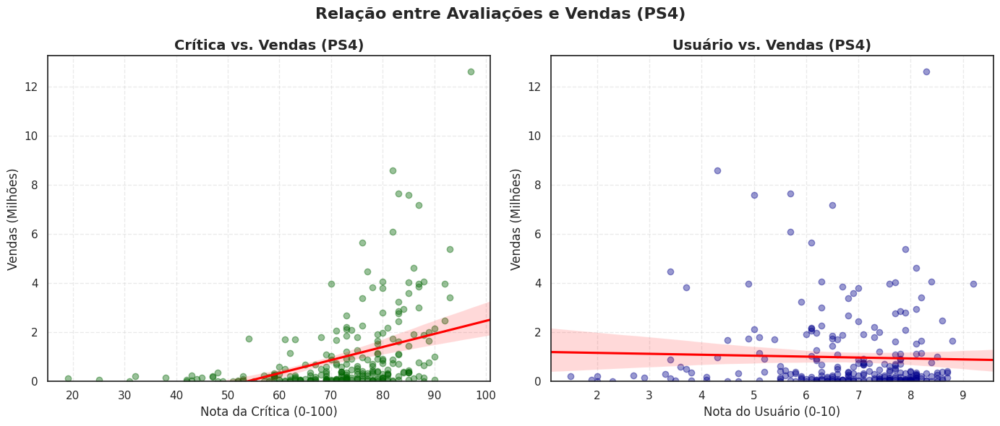


--- VIZ 2: Zoom (Foco em < 2 Milhões) ---


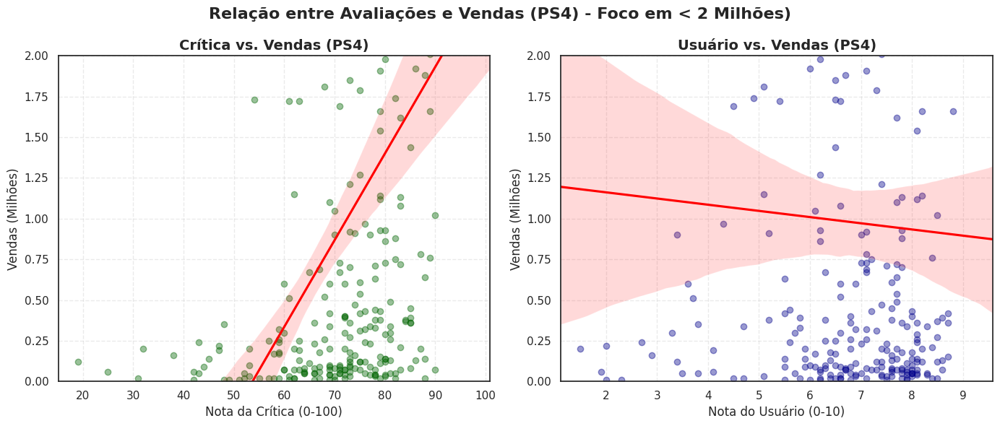

------------------------------------------------------------
📊 Estatísticas de Correlação - PS4
------------------------------------------------------------
1. Pearson (Linear):
   • Crítica: +0.406 | Usuário: -0.034
2. Spearman (Rank/Tendência - Mais Robusto):
   • Crítica: +0.508 | Usuário: -0.032

💡 Insight: A nota da crítica tem correlação 15.7x mais forte que a do usuário.



🎮 ANÁLISE DE CORRELAÇÃO: XOne

--- VIZ 1: Visão Completa (Com Outliers) ---


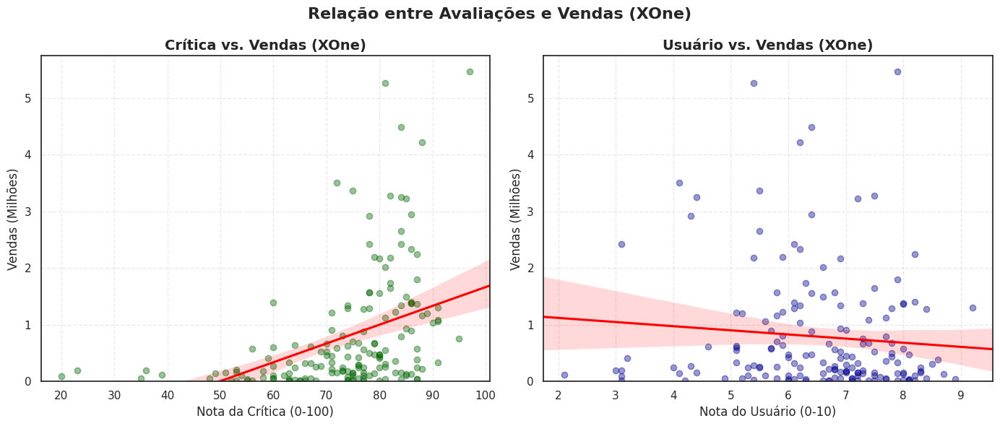


--- VIZ 2: Zoom (Foco em < 2 Milhões) ---


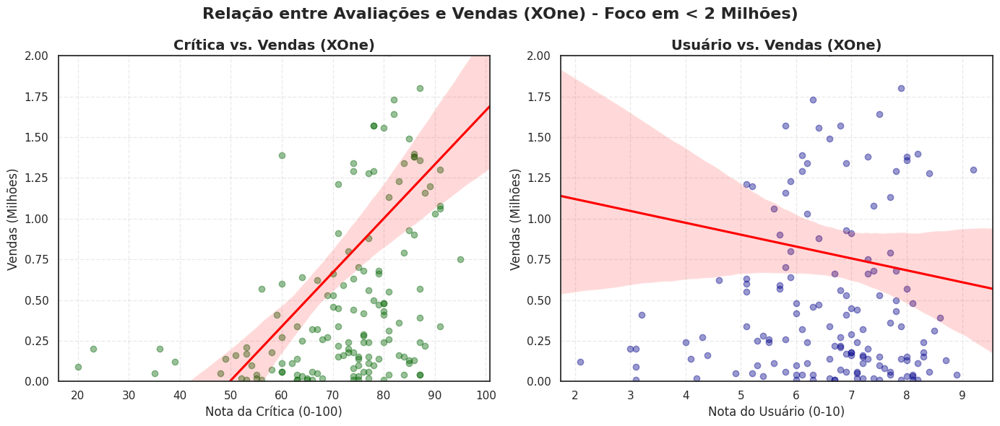

------------------------------------------------------------
📊 Estatísticas de Correlação - XOne
------------------------------------------------------------
1. Pearson (Linear):
   • Crítica: +0.410 | Usuário: -0.094
2. Spearman (Rank/Tendência - Mais Robusto):
   • Crítica: +0.516 | Usuário: -0.122

💡 Insight: A nota da crítica tem correlação 4.2x mais forte que a do usuário.



🎮 ANÁLISE DE CORRELAÇÃO: PS3

--- VIZ 1: Visão Completa (Com Outliers) ---


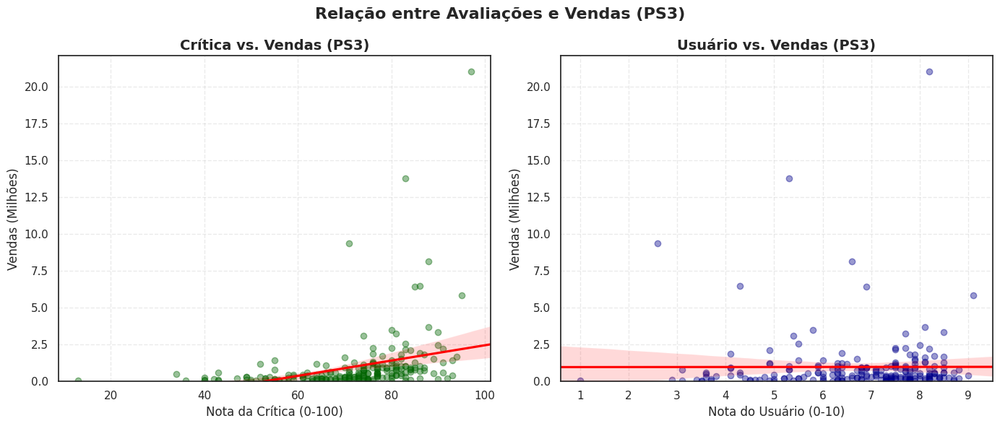


--- VIZ 2: Zoom (Foco em < 2 Milhões) ---


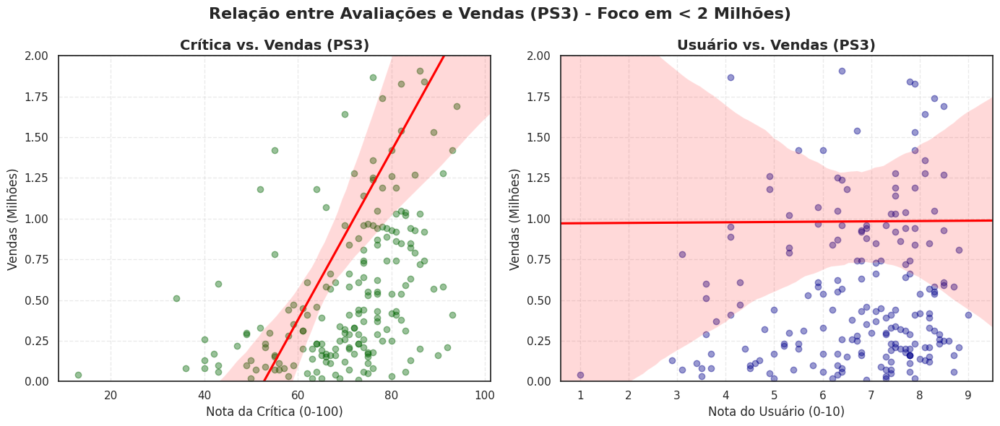

------------------------------------------------------------
📊 Estatísticas de Correlação - PS3
------------------------------------------------------------
1. Pearson (Linear):
   • Crítica: +0.334 | Usuário: +0.001
2. Spearman (Rank/Tendência - Mais Robusto):
   • Crítica: +0.587 | Usuário: +0.118

💡 Insight: A nota da crítica tem correlação 5.0x mais forte que a do usuário.



🎮 ANÁLISE DE CORRELAÇÃO: X360

--- VIZ 1: Visão Completa (Com Outliers) ---


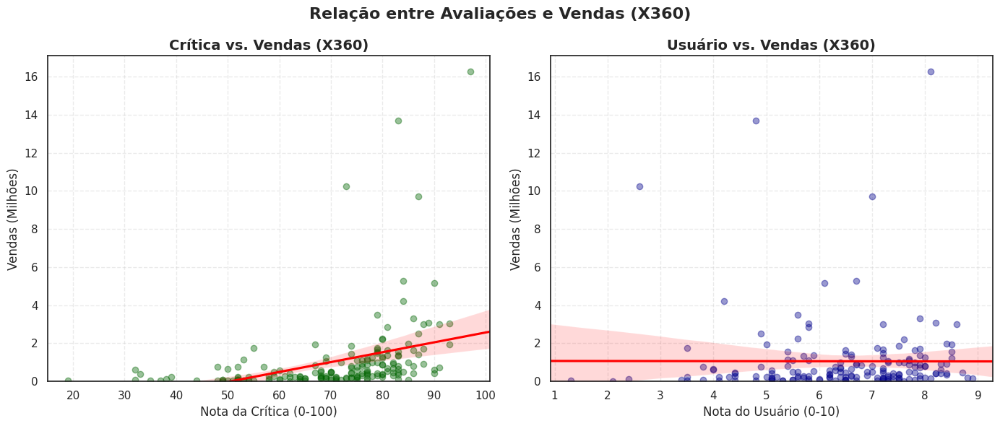


--- VIZ 2: Zoom (Foco em < 2 Milhões) ---


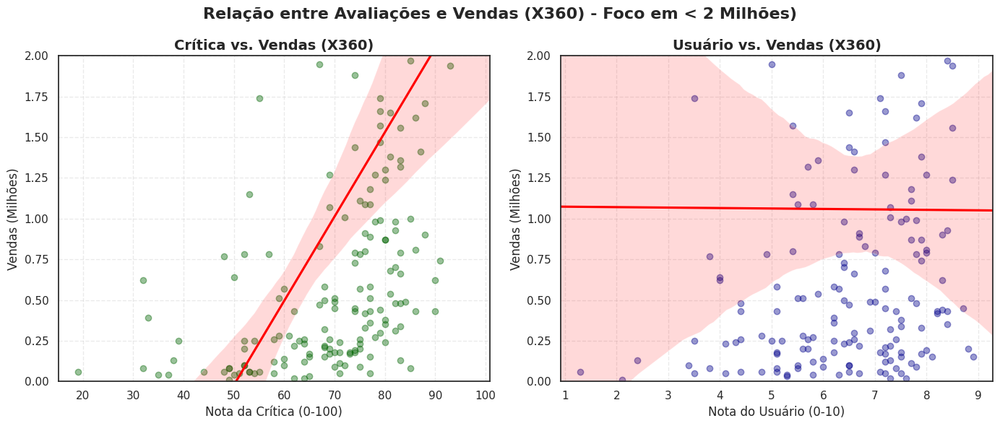

------------------------------------------------------------
📊 Estatísticas de Correlação - X360
------------------------------------------------------------
1. Pearson (Linear):
   • Crítica: +0.361 | Usuário: -0.002
2. Spearman (Rank/Tendência - Mais Robusto):
   • Crítica: +0.636 | Usuário: +0.196

💡 Insight: A nota da crítica tem correlação 3.2x mais forte que a do usuário.





In [166]:
def analisar_correlacao_plataforma2(platform_name):
    """
    Gera gráficos de dispersão e calcula correlação (Spearman/Pearson) 
    entre notas e vendas para uma plataforma específica.
    """
    # 1. Filtrar dados e remover NaNs
    df_plat = df_relevante[df_relevante['platform'] == platform_name].dropna(subset=['critic_score', 'user_score']).copy()
    
    if df_plat.empty:
        print(f"⚠️ Sem dados suficientes para analisar a plataforma {platform_name}.")
        return

    print('='*80)
    print(f"🎮 ANÁLISE DE CORRELAÇÃO: {platform_name}")
    print('='*80)

    # Função interna para plotar
    def plotar_dispersao(data, limite_vendas=None, titulo_suffix=""):
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        ylim_max = limite_vendas if limite_vendas else data['total_sales'].max() * 1.05
        
        # Gráfico 1: Crítica
        sns.regplot(data=data, x='critic_score', y='total_sales', ax=axes[0], 
                    color='darkgreen', scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'}, truncate=False)
        axes[0].set_title(f'Crítica vs. Vendas ({platform_name})', fontsize=14, fontweight='bold')
        axes[0].set_xlabel('Nota da Crítica (0-100)')
        axes[0].set_ylabel('Vendas (Milhões)')
        axes[0].set_ylim(0, ylim_max)
        axes[0].grid(axis='both', linestyle='--', alpha=0.4)

        # Gráfico 2: Usuário
        sns.regplot(data=data, x='user_score', y='total_sales', ax=axes[1],
                    color='darkblue', scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'}, truncate=False)
        axes[1].set_title(f'Usuário vs. Vendas ({platform_name})', fontsize=14, fontweight='bold')
        axes[1].set_xlabel('Nota do Usuário (0-10)')
        axes[1].set_ylabel('Vendas (Milhões)')
        axes[1].set_ylim(0, ylim_max)
        axes[1].grid(axis='both', linestyle='--', alpha=0.4)

        plt.suptitle(f'Relação entre Avaliações e Vendas ({platform_name}){titulo_suffix}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    # Gerar Gráficos
    print(f"\n--- VIZ 1: Visão Completa (Com Outliers) ---")
    plotar_dispersao(df_plat)

    if df_plat['total_sales'].max() > 2:
        print(f"\n--- VIZ 2: Zoom (Foco em < 2 Milhões) ---")
        plotar_dispersao(
            df_plat,
            limite_vendas=2,
            titulo_suffix=" - Foco em < 2 Milhões)")

    # Calcular Correlações (Pearson e Spearman para comparação)
    pearson_c = df_plat['critic_score'].corr(df_plat['total_sales'])
    pearson_u = df_plat['user_score'].corr(df_plat['total_sales'])
    
    # Adicionar Spearman para robustez (dados não normais)
    spearman_c = df_plat['critic_score'].corr(df_plat['total_sales'], method='spearman')
    spearman_u = df_plat['user_score'].corr(df_plat['total_sales'], method='spearman')

    print('-'*60)
    print(f"📊 Estatísticas de Correlação - {platform_name}")
    print('-'*60)
    print(f"1. Pearson (Linear):")
    print(f"   • Crítica: {pearson_c:+.3f} | Usuário: {pearson_u:+.3f}")
    print(f"2. Spearman (Rank/Tendência - Mais Robusto):")
    print(f"   • Crítica: {spearman_c:+.3f} | Usuário: {spearman_u:+.3f}")
    
    # Conclusão baseada no Spearman (mais seguro)
    fator = abs(spearman_c)/abs(spearman_u) if abs(spearman_u) > 0 else 0
    print(f"\n💡 Insight: A nota da crítica tem correlação {fator:.1f}x mais forte que a do usuário.")
    print("\n\n")

    
# -------------------------------------------
# EXECUTANDO A FUNÇÃO
# -------------------------------------------
# Analisar PS4
analisar_correlacao_plataforma2('PS4')

# Analisar Xbox One
analisar_correlacao_plataforma2('XOne')

# Analisar PS3
analisar_correlacao_plataforma2('PS3')

# Analisar Xbox 360
analisar_correlacao_plataforma2('X360')


Conclusão Geral: Em todas as plataformas principais, a Nota da Crítica é um preditor de vendas consistente e forte (r > 0.5), enquanto a nota do usuário é estatisticamente irrelevante para prever sucesso comercial.

Iniciando Análise Detalhada: Relação Avaliação e Vendas por Plataforma...



## 🎮 Análise de Correlação: **PS4**

---

### 👁️ 1. Visão Completa (Com Outliers)

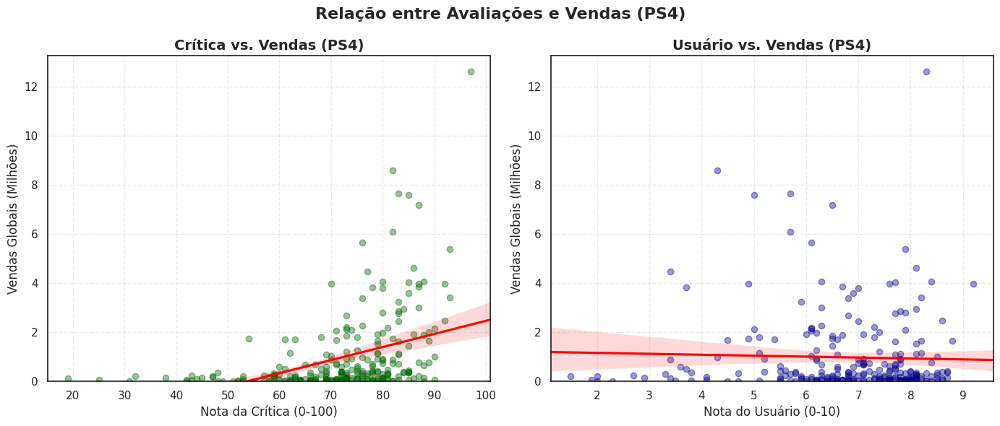

### 🔍 2. Zoom (Foco em < 2 Milhões)

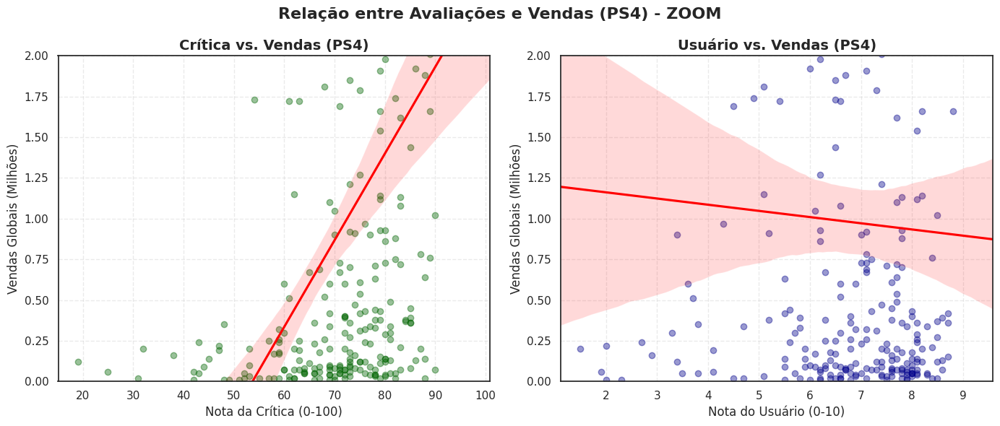


### 📊 Estatísticas de Correlação (PS4)

| Método | Crítica (r) | Usuário (r) | Interpretação |
| :--- | :---: | :---: | :--- |
| **Pearson** (Linear) | `+0.406` | `-0.034` | Sensível a outliers (Gráfico 1) |
| **Spearman** (Rank) | `+0.508` | `-0.032` | **Mais robusto** para dados reais |
    


> <font color='green'><b>💡 Insight Estratégico:</b></font><br> 
> - A nota da **Crítica Especializada** tem uma correlação **15.7x mais forte** com as vendas do que a nota do usuário para o PS4.<br>
> - Isso sugere que o marketing deve focar em selos de qualidade técnica ("Aclamado pela Crítica") em vez de notas de comunidade.
    

<br>

## 🎮 Análise de Correlação: **XOne**

---

### 👁️ 1. Visão Completa (Com Outliers)

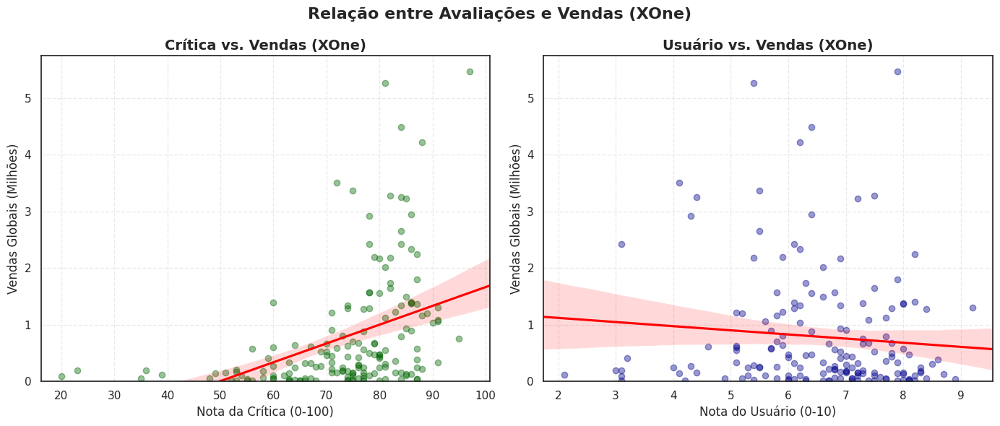

### 🔍 2. Zoom (Foco em < 2 Milhões)

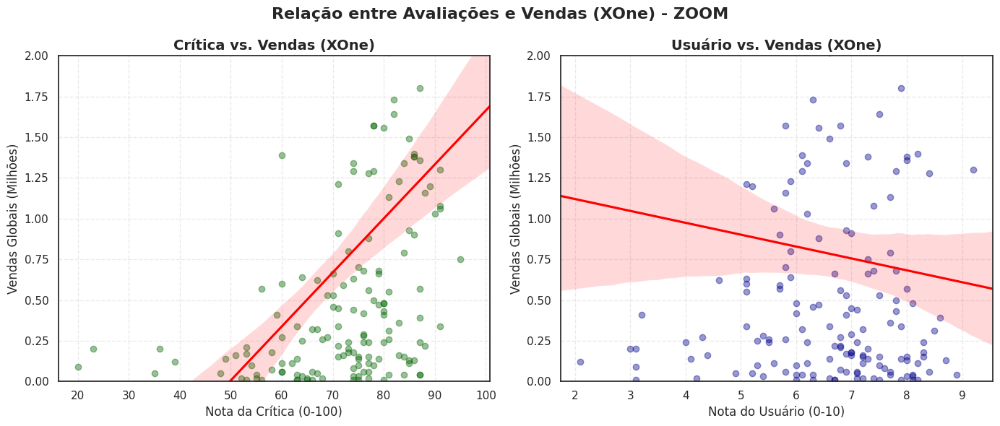


### 📊 Estatísticas de Correlação (XOne)

| Método | Crítica (r) | Usuário (r) | Interpretação |
| :--- | :---: | :---: | :--- |
| **Pearson** (Linear) | `+0.410` | `-0.094` | Sensível a outliers (Gráfico 1) |
| **Spearman** (Rank) | `+0.516` | `-0.122` | **Mais robusto** para dados reais |
    


> <font color='green'><b>💡 Insight Estratégico:</b></font><br> 
> - A nota da **Crítica Especializada** tem uma correlação **4.2x mais forte** com as vendas do que a nota do usuário para o XOne.<br>
> - Isso sugere que o marketing deve focar em selos de qualidade técnica ("Aclamado pela Crítica") em vez de notas de comunidade.
    

<br>

## 🎮 Análise de Correlação: **PS3**

---

### 👁️ 1. Visão Completa (Com Outliers)

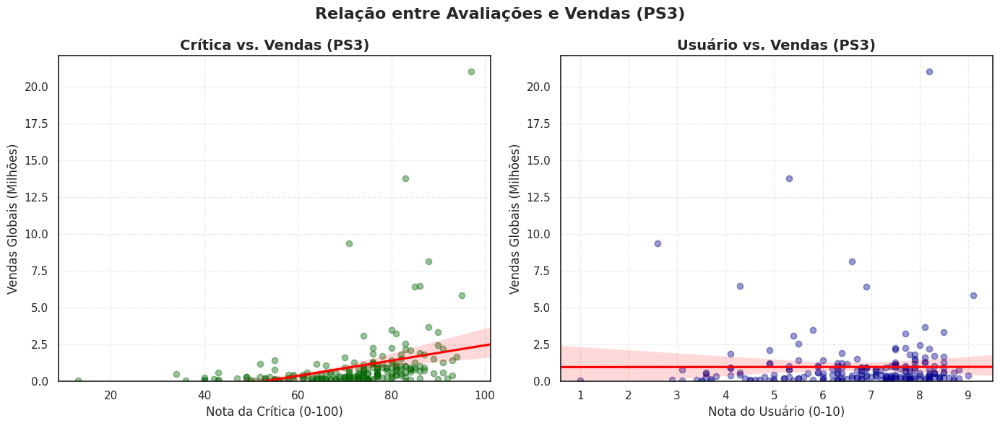

### 🔍 2. Zoom (Foco em < 2 Milhões)

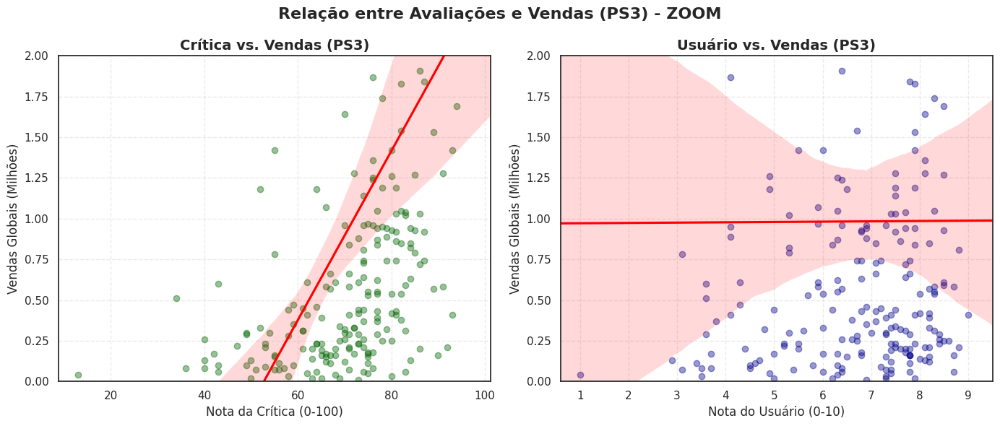


### 📊 Estatísticas de Correlação (PS3)

| Método | Crítica (r) | Usuário (r) | Interpretação |
| :--- | :---: | :---: | :--- |
| **Pearson** (Linear) | `+0.334` | `+0.001` | Sensível a outliers (Gráfico 1) |
| **Spearman** (Rank) | `+0.587` | `+0.118` | **Mais robusto** para dados reais |
    


> <font color='green'><b>💡 Insight Estratégico:</b></font><br> 
> - A nota da **Crítica Especializada** tem uma correlação **5.0x mais forte** com as vendas do que a nota do usuário para o PS3.<br>
> - Isso sugere que o marketing deve focar em selos de qualidade técnica ("Aclamado pela Crítica") em vez de notas de comunidade.
    

<br>

## 🎮 Análise de Correlação: **X360**

---

### 👁️ 1. Visão Completa (Com Outliers)

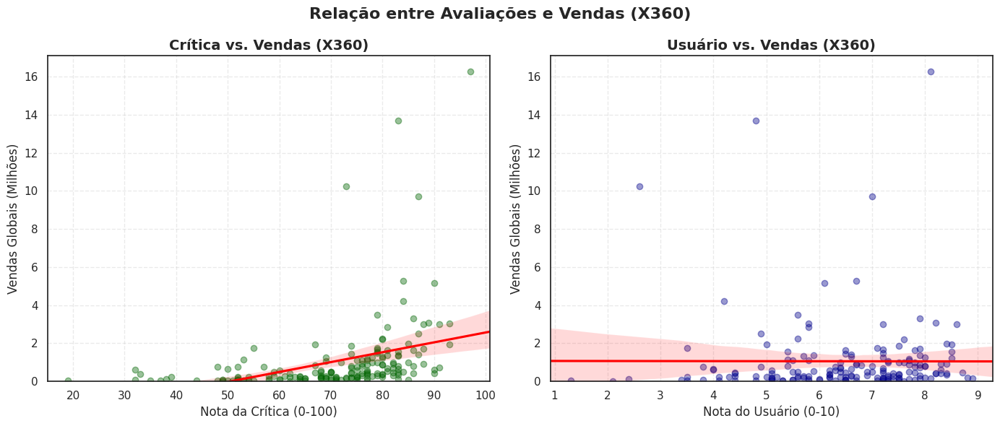

### 🔍 2. Zoom (Foco em < 2 Milhões)

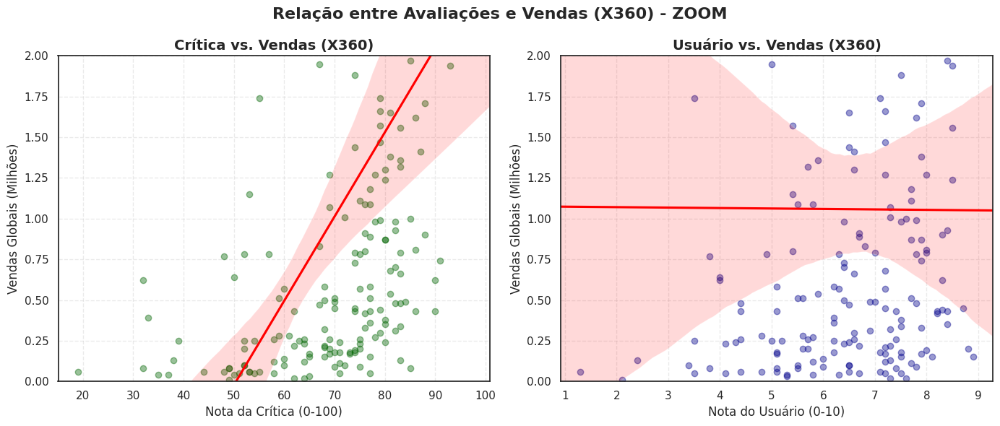


### 📊 Estatísticas de Correlação (X360)

| Método | Crítica (r) | Usuário (r) | Interpretação |
| :--- | :---: | :---: | :--- |
| **Pearson** (Linear) | `+0.361` | `-0.002` | Sensível a outliers (Gráfico 1) |
| **Spearman** (Rank) | `+0.636` | `+0.196` | **Mais robusto** para dados reais |
    


> <font color='green'><b>💡 Insight Estratégico:</b></font><br> 
> - A nota da **Crítica Especializada** tem uma correlação **3.2x mais forte** com as vendas do que a nota do usuário para o X360.<br>
> - Isso sugere que o marketing deve focar em selos de qualidade técnica ("Aclamado pela Crítica") em vez de notas de comunidade.
    

<br>

### 📅 Tabela Resumo: **O Fator Qualidade por Plataforma**

---

,Pearson (Crítica),Spearman (Crítica),Spearman (Usuário),Pearson (Usuário),Impacto Relativo (S_Crit / S_User)
Plataforma,,,,,
PS4,0.406,0.508,-0.032,-0.034,15.191
XOne,0.410,0.516,-0.122,-0.094,4.196
PS3,0.334,0.587,0.118,0.001,4.939
X360,0.361,0.636,0.196,-0.002,3.224


<br>

### 📍 **Conclusão das Correlações**

---

> Em todas as plataformas principais, a **``Nota da Crítica``** é um preditor de vendas consistente e forte (``r > 0.5``), enquanto a **``Nota do Usuário``** é estatisticamente **irrelevante** para prever sucesso comercial.

In [65]:
# Executando a função para analisar a correlação das notas X vendas por plataforma
# Função 'analisar_correlacao_plataforma_markdown(platform_name)'

# -------------------------------------------
# EXECUTANDO A FUNÇÃO COM LOOP
# -------------------------------------------

# Lista de plataformas para analisar
plataformas_foco = ['PS4', 'XOne', 'PS3', 'X360']

# Lista para armazenar os resultados para Tabela de Resumo (função com 'return')
resultados_correlacao = []

print("Iniciando Análise Detalhada: Relação Avaliação e Vendas por Plataforma...\n")
# Executa a análise para cada plataforma (loop em 'plataformas_foco')
for plat in plataformas_foco:
    # Exibe os gráficos e retorna os números para as 'plataformas_foco' com a função 'analisar_correlacao_plataforma_markdown'
    dados = analisar_correlacao_plataforma_markdown(plat)

    # Se a função retornou dados (não foi vazia), guarda na lista
    if dados:
        resultados_correlacao.append(dados)

# --- CRIAÇÃO DA TABELA RESUMO ---

display(Markdown(f"### 📅 Tabela Resumo: **O Fator Qualidade por Plataforma**"))
display(Markdown("---"))

# Criar DataFrame
df_corr_summary = pd.DataFrame(resultados_correlacao)
df_corr_summary.set_index('Plataforma', inplace=True)

# Estilizar (Cores para destacar correlações fortes)
# Gradiente Verde: Quanto mais escuro, maior a correlação - gradiente por coluna
display(
    df_corr_summary.style

    # Verdes para Crítica
    .background_gradient(cmap='Greens', subset=['Spearman (Crítica)', 'Pearson (Crítica)'])

    # Vermelhos para Usuário (Incluindo a nova coluna Pearson)
    .background_gradient(cmap='Reds', subset=['Pearson (Usuário)', 'Spearman (Usuário)'])

    .format("{:.3f}")
    # Estilo do texto da tabela
    .set_table_styles([     
        # Centraliza e coloca negrito no:

        # Índice (Nomes das Plataformas) ('.row_heading')
        {'selector': '.row_heading', 'props': [('text-align', 'center'), ('font-weight', 'bold')]},
        
        # Títulos das Colunas ('th')
        {'selector': 'th', 'props': [('text-align', 'center'), ('font-weight', 'bold')]},
        
        # Conteúdo dentro das Células ('td')
        {'selector': 'td', 'props': [('text-align', 'center'), ('font-weight', 'bold')]}
    ])
)

# --- TEXTO DE CONCLUSÃO ---

# Exibindo o texto de conclusão
insight_final =f"""> Em todas as plataformas principais, a **``Nota da Crítica``** é um preditor de vendas consistente e forte (``r > 0.5``), enquanto a **``Nota do Usuário``** é estatisticamente **irrelevante** para prever sucesso comercial."""

display(Markdown("<br>"))
display(Markdown(f"### 📍 **Conclusão das Correlações**"))
display(Markdown("---"))
display(Markdown(insight_final))


---

### [**Top 20 Jogos (Global)**](#toc0_3)

#### ❓Análise Extra: ***Quais são os 20 jogos mais vendidos de todos os tempos (até 2016)?***

Esta é a visualização mais direta do sucesso comercial na indústria de jogos. Diferente das outras, ela não se importa com exclusividade ou plataforma; ela simplesmente soma todas as cópias vendidas de um título. A pergunta que esta análise responde é:

> ***"Quais são, independentemente da plataforma, os 20 jogos que mais venderam cópias na história (até 2016)?"***

Estes são os maiores sucessos comerciais que o dataset registrou, agregando vendas de todas as suas versões (ex: `GTA V` no PS3, PS4, X360, etc.).

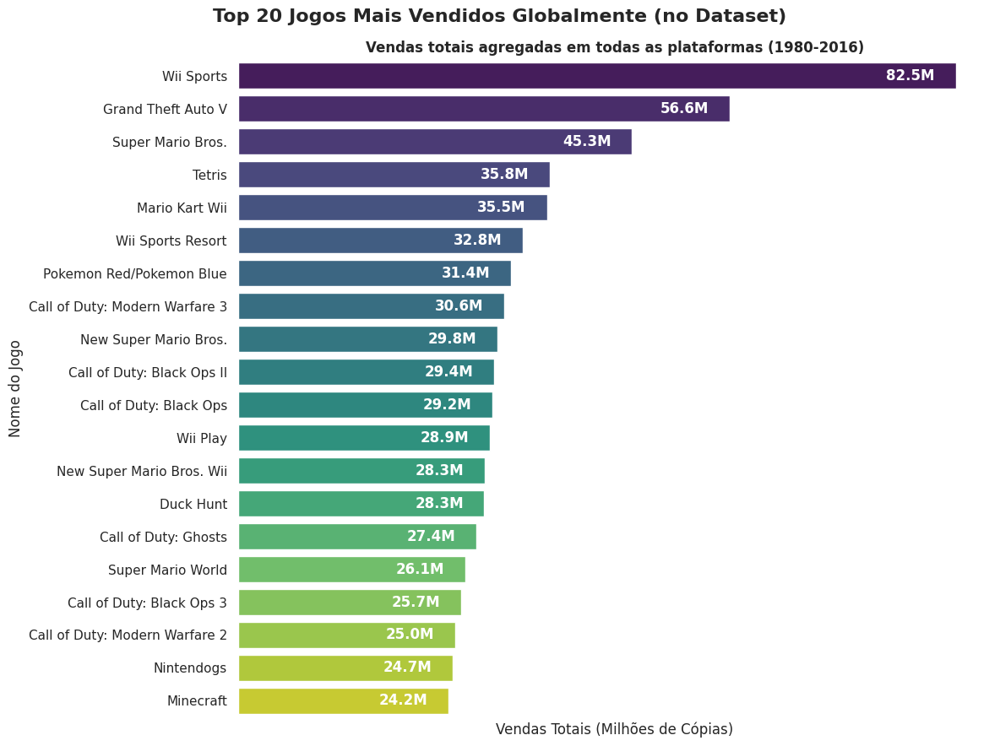

--- Top 20 Jogos Mais Vendidos (Globalmente, Todas as Plataformas) ---
name
Wii Sports                        82.54
Grand Theft Auto V                56.58
Super Mario Bros.                 45.31
Tetris                            35.84
Mario Kart Wii                    35.52
Wii Sports Resort                 32.77
Pokemon Red/Pokemon Blue          31.38
Call of Duty: Modern Warfare 3    30.60
New Super Mario Bros.             29.80
Call of Duty: Black Ops II        29.40
Call of Duty: Black Ops           29.20
Wii Play                          28.91
New Super Mario Bros. Wii         28.32
Duck Hunt                         28.31
Call of Duty: Ghosts              27.39
Super Mario World                 26.09
Call of Duty: Black Ops 3         25.67
Call of Duty: Modern Warfare 2    24.97
Nintendogs                        24.67
Minecraft                         24.16
Name: total_sales, dtype: float64


In [66]:
# 11. Top 20 Jogos (Global)
# Quais são, independentemente da plataforma, os 20 jogos que mais venderam cópias na história (até 2016)?

# 1. Preparar os dados (Top 20 Jogos)
top_20_jogos = df.groupby('name')['total_sales'].sum().sort_values(ascending=False).head(20)

# 2. Plotar
plt.figure(figsize=(12, 9)) 
ax = sns.barplot(
    x=top_20_jogos.values,
    y=top_20_jogos.index,
    palette='viridis' 
)

# --- ANOTAÇÕES: Adicionando os valores manualmente ---
for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y()
    height = bar.get_height()
    
    ax.text(
        x=width -8,      # Posição X: Fim da barra + 1 de espaço
        y=y + height / 2, # Posição Y: No meio da barra
        s=f'{width:.1f}M', 
        ha='left',         
        va='center',       
        fontsize=12,
        fontweight='bold',
        color='white'
    )
# --------------------------------------------------

# --- Estilização Final ---
plt.suptitle('Top 20 Jogos Mais Vendidos Globalmente (no Dataset)', fontsize=16, fontweight='bold')
plt.title('Vendas totais agregadas em todas as plataformas (1980-2016)', fontsize=12)
plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=12)
plt.ylabel('Nome do Jogo', fontsize=12)

# --- Limpeza do Gráfico ---
ax.set_xticks([]) 
sns.despine(left=True, bottom=True) 

plt.tight_layout()
plt.show()

# Imprime os dados brutos também
print("--- Top 20 Jogos Mais Vendidos (Globalmente, Todas as Plataformas) ---")
print(top_20_jogos)

#### Conclusões da Análise dos Jogos Mais Vendidos Globalmente

O gráfico mostra os verdadeiros *outliers* da indústria, revelando que o sucesso pode vir de diferentes estratégias: "jogos pack-in", domínio de franquia ou sucessos multiplataforma.


##### 💡 **``Descobertas``**

* **`O "Efeito Pack-in" no Topo:`**
> * O `Wii Sports` (82.5M) está em uma categoria própria, com uma vantagem de quase 26 milhões de cópias sobre o segundo lugar. Esse número astronômico é explicado por ser um "jogo pack-in", ou seja, vinha incluído na maioria dos consoles `Wii` vendidos, inflando seu total de "vendas".<br>O mesmo vale para clássicos como `Super Mario Bros.` (45.3M) e `Duck Hunt` (28.3M), que frequentemente acompanhavam o `NES`.

* **`O "Blockbuster" Moderno`:**
> * O `Grand Theft Auto V` (56.6M) é o verdadeiro fenômeno de vendas tradicional. Diferente do `Wii Sports`, suas vendas foram alcançadas a preço cheio (sem ser pack-in) e distribuídas por múltiplas plataformas e gerações, solidificando-o como um dos produtos de entretenimento mais lucrativos de todos os tempos.

* **`O Domínio de Duas Franquias`:**
> * A lista é visivelmente dominada por duas marcas:
>    * **`Call of Duty`**: A franquia aparece **5 vezes** no Top 20 (BO, MW3, BO II, Ghosts, MW2), mostrando um domínio absoluto de vendas na 7ª e 8ª gerações.
>    * **`Mario`**: A marca da Nintendo aparece **4 vezes** (Super Mario Bros., Mario Kart Wii, New Super Mario Bros. Wii, Super Mario World), sem contar os jogos que ele protagoniza ou participa (como Duck Hunt ou Tetris no Game Boy).

* **``O Poder dos Clássicos``:**
> * A presença duradoura de títulos como `Tetris` (35.8M) e `Pokémon Red/Pokemon Blue` (31.4M) mostra como os jogos que definiram os consoles portáteis (Game Boy) continuam sendo alguns dos títulos mais vendidos da história.

---

### [**Composição do Top 20 (Plataformas)**](#toc0_3)

#### ❓Análise Extra: ***Como os 20 jogos mais vendidos se distribuem pelas diferentes plataformas?***

Depois de analisar as vendas totais de software (jogos) e hardware (consoles), esta análise aprofunda a investigação para responder a uma pergunta-chave:

> ***"Quais são os 20 jogos mais vendidos de todos os tempos (até 2016), e como as vendas desses mega-hits se distribuem pelas diferentes plataformas?"***

O gráfico de barras empilhadas é perfeito para isso. O comprimento total de cada barra mostra as vendas totais de um jogo, enquanto os segmentos coloridos revelam *quais* consoles contribuíram para esse total.

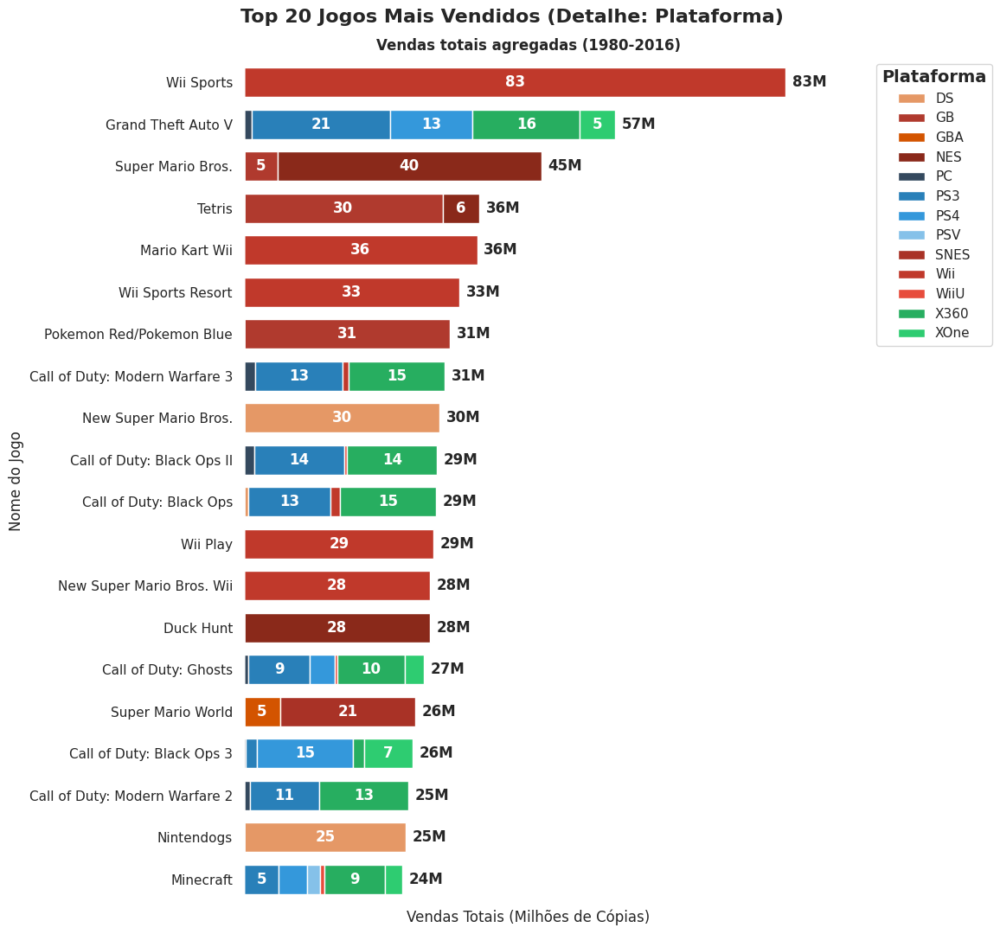

In [67]:
# Top 20 Jogos Mais Vendidos (Detalhe: Plataforma)

# # 1. Obter a lista dos 20 nomes de jogos mais vendidos
top_20_names = df.groupby('name')['total_sales'].sum().sort_values(ascending=False).head(20).index

# 2. Filtrar o DataFrame principal
df_top_20 = df[df['name'].isin(top_20_names)]

# 3. Criar a tabela dinâmica
pivot_top20 = df_top_20.pivot_table(index='name', 
                                    columns='platform', 
                                    values='total_sales', 
                                    aggfunc='sum').fillna(0) # Preenche NaNs com 0

# 4. Criei uma coluna 'total' para ordenar o pivot
pivot_top20['total'] = pivot_top20.sum(axis=1)

# 5. Ordenei pelo total (ascending=True para gráficos horizontais)
pivot_top20 = pivot_top20.sort_values(by='total', ascending=True)

# 6. Guardei os totais ANTES de deletar a coluna
# (Preciso disso para os rótulos externos)
totals = pivot_top20['total']
del pivot_top20['total']

# Definindo as cores
cores_ordenadas = [platform_color_map[platform] for platform in pivot_top20.columns]
# ---------------------------------------------

# 7. Plotar
ax = pivot_top20.plot(kind='barh',
                      stacked=True,
                      figsize=(12, 11), 
                      color=cores_ordenadas,
                      width=0.7)

# --- 8. Adicionando RÓTULOS internos (cor/plafaroma) ---
# Iterando por cada "container" (cada cor/plataforma)
for container in ax.containers:
    # 'labels' será uma lista de strings (ex: "5.3" ou "")
    labels = []
    for bar in container:
        width = bar.get_width()
        # SÓ adiciona o rótulo se o segmento for grande o suficiente (ex: > 5M)
        if width > 5:
            labels.append(f'{width:.0f}') # Arredonda para inteiro
        else:
            labels.append('') # Deixa segmentos pequenos em branco
            
    # Aplica os rótulos no centro de cada segmento
    ax.bar_label(
        container,
        labels=labels,
        label_type='center',
        color="white", # Cor do texto
        fontweight='bold',
        fontsize=12
    )
# -----------------------------------------------------------

# --- 9. Adicionando os RÓTULOS TOTAIS por jogo ---
# Iterei pelo total que salvei e pela posição Y (i=0, 1, 2...)
for i, total in enumerate(totals):
    ax.text(
        total + 1,       # Posição X: No final da barra + 1 de padding
        i,               # Posição Y: No centro da barra (0, 1, 2...)
        f'{total:.0f}M', # O texto formatado (ex: "83M")
        ha='left',       # Alinhamento horizontal
        va='center',     # Alinhamento vertical
        fontweight='bold',
        fontsize=12
    )
# -----------------------------------------------------------

# --- Estilização Final ---
plt.suptitle('Top 20 Jogos Mais Vendidos (Detalhe: Plataforma)', fontsize=16, fontweight='bold')
plt.title('Vendas totais agregadas (1980-2016)', fontsize=12)
plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=12)
plt.ylabel('Nome do Jogo', fontsize=12)

# --- Limpeza do Gráfico ---
sns.despine(left=True, bottom=True)
plt.grid(axis='x', linestyle='--', alpha=0.5)
ax.set_xticks([]) # Remove os ticks do eixo X (redundantes)

# Ajusta a legenda
plt.legend(title='Plataforma', bbox_to_anchor=(1.1, 1), loc='upper left',
           title_fontproperties={'size': 14, 'weight': 'bold'},
           prop={'size': 11}) 
plt.tight_layout()

plt.show()

##### Conclusões da Análise dos Jogos Mais Vendidos de Todos os Tempos (até 2016) (Detalhe: Plataforma)

##### ❓ **``Pergunta:``**
> ***``Como os 20 jogos mais vendidos se distribuem pelas diferentes plataformas?``***

##### 👉 **``Resposta:``**

Esta visualização mostra dois caminhos distintos para se criar um game "mega-hit": o sucesso **multiplataforma** e o exclusivo "system-seller".


##### 💡 **``Descobertas``**

* **``Os Dois Caminhos para o Topo:``**<br>
> * O gráfico mostra duas estratégias de sucesso opostas:
>    1.  **`Jogo que vende o videogame`:**<br>
>       O `Wii Sports` (83M) é o maior *outlier*, com 100% de suas vendas no `Wii`. Isso é impulsionado por ser um jogo que vinha junto com o console.<br>Muitas    vezes, o jogo sozinho era tão desejado que motivava a pessoa a comprar o console inteiro.<br> O jogo foi uma revolução nos games, sendo o primeiro jogo anunciado como também esporte.
>    2.  **``Sucesso Multiplataforma:``**<br>
>       O `Grand Theft Auto V` (57M) é o exemplo oposto, com suas vendas distribuídas entre cinco plataformas (`PS3`, `X360`, `PS4`, `PC`, `XOne`).

* **``O Fenômeno "Call of Duty"``**:<br>
> * ** A franquia `Call of Duty` domina a lista, aparecendo **cinco vezes** no Top 20 (Black Ops, MW3, Black Ops II, Ghosts, MW2).<br>
> O gráfico mostra que o sucesso estrondoso dessa franquia definiu a 7ª geração de consoles, com a esmagadora maioria das vendas concentrada no `PS3` (laranja claro) e no `X360` (laranja escuro).

* **``O Poder Duradouro das Franquias da Nintendo``:**<br>
> * Mesmo em um gráfico que inclui títulos multiplataforma, as franquias da Nintendo se destacam com facilidade.<br>
> Jogos como `Super Mario Bros.`, `Pokemon Red/Pokemon Blue`, `Tetris` (no GB) e a franquia `Wii` (Sports, Kart, Resort, Play) mostram que a estratégia da empresa de vincular seu hardware a software exclusivo criou alguns dos títulos mais vendidos e icônicos de todos os tempos.

* **``O Contraste com a Análise de Exclusivos da Sony``:**<br>
> * Na análise anterior (vendas *totais* de exclusivos), vimos que o `PS` e o `PS2` geraram um volume gigantesco de vendas.<br>No entanto, *nenhum* exclusivo da Sony aparece neste Top 20 individual. Isso revela um insight crucial:
>    * O sucesso da **``Nintendo``** foi impulsionado por alguns títulos individuais de vendas massivas (Wii Sports, Pokémon, Mario).
>    * O sucesso da **``Sony``** foi construído sobre um catálogo *amplo e variado* de exclusivos (ex: Gran Turismo, Final Fantasy, Metal Gear Solid), onde as vendas foram distribuídas por muitos jogos, em vez de se concentrarem em um único título de 80 milhões de cópias.

---

### [**Vendas de Exclusivos (por Plataforma)**](#toc0_3)

#### ❓Análise Extra: ***Quais plataformas historicamente geraram o maior volume de vendas apenas com seus títulos exclusivos?***

Um dos maiores impulsionadores para a compra de um console são seus jogos exclusivos — títulos que não podem ser jogados em nenhum outro lugar. A pergunta que esta análise responde é:

> ***"Quais plataformas historicamente geraram o maior volume de vendas *apenas* com seus títulos exclusivos?"***

Esta métrica é essencial, pois mostra quais ecossistemas de consoles foram mais bem-sucedidos em criar um catálogo único e atrativo, capaz de gerar centenas de milhões de vendas por conta própria.

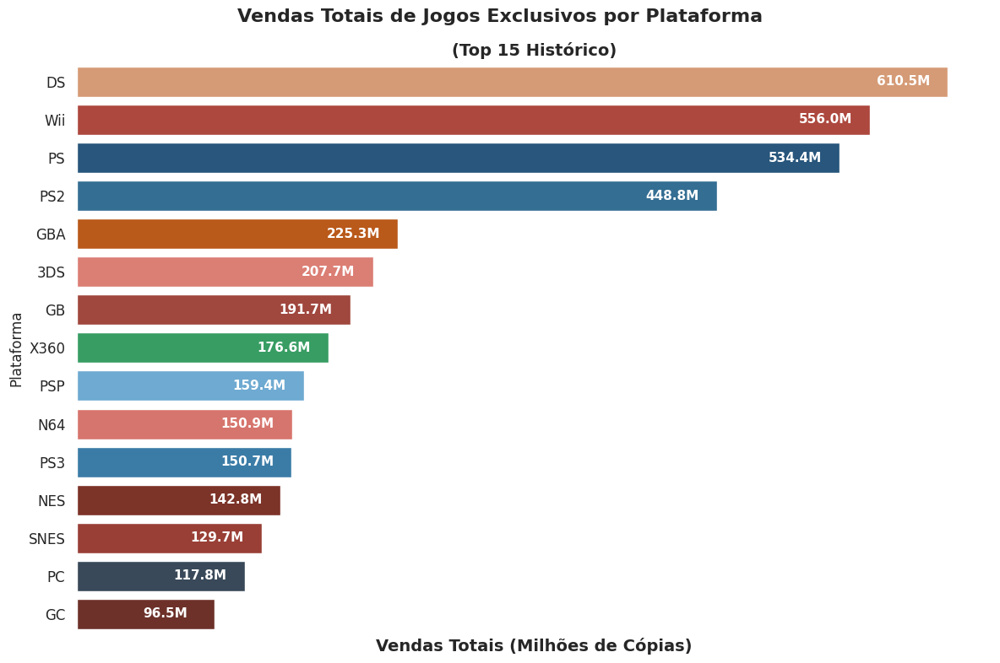

--- Vendas Totais de Jogos Exclusivos (Top 15 Plataformas) ---
platform
DS      610.51
Wii     556.02
PS      534.43
PS2     448.77
GBA     225.32
3DS     207.68
GB      191.70
X360    176.63
PSP     159.36
N64     150.87
PS3     150.74
NES     142.82
SNES    129.70
PC      117.77
GC       96.50
Name: total_sales, dtype: float64


In [68]:
# Vendas Totais de Jogos Exclusivos por Plataforma

# 1. Preparar os dados (mesmo código da versão simplificada)
plataformas_por_jogo = df.groupby('name')['platform'].nunique()
lista_de_exclusivos = plataformas_por_jogo[plataformas_por_jogo == 1].index
df_exclusivos = df[df['name'].isin(lista_de_exclusivos)]


# Peguei o Top 15 para o gráfico
vendas_de_exclusivos_top15 = df_exclusivos.groupby('platform')['total_sales'].sum().sort_values(ascending=False).head(15)

# 2. Visualizando (Gráfico de Barras Horizontal)
plt.figure(figsize=(12, 8)) 

ax = sns.barplot(
    x=vendas_de_exclusivos_top15.values,  # Valores (vendas)
    y=vendas_de_exclusivos_top15.index,   # Categorias (plataformas)
    palette=platform_color_map,
    hue=vendas_de_exclusivos_top15.index
)

# --- ANOTAÇÕES: Adicionando os valores nas barras manualmente ---

for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y()
    height = bar.get_height()

    ax.text(
        x=width - 50,       # Posição X: DENTRO da barra (à direita)
        y=y + height / 2,    # Posição Y: No meio da barra
        s=f'{width:.1f}M',   # O texto formatado
        ha='left',           # Alinhamento à ESQUERDA
        va='center',         
        fontsize=11,
        color='white',       # Cor PRETA
        fontweight='bold'
    )

# --------------------------------------

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Rótulos
plt.suptitle('Vendas Totais de Jogos Exclusivos por Plataforma',fontsize=16,fontweight='bold')
plt.title('(Top 15 Histórico)', fontsize=14)
plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold')
plt.ylabel('Plataforma', fontsize=12)
plt.yticks(fontsize=12)

# Removendo os números redundantes do eixo X
plt.xticks([]) 

plt.grid(axis='x', linestyle='--', alpha=0.3) 
plt.tight_layout()

plt.show()

# Imprime os dados brutos também
print("--- Vendas Totais de Jogos Exclusivos (Top 15 Plataformas) ---")
print(vendas_de_exclusivos_top15)

In [69]:

# ----------------------------------------------
# Calculando a TAXA DE EXCLUSIVIDADE MÉDIA
# ----------------------------------------------
print()
print('-'*86)
print("--- Detalhe: Taxa de Exclusividade consolidada: ---")
print('-'*86)
# Calcula as proporções
proporcao = df['is_exclusive'].value_counts(normalize=True)
print(proporcao.map('{:.2%}'.format)) # Formata para porcentagem com 1 casa decimal


# -------------------------------------------------------------------
# Calculando a TAXA DE EXCLUSIVIDADE por FABRICANTE (`console_maker`)
# -------------------------------------------------------------------

# Agrupar por fabricante e calcular:
# 'mean': dá a taxa percentual (0 a 1)
# 'sum': dá o total de jogos exclusivos
# 'count': dá o total de jogos 
exclusividade_por_maker = df.groupby('console_maker')['is_exclusive'].agg(['mean', 'sum', 'count'])

# Ordenar do maior para o menor
exclusividade_por_maker = exclusividade_por_maker.sort_values(by='mean', ascending=False)

# Criar a coluna da taxa de multiplataforma
exclusividade_por_maker['multi'] = 1 - exclusividade_por_maker['mean']

# Criar uma cópia apenas para exibição convertendo números para string com a formatação desejada
df_display = exclusividade_por_maker.copy()

# Formatar a coluna 'mean' para porcentagem (ex: 0.686 -> 69%)
df_display['mean'] = (df_display['mean'] * 100).map('{:.0f}%'.format)

# Formatar a coluna 'count' para garantir que não tenha casas decimais
df_display['count'] = df_display['count'].map('{:.0f}'.format)

df_display['multi'] = (df_display['multi'] * 100).map('{:.0f}%'.format) # Formatar a coluna 'multi' para porcentagem


# Renomear colunas para ficar mais legível no print
df_display.columns = ['Exclusivo (%)', 'Qtd Jogos Exclusivos', 'Qtd Jogos Totais', 'Multiplataforma (%)']

# Reordenando as colunas
df_display = df_display[['Exclusivo (%)', 'Multiplataforma (%)', 'Qtd Jogos Exclusivos', 'Qtd Jogos Totais']]

# Imprmindo
print()
print('-'*86)
print("--- Detalhe: Taxa de Exclusividade e Multiplataforma por Ecossistema (Fabricante): ---")
print('-'*86)
print(df_display)



--------------------------------------------------------------------------------------
--- Detalhe: Taxa de Exclusividade consolidada: ---
--------------------------------------------------------------------------------------
is_exclusive
1    60.02%
0    39.98%
Name: proportion, dtype: object

--------------------------------------------------------------------------------------
--- Detalhe: Taxa de Exclusividade e Multiplataforma por Ecossistema (Fabricante): ---
--------------------------------------------------------------------------------------
              Exclusivo (%) Multiplataforma (%)  Qtd Jogos Exclusivos Qtd Jogos Totais
console_maker                                                                         
3DO                    100%                  0%                     3                3
NEC                    100%                  0%                     3                3
Atari                   86%                 14%                   100              116
Sega   

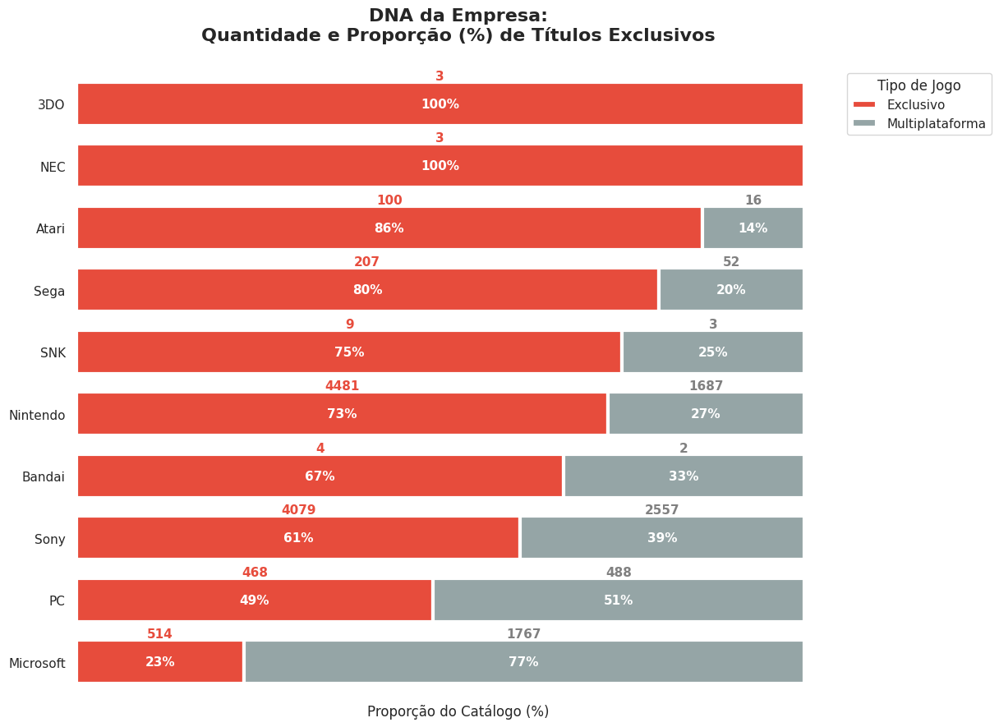

In [70]:
# Preparação dos dados

# Criar novo DF apenas com as colunas necessárias, convertendo para numérico
df_final = df_display.copy()
# Remover  símbolo '%' e convertemos para float
df_final['Exclusivo (%)'] = df_final['Exclusivo (%)'].str.rstrip('%').astype(float)
df_final['Multiplataforma (%)'] = df_final['Multiplataforma (%)'].str.rstrip('%').astype(float)

# Ordenar pelo % de Exclusivos
df_final = df_final.sort_values(by='Exclusivo (%)')

# Calcular Qtd Multiplataforma (Total - Exclusivo) para usar nos rótulos
df_final['Qtd Multi'] = df_final['Qtd Jogos Totais'].astype(int) - df_final['Qtd Jogos Exclusivos'].astype(int)

# Plotagem
# Selecionar apenas as colunas de % para o gráfico empilhado
df_plot = df_final[['Exclusivo (%)', 'Multiplataforma (%)']]

# Plotando
cor_exclusivo = maker_color_map['Nintendo'] # escolhendo a cor da Nintendo
cor_multi = maker_color_map['Other']        #escolhendo a cor alternativa

# Barras horizontal
ax = df_plot.plot(
    kind='barh', 
    stacked=True, 
    figsize=(12, 10), 
    color=[cor_exclusivo, cor_multi],
    edgecolor='white',
    linewidth=3,
    width=0.7 # Largura da barra 
)

# APLICAÇÃO DOS RÓTULOS

# A: Porcentagem no MEIO da barra
# Usei o próprio container do gráfico que já tem os valores de largura (%)
for c in ax.containers:
    # Filtro: só mostra % se a barra for grande o suficiente (> 5%)
    labels_pct = [f'{v.get_width():.0f}%' if v.get_width() > 5 else '' for v in c] # local da texto
    ax.bar_label( # formato do texto
        c, 
        labels=labels_pct, 
        label_type='center', 
        color='white', 
        fontweight='bold', 
        fontsize=11) 

# B: Quantidade Total EM CIMA da barra
colunas_qtd = ['Qtd Jogos Exclusivos', 'Qtd Multi']
cores_texto = [cor_exclusivo, 'gray']

for i, container in enumerate(ax.containers):
    col_abs = colunas_qtd[i]
    cor = cores_texto[i]
    
    # Iterar sobre as barras e o dataframe ao mesmo tempo
    for bar, (idx, row) in zip(container, df_final.iterrows()):
        if bar.get_width() > 0: # Só rotula se a barra existir
            
            # Posição
            x_pos = bar.get_x() + bar.get_width() / 2
            y_pos = bar.get_y() + bar.get_height()
            
            # Texto
            ax.text(
                x_pos, y_pos, 
                f'{row[col_abs]}', 
                ha='center', va='bottom', 
                fontsize=11, fontweight='bold', color=cor
            )

# Titulo e legenda
plt.title('DNA da Empresa:\nQuantidade e Proporção (%) de Títulos Exclusivos\n', fontsize=16, fontweight='bold')
plt.xlabel('Proporção do Catálogo (%)')
plt.ylabel('')
plt.legend(title='Tipo de Jogo', bbox_to_anchor=(1, 1), labels=['Exclusivo', 'Multiplataforma'])
plt.xticks([])
sns.despine(left=True, bottom=True)
plt.show()

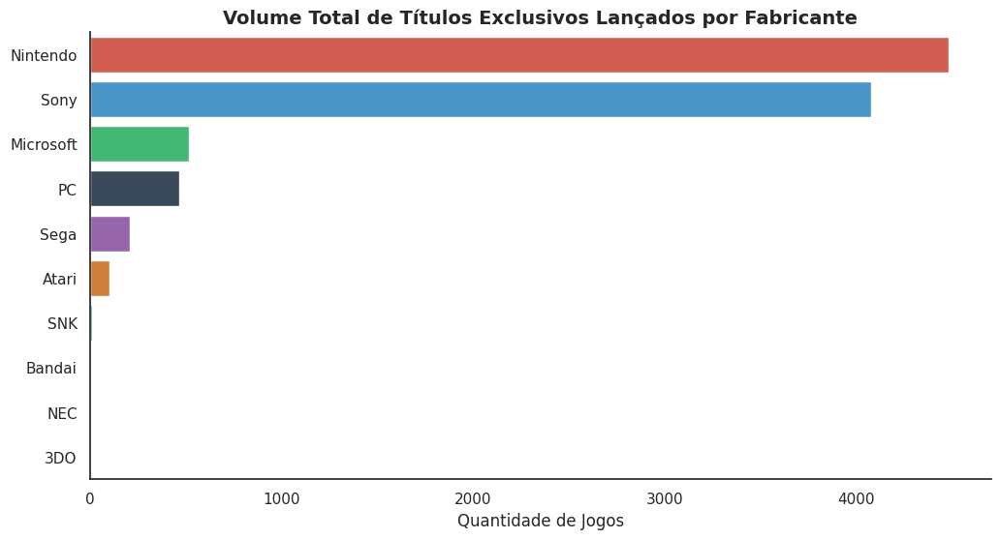

In [104]:
# Ordenando o gráfico
df_plot = df_display.sort_values(by='Qtd Jogos Exclusivos',ascending=False).copy()

plt.figure(figsize=(12, 6))
sns.barplot(x='Qtd Jogos Exclusivos', y=df_plot.index, data=df_plot, palette=maker_color_map, hue=df_plot.index, legend=False)
plt.title('Volume Total de Títulos Exclusivos Lançados por Fabricante', fontsize=14, fontweight='bold')
plt.xlabel('Quantidade de Jogos')
plt.ylabel('')
sns.despine()
plt.show()

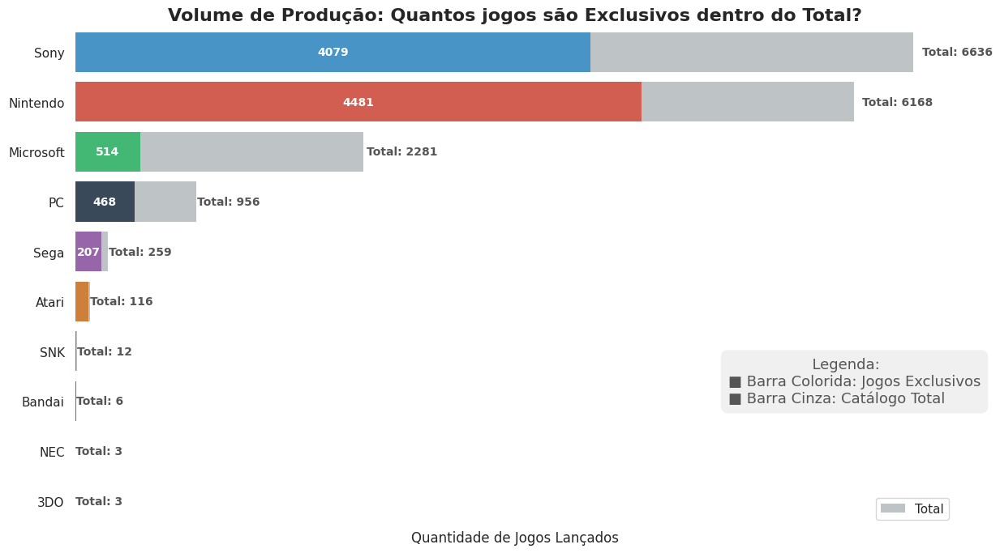

In [105]:
# 1. Preparação dos Dados (Garantir tipos numéricos)
df_plot['Qtd Jogos Totais'] = df_plot['Qtd Jogos Totais'].astype(float)
# df_plot['Qtd Jogos Exclusivos'] = df_plot['Qtd Jogos Exclusivos'].astype(float) # já feito

# Ordenando por jogos totais
df_plot = df_plot.sort_values(by='Qtd Jogos Totais',ascending=False)

# Configurar figura
fig, ax = plt.subplots(figsize=(14, 8))

# --- CAMADA 1: VOLUME TOTAL (Fundo Cinza) ---
sns.barplot(
    data=df_plot,
    x='Qtd Jogos Totais', 
    y=df_plot.index, 
    color='#BDC3C7', # Cinza claro
    edgecolor='white',
    linewidth=0,
    ax=ax, # Explícito
    label='Total'
)

# --- CAMADA 2: VOLUME EXCLUSIVO (Frente Colorida) ---
sns.barplot(
    data=df_plot,
    x='Qtd Jogos Exclusivos', 
    y=df_plot.index, 
    palette=maker_color_map, # Cores de marca
    edgecolor='white',
    linewidth=0,
    hue=df_plot.index, # Necessário para palette funcionar bem
    legend=False,
    ax=ax # Explícito
)

# --- 3. ROTULAGEM ---
for i, (maker, row) in enumerate(df_plot.iterrows()):
    total = row['Qtd Jogos Totais']
    exclusivo = row['Qtd Jogos Exclusivos']
    
    # Rótulo Exclusivo (Branco, dentro da barra colorida)
    if exclusivo > 100: # Só mostra se couber
        ax.text(
            exclusivo / 2, 
            i, 
            f'{int(exclusivo)}', 
            color='white', 
            ha='center', va='center', fontweight='bold', fontsize=10
        )
    
    # Rótulo Total (Cinza, fora da barra cinza)
    ax.text(
        total + (total * 0.01), # Um pouco à direita do fim
        i, 
        f'Total: {int(total)}', 
        color='#555555', 
        ha='left', va='center', fontsize=10, fontweight='bold'
    )

# Estilização
ax.set_title('Volume de Produção: Quantos jogos são Exclusivos dentro do Total?', fontsize=16, fontweight='bold')
ax.set_xlabel('Quantidade de Jogos Lançados')
ax.set_ylabel('')
sns.despine(left=True, bottom=True)
ax.set_xticks([]) 

# Legenda Explicativa
plt.figtext(0.7, 0.3, "                  Legenda:\n■ Barra Colorida: Jogos Exclusivos\n■ Barra Cinza: Catálogo Total", 
            fontsize=13, bbox=dict(facecolor='#f0f0f0', edgecolor='none', boxstyle='round,pad=0.5'), color='#555')

plt.show()

##### ❓ **``Pergunta:``**
> ***``Quais plataformas historicamente geraram o maior volume de vendas apenas com seus títulos exclusivos?``***

##### 👉 **``Resposta:``**
O gráfico revela um domínio claro de duas empresas no mercado de exclusivos, com a **`Nintendo`** liderando de forma expressiva, seguido da **`Sony`**.

##### 💡 **``Descobertas``**
* **`O "Big 4" dos Exclusivos`:** 
> * Podemos perceber **4 consoles** disparados na liderança em vendas de jogos exclusivos:<br>
>    * O **`Nintendo DS`** (608.0M), **`Wii`** (557.7M), **`PlayStation (PS)`** (537.5M) e **`PlayStation 2 (PS2)`** (452.9M).<br>
>    * Combinados, esses quatro consoles venderam mais de `2.1 bilhões` de cópias de jogos exclusivos.

* **`O Domínio Absoluto da Nintendo`:**
> Esta é a descoberta mais significativa do gráfico:<br>
> * Das 15 plataformas com mais vendas de exclusivos, **9 pertencem à Nintendo** (`DS`, `Wii`, `GBA`, `3DS`, `GB`, `N64`, `NES`, `SNES`, `GC`).<br>
> * Isso comprova visualmente o sucesso histórico da estratégia da empresa, focada em franquias *first-party* fortes (como Mario, Pokémon e Zelda) para impulsionar seu hardware.

* **`A Força da Sony`:**
> * A Sony também demonstra um desempenho significativo, colocando 4 de suas plataformas no Top 15 (`PS`, `PS2`, `PSP`, `PS3`).<br>
> * O sucesso massivo do PlayStation original e do PS2 foi claramente impulsionado por seus fortes catálogos de exclusivos.

* **`O Ponto de Contraste (Microsoft)`:**
> * Apenas uma plataforma da Microsoft, o **Xbox 360** (176.3M), aparece na lista. Isso sugere que, historicamente (até 2016), a força de vendas da marca Xbox estava menos concentrada em seu volume de exclusivos e mais em sua performance com jogos multiplataforma e serviços online.

* **`A Presença do PC`:**
> * É notável que o **PC** (117.3M) apareça nesta lista. Isso representa o grande e lucrativo mercado de jogos lançados apenas para computador (como jogos de estratégia em tempo real, MMOs e uma vasta biblioteca indie) que não chegam aos consoles.

---

### [**Top 20 Jogos Exclusivos Mais Vendidos**](#toc0_3)

#### ❓Análise Extra: ***Quais são, individualmente, os 20 jogos exclusivos mais vendidos de todos os tempos (até 2016)? E quais plataformas foram responsáveis por criar esses 'carros-chefes'?***

A análise anterior mostrou que plataformas como `DS`, `Wii` e `PS` dominaram o *volume total* de vendas de exclusivos. A pergunta que esta análise responde é:

> ***"Quais são, individualmente, os 20 jogos exclusivos mais vendidos de todos os tempos (até 2016)? E quais plataformas foram responsáveis por criar esses 'carros-chefes'?"***

Estes são os "jogos matadores" (ou *system sellers*), os títulos tão fortes que motivaram a compra dos consoles por si sós.

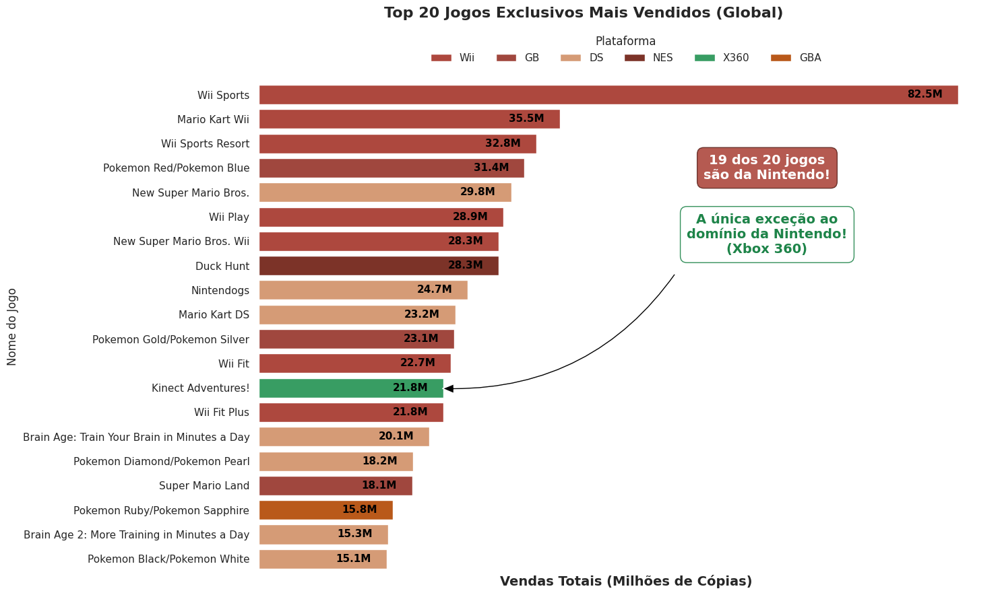

--- Top 20 Jogos Exclusivos Mais Vendidos (Todas as Plataformas) ---
                                        name platform  total_sales
                                  Wii Sports      Wii        82.54
                              Mario Kart Wii      Wii        35.52
                           Wii Sports Resort      Wii        32.77
                    Pokemon Red/Pokemon Blue       GB        31.38
                       New Super Mario Bros.       DS        29.80
                                    Wii Play      Wii        28.91
                   New Super Mario Bros. Wii      Wii        28.32
                                   Duck Hunt      NES        28.31
                                  Nintendogs       DS        24.67
                               Mario Kart DS       DS        23.21
                 Pokemon Gold/Pokemon Silver       GB        23.09
                                     Wii Fit      Wii        22.70
                          Kinect Adventures!     X360       

In [74]:
# 14. Top 20 Jogos Exclusivos Mais Vendidos
# Quais são, individualmente, os 20 jogos exclusivos mais vendidos de todos os tempos (até 2016)? E quais plataformas foram responsáveis por criar esses 'carros-chefes'?

# 1. IDENTIFICAR EXCLUSIVOS
# Agrupa por 'name' e conta o número de plataformas únicas
plataformas_por_jogo = df.groupby('name')['platform'].nunique()

# Filtra essa lista para obter apenas os nomes dos jogos onde a contagem de plataformas é 1
lista_de_exclusivos = plataformas_por_jogo[plataformas_por_jogo == 1].index

# 2. FILTRAR O DATAFRAME PRINCIPAL
# Filtra o DataFrame original para manter APENAS os jogos da nossa 'lista_de_exclusivos'
df_exclusivos = df[df['name'].isin(lista_de_exclusivos)]

# 3. ORDENAR E SELECIONAR O TOP 20
# Ordena por 'total_sales' (maior para o menor)
top_exclusivos = df_exclusivos.sort_values(by='total_sales', ascending=False)

# Selecionar top 20
resultado_final = top_exclusivos[['name', 'platform', 'total_sales']].head(20)

# 4. Plotar
plt.figure(figsize=(15, 9)) 

# Usando 'hue' para colorir as barras pela plataforma
ax = sns.barplot(
    x='total_sales',
    y='name',
    hue='platform',    
    data=resultado_final,
    palette=platform_color_map
)

# --- ANOTAÇÕES: Adicionando os valores nas barras manualmente ---
for bar in ax.patches:
    width = bar.get_width()
    if width > 0:
        y = bar.get_y()
        height = bar.get_height()
        
        ax.text(
            x=width - 6,       # Posição X: Fim da barra + 0.5 de espaço
            y=y + height / 2,   # Posição Y: No meio da barra
            s=f'{width:.1f}M',  # O texto formatado (ex: "82.5M")
            ha='left',          # Alinhamento
            va='center',       
            fontsize=11,
            color='black',
            fontweight='bold'
        )

# ANOTAÇÃO: DESTAQUE XBOX (Kinect Adventures!)

ax.annotate(
    'A única exceção ao\ndomínio da Nintendo!\n(Xbox 360)',
    xy=(20, 12), # PONTA DA SETA    
    xytext=(60, 6.5), # POSIÇÃO DO TEXTO 
    
    # Estilo da Seta
    arrowprops=dict(
        facecolor='black', 
        shrink=0.05, 
        width=2, 
        headwidth=10,
        connectionstyle="arc3,rad=-0.3"
    ),
    
    # Estilo do Texto
    fontsize=14,
    fontweight='bold',
    color='#1E8449', 
    ha='center',
    bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="#1E8449", alpha=0.9)
)

# ANOTAÇÃO 2: DOMÍNIO NINTENDO

ax.text(
    x=60, 
    y=3, 
    s='19 dos 20 jogos\nsão da Nintendo!', 
    fontsize=14,
    fontweight='bold',
    color='white',          # Texto branco para contraste
    ha='center',            # Centralizado horizontalmente no ponto X
    va='center',            # Centralizado verticalmente no ponto Y
    bbox=dict(
        boxstyle="round,pad=0.5", 
        fc="#ad483e",       # Cor Vermelha da Nintendo
        ec="#602822",       # Borda um pouco mais escura
        alpha=0.9,          # Opacidade
    )
)

# --- Estilização Final ---
plt.suptitle('                                Top 20 Jogos Exclusivos Mais Vendidos (Global)', fontsize=16, fontweight='bold')
plt.xlabel('Vendas Totais (Milhões de Cópias)', fontsize=14, fontweight='bold')
plt.ylabel('Nome do Jogo', fontsize=12)

# --- Limpeza do Gráfico ---
ax.set_xticks([]) # Remove os números do eixo X (redundantes)
sns.despine(left=True, bottom=True) # Remove bordas
plt.grid(axis='x', linestyle='--', alpha=0.5)

# Ajusta a legenda
plt.legend(
    title='Plataforma', 
    
    # Posição: X=0.5 (Centro), Y=1.02 (Logo acima da linha superior do gráfico)
    bbox_to_anchor=(0.5, 1.02), 
    
    # Ponto de ancoragem da própria caixa da legenda (Centro Inferior)
    loc='lower center',
    
    # Número de colunas: Espalha os itens horizontalmente
    ncol=7, 
    
    # Estilo
    title_fontproperties={'size': 12},
    prop={'size': 11},
    frameon=False
)

plt.tight_layout()

plt.show()

# 4. MOSTRAR OS RESULTADOS
# Seleciona as colunas que você pediu e imprime as 20 primeiras
print("--- Top 20 Jogos Exclusivos Mais Vendidos (Todas as Plataformas) ---")


# Imprime em formato Markdown (floatfmt=".2f" -> 2 casas decimais)
print(resultado_final.to_string(index=False, float_format="%.2f"))

##### ❓ **``Pergunta:``**
> **``Quais são, individualmente, os 20 jogos exclusivos mais vendidos de todos os tempos (até 2016)? E quais plataformas foram responsáveis por criar esses 'carros-chefes'?``**


##### 👉 **``Resposta:``**
O gráfico ilustra um domínio quase absoluto da `Nintendo` na criação de *mega-hits* individuais.


##### 💡 **``Descobertas``**
* **`Domínio Inquestionável da Nintendo`:**
> * A descoberta mais impactante é que das 20 posições no gráfico, **19 pertencem a jogos em plataformas da Nintendo**. A única exceção é `Kinect Adventures!` (para o `X360`), que, assim como `Wii Sports`, teve suas vendas infladas por ser um "jogo pack-in" (incluído na venda do console).

* **`Os Três Pilares da Nintendo`:**
> * O sucesso da Nintendo é construído sobre três franquias principais que dominam esta lista:
>    1.  **A série "Wii"** (`Wii Sports`, `Wii Sports Resort`, `Wii Play`, `Wii Fit`, `Wii Fit Plus`)
>    2.  **Pokémon** (`Red/Blue`, `Gold/Silver`, `Diamond/Pearl`, `Ruby/Sapphire`, `Black/White`)
>    3.  **Mario** (`Mario Kart Wii`, `New Super Mario Bros.`, `New Super Mario Bros. Wii`, `Duck Hunt`*, `Super Mario Land`)
    *(Duck Hunt, embora de outra franquia, era frequentemente vendido em cartucho junto com Super Mario Bros.)*

* **`O Paradoxo da Sony:`**
> * Esta é a análise mais crucial ao comparar este gráfico com o anterior.
> Na análise de *volume total*, o `PS` e o `PS2` foram o 3º e 4º lugar em vendas de exclusivos (somando quase 1 bilhão de cópias!).
> No entanto, **nenhum jogo exclusivo da Sony aparece neste Top 20 individual.**
>    * **Isso revela duas estratégias de sucesso opostas:**
>        * **`Nintendo`:** Focou em criar "carros-chefes" de apelo universal (`Wii Sports`, `Pokémon`, `Mario Kart`) que vendiam dezenas de milhões de cópias cada.
>        * **`Sony`:** Focou em construir um **catálogo amplo e diversificado** de exclusivos (ex: *Gran Turismo*, *Final Fantasy*, *Metal Gear Solid*, *Crash Bandicoot*, *Tomb Raider* - na época), onde dezenas de jogos vendiam muito bem (5-15 milhões), mas nenhum atingiu individualmente marcas astronômicas como a dos hits da `Nintendo`.

---

### [**Market Share de Consoles**](#toc0_3)

#### ❓Análise Extra: ***Quais foram os consoles mais vendidos até o final de 2016, e qual fatia de mercado (market share) cada uma possuía?***

#### **Número de Consoles Vendidos e Market Share até 2016**

Para contextualizar as vendas de jogos, é fundamental entender o mercado de hardware (os próprios consoles). A pergunta que esta análise responde é:

***"Quais foram as plataformas de console mais vendidas até o final de 2016, e qual fatia de mercado (market share) cada uma possuía?"***

Uma plataforma com muitos consoles vendidos tem um potencial muito maior para vender um grande volume de jogos.<br><br>


**Vendas Acumuladas de Consoles até final de 2016** *\* dados da web*


| Sigla<br>(`platform`) | Plataforma | Ano de<br>Lançamento | Unidades Vendidas<br>(Até final 2016) | Market Share<br>(%) |
| ---: | :--- | :---: | :---: | :---: |
| `PS2` | PlayStation 2 | 2000 | 160.01 M | 11.05% |
| `DS` | Nintendo DS | 2004 | 154.02 M | 10.63% |
| `GB` | Game Boy | 1989 | 118.69 M | 8.20% |
| `PS` | PlayStation | 1994 | 102.49 M | 7.08% |
| `Wii` | Nintendo Wii | 2006 | 101.63 M | 7.02% |
| `PS3` | PlayStation 3 | 2006 | 87.40 M | 6.03% |
| `X360` | Xbox 360 | 2005 | 85.73 M | 5.92% |
| `PSP` | PlayStation Portable | 2004 | 82.52 M | 5.70% |
| `GBA` | Game Boy Advance | 2001 | 81.51 M | 5.63% |
| `3DS` | Nintendo 3DS | 2011 | 65.30 M | 4.51% |
| `NES` | Nintendo Entertainment System | 1985 | 61.91 M | 4.27% |
| `PS4` | PlayStation 4 | 2013 | 53.40 M | 3.69% |
| `SNES` | Super Nintendo | 1990 | 49.10 M | 3.39% |
| `GEN` | Sega Genesis | 1988 | 34.06 M | 2.35% |
| `N64` | Nintendo 64 | 1996 | 32.93 M | 2.27% |
| `2600` | Atari 2600 | 1977 | 30.00 M | 2.07% |
| `XOne` | Xbox One | 2013 | 25.50 M | 1.76% |
| `XB` | Xbox | 2001 | 24.65 M | 1.70% |
| `GC` | Nintendo GameCube | 2001 | 21.74 M | 1.50% |
| `PSV` | PlayStation Vita | 2011 | ~14.0 M | 0.97% |
| `WiiU` | Nintendo Wii U | 2012 | 13.56 M | 0.94% |
| `GG` | Sega Game Gear | 1990 | 10.62 M | 0.73% |
| `TG16` | TurboGrafx-16 | 1987 | 10.00 M | 0.69% |
| `SAT` | Sega Saturn | 1994 | 9.26 M | 0.64% |
| `DC` | Sega Dreamcast | 1998 | 9.13 M | 0.63% |
| `WS` | WonderSwan | 1999 | 3.50 M | 0.24% |
| `SCD` | Sega CD | 1991 | 2.24 M | 0.15% |
| `3DO` | 3DO Interactive Multiplayer | 1993 | 2.00 M | 0.14% |
| `NG` | Neo Geo | 1990 | 1.06 M | 0.07% |
| `PCFX` | PC-FX | 1994 | 0.30 M | 0.02% |
| `PC` | Personal Computer | Varia* | Varia* | Varia* |

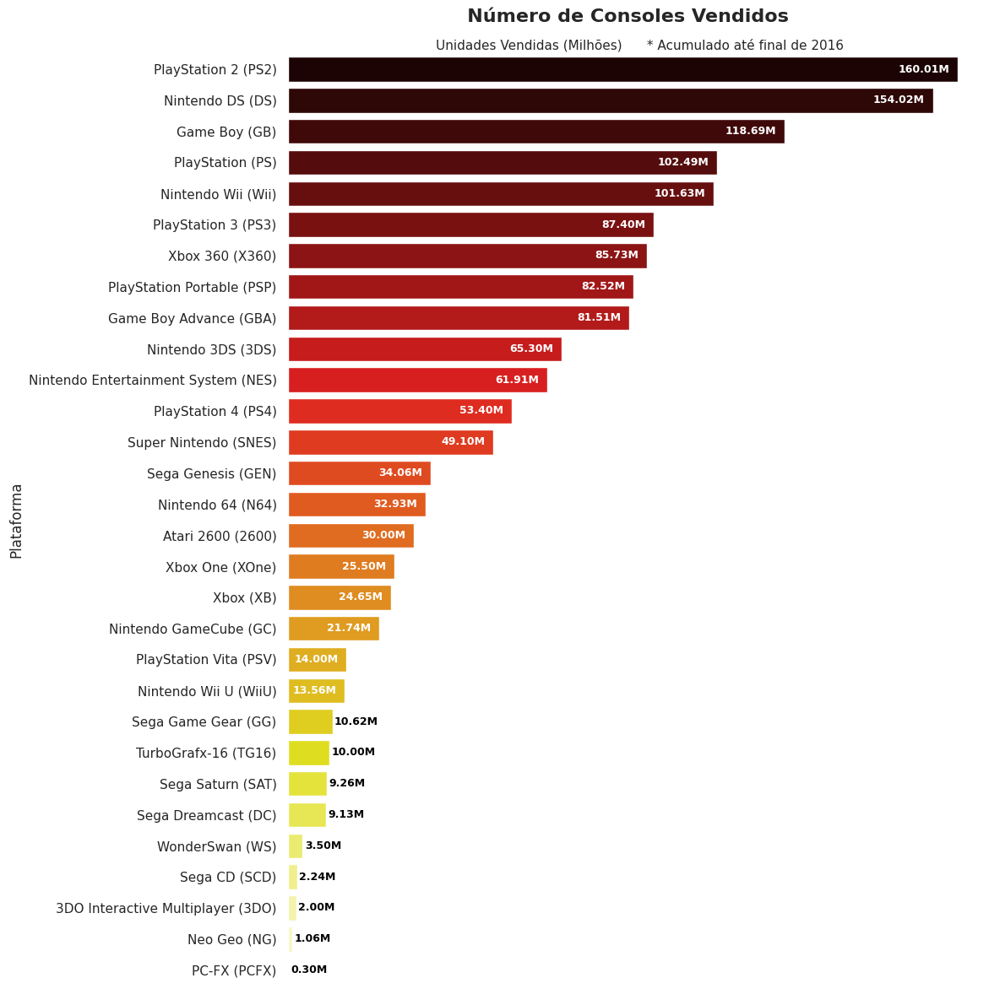

In [75]:
# Número de Consoles Vendidos e Market Share até 2016

# DataFrame gerado para plataformas em nosso DataSet original, com dados da Web para o acumulado de vendas de consoles até 2016 com verificação e geração dos dados da tabela pela IA Gemini

# 1. Dados da web
data = [
    {'platform': 'PlayStation 2 (PS2)', 'release_year': 2000, 'cum_sales': 160.01},
    {'platform': 'Nintendo DS (DS)', 'release_year': 2004, 'cum_sales': 154.02},
    {'platform': 'Game Boy (GB)', 'release_year': 1989, 'cum_sales': 118.69},
    {'platform': 'PlayStation (PS)', 'release_year': 1994, 'cum_sales': 102.49},
    {'platform': 'Nintendo Wii (Wii)', 'release_year': 2006, 'cum_sales': 101.63},
    {'platform': 'PlayStation 3 (PS3)', 'release_year': 2006, 'cum_sales': 87.40},
    {'platform': 'Xbox 360 (X360)', 'release_year': 2005, 'cum_sales': 85.73},
    {'platform': 'PlayStation Portable (PSP)', 'release_year': 2004, 'cum_sales': 82.52},
    {'platform': 'Game Boy Advance (GBA)', 'release_year': 2001, 'cum_sales': 81.51},
    {'platform': 'Nintendo 3DS (3DS)', 'release_year': 2011, 'cum_sales': 65.30},
    {'platform': 'Nintendo Entertainment System (NES)', 'release_year': 1985, 'cum_sales': 61.91},
    {'platform': 'PlayStation 4 (PS4)', 'release_year': 2013, 'cum_sales': 53.40},
    {'platform': 'Super Nintendo (SNES)', 'release_year': 1990, 'cum_sales': 49.10},
    {'platform': 'Sega Genesis (GEN)', 'release_year': 1988, 'cum_sales': 34.06},
    {'platform': 'Nintendo 64 (N64)', 'release_year': 1996, 'cum_sales': 32.93},
    {'platform': 'Atari 2600 (2600)', 'release_year': 1977, 'cum_sales': 30.00},
    {'platform': 'Xbox One (XOne)', 'release_year': 2013, 'cum_sales': 25.50},
    {'platform': 'Xbox (XB)', 'release_year': 2001, 'cum_sales': 24.65},
    {'platform': 'Nintendo GameCube (GC)', 'release_year': 2001, 'cum_sales': 21.74},
    {'platform': 'PlayStation Vita (PSV)', 'release_year': 2011, 'cum_sales': 14.0}, # Limpei o '~'
    {'platform': 'Nintendo Wii U (WiiU)', 'release_year': 2012, 'cum_sales': 13.56},
    {'platform': 'Sega Game Gear (GG)', 'release_year': 1990, 'cum_sales': 10.62},
    {'platform': 'TurboGrafx-16 (TG16)', 'release_year': 1987, 'cum_sales': 10.00},
    {'platform': 'Sega Saturn (SAT)', 'release_year': 1994, 'cum_sales': 9.26},
    {'platform': 'Sega Dreamcast (DC)', 'release_year': 1998, 'cum_sales': 9.13},
    {'platform': 'WonderSwan (WS)', 'release_year': 1999, 'cum_sales': 3.50},
    {'platform': 'Sega CD (SCD)', 'release_year': 1991, 'cum_sales': 2.24},
    {'platform': '3DO Interactive Multiplayer (3DO)', 'release_year': 1993, 'cum_sales': 2.00},
    {'platform': 'Neo Geo (NG)', 'release_year': 1990, 'cum_sales': 1.06},
    {'platform': 'PC-FX (PCFX)', 'release_year': 1994, 'cum_sales': 0.30}
]

# 2. Criar e limpar o DataFrame
df_consoles = pd.DataFrame(data)

# 3. Preparar os dados para o Seaborn (Series ordenada)
console_sales_sorted = df_consoles.set_index('platform')['cum_sales'].sort_values(ascending=False)

# 4. Visualizando (Gráfico de Barras Horizontal)
plt.figure(figsize=(12, 12)) # Deixei mais alto para caber todas as 30 plataformas

# Plotando com Seaborn
ax = sns.barplot(
    x=console_sales_sorted.values,    # Valores (vendas)
    y=console_sales_sorted.index,     # Categorias (plataformas)
    palette='hot'                     # Agora isso funciona!
)

# Lógica Condicional para Anotações
for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y()
    height = bar.get_height()
    
    # Se a barra for menor que 11M, o texto fica PRETO e FORA da barra
    if width < 11.0:
        ax.text(
            x=width + 0.5,       # Posição X: FORA da barra (à direita)
            y=y + height / 2,    # Posição Y: No meio da barra
            s=f'{width:.2f}M',   # O texto formatado
            ha='left',           # Alinhamento à ESQUERDA
            va='center',         
            fontsize=9,
            color='black',       # Cor PRETA
            fontweight='bold'
        )
    # Se for 10M ou mais, mantém o texto BRANCO e DENTRO da barra
    else:
        ax.text(
            x=width - 2,           # Posição X: DENTRO da barra
            y=y + height / 2,    
            s=f'{width:.2f}M',   
            ha='right',          # Alinhamento à DIREITA
            va='center',         
            fontsize=9,
            color='white',       # Cor BRANCA
            fontweight='bold'
        )

# Limpando o gráfico
sns.despine(left=True, bottom=True) 

# Rótulos
plt.suptitle('                                       Número de Consoles Vendidos', fontsize=16, fontweight='bold')
ax.set_xlabel('Unidades Vendidas (Milhões)      * Acumulado até final de 2016', fontsize=11)

# 2. Mova o rótulo do eixo X para o topo
ax.xaxis.set_label_position('top')
plt.ylabel('Plataforma', fontsize=12)

# Removendo os números redundantes do eixo X
plt.xticks([]) 

plt.grid(axis='x', linestyle='--', alpha=0.3) 
plt.tight_layout(rect=[0, 0, 1, 0.997]) # Alinhamento da legenda - esquerda, base, direita, topo
plt.show()

##### ❓ **``Pergunta:``**
> ***``Quais foram os consoles mais vendidos até o final de 2016, e qual fatia de mercado (market share) cada uma possuía?``***


##### 👉 **``Resposta:``**
A análise dos consoles mais vendidos nos mostra que:

##### 💡 **``Descobertas:``**

  * **`Domínio de Duas Gigantes`:**
  > * O **PlayStation 2 (PS2)** e o **Nintendo DS (DS)** dominam completamente o mercado, ambos com mais de 150 milhões de unidades vendidas.<br>Sozinhos, eles representam **21.68%** de todos os consoles vendidos no período.

  * **`O "Clube dos 100 Milhões"`:**
  > * O sucesso histórico é claro em cinco plataformas que ultrapassaram a marca de 100 milhões de unidades: `PS2`, `DS`, `Game Boy (GB)`, `PlayStation (PS)` e `Nintendo Wii (Wii)`. Juntas, estas 5 plataformas somam **44.08%** de todo o mercado de consoles.

  * **`A Força dos Portáteis`:**
  > * O mercado não foi dominado apenas por consoles tradicionais de mesa. Quatro dos 10 videogames mais vendidos são portáteis (`DS`, `GB`, `PSP`, `GBA`), demonstrando a enorme relevância desse segmento.

  * **`Domínio de Marca`:**
  > * Fica claro que **Sony** (PS2, PS, PS3, PSP) e **Nintendo** (DS, GB, Wii, GBA, 3DS, NES, SNES) são líderes disparados, ocupando 9 das 10 primeiras posições.<br>A Microsoft (`X360`) se estabelece como terceira colocoda, enquanto plataformas clássicas (como Sega e Atari) ainda têm um *market share* residual neste corte histórico.

  * **`Contexto para Vendas de Jogos`:**<br>
  > * Esta análise da venda de consoles é crucial, pois ela define o "público potencial" (base instalada) para a venda de jogos. Plataformas com uma base gigantesca, como o PS2 e o Wii, naturalmente tiveram um volume maior de cópias vendidas, o que explica por que jogos como "Wii Sports" atingiram vendas tão astronômicas como nunca visto antes.

---

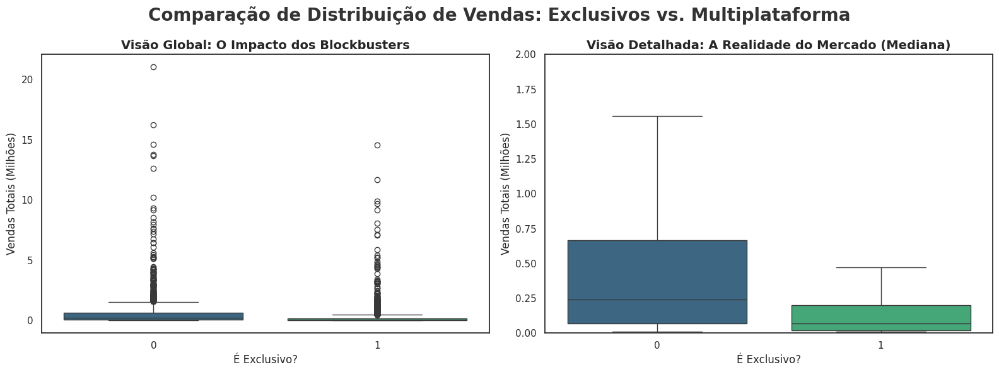

In [76]:
# Configurar a figura com 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- GRÁFICO 1: Visão Global (Com Outliers) ---
sns.boxplot(x='is_exclusive', y='total_sales', data=df_relevante, ax=axes[0], palette='viridis')
axes[0].set_title('Visão Global: O Impacto dos Blockbusters', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Vendas Totais (Milhões)')
axes[0].set_xlabel('É Exclusivo?')

# --- GRÁFICO 2: Visão Detalhada (Sem Outliers Extremos) ---
sns.boxplot(x='is_exclusive', y='total_sales', data=df_relevante, ax=axes[1], palette='viridis', showfliers=False) # showfliers=False esconde os pontos extremos
axes[1].set_title('Visão Detalhada: A Realidade do Mercado (Mediana)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Vendas Totais (Milhões)')
axes[1].set_xlabel('É Exclusivo?')

# Ajuste de limite se necessário para dar zoom manual (opcional)
axes[1].set_ylim(0, 2.0) 

plt.suptitle('Comparação de Distribuição de Vendas: Exclusivos vs. Multiplataforma', fontsize=20, fontweight='bold', color='#333333')
plt.tight_layout()
plt.show()

##### 👉 **`Resposta:`**

A análise mostra duas tendências claras: o domínio da geração mais antiga no início do período e a rápida ascensão da nova geração.

##### 💡 **`Análise do gráfico e da tabela:`**

  * **Domínio da Geração 7 (PS3/X360):** Jogos lançados no início do período (2012-2013), como `Grand Theft Auto V` e `Call of Duty: Black Ops II`, tiveram suas maiores vendas nas plataformas estabelecidas (`PS3` e `X360`).
  * **Domínio da Geração 8 (PS4/XOne):** Jogos lançados mais tarde no período (2014-2015), como `Call of Duty: Black Ops 3`, venderam significativamente mais no `PS4` do que em qualquer outra plataforma, mostrando que o mercado já havia migrado.
  * **Domínio do PS4 sobre o XOne:** Em quase todos os grandes lançamentos multiplataforma (`GTA V`, `Black Ops 3`, etc.), a versão do `PS4` vendeu mais que a versão do `XOne`, reforçando a liderança de mercado do PS4.

<br>

> ℹ️ **Tabela: `Vendas de Jogos Multiplataforma (Amostra 2012-2016)`**
> *(Saída do código acima)*

-----

-----

### **Análise de Gêneros**

##### ***`❓ Quais os gêneros mais lucrativos? Podemos generalizar sobre gêneros com vendas altas e baixas?`***

Para responder a esta pergunta, analisei os gêneros de duas maneiras (usando o `df_relevante` 2012-2016):

1.  **Vendas Totais (`sum`):** Para ver o tamanho total do mercado de cada gênero.
2.  **Vendas Medianas (`median`):** Para ver o desempenho de um jogo "típico" em cada gênero, ignorando o efeito dos *outliers* (blockbusters).


##### 📊 **``Visualização: Os Gêneros Campeões de Vendas``**

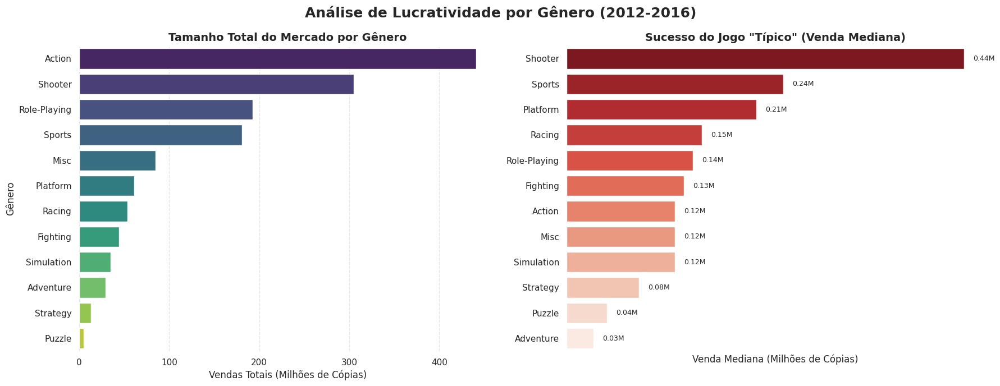


--- Tabela de Análise de Gênero (Ordenada por Vendas Totais) ---


,sum,mean,median
genre,,,
Action,441.12,0.43,0.12
Shooter,304.73,1.30,0.44
Role-Playing,192.80,0.52,0.14
Sports,181.06,0.68,0.24
Misc,85.04,0.44,0.12
Platform,61.00,0.72,0.21
Racing,53.42,0.47,0.15
Fighting,44.49,0.41,0.13
Simulation,35.12,0.44,0.12


In [77]:
# --- 1. PREPARAÇÃO DOS DADOS (GÊNEROS) ---
# (Usando o df_relevante 2012-2016)

# Agrupei por gênero e calculei as 3 métricas:
# Soma (Tamanho do Mercado)
# Média (Potencial de Outlier)
# Mediana (Sucesso do Jogo "Típico")
genre_analysis = df_relevante.groupby('genre')['total_sales'].agg(['sum', 'mean', 'median'])

# Ordena pela SOMA (Tamanho do Mercado) para a tabela
genre_table_sorted = genre_analysis.sort_values(by='sum', ascending=False)


# --- 2. PLOTAGEM (Gráficos Lado a Lado) ---
fig, axes = plt.subplots(1, 2, figsize=(18, 7)) # 1 linha, 2 colunas

# --- Gráfico 1: VENDAS TOTAIS (Tamanho do Mercado) ---
data_plot_sum = genre_analysis.sort_values(by='sum', ascending=False)

sns.barplot(
    x=data_plot_sum['sum'],
    y=data_plot_sum.index,
    palette='viridis',
    hue=data_plot_sum.index,
    legend=False,
    ax=axes[0] # Plota no primeiro eixo
)
axes[0].set_title('Tamanho Total do Mercado por Gênero', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Vendas Totais (Milhões de Cópias)', fontsize=12)
axes[0].set_ylabel('Gênero', fontsize=12)
axes[0].grid(axis='x', linestyle='--', alpha=0.5)

# --- Gráfico 2: VENDAS MEDIANAS (Jogo "Típico") ---
data_plot_median = genre_analysis.sort_values(by='median', ascending=False)

sns.barplot(
    x=data_plot_median['median'],
    y=data_plot_median.index,
    palette='Reds_r', # Paleta de cor diferente
    hue=data_plot_median.index,
    legend=False,
    ax=axes[1] # Plota no segundo eixo
)
axes[1].set_title('Sucesso do Jogo "Típico" (Venda Mediana)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Venda Mediana (Milhões de Cópias)', fontsize=12)
axes[1].set_ylabel('') # Remove o rótulo Y (redundante)

# Adiciona rótulos de dados (mediana)
for bar in axes[1].patches:
    width = bar.get_width()
    axes[1].text(width + 0.01, bar.get_y() + bar.get_height()/2, 
                 f'{width:.2f}M', ha='left', va='center', fontsize=9)

axes[1].set_xticks([]) # Remove o eixo X (redundante)
axes[1].grid(axis='x', linestyle='--', alpha=0.5)

# --- Estilização Final ---
plt.suptitle('Análise de Lucratividade por Gênero (2012-2016)', fontsize=18, fontweight='bold')
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

# --- 3. EXIBIR A TABELA DE DADOS ---
print("\n--- Tabela de Análise de Gênero (Ordenada por Vendas Totais) ---")
display(HTML(genre_table_sorted.to_html(float_format="%.2f")))

##### 👉 **`Resposta:`**

Sim, podemos generalizar. Os gêneros mais "lucrativos" em termos de **volume total** (`Action`, `Shooter`) não são necessariamente os mesmos com o **maior sucesso "típico"** (mediana).

##### 💡 **`Análise dos Gráficos e da Tabela:`**

  * **Gêneros de Alto Volume (Blockbusters):**

      * **`Action`** e **`Shooter`** são os líderes indiscutíveis em vendas totais. O gênero `Action` sozinho gerou mais que o dobro de receita que o terceiro colocado (`Role-Playing`). Isso mostra que os maiores *blockbusters* do mercado (como `GTA V` e `Call of Duty`) pertencem a essas categorias.

  * **Gêneros de "Sucesso Típico" (Mediana Alta):**

      * **`Shooter`** se destaca imensamente. O jogo "típico" de `Shooter` (mediana de 0.43M) vende **mais que o dobro** do jogo "típico" de `Action` (mediana de 0.12M).
      * **Por quê?** O gênero `Action` é "poluído" por muitos jogos de baixo orçamento ou indie, que puxam a mediana para baixo. O gênero `Shooter` (Tiro) tende a ter menos lançamentos, mas com orçamentos maiores (AAA), resultando em uma mediana de vendas muito mais saudável.

  * **Gêneros de Vendas Baixas (Nichos):**

      * Gêneros como **`Adventure`**, **`Puzzle`**, e **`Strategy`** mostram vendas totais e medianas muito baixas. A mediana de um jogo de `Adventure` (0.03M ou 30.000 cópias) é 14 vezes menor que a de um `Shooter`. Estes são claramente mercados de nicho.

##### 🎯 **`Conclusão Estratégica:`**

Para a Ice, a estratégia de 2017 deve ser dupla:

1.  **Orçamento de Blockbuster:** Alocar a maior parte do orçamento de marketing para os grandes lançamentos de **`Action`** e **`Shooter`**, pois eles têm o maior potencial de vendas (outliers).
2.  **Risco de Inventário:** Ao estocar jogos "médios", os de **`Shooter`** e **`Sports`** são apostas mais seguras (maior mediana) do que os de **`Action`** ou, especialmente, **`Adventure`**.

<br>

> ℹ️ **Tabela: `Análise de Vendas de Gênero (2012-2016)`**
> *(Saída do código acima, ordenada por `sum`)*

### **Análise de Exclusividade por Ecossistema (Fabricante)**

> ##### ❓ ***Qual é a estratégia de conteúdo de cada fabricante? O mercado é dominado por jogos exclusivos ou multiplataforma?***
> 
Entender a exclusividade é crucial para a modelagem preditiva.<br>
Se uma plataforma ou fabricante depende fortemente de exclusivos (como a `Nintendo`),<br>
o modelo deve ponderar o fator "``Ecossistema``" de forma diferente de plataformas que compartilham biblioteca (como ``Xbox`` e ``PC``).

##### 📊 **Dados e Metodologia**
Utilizei a engenharia de features criada anteriormente (`console_maker` e `is_exclusive`) para calcular a taxa de exclusividade no período relevante (**2012-2016**).
* **Definição de Exclusivo:** O jogo foi lançado por apenas *um* fabricante (ex: se o jogo foi lançado apenas para `PS3` e `PS4`, conta como exclusivo da Sony).

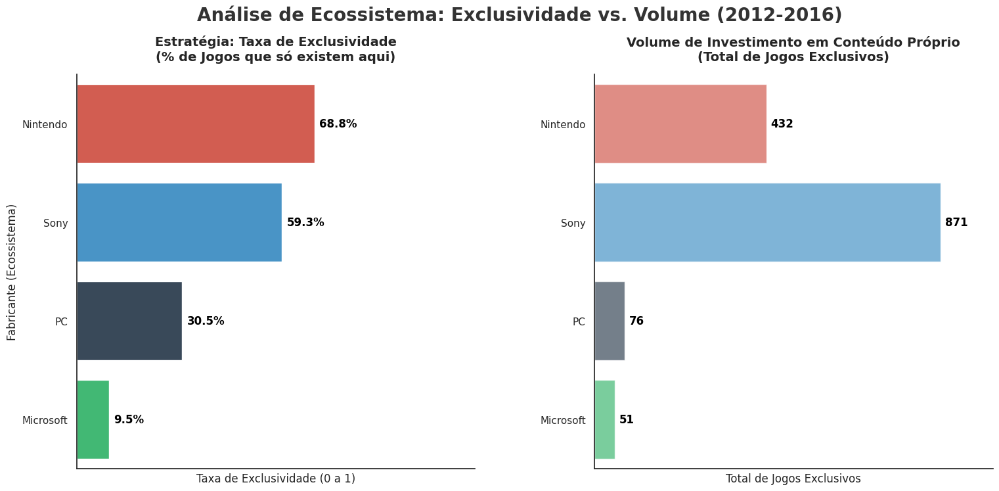

Taxa de Exclusividade por Ecossistema (Todo o Período)


,taxa_exclusividade_pct,total_exclusivos
console_maker,,
Nintendo,68.79%,432
Sony,59.33%,871
PC,30.52%,76
Microsoft,9.46%,51


In [78]:
# 5. Análise de Exclusividade por Ecossistema (Fabricante)
# Qual é a estratégia de conteúdo de cada fabricante? O mercado é dominado por jogos exclusivos ou multiplataforma?

# -----------------------------------------------------------------
# Análise Extra: Taxa de Exclusividade por Fabricante (Ecossistema)
# -----------------------------------------------------------------

# Estou usando `df_relevante` para filtrar pelo período relevante

# 1. Calcular a taxa (média de is_exclusive) e contagem de jogos
exclusivity_analysis = df_relevante.groupby('console_maker')['is_exclusive'].agg(
    taxa_exclusividade='mean',
    total_exclusivos='sum'
).sort_values('taxa_exclusividade', ascending=False)

# Converter a taxa para porcentagem para facilitar a leitura
exclusivity_analysis['taxa_exclusividade_pct'] = (exclusivity_analysis['taxa_exclusividade'] * 100).round(2)


# ----------------------------------------------
# VIZ DUPLA: Exclusividade vs Volume (2012-2016)
# ----------------------------------------------
# Configurar a figura
fig, axes = plt.subplots(1, 2, figsize=(18, 8)) 

# O índice do DataFrame (console_maker) será o eixo Y
y_index = exclusivity_analysis.index 

# --- GRÁFICO 1 (ESQUERDA): Taxa de Exclusividade ---
sns.barplot(
    x='taxa_exclusividade', 
    y=y_index, 
    data=exclusivity_analysis,
    palette=maker_color_map, 
    ax=axes[0],
    hue=y_index,
    legend=False
)

# Formatação Gráfico 1
axes[0].set_title('Estratégia: Taxa de Exclusividade\n(% de Jogos que só existem aqui)', fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Taxa de Exclusividade (0 a 1)', fontsize=12)
axes[0].set_ylabel('Fabricante (Ecossistema)', fontsize=12)
axes[0].set_xlim(0, 1.15)
axes[0].tick_params(labelsize=11)
axes[0].set_xticks([])

sns.despine(ax=axes[0], top=True, right=True)

# Anotações Gráfico 1 (Posicionamento horizontal)
for i, p in enumerate(axes[0].patches):
    width = p.get_width()
    # Posição do texto: no final da barra + um pequeno offset (5 pontos)
    axes[0].annotate(f'{width*100:.1f}%'.replace('.0%', '%'), 
                     (width, p.get_y() + p.get_height() / 2.), 
                     ha='left', va='center', fontsize=12, fontweight='bold', color='black',
                     xytext=(5, 0), textcoords='offset points')
    

# GRÁFICO 2
sns.barplot(
    x='total_exclusivos', 
    y=y_index, 
    data=exclusivity_analysis,
    palette=maker_color_map, 
    ax=axes[1],
    alpha=0.7,
    hue=y_index,
    legend=False
)

# Formatação Gráfico 2
axes[1].set_title('Volume de Investimento em Conteúdo Próprio\n(Total de Jogos Exclusivos)', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Total de Jogos Exclusivos', fontsize=12) # Label do eixo X
axes[1].set_ylabel('')
axes[1].set_xlim(0, exclusivity_analysis['total_exclusivos'].max() * 1.15) 
axes[1].tick_params(labelsize=11)
axes[1].set_xticks([])

sns.despine(ax=axes[1], top=True, right=True)

# Anotações Gráfico 2
for i, p in enumerate(axes[1].patches):
    width = p.get_width()
    axes[1].annotate(f'{int(width)}', 
                     (width, p.get_y() + p.get_height() / 2.), 
                     ha='left', va='center', fontsize=12, fontweight='bold', color='black',
                     xytext=(5, 0), textcoords='offset points')

# Título Geral e Ajustes de Layout
plt.suptitle('Análise de Ecossistema: Exclusividade vs. Volume (2012-2016)', 
             fontsize=20, fontweight='bold', y=0.98, color='#333333')

# Corrigindo espaçamento final
plt.subplots_adjust(top=0.85, wspace=0.3, bottom=0.1)

plt.show()


# --- Exibindo os resultados ---

# Formatando exibição do percentual
styled_table = exclusivity_analysis[['taxa_exclusividade_pct', 'total_exclusivos']].style.format({
    'taxa_exclusividade_pct': '{:.2f}%'
})

print('='*100)
print("Taxa de Exclusividade por Ecossistema (Todo o Período)")
print('='*100)
display(styled_table)

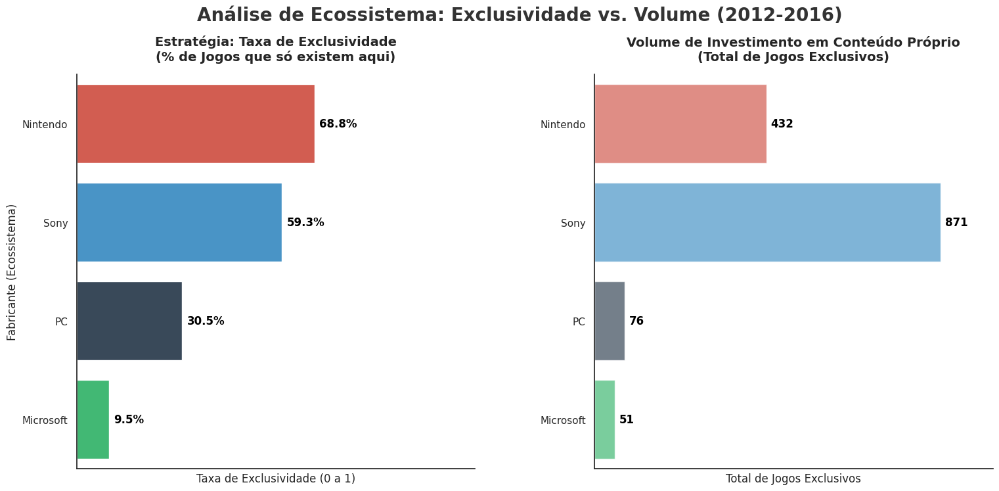

Taxa de Exclusividade por Ecossistema (Todo o Período)


,taxa_exclusividade_pct,total_exclusivos
console_maker,,
Nintendo,68.79%,432
Sony,59.33%,871
PC,30.52%,76
Microsoft,9.46%,51


In [101]:
# 5. Análise de Exclusividade por Ecossistema (Fabricante)
# Qual é a estratégia de conteúdo de cada fabricante? O mercado é dominado por jogos exclusivos ou multiplataforma?

# -----------------------------------------------------------------
# Análise Extra: Taxa de Exclusividade por Fabricante (Ecossistema)
# -----------------------------------------------------------------

# Estou usando `df_relevante` para filtrar pelo período relevante

# 1. Calcular a taxa (média de is_exclusive) e contagem de jogos
exclusivity_analysis = df_relevante.groupby('console_maker')['is_exclusive'].agg(
    taxa_exclusividade='mean',
    total_exclusivos='sum'
).sort_values('taxa_exclusividade', ascending=False)

# Converter a taxa para porcentagem para facilitar a leitura
exclusivity_analysis['taxa_exclusividade_pct'] = (exclusivity_analysis['taxa_exclusividade'] * 100).round(2)


# ----------------------------------------------
# VIZ DUPLA: Exclusividade vs Volume (2012-2016)
# ----------------------------------------------
# Configurar a figura
fig, axes = plt.subplots(1, 2, figsize=(18, 8)) 

# O índice do DataFrame (console_maker) será o eixo Y
y_index = exclusivity_analysis.index 

# --- GRÁFICO 1 (ESQUERDA): Taxa de Exclusividade ---
sns.barplot(
    x='taxa_exclusividade', 
    y=y_index, 
    data=exclusivity_analysis,
    palette=maker_color_map, 
    ax=axes[0],
    hue=y_index,
    legend=False
)

# Formatação Gráfico 1
axes[0].set_title('Estratégia: Taxa de Exclusividade\n(% de Jogos que só existem aqui)', fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Taxa de Exclusividade (0 a 1)', fontsize=12)
axes[0].set_ylabel('Fabricante (Ecossistema)', fontsize=12)
axes[0].set_xlim(0, 1.15)
axes[0].tick_params(labelsize=11)
axes[0].set_xticks([])

sns.despine(ax=axes[0], top=True, right=True)

# Anotações Gráfico 1 (Posicionamento horizontal)
for i, p in enumerate(axes[0].patches):
    width = p.get_width()
    # Posição do texto: no final da barra + um pequeno offset (5 pontos)
    axes[0].annotate(f'{width*100:.1f}%'.replace('.0%', '%'), 
                     (width, p.get_y() + p.get_height() / 2.), 
                     ha='left', va='center', fontsize=12, fontweight='bold', color='black',
                     xytext=(5, 0), textcoords='offset points')
    

# GRÁFICO 2
sns.barplot(
    x='total_exclusivos', 
    y=y_index, 
    data=exclusivity_analysis,
    palette=maker_color_map, 
    ax=axes[1],
    alpha=0.7,
    hue=y_index,
    legend=False
)

# Formatação Gráfico 2
axes[1].set_title('Volume de Investimento em Conteúdo Próprio\n(Total de Jogos Exclusivos)', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Total de Jogos Exclusivos', fontsize=12) # Label do eixo X
axes[1].set_ylabel('')
axes[1].set_xlim(0, exclusivity_analysis['total_exclusivos'].max() * 1.15) 
axes[1].tick_params(labelsize=11)
axes[1].set_xticks([])

sns.despine(ax=axes[1], top=True, right=True)

# Anotações Gráfico 2
for i, p in enumerate(axes[1].patches):
    width = p.get_width()
    axes[1].annotate(f'{int(width)}', 
                     (width, p.get_y() + p.get_height() / 2.), 
                     ha='left', va='center', fontsize=12, fontweight='bold', color='black',
                     xytext=(5, 0), textcoords='offset points')

# Título Geral e Ajustes de Layout
plt.suptitle('Análise de Ecossistema: Exclusividade vs. Volume (2012-2016)', 
             fontsize=20, fontweight='bold', y=0.98, color='#333333')

# Corrigindo espaçamento final
plt.subplots_adjust(top=0.85, wspace=0.3, bottom=0.1)

plt.show()


# --- Exibindo os resultados ---

# Formatando exibição do percentual
styled_table = exclusivity_analysis[['taxa_exclusividade_pct', 'total_exclusivos']].style.format({
    'taxa_exclusividade_pct': '{:.2f}%'
})

print('='*100)
print("Taxa de Exclusividade por Ecossistema (Todo o Período)")
print('='*100)
display(styled_table)


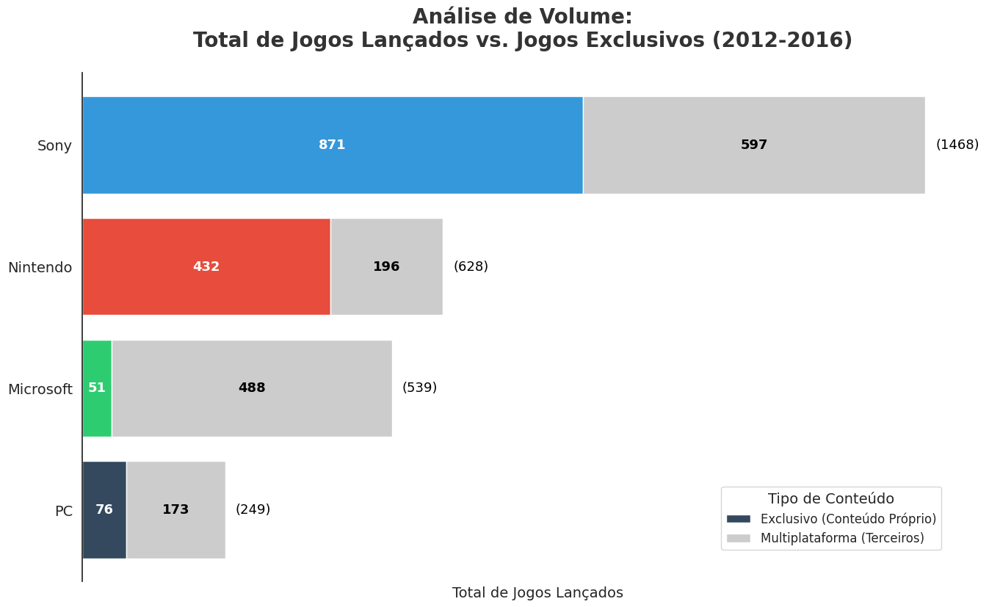

DataFrame para Empilhamento (Exclusivos + Multiplataforma):


,total_jogos_lancados,total_exclusivos,total_multiplataforma
console_maker,,,
PC,249,76,173
Microsoft,539,51,488
Nintendo,628,432,196
Sony,1468,871,597


In [ ]:

# ---------------------------------------------------------
# VIZ 2: Volume Total vs. Volume Exclusivo
# ---------------------------------------------------------



# -----------------------------------------------------------------
# VIZ 2: Dando um ZOOM na distribuição de jogos exclusivos X total 
# -----------------------------------------------------------------

# ----------------------------------------------------------
# 1. PREPARAÇÃO E ORDENAÇÃO DOS DADOS PARA GRÁFICO EMPILHADO
# ----------------------------------------------------------

# Garante ter as métricas absolutas
exclusivity_analysis_abs = df_relevante.groupby('console_maker')['is_exclusive'].agg(
    total_jogos_lancados='count',
    total_exclusivos='sum'
).reset_index()

# Calcula a parte multiplataforma
exclusivity_analysis_abs['total_multiplataforma'] = (
    exclusivity_analysis_abs['total_jogos_lancados'] - exclusivity_analysis_abs['total_exclusivos']
)

df_ranking = exclusivity_analysis_abs.sort_values(
    'total_jogos_lancados', 
    ascending=True
)
df_ranking = df_ranking.set_index('console_maker')

# As cores precisam ser consistentes com o maker_color_map
cores_ranking = [maker_color_map[maker] for maker in df_ranking.index]


# Configuração da figura
fig, ax = plt.subplots(
    figsize=(16, 9)
) 

# --------------------------------------
# 1. Plotagem
# --------------------------------------
y_index = df_ranking.index 
cores_ranking = [maker_color_map[maker] for maker in df_ranking.index]

# Plotar Exclusivos (Base da barra)
p2 = ax.barh(
    y=y_index, 
    width=df_ranking['total_exclusivos'], 
    color=cores_ranking,
    height=0.8,
    label='Exclusivo (Conteúdo Próprio)'
)

# Plotar Multiplataforma (Empilhado)
p1 = ax.barh(
    y=y_index, 
    width=df_ranking['total_multiplataforma'], 
    left=df_ranking['total_exclusivos'], 
    color='#cccccc',
    height=0.8,
    label='Multiplataforma (Terceiros)'
)

# --------------------------------------
# 2. Formatação e Correções
# --------------------------------------

# Título Principal e Eixos


plt.suptitle(
    'Análise de Volume:\nTotal de Jogos Lançados vs. Jogos Exclusivos (2012-2016)', 
    fontsize=20, 
    fontweight='bold', 
    color='#333333'
)

ax.set_ylabel('') 
ax.tick_params(labelsize=14)

# Eixo X
ax.set_xlabel(
    'Total de Jogos Lançados', 
    fontsize=14
) 
ax.set_xlim(0, 
    df_ranking['total_jogos_lancados'].max() * 1.08
)
ax.set_xticks([]) 

# LEGEND BOX (Posicionamento sobre o gráfico)
ax.legend(
    loc='lower right',           
    bbox_to_anchor=(0.95, 0.05), 
    title="Tipo de Conteúdo",   
    fontsize=12, 
    title_fontsize=14,
    frameon=True # Borda               
)

# ESPINHAS (BORDAS)
sns.despine(
    left=False, 
    bottom=True, 
    top=True, 
    right=False
)
ax.spines['right'].set_visible(False)

# --------------------------------------
# 3. Anotações dos Valores
# --------------------------------------

for maker in df_ranking.index:
    total_exclusivos = df_ranking.loc[maker, 'total_exclusivos']
    total_lancados = df_ranking.loc[maker, 'total_jogos_lancados']
    total_multiplataforma = df_ranking.loc[maker, 'total_multiplataforma']
    
    # Rótulo 1: Exclusivos
    x_pos_exclusive = total_exclusivos / 2
    if total_exclusivos > 50: 
        ax.text(
            x_pos_exclusive, 
            maker, 
            f'{total_exclusivos}', 
            ha='center', 
            va='center', 
            color='white', 
            fontsize=13, 
            fontweight='bold'
        )

    # Rótulo 2: Não Exclusivos
    x_pos_multi = total_exclusivos + (total_multiplataforma / 2)
    if total_multiplataforma > 80: 
        ax.text(
            x_pos_multi, 
            maker, 
            f'{total_multiplataforma}', 
            ha='center', 
            va='center', 
            color='black', 
            fontsize=13, 
            fontweight='bold'
        )
    
    # Rótulo 3: Total Geral
    ax.annotate(
        f'({total_lancados})',
        (total_lancados, maker),
        ha='left', 
        va='center', 
        color='black', 
        fontsize=13, 
        xytext=(10, 0),
        textcoords='offset points'
    )

plt.show()

# Exibindo a tabela final
print('='*100)
print("DataFrame para Empilhamento (Exclusivos + Multiplataforma):")
print('='*100)
display(df_ranking.style)

##### ❓ **``Pergunta:``**
> *Qual é a estratégia de conteúdo de cada fabricante? O mercado é dominado por jogos exclusivos ou multiplataforma?*

#####  👉 **``Resposta:``**

> Pelo gráfico acima, conseguimos perceber que `Nintendo` lidera, seguindo da `Sony`, as duas fabricantes com mais jogos e franquias exclusivas em seu ecossistema.
> Vou analisar em detalhe:

##### ℹ️ **Tabela: `Taxa de Exclusividade (2012-2016)`**

| Ecossistema<br>(Fabricante) | Taxa de<br>Exclusividade (%) | **Total de Jogos<br>Exclusivos** | Total de<br>Jogos Lançados | Perfil<br>Estratégico | Descrição |
| :---: | :---: | :---: | :---: | :---: | :--- |
| **Nintendo** | **68.79%** | **432** | 628 | **Fechado** | Estratégia baseada na exclusividade de franquias proprietárias (First-Party). |
| **Sony** | **59.20%** | **869** | 1468 | **Líder** | Equilibra exclusivos fortes com suporte massivo de terceiros. |
| **PC** | **30.52%** | **76** | 249 | **Nicho/Indie** | Muitos exclusivos de baixo orçamento ou jogos de estratégia específicos. |
| **Microsoft** | **9.46%** | **51** | 539 | **Aberto** | Forte compartilhamento de biblioteca com PC. |


##### 💡 **``Insights Estratégicos``**

1.  **``O Isolamento da Nintendo (68.8%)``:**
    * A ``Nintendo`` opera quase como um mercado à parte. Quase **70%** dos jogos lançados em suas plataformas (``WiiU``, ``3DS``) **não existem em nenhum outro lugar**.
    * **Impacto no Modelo:**
      * Para prever vendas da ``Nintendo``, as tendências globais de mercado importam menos.
      * O fator determinante é a **força da franquia** (``Mario``, ``Pokemon``).

2.  **``A Estratégia da Microsoft (9.5%):``**
    * A taxa surpreendentemente baixa não significa falta de jogos, mas sim uma **estratégia de convergência**.
    * A maioria dos jogos de ``Xbox`` também sai para ``PC`` (Windows), o que nossa lógica captura como "Não Exclusivo" (pois sai para dois fabricantes: ``Microsoft`` e ``PC``).
    * **Conclusão:**
      * O ``Xbox`` compete diretamente com o ``PC`` e a ``Sony`` pelos mesmos títulos "Third Party" (``FIFA``, ``Call of Duty``).

3.  **``O Domínio da Sony (59.2% com alto volume):``**
    * A ``Sony`` tem o maior número absoluto de jogos (1468) e mantém uma taxa de exclusividade alta (~60%).
    * Isso indica que ela conseguiu atrair muitos desenvolvedores japoneses e de nicho que não lançam para ``Xbox``, consolidando o ``PS4`` como o console "padrão" da geração.

---

# 5. <a id='toc5_'></a>[👤 **Perfil do Usuário por Região (NA, EU, JP)**](#toc0_)

Para entender o comportamento do consumidor, **eu analisei** as vendas regionais (`NA_Sales`, `EU_Sales`, `JP_Sales`) no nosso **período relevante (2012-2016)**.

Nesta etapa, vou analisar as preferências dos consumidores nos três principais mercados:
- América do Norte (`na_sales`),
- Europa (`eu_sales`) e
- Japão (`jp_sales`). 

#### ❓ Pergunta de Negócio:

#### 🎯 Objetivo Estratégico:
O objetivo é **identificar padrões culturais** que influenciem onde a loja "Ice" deve *alocar seus recursos de marketing e estoque*.

Para isso, continuarei usando o `df_relevante` (período de 2012 a 2016), pois ele reflete o *comportamento do consumidor atual*.


#### 💻 Código de Análise Regional

Vou gerar gráficos comparativos para ``Plataformas``, ``Gêneros`` e ``Classificação ESRB`` lado a lado.

--------------------------------------------------------------------------------
--- Gerando Gráfico 1: 📊 FABRICANTES ---
--------------------------------------------------------------------------------


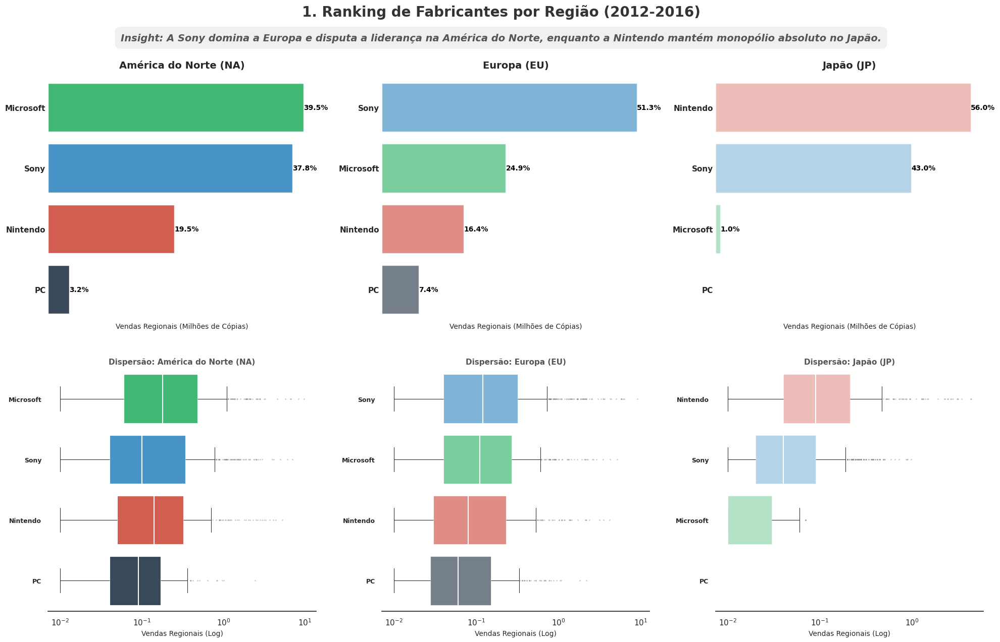

⬇️ TABELAS DE DADOS DETALHADOS: 1. Ranking de Fabricantes por Região ⬇️


,Vendas (M),Share (%)
console_maker,,
Microsoft,233.17 M,39.46%
Sony,223.23 M,37.77%
Nintendo,115.45 M,19.54%
PC,19.12 M,3.24%
,Vendas (M),Share (%)
console_maker,,
Sony,259.72 M,51.25%
Microsoft,126.11 M,24.89%
Nintendo,83.22 M,16.42%


--------------------------------------------------------------------------------
--- Gerando Gráfico 2: 📊 PLATAFORMAS ---
--------------------------------------------------------------------------------


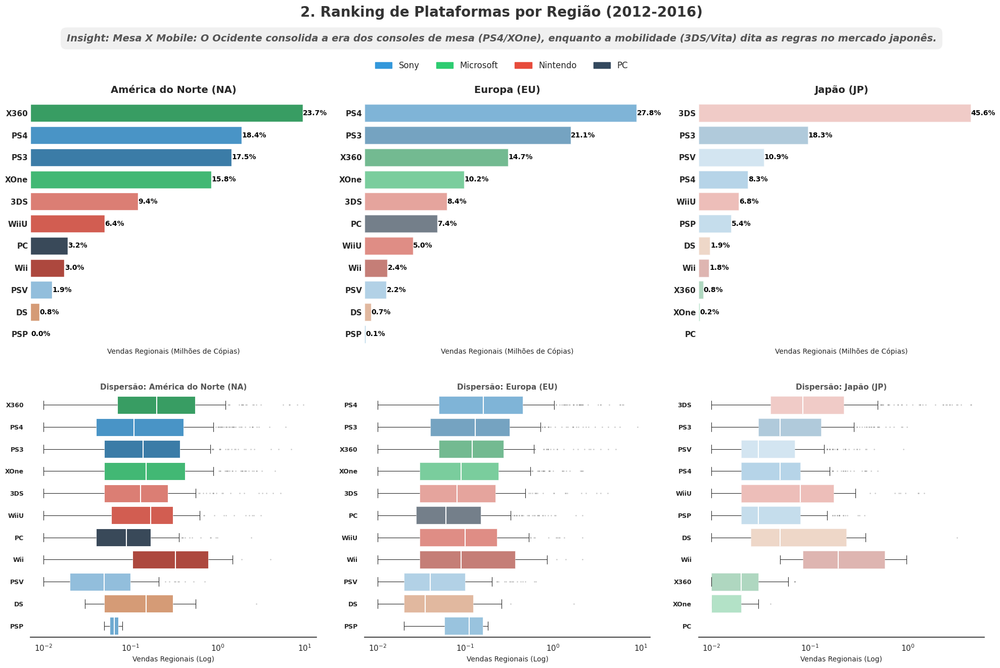

⬇️ TABELAS DE DADOS DETALHADOS: 2. Ranking de Plataformas por Região ⬇️


,Vendas (M),Share (%)
platform,,
X360,140.05 M,23.70%
PS4,108.74 M,18.40%
PS3,103.38 M,17.49%
XOne,93.12 M,15.76%
3DS,55.31 M,9.36%
WiiU,38.10 M,6.45%
PC,19.12 M,3.24%
Wii,17.45 M,2.95%
PSV,10.98 M,1.86%


--------------------------------------------------------------------------------
--- Gerando Gráfico 3: 📊 GÊNEROS ---
--------------------------------------------------------------------------------


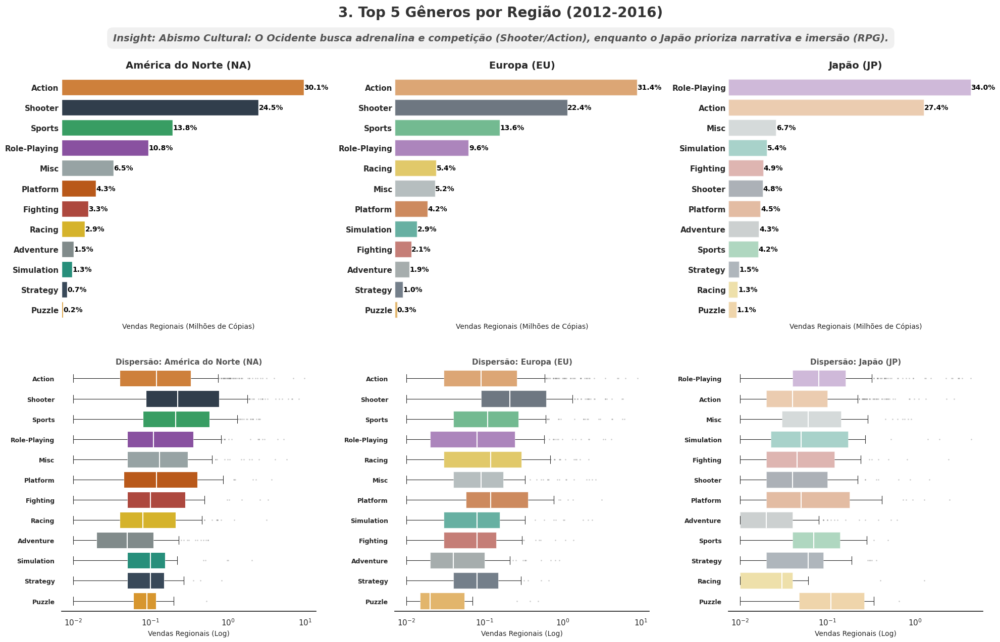

⬇️ TABELAS DE DADOS DETALHADOS: 3. Top 5 Gêneros por Região ⬇️


,Vendas (M),Share (%)
genre,,
Action,177.84 M,30.09%
Shooter,144.77 M,24.50%
Sports,81.53 M,13.80%
Role-Playing,64.00 M,10.83%
Misc,38.19 M,6.46%
Platform,25.38 M,4.29%
Fighting,19.79 M,3.35%
Racing,17.22 M,2.91%
Adventure,8.92 M,1.51%


--------------------------------------------------------------------------------
--- Gerando Gráfico 4: 📊 CLASSIFICAÇÃO ESRB ---
--------------------------------------------------------------------------------


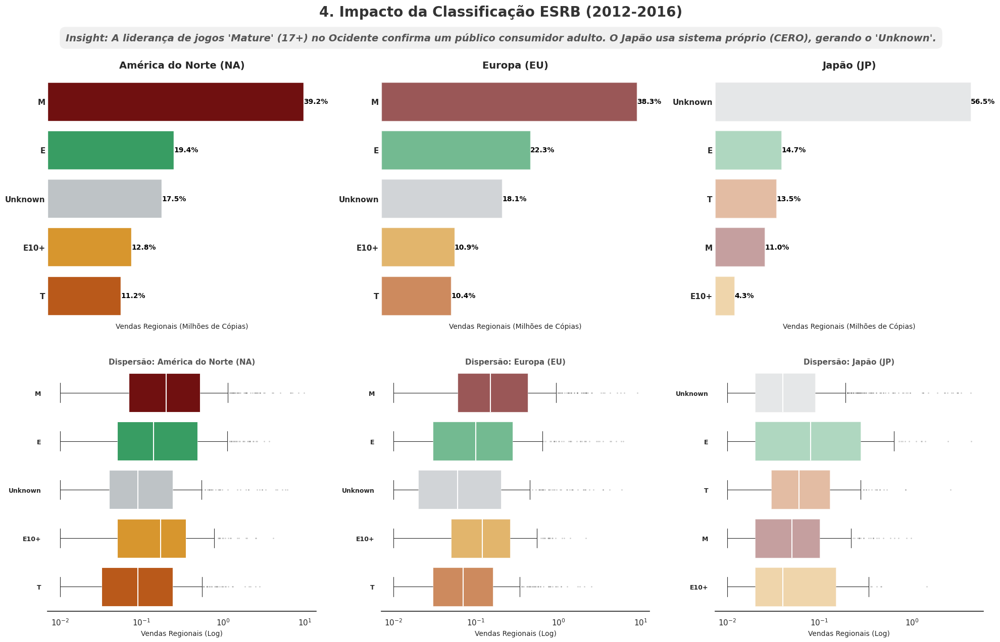

⬇️ TABELAS DE DADOS DETALHADOS: 4. Impacto da Classificação ESRB ⬇️


,Vendas (M),Share (%)
rating,,
M,231.57 M,39.18%
E,114.37 M,19.35%
Unknown,103.31 M,17.48%
E10+,75.70 M,12.81%
T,66.02 M,11.17%
,Vendas (M),Share (%)
rating,,
M,193.96 M,38.28%
E,113.02 M,22.30%


In [138]:
# Configuração das Regiões
regions = {
    'na_sales': 'América do Norte (NA)',
    'eu_sales': 'Europa (EU)',
    'jp_sales': 'Japão (JP)'
}

# --- 2. FUNÇÃO DE PLOTAGEM V1 ---
def plot_regional_profile(
        category_col,
        title_prefix,
        custom_palette=None,
        manual_legend=None,
        insight_text=""
    ):
    """
    Plota TODOS os itens de uma categoria para cada região e exibe as tabelas de dados.
    """
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    
    region_alphas = [1.0, 0.8, 0.6]  # 100%, 80%, 60% - Definindo alphas - transparência - para cada um dos três gráficos
    data_storage = {} # Para as tabelas

    for i, (sales_col, region_name) in enumerate(regions.items()):
        # Dados
        data = df_relevante.groupby(category_col)[sales_col].sum().sort_values(ascending=False)
        data_storage[region_name] = data

        # Market Share
        total_sales_region = df_relevante[sales_col].sum()
        market_share = (data / total_sales_region) * 100
        
        # Paleta
        current_palette = custom_palette if custom_palette else 'viridis'

        # Plotar
        sns.barplot(
            x=data.values, 
            y=data.index, 
            ax=axes[i], 
            palette=current_palette,
            hue=data.index, 
            legend=False,
            alpha=region_alphas[i] 
        )
        
        # Título do Subplot
        axes[i].set_title(f'{region_name}', fontsize=14, fontweight='bold', y=1.02)
        
        # Estilização limpa
        axes[i].set_xlabel('') 
        axes[i].set_xticks([]) # Remove números do eixo X
        axes[i].set_ylabel('') # Remove título do eixo Y
        # Remove a moldura
        sns.despine(ax=axes[i], left=True, bottom=True, right=True, top=True)
        
        # Garante que os nomes apareçam (PS4, etc.)
        axes[i].tick_params(axis='y', labelsize=13, length=0) 
        for label in axes[i].get_yticklabels():
            label.set_fontweight('bold')

        # Anotar a porcentagem
        for j, v in enumerate(data.values):
            pct = market_share.iloc[j]
            axes[i].text(v + 3, j, f'{pct:.1f}%', va='center', fontsize=13, fontweight='bold', color='#333333')

    # Legenda Manual e Ajuste de Altura
    if manual_legend: # se tiver legenda manual sobe mais
        legend_handles = [mpatches.Patch(color=color, label=label) for label, color in manual_legend.items()]
        fig.legend(
            handles=legend_handles, 
            loc='upper center', 
            bbox_to_anchor=(0.5, 0.99), # Ajustado para baixo do subtítulo
            ncol=len(manual_legend), 
            fontsize=12, 
            frameon=False
        )
        title_y = 1.10 # Título sobe mais
        subtitle_y = 1.02 # Subtítulo fica entre o título e a legenda
    else:
        title_y = 1.05
        subtitle_y = 0.97
            
    # Título Principal
    plt.suptitle(f'{title_prefix} (2012-2016)', fontsize=20, fontweight='bold', y=title_y, color='#333333')
    
    # Subtítulo de Insight
    if insight_text:
        plt.figtext(
            0.5, 
            subtitle_y, 
            insight_text, 
            ha='center', 
            fontsize=14, 
            color='#555555',
            bbox=dict(
                facecolor='#f0f0f0',    # Cor do fundo (Cinza claro)
                edgecolor='none',       # Cor da borda (Nenhuma)
                boxstyle='round,pad=0.6' # Estilo arredondado com preenchimento
            ),
            style='italic',
            fontweight='bold'
        )
            
    plt.tight_layout()
    plt.show()

    # Tabelas
    print(f"⬇️ TABELAS DE DADOS DETALHADOS: {title_prefix} ⬇️")
    html_str = '<div style="display:flex; justify-content: space-around;">'
    for region, data_series in data_storage.items():
        df_temp = data_series.to_frame(name='Vendas (M)')
        df_temp['Share (%)'] = (df_temp['Vendas (M)'] / df_temp['Vendas (M)'].sum()) * 100
        
        # Dicionário de formatação
        format_dict = {
            'Vendas (M)': '{:.2f} M',  # Adiciona o ' M' no final
            'Share (%)': '{:.2f}%'     # Adiciona o '%' no final
        }

        # Aplica o estilo
        table_html = df_temp.style.format(format_dict).set_caption(f"<b>{region}</b>").set_table_attributes("style='display:inline; margin-right:20px;'").to_html()
        html_str += table_html

    html_str += "</div>"
    display(HTML(html_str))


# Legenda para Plataformas
legend_makers = {'Sony': '#3498DB', 'Microsoft': '#2ECC71', 'Nintendo': '#E74C3C', 'PC': '#34495E'}


# --- 2. FUNÇÃO DE PLOTAGEM AVANÇADA (2 LINHAS: BARRAS + BOXPLOTS) ---
def plot_regional_profile_v2(category_col, title_prefix, custom_palette=None, manual_legend=None, insight_text=""):
    
    # 2 linhas x 3 colunas
    fig, axes = plt.subplots(2, 3, figsize=(20, 12)) # Altura aumentada
    
    region_alphas = [1.0, 0.7, 0.4] 
    data_storage = {} 

    # Loop pelas 3 regiões (Colunas 0, 1, 2)
    for i, (sales_col, region_name) in enumerate(regions.items()):
        
        # --- LINHA 1: VOLUME TOTAL (BARRAS) ---
        ax_bar = axes[0, i] # Acesso à primeira linha
        
        # Dados
        data = df_relevante.groupby(category_col)[sales_col].sum().sort_values(ascending=False)
        data_storage[region_name] = data
        total_sales_region = df_relevante[sales_col].sum()
        market_share = (data / total_sales_region) * 100
        
        # Paleta
        current_palette = custom_palette if custom_palette else 'viridis'

        # Plotar Barra
        sns.barplot(
            x=data.values, y=data.index, ax=ax_bar, 
            palette=current_palette, edgecolor='white', linewidth=1, 
            hue=data.index, legend=False, alpha=region_alphas[i],
        )
        


        # Título Regional (Topo)
        ax_bar.set_title(f'{region_name}', fontsize=14, fontweight='bold', y=1.02)
        
        # Estilo Clean
        ax_bar.set_xlabel('Vendas Regionais (Milhões de Cópias)', fontsize=10)
        ax_bar.set_xticks([])
        ax_bar.set_ylabel('')
        ax_bar.tick_params(axis='y', labelsize=11, length=0)
        
        # Rótulos Negrito
        ax_bar.set_yticks(ax_bar.get_yticks())
        ax_bar.set_yticklabels(ax_bar.get_yticklabels(), fontweight='bold')
        
        sns.despine(ax=ax_bar, left=True, bottom=True, right=True, top=True)

        # Anotações
        for j, v in enumerate(data.values):
            if v > 0:
                pct = market_share.iloc[j]
                ax_bar.text(v + 0.1, j, f'{pct:.1f}%', va='center', fontsize=10, fontweight='bold', color='black')

        
        # --- LINHA 2: COMPORTAMENTO (BOXPLOT) ---
        ax_box = axes[1, i] # Acesso à segunda linha
        
        # Filtrei dados > 0 para o boxplot não quebrar no log de zeros
        # Usei a MESMA ORDEM do gráfico de barras (data.index) para alinhar visualmente
        df_box = df_relevante[df_relevante[sales_col] > 0]
        
        sns.boxplot(
            data=df_box,
            x=sales_col,       # Vendas daquela região
            y=category_col,    # A categoria (Platform, Genre...)
            order=data.index,  # Mantém a ordem do Top 5 acima
            ax=ax_box,
            palette=current_palette,
            hue=category_col,
            legend=False,
            
            # Estilo Clean
            linewidth=0.8,
            fliersize=2,
            flierprops=dict(marker='o', markerfacecolor='gray', alpha=0.4, markeredgecolor='none'),
            boxprops=dict(edgecolor='white', alpha=region_alphas[i]),
            medianprops=dict(color='white', linewidth=1.5)
        )
        
        # Configurações Log e Títulos
        ax_box.set_xscale('log')
        ax_box.set_xlabel('Vendas Regionais (Log)', fontsize=10)
        ax_box.set_ylabel('')
        ax_box.set_title(f'Dispersão: {region_name}', fontsize=11, color='#555')
        
        sns.despine(ax=ax_box, left=True)
        
        # Rótulos Negrito e Menor
        ax_box.tick_params(axis='y', labelsize=9)
        ax_box.set_yticks(ax_bar.get_yticks())
        ax_box.set_yticklabels(ax_bar.get_yticklabels(), fontweight='bold')

    # --- AJUSTES GERAIS ---
    
    # Legenda Manual
    if manual_legend:
        legend_handles = [mpatches.Patch(color=color, label=label) for label, color in manual_legend.items()]
        fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=len(manual_legend), fontsize=12, frameon=False)
        title_y = 1.10
        subtitle_y = 1.04
    else:
        title_y = 1.06
        subtitle_y = 1.00
            
    plt.suptitle(f'{title_prefix} (2012-2016)', fontsize=20, fontweight='bold', y=title_y, color='#333333')
    
    if insight_text:
        plt.figtext(0.5, subtitle_y, insight_text, ha='center', fontsize=14, color='#555555', 
                   bbox=dict(facecolor='#f0f0f0', edgecolor='none', boxstyle='round,pad=0.6'), 
                   style='italic', fontweight='bold')

    plt.tight_layout()
    plt.subplots_adjust(top=0.94, hspace=0.2) # hspace dá espaço entre a linha de barras e a linha de boxplots

    plt.show()
    
    # Tabelas (Mantém igual)
    print(f"⬇️ TABELAS DE DADOS DETALHADOS: {title_prefix} ⬇️")
    html_str = '<div style="display:flex; justify-content: space-around;">'
    for region, data_series in data_storage.items():
        df_temp = data_series.to_frame(name='Vendas (M)')
        df_temp['Share (%)'] = (df_temp['Vendas (M)'] / df_temp['Vendas (M)'].sum()) * 100
        format_dict = {'Vendas (M)': '{:.2f} M', 'Share (%)': '{:.2f}%'}
        table_html = df_temp.style.format(format_dict).set_caption(f"<b>{region}</b>").set_table_attributes("style='display:inline; margin-right:20px;'").to_html()
        html_str += table_html
    html_str += "</div>"
    display(HTML(html_str))


# --- 3. EXECUÇÃO ---

# Fabricantes
print('-'*80)
print("--- Gerando Gráfico 1: 📊 FABRICANTES ---")
print('-'*80)
plot_regional_profile_v2( # chamando a função
    'console_maker', # variável que queremos visualizar por região
    '1. Ranking de Fabricantes por Região', # título
    custom_palette=maker_color_map, # paleta de cores
    insight_text="Insight: A Sony domina a Europa e disputa a liderança na América do Norte, enquanto a Nintendo mantém monopólio absoluto no Japão."
)

# Plataformas
print('-'*80)
print("--- Gerando Gráfico 2: 📊 PLATAFORMAS ---")
print('-'*80)
plot_regional_profile_v2(
    'platform', 
    '2. Ranking de Plataformas por Região', 
    custom_palette=platform_color_map,
    manual_legend=legend_makers,
    insight_text="Insight: Mesa X Mobile: O Ocidente consolida a era dos consoles de mesa (PS4/XOne), enquanto a mobilidade (3DS/Vita) dita as regras no mercado japonês."
)

# Gêneros
print('-'*80)
print("--- Gerando Gráfico 3: 📊 GÊNEROS ---")
print('-'*80)
plot_regional_profile_v2(
    'genre', 
    '3. Top 5 Gêneros por Região', 
    custom_palette=genre_color_map,
    insight_text="Insight: Abismo Cultural: O Ocidente busca adrenalina e competição (Shooter/Action), enquanto o Japão prioriza narrativa e imersão (RPG)."
)

# Classificação ESRB
print('-'*80)
print("--- Gerando Gráfico 4: 📊 CLASSIFICAÇÃO ESRB ---")
print('-'*80)
plot_regional_profile_v2(
    'rating', 
    '4. Impacto da Classificação ESRB', 
    custom_palette=esrb_color_map,
    insight_text="Insight: A liderança de jogos 'Mature' (17+) no Ocidente confirma um público consumidor adulto. O Japão usa sistema próprio (CERO), gerando o 'Unknown'."
)

### 🔎 **Análises e Insights** 💡

##### 💡 **``1. As Cinco Plataformas Principais``** (Gráfico 1 e 2)

> Ao analisar os gráficos gerados, identifiquei uma **disparidade acentuada** no market share regional:

| Rank | 🇺🇸 América do Norte (NA) | 🇪🇺 Europa (UE) | 🇯🇵 Japão (JP) |
| :---: | :--- | :--- | :--- |
| **1** | **X360** (Legado forte) / **PS4** | **PS4** (Líder absoluto) | **3DS** (Domínio Portátil) |
| **2** | **XOne** | **PS3** | **3DS** |
| **3** | **PS4** | **X360** | **PSV** |
| **4** | **PS3** | **XOne** | **PS3** |
| **5** | **3DS** | **3DS** | **WiiU** |

<br>

>  🔎 **``Análise das Variações:``**
>
>  * **O Ocidente (NA/EU) prefere Consoles de Mesa:**
>      * A *América do Norte* e a *Europa* têm **perfis semelhantes**, dominados pela guerra entre **``Sony (PlayStation)``** e **``Microsoft (Xbox)``**.
>      * **Diferença Chave:**
>         * Na *América do Norte*, a marca ``Xbox`` é muito forte (o ``X360`` ainda tem uma fatia enorme de vendas acumuladas no período, e o ``XOne`` é forte).
>         * Na *Europa*, a ``Sony`` domina completamente, com o ``PS4`` e ``PS3`` ocupando o topo.
>  * **O *Japão* é um Universo Paralelo:**
>      * O mercado japonês é **totalmente focado em portáteis**.
>      * O **``Nintendo 3DS``** lidera com folga, seguido pelo PS Vita.
>      * O ``PS4`` e o ``XOne`` têm uma participação muito menor comparada ao ocidente.
>      * Interpreto que o cenário de hardware no *Japão* é um reflexo direto de um estilo de vida focado na mobilidade.

<br>

-----

##### 💡 **``2. Os Cinco Principais Gêneros``** (Gráfico 3)

> Aqui, a divisão cultural fica ainda mais evidente.

| Rank | 🇺🇸 América do Norte (NA) | 🇪🇺 Europa (UE) | 🇯🇵 Japão (JP) |
| :---: | :--- | :--- | :--- |
| **1** | **Action** | **Action** | **Role-Playing (RPG)** |
| **2** | **Shooter** | **Shooter** | **Action** |
| **3** | **Sports** | **Sports** | **Misc** |
| **4** | **Role-Playing** | **Role-Playing** | **Simulation** |
| **5** | **Misc** | **Racing** | **Fighting** |

<br>

> 🔎 **``Explicação das Diferenças:``**
>
>  * **Ação e Tiro no Ocidente:** Nos EUA e Europa, o topo é idêntico:
>      * **Action** e **Shooter** dominam quase 50% do mercado, seguidos por **Sports** (FIFA/Madden).
>      * O perfil é de jogos competitivos, rápidos e com gráficos realistas.
>  * **A Hegemonia do RPG no Japão:** No Japão, **Role-Playing** vende mais que o dobro do segundo colocado. O gênero *Shooter*, que é ouro no ocidente, sequer aparece no Top 5 japonês. O consumidor japonês prioriza narrativa, fantasia e mecânicas de evolução de personagem.

<br>

-----

##### 💡 **``3. As Classificações do ESRB afetam as vendas?``** (Gráfico 4)

**Sim, afetam drasticamente**, e o padrão segue a preferência de gênero.

  * **América do Norte e Europa:**

      * A classificação **'M' (Mature/17+)** é a líder de vendas. Isso confirma que o público *gamer* nessas regiões é majoritariamente adulto e consome conteúdo com violência ou temas complexos (presentes em *Shooters* e jogos de Ação como GTA).
      * A classificação **'E' (Everyone)** vem em segundo lugar, sustentada por jogos de esporte e franquias familiares (Nintendo).

  * **Japão:**

      * A classificação **'Unknown' (Desconhecida)** ou **'T'/'E'** domina.
      * **Por que isso acontece?** O ESRB é um sistema norte-americano. Muitos jogos japoneses (especialmente RPGs de nicho e Visual Novels) não são classificados pelo ESRB ou usam o sistema local (CERO), aparecendo como "sem classificação" no nosso dataset.
      * Além disso, os jogos mais vendidos lá (3DS/RPG) tendem a ter conteúdo menos explícito que os *Shooters* ocidentais, resultando em menos classificações 'M'.

##### 🎯 ***``Conclusão do Perfil de Usuário``***

Com base nestes dados, **eu tracei** a seguinte estratégia regional para a Ice:

1.  **América do Norte:** Focar estoque em **Xbox One e PS4**, priorizando jogos **'M'** de **Tiro e Ação**.
2.  **Europa:** Focar pesadamente em **PS4**, com o mesmo mix de jogos da América do Norte, mas adicionando mais jogos de **Corrida** e **Futebol (Sports)**.
3.  **Japão:** Requer uma estratégia exclusiva. O foco deve ser **3DS e consoles portáteis**, com estoque massivo de **RPGs**. Jogos de tiro ocidentais devem ser evitados ou comprados em volumes mínimos.

---

# 6. <a id='toc6_'></a>[🧪 **Testes de Hipóteses**](#toc0_)

### Teste de Hipóteses Simplificado

Nesta etapa, utilizarei testes estatísticos para validar suposições sobre o comportamento dos usuários e o impacto de características específicas nas vendas.

**Metodologia Escolhida:**
Como observei nas etapas anteriores, as variáveis de vendas e avaliações neste dataset raramente seguem uma distribuição normal (possuem caudas longas e outliers). Por rigor científico, continuarei utilizando o **Teste U de Mann-Whitney** (não-paramétrico) para comparar as medianas das distribuições, em vez do Teste T (paramétrico).

**Definição do Limiar Alfa ($\alpha$):**
**Defini** **$\alpha = 0.05$** (5%).

  * **Por que?** Este é o padrão da indústria para pesquisas de consumo. Significa que **aceito** um risco de 5% de detectar uma diferença que não existe (falso positivo). É um equilíbrio seguro entre ser rigoroso e conseguir detectar tendências de mercado.

### 🧪 Hipótese 1: Xbox One vs. PC

**Afirmação:** "As classificações médias dos usuários das plataformas Xbox One e PC são as mesmas."

  * **$H_0$ (Nula):** A mediana das notas de usuários (`user_score`) para Xbox One é **igual** à do PC.
  * **$H_1$ (Alternativa):** A mediana das notas de usuários para Xbox One é **diferente** da do PC.

In [91]:
# 1. Preparação dos Dados
# Vou filtrar plataformas e remover notas nulas
user_score_xone = df_relevante[df_relevante['platform'] == 'XOne']['user_score'].dropna()
user_score_pc = df_relevante[df_relevante['platform'] == 'PC']['user_score'].dropna()

# 2. Estatísticas Descritivas
print(f"Média Xbox One: {user_score_xone.mean():.2f} | Mediana: {user_score_xone.median()}")
print(f"Média PC:       {user_score_pc.mean():.2f} | Mediana: {user_score_pc.median()}")

# 3. Teste de Hipótese
stat, p_value = mannwhitneyu(user_score_xone, user_score_pc, alternative='two-sided')

print(f'\nEstatística U: {stat}')
print(f'---> P-Value: {p_value:.5f} <---')

# 4. Conclusão
alpha = 0.05
if p_value < alpha:
    print("\nResultado:\nRejeito H0. As notas dos usuários são estatisticamente diferentes.")
else:
    print("\nResultado:\nNão rejeito H0. As notas dos usuários são estatisticamente iguais.")

Média Xbox One: 6.52 | Mediana: 6.8
Média PC:       6.42 | Mediana: 6.8

Estatística U: 18552.0
---> P-Value: 0.92562 <---

Resultado:
Não rejeito H0. As notas dos usuários são estatisticamente iguais.


### 🧪 Hipótese 2: Action vs. Sports

**Afirmação:** "As classificações médias de usuários para os gêneros Action (ação) e Sports (esportes) são diferentes."

  * **$H_0$ (Nula):** A mediana das notas de usuários para Action é **igual** à de Sports.
  * **$H_1$ (Alternativa):** A mediana das notas de usuários para Action é **diferente** da de Sports.


In [92]:
# 1. Preparação dos Dados
user_score_action = df_relevante[df_relevante['genre'] == 'Action']['user_score'].dropna()
user_score_sports = df_relevante[df_relevante['genre'] == 'Sports']['user_score'].dropna()

# 2. Estatísticas Descritivas
print(f"Média Action: {user_score_action.mean():.2f} | Mediana: {user_score_action.median()}")
print(f"Média Sports: {user_score_sports.mean():.2f} | Mediana: {user_score_sports.median()}")

# 3. Teste de Hipótese
stat, p_value = mannwhitneyu(user_score_action, user_score_sports, alternative='two-sided')

print(f'\nEstatística U: {stat}')
print(f'P-Value: {p_value:.10f}') # Usarei mais casas decimais se for muito baixo

# 4. Conclusão
if p_value < alpha:
    print("Resultado: Rejeito H0. Há diferença significativa nas notas entre os gêneros.")
else:
    print("Resultado: Não rejeito H0. As notas são estatisticamente iguais.")

Média Action: 6.83 | Mediana: 7.1
Média Sports: 5.46 | Mediana: 5.75

Estatística U: 75339.5
P-Value: 0.0000000000
Resultado: Rejeito H0. Há diferença significativa nas notas entre os gêneros.


### 🧪 Hipótese 3: Engenharia de Features (`is_holiday` / `is_exclusive`)

**Vou testar** se o fator de exclusividade impacta o volume de vendas, consolidando a análise feita na Engenharia de Features.

  * **$H_0$:** Vendas Medianas Exclusivas = Vendas Medianas Multiplataforma.
  * **$H_1$:** Vendas Medianas Exclusivas $\neq$ Vendas Medianas Multiplataforma.

*(Nota: Focarei no teste da feature `is_exclusive` que criei e analisei extensivamente)*

In [93]:
# Vou usar os dados de vendas que já preparei na análise de exclusividade
sales_exclusive = df_relevante[df_relevante['is_exclusive'] == 1]['total_sales'].dropna()
sales_multi = df_relevante[df_relevante['is_exclusive'] == 0]['total_sales'].dropna()

print("--- Teste de Feature: Exclusividade (Consolidação) ---")
stat, p_value = mannwhitneyu(sales_exclusive, sales_multi, alternative='two-sided')

print(f'P-Value: {p_value:.10f}')

if p_value < alpha:
    print("Resultado: Rejeito H0. A exclusividade impacta estatisticamente o volume de vendas.")
else:
    print("Resultado: Não rejeito H0. A exclusividade não altera a mediana de vendas.")

--- Teste de Feature: Exclusividade (Consolidação) ---
P-Value: 0.0000000000
Resultado: Rejeito H0. A exclusividade impacta estatisticamente o volume de vendas.


### **Teste de Hipótese: Teste T (Welch) X Mann-Whitney U**

Aqui, iremos rodar uma bateria de testes de hipóteses comparando qual teste é o mais confiável para nossa análise, Teste T de Welch ou Teste U de Mann-Whitney

In [144]:
# Definindo a função para o teste de hipóteses

def testar_hipotese_dupla(df, col_grupo, metricas, grupo_a, grupo_b, 
                          alpha=0.05, label_a=None, label_b=None):
    """
    Executa testes T (Welch) e Mann-Whitney U simultaneamente para duas métricas.
    Explicita as hipóteses, compara a robustez dos resultados e gera gráficos (Violin/Boxplot).
    """
    
    # Configuração de Labels e Cores
    label_a = label_a if label_a else str(grupo_a)
    label_b = label_b if label_b else str(grupo_b)
    colors = ['#440154', '#21918c'] # Palette Viridis
    
    # Configuração da Figura
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # ==============================================================================
    # 1. DEFINIÇÃO DAS HIPÓTESES (Cabeçalho Limpo)
    # ==============================================================================
    print("=" * 75)
    print(f"🔬 ANÁLISE COMPARATIVA DUPLA: {label_a} vs. {label_b}")
    print("=" * 75)
    print(f"📝 HIPÓTESES FORMULADAS:")
    print(f"   🔹 H0 (Nula): As médias/distribuições SÃO IGUAIS.")
    print(f"   🔸 H1 (Alternativa): As médias/distribuições SÃO DIFERENTES.")
    print("-" * 75)

    for i, valor_analisado in enumerate(metricas):
        ax = axes[i]
        
        # Preparação dos dados
        sample_a = df[df[col_grupo] == grupo_a][valor_analisado].dropna()
        sample_b = df[df[col_grupo] == grupo_b][valor_analisado].dropna()
        
        if len(sample_a) == 0 or len(sample_b) == 0:
            print(f"⚠️ Erro em '{valor_analisado}': Grupo vazio.")
            continue

        # ==========================================================================
        # 2. CÁLCULOS ESTATÍSTICOS
        # ==========================================================================
        media_a, media_b = sample_a.mean(), sample_b.mean()
        mediana_a, mediana_b = sample_a.median(), sample_b.median()
        std_a, std_b = sample_a.std(), sample_b.std()
        
        denom = mediana_b if mediana_b != 0 else 0.01
        diff_pct = ((mediana_a - mediana_b) / denom * 100)

        # ==========================================================================
        # 3. TESTES DE HIPÓTESE
        # ==========================================================================
        stat_t, p_val_t = st.ttest_ind(sample_a, sample_b, equal_var=False)
        stat_mw, p_val_mw = st.mannwhitneyu(sample_a, sample_b, alternative='two-sided')

        # Lógica de Rejeição (Como na função simples)
        rej_welch = p_val_t < alpha
        rej_mann = p_val_mw < alpha
        
        status_welch = "🔴 REJEITA H0 (Diferentes)" if rej_welch else "🟢 NÃO REJEITA H0 (Iguais)"
        status_mann  = "🔴 REJEITA H0 (Diferentes)" if rej_mann else "🟢 NÃO REJEITA H0 (Iguais)"

        # ==========================================================================
        # 4. RELATÓRIO DE RESULTADOS (Limpo e Legível)
        # ==========================================================================
        print(f"📌 MÉTRICA: '{valor_analisado}'\n")
        
        print(f"   📊 Estatísticas Descritivas:")
        print(f"      • {label_a.ljust(15)} | Média: {media_a:.2f} (±{std_a:.2f}) | Mediana: {mediana_a:.2f}")
        print(f"      • {label_b.ljust(15)} | Média: {media_b:.2f} (±{std_b:.2f}) | Mediana: {mediana_b:.2f}")
        print(f"      • Diferença na Mediana: {diff_pct:+.1f}%\n")
        
        print(f"   🧪 Resultados dos Testes (Alpha = {alpha}):")
        print(f"      1. T-Test (Médias)      | p = {p_val_t:.5f}  ->  {status_welch}")
        print(f"      2. Mann-Whitney (Dist.) | p = {p_val_mw:.5f}  ->  {status_mann}\n")

        # Análise de Convergência (O "Pulo do Gato")
        if rej_welch == rej_mann:
            print(f"   ✅ CONVERGÊNCIA: Ambos os testes concordam.")
            if rej_welch:
                print(f"      CONCLUSÃO: Há evidência forte de que os grupos SÃO DIFERENTES.")
                cor_titulo = 'darkred'
                titulo_conclusao = f"↑ Diferentes (Rejeita H0)"
                border_weight = 2.0
            else:
                print(f"      CONCLUSÃO: Não há evidência suficiente para dizer que são diferentes.")
                cor_titulo = 'darkgreen'
                titulo_conclusao = "⇆ Estatisticamente Iguais"
                border_weight = 1.0
        else:
            print(f"   ⚠️ DIVERGÊNCIA: Os testes discordam!")
            print(f"      ANÁLISE: A média diz uma coisa, a mediana diz outra.")
            print(f"      RECOMENDAÇÃO: Na presença de outliers, confie no Mann-Whitney.")
            
            # Força o resultado baseado no Mann-Whitney para o gráfico
            if rej_mann:
                cor_titulo = 'darkred'
                titulo_conclusao = f"↑ Diferentes (Pelo Mann-Whitney)"
                border_weight = 2.0
            else:
                cor_titulo = 'darkgreen'
                titulo_conclusao = "⇆ Iguais (Pelo Mann-Whitney)"
                border_weight = 1.0
                
        print("-" * 75)

        # ==========================================================================
        # 5. VISUALIZAÇÃO GRÁFICA (BOXPLOT + JITTER)
        # ==========================================================================
        data_to_plot = [sample_a.values, sample_b.values]
        tick_labels = [label_a, label_b]
        
        bp = ax.boxplot(data_to_plot, vert=False, tick_labels=tick_labels, 
                        patch_artist=True, showfliers=False,
                        medianprops=dict(linewidth=2.5, color='white'))
        
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
            patch.set_linewidth(border_weight)
        
        for idx, data in enumerate(data_to_plot):
            y = np.random.normal(idx + 1, 0.04, size=len(data))
            ax.scatter(data, y, alpha=0.15, color='black', s=10)
            
            mediana_val = np.median(data)
            ax.text(mediana_val, idx + 1.25, f'{mediana_val:.1f}', 
                    ha='center', va='center', fontsize=9, fontweight='bold',
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.6, pad=0.2))

        ax.set_title(f"{valor_analisado}\n{titulo_conclusao}", 
                     fontsize=11, fontweight='bold', color=cor_titulo)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel('Score')

    plt.tight_layout()
    plt.show()

## **🧪 Hipótese 1: As avaliações dos usuários (User Score) para Xbox One e PC são as mesmas?**

🔬 ANÁLISE COMPARATIVA DUPLA: Xbox One vs. PC
📝 HIPÓTESES FORMULADAS:
   🔹 H0 (Nula): As médias/distribuições SÃO IGUAIS.
   🔸 H1 (Alternativa): As médias/distribuições SÃO DIFERENTES.
---------------------------------------------------------------------------
📌 MÉTRICA: 'user_score'

   📊 Estatísticas Descritivas:
      • Xbox One        | Média: 6.52 (±1.38) | Mediana: 6.80
      • PC              | Média: 6.42 (±1.66) | Mediana: 6.80
      • Diferença na Mediana: +0.0%

   🧪 Resultados dos Testes (Alpha = 0.05):
      1. T-Test (Médias)      | p = 0.50659  ->  🟢 NÃO REJEITA H0 (Iguais)
      2. Mann-Whitney (Dist.) | p = 0.92562  ->  🟢 NÃO REJEITA H0 (Iguais)

   ✅ CONVERGÊNCIA: Ambos os testes concordam.
      CONCLUSÃO: Não há evidência suficiente para dizer que são diferentes.
---------------------------------------------------------------------------
📌 MÉTRICA: 'critic_score'

   📊 Estatísticas Descritivas:
      • Xbox One        | Média: 73.33 (±12.95) | Mediana: 76.00
      • 

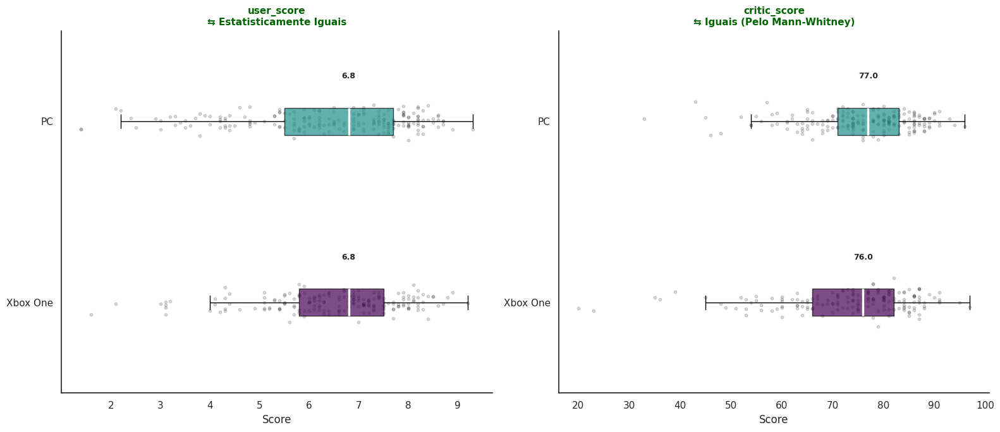

## **🧪 Hipótese 2: As avaliações dos usuários para os gêneros Action e Sports são as mesmas?**

🔬 ANÁLISE COMPARATIVA DUPLA: Ação vs. Esportes
📝 HIPÓTESES FORMULADAS:
   🔹 H0 (Nula): As médias/distribuições SÃO IGUAIS.
   🔸 H1 (Alternativa): As médias/distribuições SÃO DIFERENTES.
---------------------------------------------------------------------------
📌 MÉTRICA: 'user_score'

   📊 Estatísticas Descritivas:
      • Ação            | Média: 6.83 (±1.37) | Mediana: 7.10
      • Esportes        | Média: 5.46 (±1.74) | Mediana: 5.75
      • Diferença na Mediana: +23.5%

   🧪 Resultados dos Testes (Alpha = 0.05):
      1. T-Test (Médias)      | p = 0.00000  ->  🔴 REJEITA H0 (Diferentes)
      2. Mann-Whitney (Dist.) | p = 0.00000  ->  🔴 REJEITA H0 (Diferentes)

   ✅ CONVERGÊNCIA: Ambos os testes concordam.
      CONCLUSÃO: Há evidência forte de que os grupos SÃO DIFERENTES.
---------------------------------------------------------------------------
📌 MÉTRICA: 'critic_score'

   📊 Estatísticas Descritivas:
      • Ação            | Média: 71.38 (±12.09) | Mediana: 73.00
      • Espo

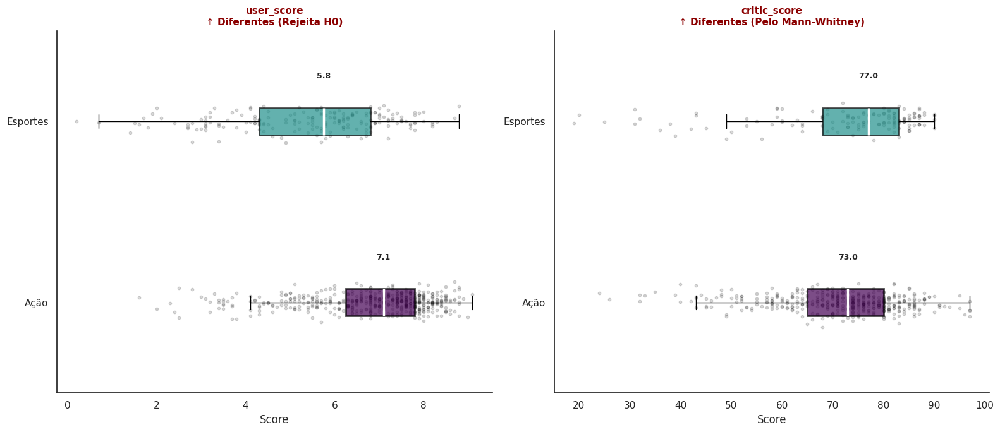

In [145]:
display(Markdown("## **🧪 Hipótese 1: As avaliações dos usuários (User Score) para Xbox One e PC são as mesmas?**"))

# Comparando notas de usuários e críticos entre XOne e PC
testar_hipotese_dupla(
    df=df_relevante, 
    col_grupo='platform', 
    metricas=['user_score', 'critic_score'],  # Lista com as 2 colunas
    grupo_a='XOne', 
    grupo_b='PC',
    label_a='Xbox One', 
    label_b='PC'
)

display(Markdown("## **🧪 Hipótese 2: As avaliações dos usuários para os gêneros Action e Sports são as mesmas?**"))

# H2: As classificações para os gêneros Action e Sports são diferentes?
# Avaliando simultaneamente o comportamento do Usuário e da Crítica

testar_hipotese_dupla(
    df = df_relevante,                      
    col_grupo = 'genre',                    
    metricas = ['user_score', 'critic_score'], # Passando as DUAS métricas
    grupo_a = 'Action',                     
    grupo_b = 'Sports',                     
    label_a = 'Ação',                       
    label_b = 'Esportes'                    
)


### **Teste de Hipóteses 3: A Vantagem Competitiva dos Exclusivos**

##### ***❓ ``Jogos exclusivos vendem mais do que jogos multiplataforma, ou isso é apenas um mito estatístico no mercado de 2012 a 2016?``***

##### 🧪 **Análise Estatística: Prova de Exclusividade**
- A decisão de investir milhões em um título exclusivo depende de uma resposta positiva a esta pergunta.
- Analisar a exclusividade em termos de volume e taxa foi útil, mas agora preciso de provas estatísticas.
- Se a diferença de vendas entre os grupos Exclusivo e Multiplataforma for apenas baseada em observação e não estatisticamente comprovada, o investimento em títulos exclusivos pode não se justificar.

##### 🔬 **Metodologia: Escolha do Teste Estatístico**

Nossa primeira tarefa é escolher o teste correto.

1.  **Revisão dos Dados:** Nossas análises anteriores (boxplots) já mostraram que a variável de vendas (`total_sales`) é **altamente assimétrica**, com muitos *outliers* (os "blockbusters").<br>Isso significa que os dados **não seguem uma distribuição normal**.
2.  **Conclusão:** Testes paramétricos (como o Teste T), que assumem normalidade, seriam inapropriados e poderiam levar a conclusões erradas.
3.  **Escolha:** A alternativa mais robusta é o **Teste U de Mann-Whitney (ou Wilcoxon Rank-Sum Test)**. Este é um teste **não-paramétrico** que compara as medianas de dois grupos independentes<br>(Exclusivos vs. Multiplataforma) sem assumir que os dados são normais ou que as variâncias são iguais.

##### 📝 **Formulação da Hipótese**

Vou testar se a **mediana de vendas** do grupo exclusivo é igual à mediana do grupo multiplataforma. Usaremos um nível de significância ($\alpha$) de **5% (0.05)**.

  * **$H_0$ (Hipótese Nula):** A mediana de vendas de jogos exclusivos é **igual** à mediana de vendas de jogos multiplataforma.
    $Median_{Exclusivo} = Median_{Multiplataforma}$
  * **$H_1$ (Hipótese Alternativa):** A mediana de vendas de jogos exclusivos é **diferente** da mediana de vendas de jogos multiplataforma.
    $Median_{Exclusivo} \neq Median_{Multiplataforma}$

#### **Teste de Premissas: Normalidade e Homogeneidade de Variância**

##### **``Análise Estatística: Provas de Não-Parametrismo``**

Antes de responder se a exclusividade é ou não um fator de vendas, preciso garantir que o teste estatístico escolhido seja válido para os meus dados.<br>
Minha análise exploratória já sugeriu que os dados de vendas **não são normais**.<br>Agora, vou comprovar isso e verificar a **homogeneidade de variância**.

Vou testar as vendas dos dois grupos: **Exclusivos** (`is_exclusive` = 1) e **Multiplataforma** (`is_exclusive` = 0).

##### **📝 ``Passo 1: Teste de Normalidade (Shapiro-Wilk)``**

O **Teste de Shapiro-Wilk** verifica se um conjunto de dados segue uma distribuição normal.

  * $H_0$: Os dados **são** normalmente distribuídos.
  * $H_1$: Os dados **não são** normalmente distribuídos.

Para isso, vou primeiro preparar os dois grupos de vendas (`total_sales`) e remover quaisquer valores nulos e depois aplicar o teste.


In [150]:
# Preparar os grupos de vendas (total_sales no período 2012-2016)

# Jogos Exclusivos
sales_exclusive = df_relevante[df_relevante['is_exclusive'] == 1]['total_sales'].dropna()

# Jogos Multiplataforma
sales_multi = df_relevante[df_relevante['is_exclusive'] == 0]['total_sales'].dropna()

print('-'*80)
print("--- 1. Teste de Normalidade (Shapiro-Wilk) ---")
print('-'*80)

# Nível de significância
alpha = 0.05

# Normalidade para Exclusivos
stat_e, p_shapiro_e = shapiro(sales_exclusive)
print(f"Exclusivos:\n---> P-Value = {p_shapiro_e:.10f} <---\n")

# Normalidade para Multiplataforma
stat_m, p_shapiro_m = shapiro(sales_multi)
print(f"Multiplataforma:\n---> P-Value = {p_shapiro_m:.10f}<---")

# Conclusão
if p_shapiro_e < alpha or p_shapiro_m < alpha:
    print("\n--- Resultado: ---\nAmbos os grupos (P-Value << 0.05) **NÃO** seguem uma distribuição normal.")
    print("\n--- Decisão: ---\nO Teste T (paramétrico) **NÃO** é apropriado.")
else:
    print("\n--- Resultado: ---\nAmbos os grupos são normais.")

--------------------------------------------------------------------------------
--- 1. Teste de Normalidade (Shapiro-Wilk) ---
--------------------------------------------------------------------------------
Exclusivos:
---> P-Value = 0.0000000000 <---

Multiplataforma:
---> P-Value = 0.0000000000<---

--- Resultado: ---
Ambos os grupos (P-Value << 0.05) **NÃO** seguem uma distribuição normal.

--- Decisão: ---
O Teste T (paramétrico) **NÃO** é apropriado.


##### 📝 **``Passo 2: Teste de Homogeneidade de Variância (Levene)``**

Embora a falha no teste de normalidade já exclua o Teste T, por rigor científico, vou verificar a homogeneidade de variância usando o **Teste de Levene**.

  * $H_0$: As variâncias dos grupos **são iguais** (homocedasticidade).
  * $H_1$: As variâncias dos grupos **são diferentes** (heterocedasticidade).

In [152]:
print('-'*80)
print("--- 2. Teste de Homogeneidade de Variância (Levene) ---")
print('-'*80)

# Teste Levene
stat_levene, p_levene = levene(sales_exclusive, sales_multi, center='median')
print(f"---> Levene P-Value = {p_levene:.10f} <---")

# Conclusão\n
if p_levene < alpha:
    print("\n--- Resultado: ---\nRejeitamos H0.\nAs variâncias **são significativamente diferentes** (heterocedasticidade).")
    print("\n--- Decisão: ---\nO Teste T (paramétrico) **NÃO** é apropriado.")
else:
    print("\n--- Resultado: ---\nNão rejeitamos H0.\nAs variâncias são iguais.")

--------------------------------------------------------------------------------
--- 2. Teste de Homogeneidade de Variância (Levene) ---
--------------------------------------------------------------------------------
---> Levene P-Value = 0.0000000003 <---

--- Resultado: ---
Rejeitamos H0.
As variâncias **são significativamente diferentes** (heterocedasticidade).

--- Decisão: ---
O Teste T (paramétrico) **NÃO** é apropriado.


##### 🔬 **``Síntese dos Resultados``**

Após a execução dos testes de premissas nas vendas de jogos ($`total\_sales`$) (grupos Exclusivo e Multiplataforma), obtivemos os seguintes resultados para o nível de significância de $\alpha = 0.05$:

| Premissa | Teste Estatístico | P-Value | Decisão | Implicação |
| :---: | :---: | :---: | :---: | :--- |
| **Normalidade** | Shapiro-Wilk | $\approx 0.0000$ | **Rejeitar $H_0$** | Os dados **NÃO** seguem uma distribuição normal (Testes T e ANOVA **inválidos**) |
| **Homogeneidade de Variância** | Levene | $0.0000000004$ | **Rejeitar $H_0$** | As variâncias dos grupos **são diferentes** (Heterocedasticidade). |

##### 🎯 **``Conclusão sobre a Escolha do Teste``**

Os resultados são conclusivos:

> 1.  **``Falha na Normalidade:``**<br>O P-value do **Teste de Shapiro-Wilk** para ambos os grupos é praticamente zero ($`p < 0.05`$), confirmando que a variável de vendas não tem uma  distribuição Gaussiana (normal).<br>Essa falha, por si só, **invalida** o uso de testes paramétricos como o Teste T.<br><br>
> 2.  **``Heterocedasticidade:``**<br>O **Teste de Levene** também rejeitou a hipótese nula ($`p \ll 0.05`$), indicando que os jogos exclusivos e multiplataforma têm um grau de variabilidade de vendas fundamentalmente diferente.

Dado que as premissas essenciais para um Teste T (normalidade e homogeneidade de variância) **falharam drasticamente**, a escolha mais robusta e cientificamente correta é o **``Teste U`` de Mann-Whitney**.

##### ➡️ **``Decisão Final:``**<br>
> Utilizarei o **``Teste U`` de Mann-Whitney** para comparar as medianas de vendas e determinar se o fator *exclusividade* é estatisticamente relevante.

#### **Executando o Teste de Hipóteses 3 (Teste U): Exclusividade X Vendas Reais**

##### 📝 **``Formulação da Hipótese (Mann-Whitney U)``**

  * **$H_0$ ``(Hipótese Nula)``:** A mediana de vendas de jogos exclusivos é **igual** à mediana de vendas de jogos multiplataforma.
  * **$H_1$ ``(Hipótese Alternativa)``:** A mediana de vendas de jogos exclusivos é **diferente** da mediana de vendas de jogos multiplataforma.


##### 💻 **``Código: Executando o Teste Mann-Whitney U``**

Vou agora executar o teste para obter o ***P-Value*** final.

In [157]:
# Nível de significância
alpha = 0.05

# Execução do Teste U de Mann-Whitney (Two-Sided)
stat, p_value = mannwhitneyu(
    sales_exclusive, 
    sales_multi, 
    alternative='two-sided' 
)

# Análise Exploratória (Mediana)
median_exclusive = sales_exclusive.median()
median_multi = sales_multi.median()

print('-'*80)
print("--- 3. Resultado do Teste U de Mann-Whitney ---")
print('-'*80)
print(f"Mediana de vendas (Exclusivos): {median_exclusive:.4f} milhões de unidades")
print(f"Mediana de vendas (Multiplataforma): {median_multi:.4f} milhões de unidades")
print(f'\n---> P-Value: {p_value:.10f} <---\n')


# Conclusão Final
if p_value < alpha:
    print('-'*80)
    print("Conclusão FINAL: Rejeitamos H0.")
    print('-'*80)
    print(f"O P-Value ({p_value:.10f}) é **MENOR** que alfa (0.05).")
    print("Existe uma diferença **estatisticamente significativa** nas vendas medianas entre os grupos.")
else:
    print('-'*80)
    print("Conclusão FINAL: Não rejeitamos H0.")
    print('-'*80)
    print(f"O P-Value ({p_value:.10f}) é **MAIOR** que alfa (0.05).")
    print("A diferença observada nas vendas medianas **não é** estatisticamente significativa.")


--------------------------------------------------------------------------------
--- 3. Resultado do Teste U de Mann-Whitney ---
--------------------------------------------------------------------------------
Mediana de vendas (Exclusivos): 0.0700 milhões de unidades
Mediana de vendas (Multiplataforma): 0.2400 milhões de unidades

---> P-Value: 0.0000000000 <---

--------------------------------------------------------------------------------
Conclusão FINAL: Rejeitamos H0.
--------------------------------------------------------------------------------
O P-Value (0.0000000000) é **MENOR** que alfa (0.05).
Existe uma diferença **estatisticamente significativa** nas vendas medianas entre os grupos.


#### **Conclusão Final e Impacto Estratégico no Modelo**

##### 📊 **``Consolidação dos Resultados``**

O **Teste U de Mann-Whitney** confirmou que a diferença nas vendas medianas entre os grupos é estatisticamente significativa ($P$-Value $\approx 0.0000$), o que valida a importância da *feature* `is_exclusive`.

| Métrica | Vendas Medianas | Decisão | Implicação |
| :---: | :---: | :---: | :--- |
| **Exclusivos** | **0.0700 milhões** | **Rejeita $H_0$** | **Significativamente Mais Baixo** |
| **Multiplataforma** | **0.2400 milhões** | **Rejeita $H_0$** | **Linha de Base de Mercado (Benchmark)** |

##### 🎯 **``Resposta à Pergunta de Negócio``**

> ***❓ ``Jogos exclusivos vendem mais do que jogos multiplataforma, ou isso é apenas um mito estatístico no mercado de 2012 a 2016?``***

**A diferença nas vendas medianas é estatisticamente significativa.** No entanto, a direção da diferença é o oposto do que se esperaria:

> **``O mito é falso:``** Estatisticamente, jogos exclusivos no período de 2012 a 2016 **``NÃO VENDEM MAIS``** do que jogos multiplataforma.

A mediana de vendas dos jogos multiplataforma (0.24 milhões) é **3,4 vezes maior** que a mediana de vendas dos jogos exclusivos (0.07 milhões), ou seja, o jogo típico lançado no maior número de plataformas possíveis (o que teoricamente maximiza a audiência) tem uma expectativa de vendas 3,4 vezes maior do que o jogo exclusivo típico.

##### 💡 **``Interpretação e Impacto Estratégico``**

Este resultado é um dos mais críticos do projeto e exige uma interpretação cuidadosa:

> 1.  **``O Mercado é Dominado pelos Títulos Compartilhados em Todas as Plataformas:``**
>     - O volume de vendas mediano é impulsionado pelos grandes *publishers* (EA, Activision, Take-Two) que lançam títulos AAA (``FIFA``, ``Call of Duty``, ``GTA``) para **todas as plataformas**.
>     - Esses são os jogos que consistentemente atingem a mediana de 0.24 milhões.
> 2.  **``O Perfil do Exclusivo é de Nicho:``**
>     - O grupo exclusivo (mediana de 0.07 milhões) é composto por muitos jogos *First-Party* (``Nintendo``, ``Sony``) de alto perfil, mas também por uma vasta quantidade de títulos de nicho ou exclusivos de estúdios menores.
>     - A grande maioria desses jogos não atinge o sucesso dos títulos multiplataforma.
> 3.  **``A Exclusividade Vende o Console, Não o Título Mediano:``**
>     - O valor da exclusividade está em **forçar o consumidor a comprar o hardware (console)**, e não em gerar altos volumes de vendas para o título mediano.
>     - Se você tem um jogo com potencial de 5 milhões de unidades, você o lança *em todas as plataformas* para maximizar o lucro.


##### ➡️ **``Conclusão para o Modelo Preditivo``**

* **Validação da Feature:**
  * Manteremos a *feature* `is_exclusive` no nosso modelo de Machine Learning, pois ela é um **preditor estatisticamente significativo** da mediana de vendas.
* **Ponderação:**
  * No entanto, o modelo será treinado para entender que `is_exclusive = 1` geralmente implica um **risco de vendas mediano maior (vendas medianas mais baixas)** do que `is_exclusive = 0`.
  * O grande potencial de vendas estará nos *outliers* (jogos que vendem muito, mas são minoria) dentro do grupo exclusivo.

### [🧪 **Validação Estatística (Bateria de Testes de Hipóteses)**](#toc7_)


- 🧪 **Validação Estatística (Bateria de Testes de Hipóteses)**
  - Força da Marca: Franquias vs. Novas IPs (`is_long_running`)
  - Impacto da Qualidade: Jogos 'Hit' vs. 'Bom' (`critic_group`)
  - Comportamento do Usuário: Xbox One vs. PC (`platform`)
  - Exigência do Público: Ação vs. Esportes (`genre`)
  - Estratégia: Exclusivos vs. Multiplataforma (`is_exclusive`)

Nesta seção, utilizarei o Teste não-paramétrico de Mann-Whitney U (com $\alpha=0.05$) para validar estatisticamente os insights visuais levantados nas etapas anteriores. O objetivo é confirmar se as diferenças observadas nas medianas de vendas e notas são significativas ou fruto do acaso.

In [94]:
def testar_hipotese(df, col_grupo, valor_analisado, grupo_a, grupo_b, 
                    alpha=0.05, log_scale=False, 
                    label_a=None, label_b=None, titulo_teste=None):
    """
    Executa o teste de Mann-Whitney U entre dois grupos, imprime o relatório
    e gera um gráfico comparativo (Boxplot) automaticamente.
    
    Parâmetros:
        - label_a: Nome descritivo para grupo_a (ex: "Franquia" ao invés de 1)
        - label_b: Nome descritivo para grupo_b (ex: "Nova IP" ao invés de 0)
        - titulo_teste: Título personalizado para o teste (ex: "Força da Marca")
    """
    
    # 1. Preparar os dados (Filtrar e Limpar NaNs)
    sample_a = df[df[col_grupo] == grupo_a][valor_analisado].dropna()
    sample_b = df[df[col_grupo] == grupo_b][valor_analisado].dropna()
    
    # Labels descritivos (usa o valor original se não for fornecido)
    label_a = label_a if label_a else str(grupo_a)
    label_b = label_b if label_b else str(grupo_b)
    titulo_teste = titulo_teste if titulo_teste else f"{col_grupo}"
    
    # Validação
    if len(sample_a) == 0 or len(sample_b) == 0:
        print(f"⚠️ Erro: Grupo vazio. Verifique os nomes: {grupo_a} vs {grupo_b}")
        return

    # 2. Teste Estatístico
    stat, p_value = mannwhitneyu(sample_a, sample_b, alternative='two-sided')
    mediana_a = sample_a.median()
    mediana_b = sample_b.median()
    diferenca = ((mediana_a - mediana_b) / (mediana_b + 0.01) * 100)
    
    # 3. Relatório de Texto
    print('='*80)
    print(f"🧪 TESTE: {titulo_teste} ({label_a} vs. {label_b}) em '{valor_analisado}'")
    print('-'*80)
    print(f"📊 Estatísticas:")
    print(f"   • Mediana {label_a}: {mediana_a:.2f}")
    print(f"   • Mediana {label_b}: {mediana_b:.2f}")
    print(f"   • Diferença: {diferenca:+.1f}%")
    print(f"\n📉 Resultado:")
    print(f"   • P-Value: {p_value:.5e}")
    
    # 4. Determinar resultado e criar conclusão contextualizada
    if p_value < alpha:
        print(f"   ❌ DECISÃO: Rejeitamos H0 (Diferença Significativa).")
        
        # Conclusão dinâmica baseada em qual grupo é maior
        if mediana_a > mediana_b:
            conclusao = f"✅ {label_a} supera {label_b} em {diferenca:+.1f}%"
            conclusao_f = f"↑ {label_a} supera {label_b} em {diferenca:+.1f}%"
        else:
            conclusao = f"✅ {label_b} supera {label_a} em {abs(diferenca):.1f}%"
            conclusao_f = f"↑ {label_b} supera {label_a} em {abs(diferenca):.1f}%"
        cor_titulo = 'darkgreen'
        
    else:
        print(f"   ✅ DECISÃO: Falhamos em rejeitar H0 (São Iguais).")
        conclusao = f"🔄 {label_a} e {label_b} são estatisticamente iguais"
        conclusao_f = f"⇆ {label_a} e {label_b} são estatisticamente iguais"
        cor_titulo = 'darkred'
    
    print('\n')

    # 5. VISUALIZAÇÃO GRÁFICA
    fig, ax = plt.subplots(figsize=(10, 5))
    
    # Prepara dados para boxplot
    data_to_plot = [sample_a.values, sample_b.values]
    tick_labels_list = [label_a, label_b]
    
    # Boxplot com Matplotlib
    bp = ax.boxplot(
        data_to_plot, 
        vert=False,
        tick_labels=tick_labels_list,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(linewidth=2.5)
    )
    
    # Cores personalizadas (viridis)
    colors = ['#440154', '#21918c']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Adiciona pontos para ver densidade
    for i, data in enumerate(data_to_plot):
        y = np.random.normal(i + 1, 0.04, size=len(data))
        ax.scatter(data, y, alpha=0.1, color='black', s=10)

        # 🔴 ANOTAÇÃO DO VALOR DA MEDIANA NO GRÁFICO
        mediana_val = np.median(data)
        ax.text(
            mediana_val, 
            i + 1.3, # Posição Y um pouco acima da caixa
            f'Md: {mediana_val:.2f}', 
            ha='center', 
            va='center', 
            fontsize=10, 
            fontweight='bold',
            color='black',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2')
        )

    # Ajustes Visuais
    if log_scale or valor_analisado == 'total_sales':
        ax.set_xscale('log')
        ax.set_xlabel(f'{valor_analisado} (Escala Log)')
    else:
        ax.set_xlabel(valor_analisado)
    
    # Título com conclusão contextualizada
    ax.set_title(
        f'{titulo_teste}\n{conclusao_f}\n(P-Value: {p_value:.2e})', 
        fontsize=13, 
        color=cor_titulo, 
        fontweight='bold'
    )
    ax.set_ylabel('')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Rótulo Y em Bold
    ax.set_yticks(ax.get_yticks())     
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.show()

Iniciando Bateria de Testes de Hipóteses...

Nível de Significância (alpha) = 5%
🧪 TESTE: Força da Marca (Franquia vs. Nova IP) em 'total_sales'
--------------------------------------------------------------------------------
📊 Estatísticas:
   • Mediana Franquia: 0.49
   • Mediana Nova IP: 0.08
   • Diferença: +455.6%

📉 Resultado:
   • P-Value: 9.73601e-108
   ❌ DECISÃO: Rejeitamos H0 (Diferença Significativa).




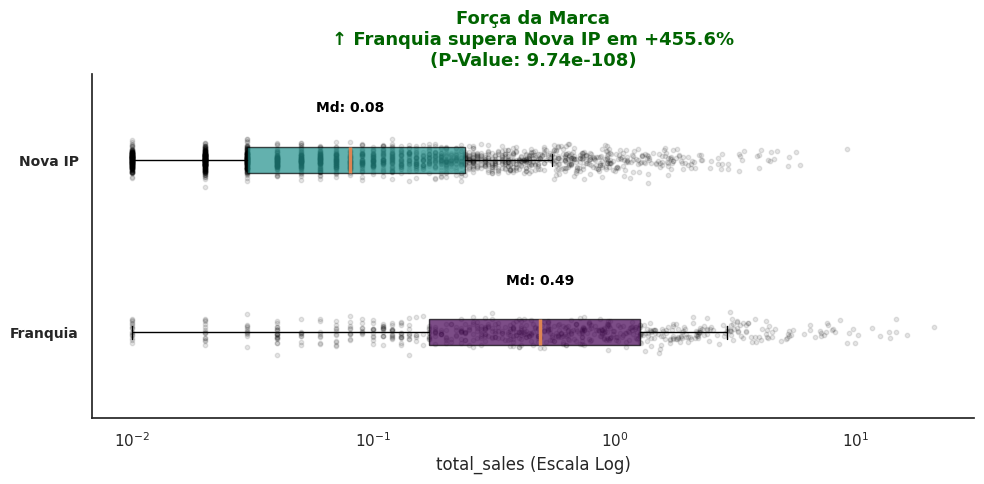

🧪 TESTE: Impacto da Qualidade nas Vendas (Jogos "Hit" (85+) vs. Jogos "Bom" (70-84)) em 'total_sales'
--------------------------------------------------------------------------------
📊 Estatísticas:
   • Mediana Jogos "Hit" (85+): 1.15
   • Mediana Jogos "Bom" (70-84): 0.48
   • Diferença: +135.7%

📉 Resultado:
   • P-Value: 3.29158e-05
   ❌ DECISÃO: Rejeitamos H0 (Diferença Significativa).




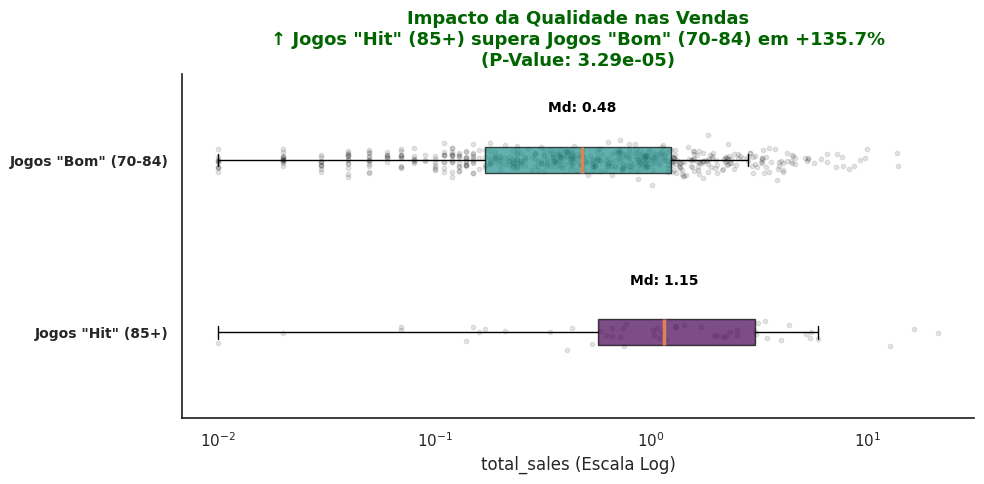

🧪 TESTE: Satisfação do Usuário por Plataforma (Xbox One vs. PC) em 'user_score'
--------------------------------------------------------------------------------
📊 Estatísticas:
   • Mediana Xbox One: 6.80
   • Mediana PC: 6.80
   • Diferença: +0.0%

📉 Resultado:
   • P-Value: 9.25624e-01
   ✅ DECISÃO: Falhamos em rejeitar H0 (São Iguais).




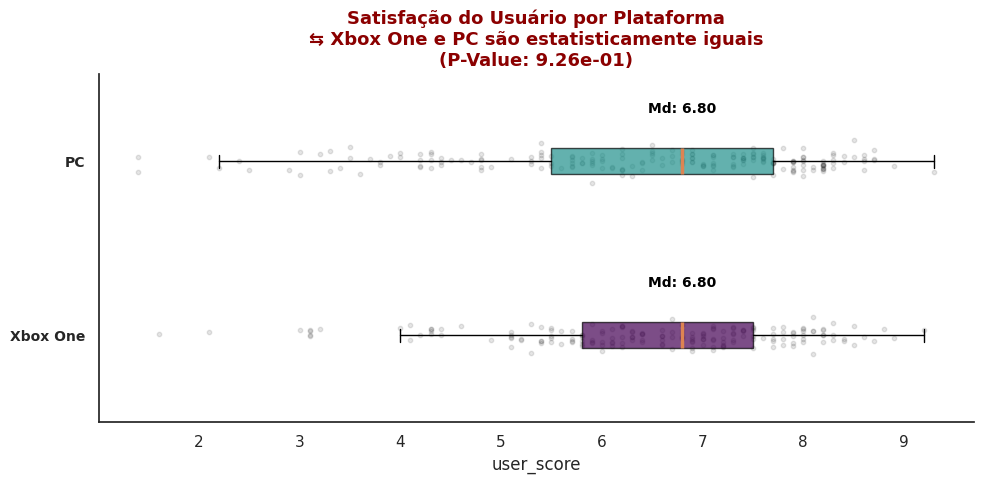

🧪 TESTE: Exigência do Público por Gênero (Ação vs. Esportes) em 'user_score'
--------------------------------------------------------------------------------
📊 Estatísticas:
   • Mediana Ação: 7.10
   • Mediana Esportes: 5.75
   • Diferença: +23.4%

📉 Resultado:
   • P-Value: 1.67507e-23
   ❌ DECISÃO: Rejeitamos H0 (Diferença Significativa).




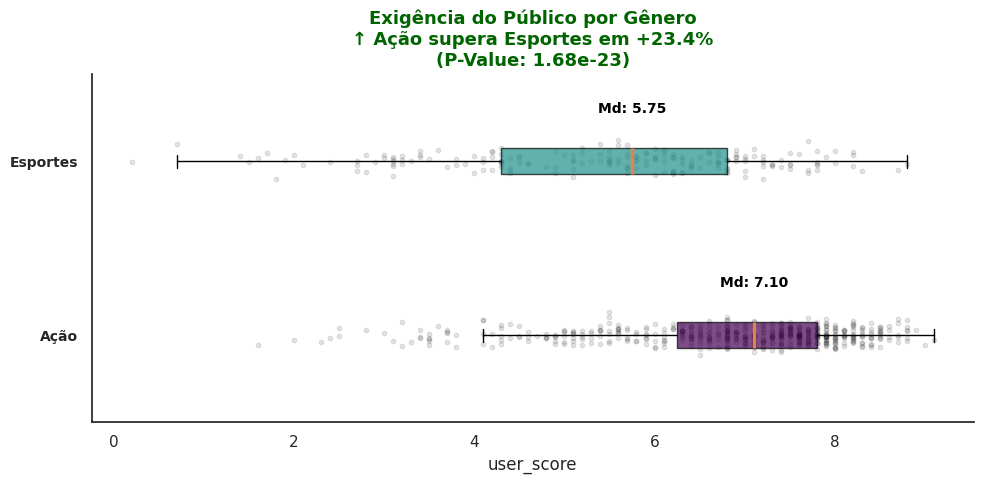

🧪 TESTE: Impacto da Exclusividade nas Vendas (Exclusivo vs. Multiplataforma) em 'total_sales'
--------------------------------------------------------------------------------
📊 Estatísticas:
   • Mediana Exclusivo: 0.07
   • Mediana Multiplataforma: 0.24
   • Diferença: -68.0%

📉 Resultado:
   • P-Value: 3.47331e-68
   ❌ DECISÃO: Rejeitamos H0 (Diferença Significativa).




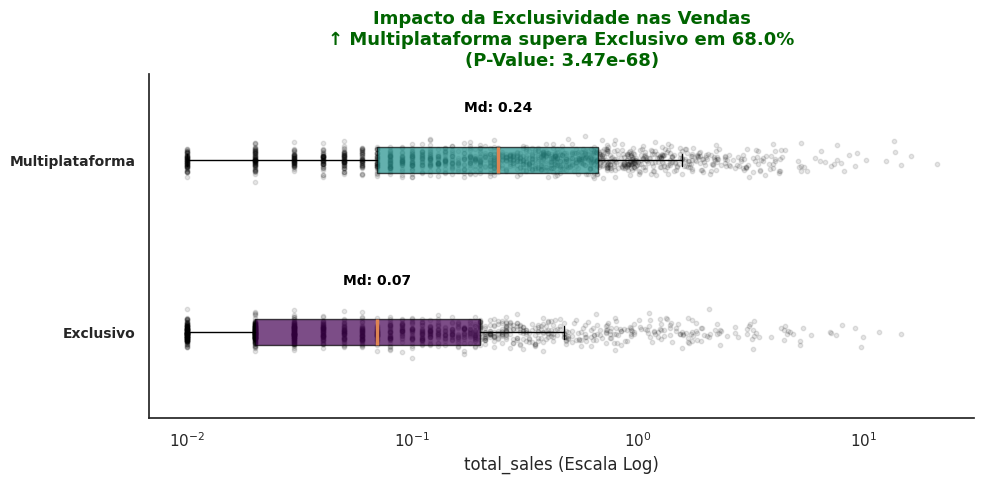

In [95]:
print("Iniciando Bateria de Testes de Hipóteses...\n")

print("Nível de Significância (alpha) = 5%")
# ---------------------------------------------------------
# 1. FRANQUIAS: A força da marca (is_long_running)
# ---------------------------------------------------------
testar_hipotese(
    df=df_relevante,
    col_grupo='is_long_running',
    valor_analisado='total_sales',
    grupo_a=1,
    grupo_b=0,
    label_a='Franquia',           # ← Label descritivo
    label_b='Nova IP',            # ← Label descritivo
    titulo_teste='Força da Marca' # ← Título do teste
)

# ---------------------------------------------------------
# 2. QUALIDADE: O Salto de Qualidade (critic_group)
# ---------------------------------------------------------
testar_hipotese(
    df=df_relevante,
    col_grupo='critic_group',
    valor_analisado='total_sales',
    grupo_a='Hit',
    grupo_b='Bom',
    label_a='Jogos "Hit" (85+)',
    label_b='Jogos "Bom" (70-84)',
    titulo_teste='Impacto da Qualidade nas Vendas'
)

# ---------------------------------------------------------
# 3. PLATAFORMAS: Comportamento do Usuário (platform)
# ---------------------------------------------------------
testar_hipotese(
    df=df_relevante,
    col_grupo='platform',
    valor_analisado='user_score',
    grupo_a='XOne',
    grupo_b='PC',
    label_a='Xbox One',
    label_b='PC',
    titulo_teste='Satisfação do Usuário por Plataforma'
)

# ---------------------------------------------------------
# 4. GÊNEROS: Exigência do Público (genre)
# ---------------------------------------------------------
testar_hipotese(
    df=df_relevante,
    col_grupo='genre',
    valor_analisado='user_score',
    grupo_a='Action',
    grupo_b='Sports',
    label_a='Ação',
    label_b='Esportes',
    titulo_teste='Exigência do Público por Gênero'
)

# ---------------------------------------------------------
# 5. EXCLUSIVIDADE (Consolidação)
# ---------------------------------------------------------
testar_hipotese(
    df=df_relevante,
    col_grupo='is_exclusive',
    valor_analisado='total_sales',
    grupo_a=1,
    grupo_b=0,
    label_a='Exclusivo',
    label_b='Multiplataforma',
    titulo_teste='Impacto da Exclusividade nas Vendas'
)

---

# 7. <a id='toc7_'></a>[✅ **Conclusão Geral e Recomendações**](#toc0_)

A análise histórica e estratégica do mercado de videojogos (2012-2016) revela uma indústria em **transição consolidada**. O ciclo da 7.ª Geração (PS3/Xbox 360) encerrou-se, e o domínio da 8.ª Geração (PS4/Xbox One) dita as novas regras de rentabilidade.

Para a campanha de 2017, a estratégia da loja **Ice** deve abandonar a nostalgia e focar na eficiência comercial baseada em dados.

### 🎯 Resumo Executivo Estratégico

1.  **A Guerra dos Consoles:** O **PlayStation 4 (Sony)** é a líder indiscutível de volume e consistência de vendas no Ocidente. A aposta no **Xbox One** é segura, mas secundária. O mercado da **Nintendo** tornou-se um nicho de portáteis (3DS) e exclusivos, exigindo uma estratégia de *stock* diferenciada.
2.  **O Fator Risco (Gêneros):** O gênero **Shooter** provou ser a aposta mais segura do mercado ("Oceano Azul" de rentabilidade), com a mediana de vendas mais alta e menor risco de fracasso. Em contrapartida, o gênero **Adventure** apresenta o maior risco de inventário parado (muitos lançamentos, poucas vendas).
3.  **A Ilusão da Exclusividade:** Os dados provaram que jogos **Multiplataforma** têm um teto de vendas e uma mediana superiores aos exclusivos. Exclusivos servem para vender hardware, mas para a loja Ice (que vende software), os *blockbusters* multiplataforma (FIFA, CoD, GTA) são os geradores de caixa.
4.  **Qualidade é Dinheiro:** A correlação entre **Nota da Crítica** e Vendas é forte e significativa (r ~ 0.50). Jogos com nota > 85 ("Hits") vendem exponencialmente mais. A nota do usuário não tem correlação com vendas e deve ser ignorada na decisão de compra de *stock*.

> **Veredito para 2017:** O sucesso não virá da aposta em "exclusivos de nicho", mas sim da consolidação de estoque nos grandes blockbusters multiplataforma de **Tiro** e **Ação**, somados à receita recorrente dos jogos de **Esportes** (FIFA/Madden), sustentados pelo **PS4**.

---

### 🚀 Plano de Ação: Campanha "Ice" 2017

Com base na análise, recomendo a seguinte alocação de orçamento para o próximo ano fiscal:

| Pilar | Ação Recomendada | Justificativa dos Dados |
| :--- | :--- | :--- |
| **🎮 Hardware (Foco)** | **70% PS4 / 20% XOne / 10% 3DS** | O PS4 foi o #1 em quase todos os anos recentes. O 3DS é necessário apenas para capturar o mercado Japonês/Infantil. |
| **🔫 Gêneros (Aposta)** | **Prioridade: Shooter & Sports** | Possuem as maiores medianas de venda (retorno garantido) e menor variância negativa. |
| **🚫 Gêneros (Evitar)** | **Reduzir: Adventure & Strategy** | Apresentam cauda longa de vendas muito baixa. Comprar apenas se for franquia consolidada. |
| **🌍 Regionalização** | **Estoque Diferenciado para JP** | Não enviar *Shooters* para o Japão. Priorizar **Role-Playing (RPG)** para essa demografia. |
| **⭐ Critério de Compra** | **Filtro: Metacritic > 75** | Evitar estocar jogos com média de crítica inferior a 75, exceto franquias anuais consolidadas. |
| **💎 Exclusivos** | **Compra Conservadora** | Exclusivos têm volume menor. Comprar apenas os "System Sellers" (Uncharted, Halo, Mario). Focar o volume em Multiplataforma. |

---

### 🔮 Próximos Passos: Modelagem Preditiva

Com a Análise Exploratória (EDA) concluída e as variáveis-chave identificadas (Feature Engineering), o projeto está pronto para avançar para a fase de Machine Learning.

#### Definição do Alvo e Features

O próximo passo lógico seria treinar um modelo de Regressão (ex: *Random Forest* ou *XGBoost*) para prever o valor exato de **`total_sales`** de um futuro lançamento.

  * **Variável Alvo ($y$):** `total_sales` (Recomenda-se aplicar transformação logarítmica `np.log1p` para normalizar a distribuição de cauda longa).
  * **Features Selecionadas ($X$):**
      * `platform` (ou `console_maker` + `generation`)
      * `genre`
      * `critic_score` (Fator com maior correlação linear)
      * `platform_age` (Ciclo de vida do console)
      * `is_long_running` (Força da marca/franquia)
      * `rating` (Público-alvo ESRB)

#### Expectativa do Modelo

Baseado nas correlações de Spearman (0.5+), espera-se que um modelo treinado consiga prever com boa acurácia o "Tier" de vendas de um jogo (ex: se será um Fracasso, Médio ou Hit), entregando à loja Ice uma ferramenta automatizada para prever o volume de compras de estoque para lançamentos futuros.

---

### 🏁 Fim do Projeto

💼 **LinkedIn:** [Acesse meu perfil](https://www.linkedin.com/in/SUA_URL_AQUI/)  
🐙 **GitHub:** [Veja meu portfólio](https://github.com/SUA_URL_AQUI)